# COUNTRY BASED COVID-19 CASES: BENFORD'S LAW ANALYSIS of FIRST DIGIT, FIRST TWO DIGITS, AND SECOND DIGIT


# Abstract


Benford's Law (also known as Newcomb - Benford's Law) is a numerical data analysis of the frequency distribution of leading digits in many datasets. Benford's law predicts the distribution of first digits, second digits, third digits, combinations of digits, etc. Benford's law is applied, among other applications, for the identification of manipulated data, the detection of fraud and the identification of false data. This study attempts to analyze country based COVID-19 data and to find out the level of compliance of data with the Benford's Law. European Centre for Disease Prevention and Control data on the geographic distribution of COVID-19 cases worldwide is used as a dynamic data source. 


# 1) Libraries

## 1.1) Import the Benford module

In [1]:
#!pip install benford_py --user
import benford as bf

## 1.2) Import some libraries

In [2]:
import numpy as np
import pandas as pd
import sys
import math
import matplotlib.pyplot as plt
from time import process_time
from collections import defaultdict

#Installation via pip
#!pip install folium
#or, installation via conda
#!conda install folium -c conda-forge

In [3]:
# Here we change the display option of pandas. 
pd.options.display.max_rows = 200
pd.options.display.max_columns = None

# 2) Read the data


In [4]:
covid_data_all = pd.read_csv("https://opendata.ecdc.europa.eu/covid19/casedistribution/csv", dayfirst=True, parse_dates=True)


In [5]:
covid_data_all

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2019,continentExp,Cumulative_number_for_14_days_of_COVID-19_cases_per_100000
0,10/08/2020,10,8,2020,0,0,Afghanistan,AF,AFG,38041757.0,Asia,2.079294
1,09/08/2020,9,8,2020,39,5,Afghanistan,AF,AFG,38041757.0,Asia,2.357935
2,08/08/2020,8,8,2020,78,9,Afghanistan,AF,AFG,38041757.0,Asia,2.573488
3,07/08/2020,7,8,2020,41,0,Afghanistan,AF,AFG,38041757.0,Asia,2.652349
4,06/08/2020,6,8,2020,67,4,Afghanistan,AF,AFG,38041757.0,Asia,2.578745
...,...,...,...,...,...,...,...,...,...,...,...,...
35353,25/03/2020,25,3,2020,0,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN
35354,24/03/2020,24,3,2020,0,1,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN
35355,23/03/2020,23,3,2020,0,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN
35356,22/03/2020,22,3,2020,1,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN


# 3) Rename the columns

In [6]:
covid_data_all.rename(columns={'dateRep':'date','countriesAndTerritories':'country', 'countryterritoryCode':'country_code', 'popData2019':'population_2019', 'continentExp':'continent', 'Cumulative_number_for_14_days_of_COVID-19_cases_per_100000':'cum_case_perht'}, inplace=True)

In [7]:
covid_data_all.columns.sort_values()

Index(['cases', 'continent', 'country', 'country_code', 'cum_case_perht',
       'date', 'day', 'deaths', 'geoId', 'month', 'population_2019', 'year'],
      dtype='object')

In [8]:
covid_data_all.head()

,date,day,month,year,cases,deaths,country,geoId,country_code,population_2019,continent,cum_case_perht
0,10/08/2020,10,8,2020,0,0,Afghanistan,AF,AFG,38041757.0,Asia,2.079294
1,09/08/2020,9,8,2020,39,5,Afghanistan,AF,AFG,38041757.0,Asia,2.357935
2,08/08/2020,8,8,2020,78,9,Afghanistan,AF,AFG,38041757.0,Asia,2.573488
3,07/08/2020,7,8,2020,41,0,Afghanistan,AF,AFG,38041757.0,Asia,2.652349
4,06/08/2020,6,8,2020,67,4,Afghanistan,AF,AFG,38041757.0,Asia,2.578745


In [9]:
covid_data_all.tail()

,date,day,month,year,cases,deaths,country,geoId,country_code,population_2019,continent,cum_case_perht
35353,25/03/2020,25,3,2020,0,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN
35354,24/03/2020,24,3,2020,0,1,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN
35355,23/03/2020,23,3,2020,0,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN
35356,22/03/2020,22,3,2020,1,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN
35357,21/03/2020,21,3,2020,1,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,NaN


In [10]:
covid_data_all.describe()

,day,month,year,cases,deaths,population_2019,cum_case_perht
count,35358.000000,35358.000000,35358.000000,35358.000000,35358.000000,3.529400e+04,32577.000000
mean,15.616890,4.943747,2019.998105,561.281407,20.681684,4.433337e+07,26.705588
std,8.954528,1.890616,0.043490,3512.706527,123.414059,1.614760e+08,65.367035
min,1.000000,1.000000,2019.000000,-2461.000000,-1918.000000,8.150000e+02,-1.262589
25%,8.000000,4.000000,2020.000000,0.000000,0.000000,1.641164e+06,0.215059
50%,16.000000,5.000000,2020.000000,6.000000,0.000000,8.519373e+06,3.337732
75%,23.000000,6.000000,2020.000000,111.000000,2.000000,3.036604e+07,19.466679
max,31.000000,12.000000,2020.000000,78427.000000,4928.000000,1.433784e+09,885.924117


# 4) Explore the data

In [11]:
covid_data_all.shape

(35358, 12)

In [12]:
covid_data_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35358 entries, 0 to 35357
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date             35358 non-null  object 
 1   day              35358 non-null  int64  
 2   month            35358 non-null  int64  
 3   year             35358 non-null  int64  
 4   cases            35358 non-null  int64  
 5   deaths           35358 non-null  int64  
 6   country          35358 non-null  object 
 7   geoId            35209 non-null  object 
 8   country_code     35294 non-null  object 
 9   population_2019  35294 non-null  float64
 10  continent        35358 non-null  object 
 11  cum_case_perht   32577 non-null  float64
dtypes: float64(2), int64(5), object(5)
memory usage: 3.2+ MB


# 5) Filter the data

In [13]:
covid_cases=covid_data_all[covid_data_all.cases >=10].copy() # At least case data should be double digit


In [14]:
#Replacing the country name
covid_cases.replace(r'_', ' ', regex=True, inplace = True)

In [15]:
covid_cases

,date,day,month,year,cases,deaths,country,geoId,country_code,population_2019,continent,cum_case_perht
1,09/08/2020,9,8,2020,39,5,Afghanistan,AF,AFG,38041757.0,Asia,2.357935
2,08/08/2020,8,8,2020,78,9,Afghanistan,AF,AFG,38041757.0,Asia,2.573488
3,07/08/2020,7,8,2020,41,0,Afghanistan,AF,AFG,38041757.0,Asia,2.652349
4,06/08/2020,6,8,2020,67,4,Afghanistan,AF,AFG,38041757.0,Asia,2.578745
5,05/08/2020,5,8,2020,82,6,Afghanistan,AF,AFG,38041757.0,Asia,2.896817
...,...,...,...,...,...,...,...,...,...,...,...,...
35284,02/06/2020,2,6,2020,25,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,1.072004
35286,31/05/2020,31,5,2020,14,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,0.887646
35287,30/05/2020,30,5,2020,11,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,0.805710
35288,29/05/2020,29,5,2020,17,0,Zimbabwe,ZW,ZWE,14645473.0,Africa,0.764741


In [16]:
covid_cases_country_count=covid_cases.groupby(['country'], as_index=False)['cases'].agg(['sum','count'])

In [17]:
covid_cases_country_count

,sum,count
country,,
Afghanistan,37010,129
Albania,6229,122
Algeria,35186,147
Andorra,797,33
Angola,1390,37
Antigua and Barbuda,39,1
Argentina,241767,136
Armenia,40378,145
Aruba,453,6


In [18]:
# At least minimum expected value should be 5 for any digit
covid_cases_country_count=covid_cases_country_count[covid_cases_country_count['count']>=109].copy() 

In [19]:
covid_cases_country_count

,sum,count
country,,
Afghanistan,37010,129
Albania,6229,122
Algeria,35186,147
Argentina,241767,136
Armenia,40378,145
Australia,20906,137
Austria,21975,156
Azerbaijan,33512,140
Bahrain,43945,146


In [20]:
covid_cases_country_list=covid_cases_country_count.index.values.tolist()
covid_cases_country_list


['Afghanistan',
 'Albania',
 'Algeria',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahrain',
 'Bangladesh',
 'Belarus',
 'Belgium',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Brazil',
 'Bulgaria',
 'Canada',
 'Chile',
 'China',
 'Colombia',
 'Costa Rica',
 'Cote dIvoire',
 'Czechia',
 'Democratic Republic of the Congo',
 'Denmark',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Finland',
 'France',
 'Germany',
 'Greece',
 'Guatemala',
 'Guinea',
 'Honduras',
 'Hungary',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy',
 'Japan',
 'Kazakhstan',
 'Kenya',
 'Kuwait',
 'Kyrgyzstan',
 'Malaysia',
 'Mexico',
 'Moldova',
 'Morocco',
 'Netherlands',
 'Nigeria',
 'North Macedonia',
 'Norway',
 'Oman',
 'Pakistan',
 'Panama',
 'Peru',
 'Philippines',
 'Poland',
 'Portugal',
 'Puerto Rico',
 'Qatar',
 'Romania',
 'Russia',
 'Saudi Arabia',
 'Senegal',
 'Serbia',
 'Singapore',
 'South Africa',
 'South Korea',
 'Spain',
 'Sweden',
 'S

# 6) Benford's Law First Digit Chi-Square Test Function

In [21]:
def benford_first_digit(country):
    
    covid_cases_test=covid_cases[covid_cases['country']==country].copy()
        
    data=list(covid_cases_test.cases)

    for i in range(len(data)):

        while data[i]>=10:

            data[i]=data[i]/10

    first_digits=[int(x) for x in sorted(data)]

    unique=(set(first_digits))

    data_count=[]

    digits = [1, 2, 3, 4, 5, 6, 7, 8, 9]
              
    for i in digits:

        count=first_digits.count(i)
        
        data_count.append(count)
           
    total_count=sum(data_count)

    data_percentage=[(i/total_count)*100 for i in data_count]
        
    benford = [30.103, 17.6091, 12.4939, 9.691, 7.91812, 6.69468, 5.79919, 5.11525, 4.57575]
    
    expected = [(i * total_count / 100) for i in benford]
    
    chi_square_index = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    
    chi_square = [((data_count[i]-expected[i])**2)/expected[i] for i in chi_square_index]
    
    chi_square_sum = sum(chi_square)
                
    return  chi_square_sum

# 7) Benford's Law First Digit Chi-Square Test Results

In [22]:
benford_covid_cases_results = []
for i in covid_cases_country_list:
    if benford_first_digit(i)>=145:
        conformity = "(g) Severe Non-Conformity"
    elif benford_first_digit(i)>=117:
        conformity = "(f) Very High Non-Conformity"
    elif benford_first_digit(i)>=89:
        conformity = "(e) High Non-Conformity"    
    elif benford_first_digit(i)>=61:
        conformity = "(d) Moderate Non-Conformity" 
    elif benford_first_digit(i)>=33:
        conformity = "(c) Low Non-Conformity"
    elif benford_first_digit(i)>=15.507:
        conformity = "(b) Minor Non-Conformity" 
    else:
        conformity = "(a) Conformity"    
    benford_covid_cases_results.append((i, benford_first_digit(i),"15.507", conformity))                                    
benford_covid_cases_results=pd.DataFrame(benford_covid_cases_results, columns=('country', 'sum_of_chi_square', 'critical_chi_square', 'conformity'))
benford_covid_cases_results

,country,sum_of_chi_square,critical_chi_square,conformity
0,Afghanistan,19.902845,15.507,(b) Minor Non-Conformity
1,Albania,25.067658,15.507,(b) Minor Non-Conformity
2,Algeria,61.380070,15.507,(d) Moderate Non-Conformity
3,Argentina,8.512441,15.507,(a) Conformity
4,Armenia,49.230340,15.507,(c) Low Non-Conformity
5,Australia,16.082156,15.507,(b) Minor Non-Conformity
6,Austria,18.606230,15.507,(b) Minor Non-Conformity
7,Azerbaijan,67.420592,15.507,(d) Moderate Non-Conformity
8,Bahrain,54.010908,15.507,(c) Low Non-Conformity
9,Bangladesh,58.907094,15.507,(c) Low Non-Conformity


In [23]:
# Here we add covid-19 case sum data.
benford_covid_cases_results=pd.merge(benford_covid_cases_results, covid_cases_country_count[['sum', 'count']], on='country', how='left')

In [24]:
# Here we change column names.
benford_covid_cases_results.rename(columns={'sum':'sum_of_covid_19_cases','count':'count_of_covid_19_reporting_dates'}, inplace=True)

In [25]:
# Sorting data by country name
benford_covid_cases_results

,country,sum_of_chi_square,critical_chi_square,conformity,sum_of_covid_19_cases,count_of_covid_19_reporting_dates
0,Afghanistan,19.902845,15.507,(b) Minor Non-Conformity,37010,129
1,Albania,25.067658,15.507,(b) Minor Non-Conformity,6229,122
2,Algeria,61.380070,15.507,(d) Moderate Non-Conformity,35186,147
3,Argentina,8.512441,15.507,(a) Conformity,241767,136
4,Armenia,49.230340,15.507,(c) Low Non-Conformity,40378,145
5,Australia,16.082156,15.507,(b) Minor Non-Conformity,20906,137
6,Austria,18.606230,15.507,(b) Minor Non-Conformity,21975,156
7,Azerbaijan,67.420592,15.507,(d) Moderate Non-Conformity,33512,140
8,Bahrain,54.010908,15.507,(c) Low Non-Conformity,43945,146
9,Bangladesh,58.907094,15.507,(c) Low Non-Conformity,257530,127


In [26]:
# Sorting data by total covid-19 cases
benford_covid_cases_results.sort_values(by='sum_of_covid_19_cases', ascending=False, ignore_index=True)

,country,sum_of_chi_square,critical_chi_square,conformity,sum_of_covid_19_cases,count_of_covid_19_reporting_dates
0,United States of America,61.035322,15.507,(d) Moderate Non-Conformity,5044832,164
1,Brazil,24.667307,15.507,(b) Minor Non-Conformity,3035400,153
2,India,8.261315,15.507,(a) Conformity,2215036,150
3,Russia,150.435283,15.507,(g) Severe Non-Conformity,887517,148
4,South Africa,13.387132,15.507,(a) Conformity,559834,148
5,Mexico,32.692010,15.507,(b) Minor Non-Conformity,480262,150
6,Peru,74.797579,15.507,(d) Moderate Non-Conformity,477997,146
7,Colombia,8.328947,15.507,(a) Conformity,387457,147
8,Chile,48.560955,15.507,(c) Low Non-Conformity,373033,151
9,Iran,173.351366,15.507,(g) Severe Non-Conformity,326707,170


In [27]:
# Sorting data by sum of chi-squares
benford_covid_cases_results.sort_values(by='sum_of_chi_square', ascending=False, ignore_index=True)

,country,sum_of_chi_square,critical_chi_square,conformity,sum_of_covid_19_cases,count_of_covid_19_reporting_dates
0,Iran,173.351366,15.507,(g) Severe Non-Conformity,326707,170
1,Turkey,159.728594,15.507,(g) Severe Non-Conformity,240802,148
2,Russia,150.435283,15.507,(g) Severe Non-Conformity,887517,148
3,Belarus,124.257526,15.507,(f) Very High Non-Conformity,68796,135
4,Poland,121.943957,15.507,(f) Very High Non-Conformity,51760,151
5,Senegal,79.990792,15.507,(d) Moderate Non-Conformity,11080,132
6,Kuwait,75.927140,15.507,(d) Moderate Non-Conformity,71643,145
7,Peru,74.797579,15.507,(d) Moderate Non-Conformity,477997,146
8,Azerbaijan,67.420592,15.507,(d) Moderate Non-Conformity,33512,140
9,Algeria,61.380070,15.507,(d) Moderate Non-Conformity,35186,147


In [28]:
# Sorting data by conformity and total covid-19 cases
benford_covid_cases_results.sort_values(['conformity','sum_of_covid_19_cases'], ascending=[True, False], ignore_index=True)

,country,sum_of_chi_square,critical_chi_square,conformity,sum_of_covid_19_cases,count_of_covid_19_reporting_dates
0,India,8.261315,15.507,(a) Conformity,2215036,150
1,South Africa,13.387132,15.507,(a) Conformity,559834,148
2,Colombia,8.328947,15.507,(a) Conformity,387457,147
3,Pakistan,7.857217,15.507,(a) Conformity,284639,141
4,Argentina,8.512441,15.507,(a) Conformity,241767,136
5,France,12.921888,15.507,(a) Conformity,198670,148
6,Qatar,13.653547,15.507,(a) Conformity,112905,147
7,China,9.600255,15.507,(a) Conformity,88623,170
8,Israel,14.037809,15.507,(a) Conformity,82958,149
9,Dominican Republic,5.836090,15.507,(a) Conformity,79721,142


# 8) Country Based Benford's First Digit Analysis of COVID-19 Cases Dataset: Sum of Chi-Squares

In [29]:
import folium
#Creating a base map
m = folium.Map()

In [30]:
#Setting up the world countries data URL
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
country_shapes = f'{url}/world-countries.json'

In [31]:
#Adding the Choropleth layer onto our base map
folium.Choropleth(
    geo_data=country_shapes,
    name="COUNTRY BASED BENFORDS FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET",
    data=benford_covid_cases_results,
    columns=['country', 'sum_of_chi_square'],
    key_on='feature.properties.name',
    fill_color='PuRd',
    nan_fill_color='white'
).add_to(m)
m

# 9) Country Based COVID-19 Cases: Benford's Law Analysis of First Digits, First Two Digits, and Second Digits

 #################  COUNTRY:  Afghanistan  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 129 registries.
First_1_Dig
1    0.232558
2    0.170543
3    0.139535
4    0.069767
5    0.139535
6    0.100775
7    0.100775
8    0.038760
9    0.007752
Name: Found, dtype: float64

Test performed on 129 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found  Z_score
First_1_Dig                             
5            0.079181  0.139535   2.3756
Mean Absolute Deviation: 0.033680
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 19.9028.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0866.
Critical K-S for this series: 0.1197


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


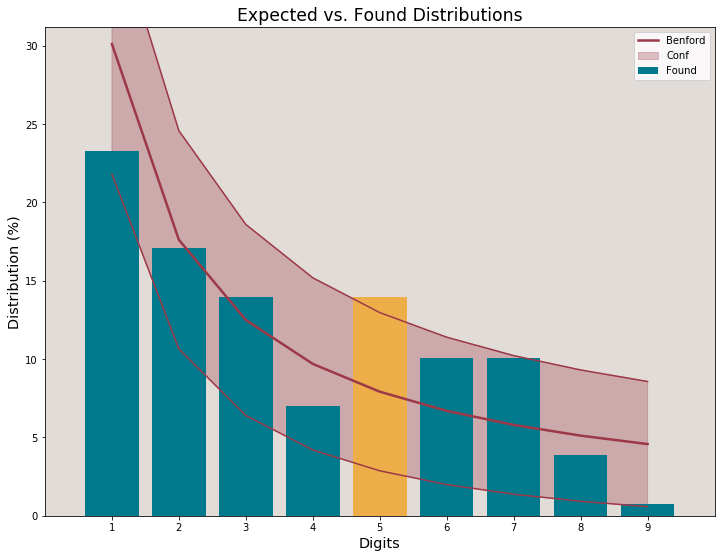



 #################  COUNTRY:  Afghanistan  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 129 registries.
First_2_Dig
10    0.062016
11    0.023256
12    0.031008
13    0.015504
14    0.007752
15    0.007752
16    0.038760
17    0.023256
18    0.015504
19    0.007752
20    0.000000
21    0.023256
22    0.007752
23    0.015504
24    0.000000
25    0.038760
26    0.015504
27    0.038760
28    0.023256
29    0.007752
30    0.015504
31    0.015504
32    0.000000
33    0.023256
34    0.023256
35    0.023256
36    0.007752
37    0.015504
38    0.007752
39    0.007752
40    0.015504
41    0.007752
42    0.000000
43    0.015504
44    0.000000
45    0.007752
46    0.007752
47    0.000000
48    0.000000
49    0.015504
50    0.000000
51    0.007752
52    0.007752
53    0.007752
54    0.031008
55    0.007752
56    0.015504
57    0.007752
58    0.038760
59    0.015504
60    0.000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


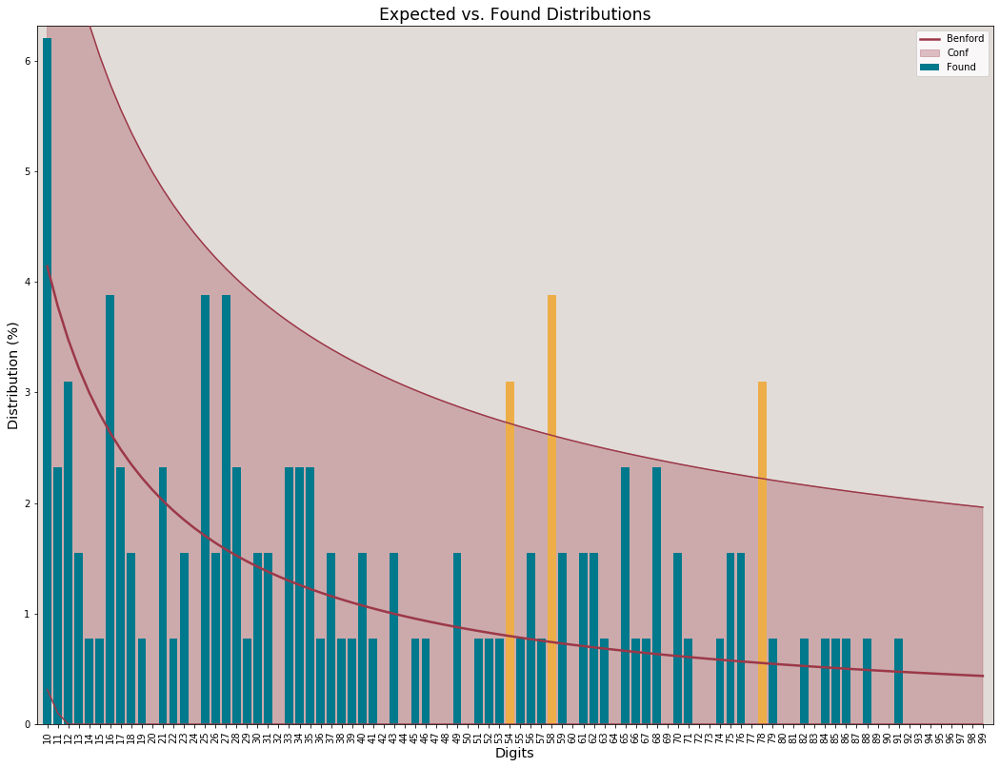



 #################  COUNTRY:  Afghanistan  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 129 registries.
Sec_Dig
0    0.108527
1    0.108527
2    0.069767
3    0.085271
4    0.077519
5    0.131783
6    0.116279
7    0.093023
8    0.147287
9    0.062016
Name: Found, dtype: float64

Test performed on 129 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
8         0.08757  0.147287  2.243721
Mean Absolute Deviation: 0.024080
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 11.5259.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0974.
Critical K-S for this series: 0.1197


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


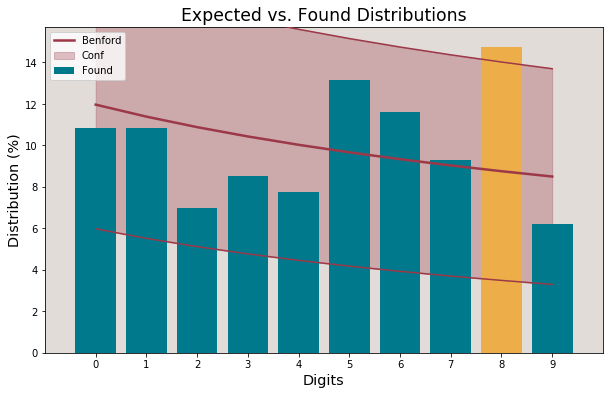

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Albania  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 122 registries.
First_1_Dig
1    0.450820
2    0.180328
3    0.032787
4    0.032787
5    0.049180
6    0.090164
7    0.057377
8    0.057377
9    0.049180
Name: Found, dtype: float64

Test performed on 122 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected    Found  Z_score
First_1_Dig                            
1             0.30103  0.45082  3.50816
Mean Absolute Deviation: 0.041531
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 25.0676.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1540.
Critical K-S for this series: 0.1231


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


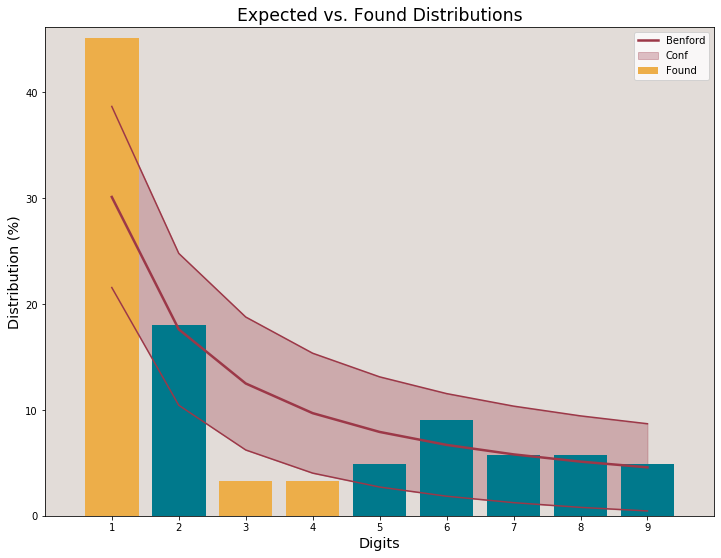



 #################  COUNTRY:  Albania  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 122 registries.
First_2_Dig
10    0.065574
11    0.065574
12    0.081967
13    0.065574
14    0.032787
15    0.040984
16    0.024590
17    0.040984
18    0.024590
19    0.008197
20    0.024590
21    0.032787
22    0.008197
23    0.032787
24    0.008197
25    0.024590
26    0.008197
27    0.008197
28    0.016393
29    0.016393
30    0.000000
31    0.008197
32    0.000000
33    0.000000
34    0.008197
35    0.000000
36    0.016393
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.008197
43    0.000000
44    0.008197
45    0.008197
46    0.000000
47    0.000000
48    0.008197
49    0.000000
50    0.016393
51    0.000000
52    0.008197
53    0.008197
54    0.000000
55    0.008197
56    0.000000
57    0.008197
58    0.000000
59    0.000000
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


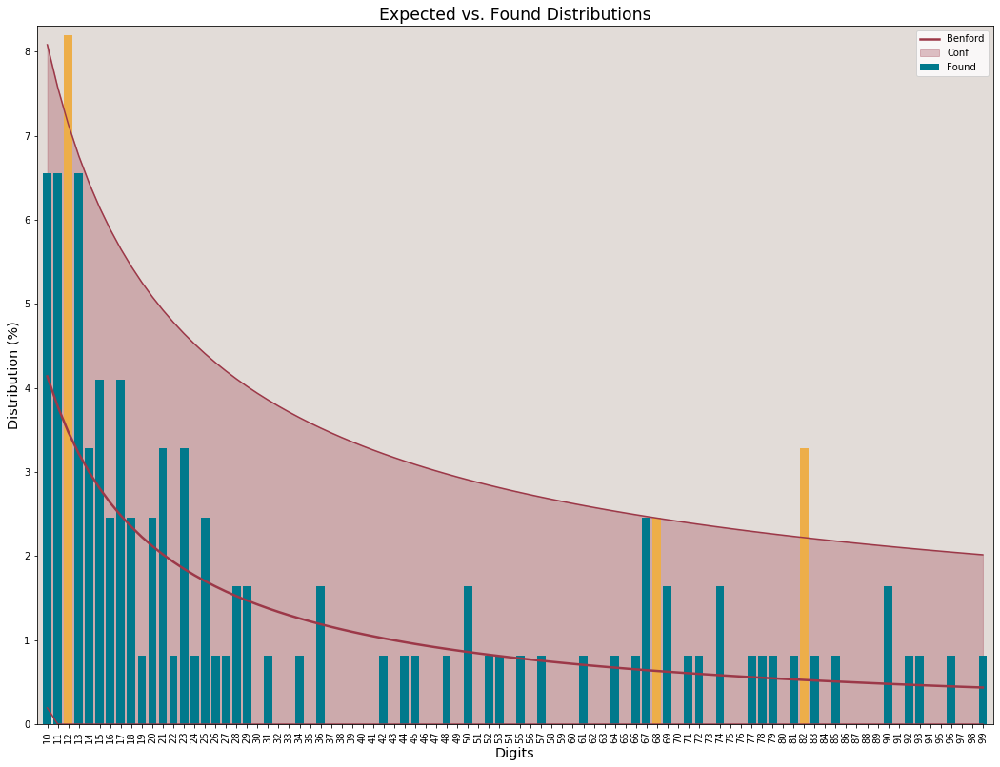



 #################  COUNTRY:  Albania  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 122 registries.
Sec_Dig
0    0.122951
1    0.131148
2    0.155738
3    0.122951
4    0.081967
5    0.090164
6    0.065574
7    0.090164
8    0.081967
9    0.057377
Name: Found, dtype: float64

Test performed on 122 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.017213
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 5.8144.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0861.
Critical K-S for this series: 0.1231


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


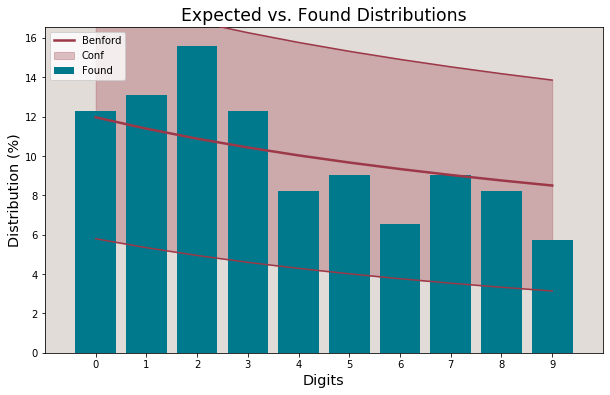

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Algeria  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_1_Dig
1    0.517007
2    0.034014
3    0.047619
4    0.095238
5    0.129252
6    0.095238
7    0.006803
8    0.027211
9    0.047619
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1            0.301030  0.517007  5.618723
5            0.079181  0.129252  2.095510
Mean Absolute Deviation: 0.065822
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 61.3801.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


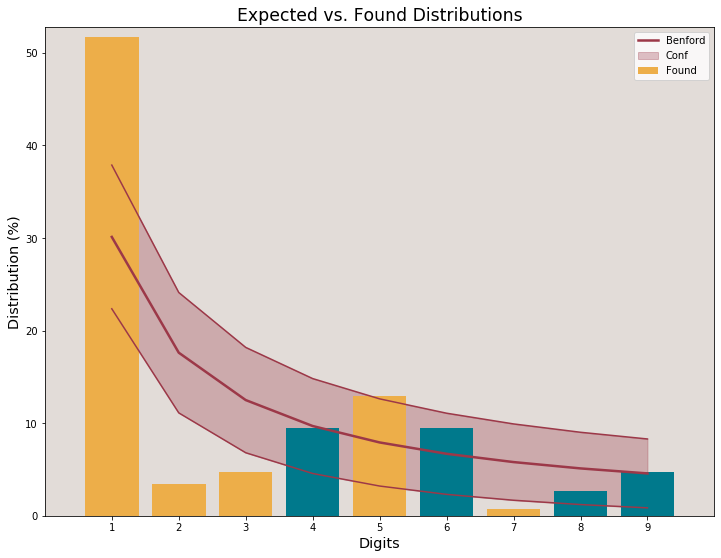



 #################  COUNTRY:  Algeria  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_2_Dig
10    0.068027
11    0.088435
12    0.054422
13    0.047619
14    0.034014
15    0.027211
16    0.027211
17    0.034014
18    0.068027
19    0.068027
20    0.006803
21    0.000000
22    0.000000
23    0.000000
24    0.006803
25    0.000000
26    0.000000
27    0.000000
28    0.006803
29    0.013605
30    0.006803
31    0.000000
32    0.000000
33    0.006803
34    0.006803
35    0.000000
36    0.006803
37    0.006803
38    0.013605
39    0.000000
40    0.000000
41    0.006803
42    0.006803
43    0.013605
44    0.006803
45    0.013605
46    0.020408
47    0.013605
48    0.006803
49    0.006803
50    0.006803
51    0.006803
52    0.020408
53    0.020408
54    0.000000
55    0.020408
56    0.006803
57    0.013605
58    0.013605
59    0.020408
60    0.027211


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


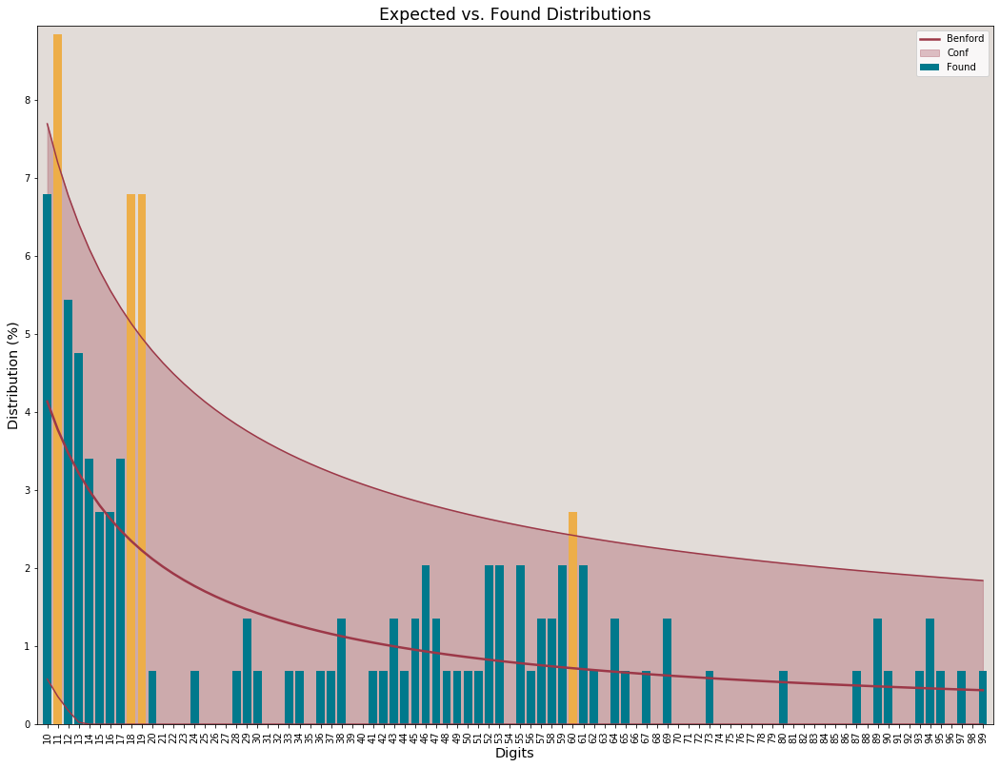



 #################  COUNTRY:  Algeria  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
Sec_Dig
0    0.129252
1    0.122449
2    0.088435
3    0.102041
4    0.081633
5    0.074830
6    0.061224
7    0.088435
8    0.108844
9    0.142857
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
9        0.084997  0.142857  2.367609
Mean Absolute Deviation: 0.019453
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.1955.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0791.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


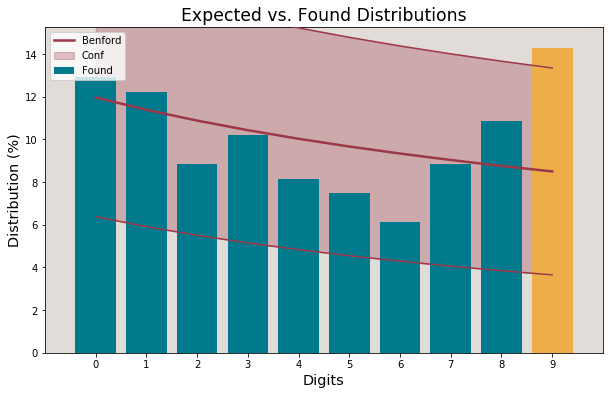

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Argentina  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 136 registries.
First_1_Dig
1    0.323529
2    0.110294
3    0.110294
4    0.088235
5    0.102941
6    0.073529
7    0.095588
8    0.044118
9    0.051471
Name: Found, dtype: float64

Test performed on 136 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021367
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 8.5124.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0666.
Critical K-S for this series: 0.1166


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


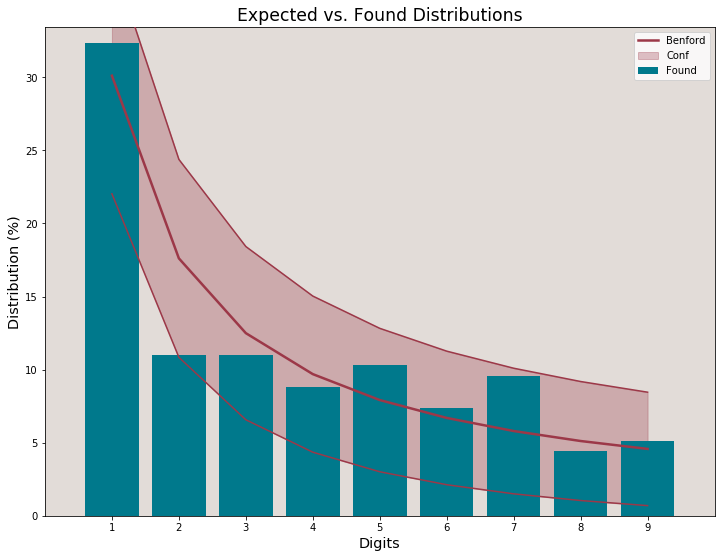



 #################  COUNTRY:  Argentina  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 136 registries.
First_2_Dig
10    0.044118
11    0.036765
12    0.044118
13    0.051471
14    0.044118
15    0.022059
16    0.044118
17    0.014706
18    0.022059
19    0.000000
20    0.000000
21    0.007353
22    0.014706
23    0.000000
24    0.022059
25    0.014706
26    0.029412
27    0.007353
28    0.007353
29    0.007353
30    0.014706
31    0.014706
32    0.014706
33    0.007353
34    0.022059
35    0.007353
36    0.029412
37    0.000000
38    0.000000
39    0.000000
40    0.014706
41    0.007353
42    0.014706
43    0.007353
44    0.000000
45    0.014706
46    0.000000
47    0.007353
48    0.014706
49    0.007353
50    0.000000
51    0.000000
52    0.022059
53    0.014706
54    0.007353
55    0.014706
56    0.022059
57    0.007353
58    0.000000
59    0.014706
60    0.00735

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


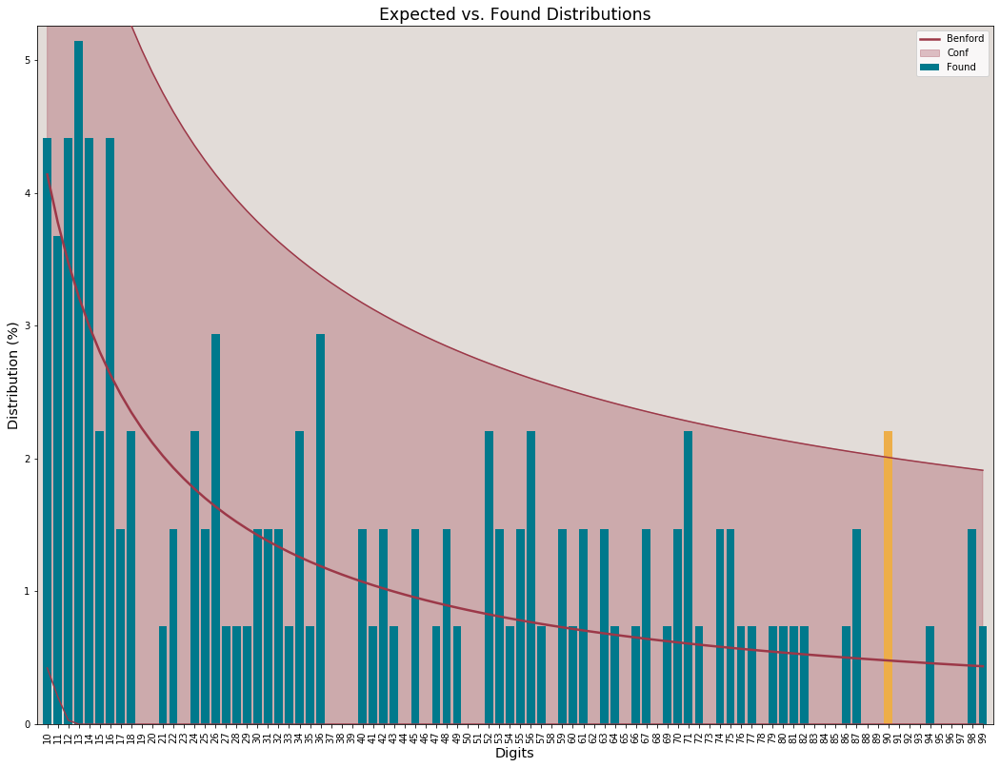



 #################  COUNTRY:  Argentina  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 136 registries.
Sec_Dig
0    0.125000
1    0.110294
2    0.125000
3    0.095588
4    0.125000
5    0.088235
6    0.147059
7    0.073529
8    0.058824
9    0.051471
Name: Found, dtype: float64

Test performed on 136 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
6        0.093375  0.147059  2.004366
Mean Absolute Deviation: 0.019975
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 9.1067.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0791.
Critical K-S for this series: 0.1166


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


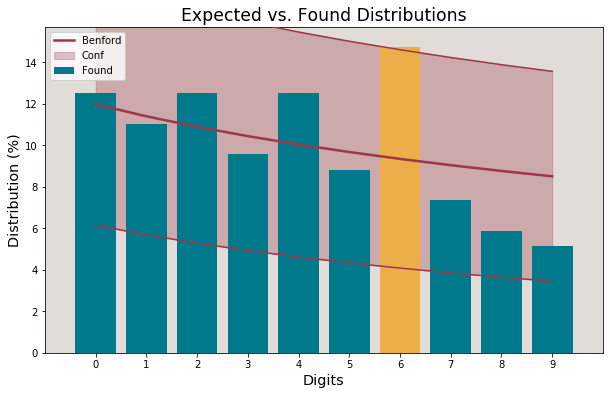

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Armenia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 145 registries.
First_1_Dig
1    0.151724
2    0.144828
3    0.179310
4    0.179310
5    0.165517
6    0.075862
7    0.082759
8    0.013793
9    0.006897
Name: Found, dtype: float64

Test performed on 145 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
5            0.079181  0.165517  3.696374
4            0.096910  0.179310  3.213643
Mean Absolute Deviation: 0.057064
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 49.2304.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


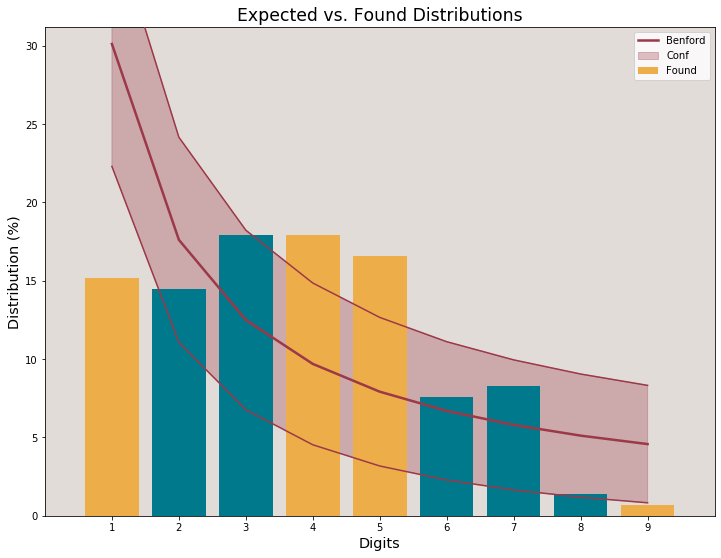



 #################  COUNTRY:  Armenia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 145 registries.
First_2_Dig
10    0.013793
11    0.020690
12    0.013793
13    0.013793
14    0.027586
15    0.000000
16    0.013793
17    0.006897
18    0.027586
19    0.013793
20    0.013793
21    0.013793
22    0.006897
23    0.027586
24    0.006897
25    0.020690
26    0.013793
27    0.006897
28    0.027586
29    0.006897
30    0.034483
31    0.000000
32    0.027586
33    0.027586
34    0.013793
35    0.034483
36    0.000000
37    0.013793
38    0.006897
39    0.020690
40    0.006897
41    0.027586
42    0.020690
43    0.020690
44    0.020690
45    0.020690
46    0.027586
47    0.006897
48    0.027586
49    0.000000
50    0.013793
51    0.020690
52    0.034483
53    0.006897
54    0.013793
55    0.020690
56    0.013793
57    0.006897
58    0.013793
59    0.020690
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


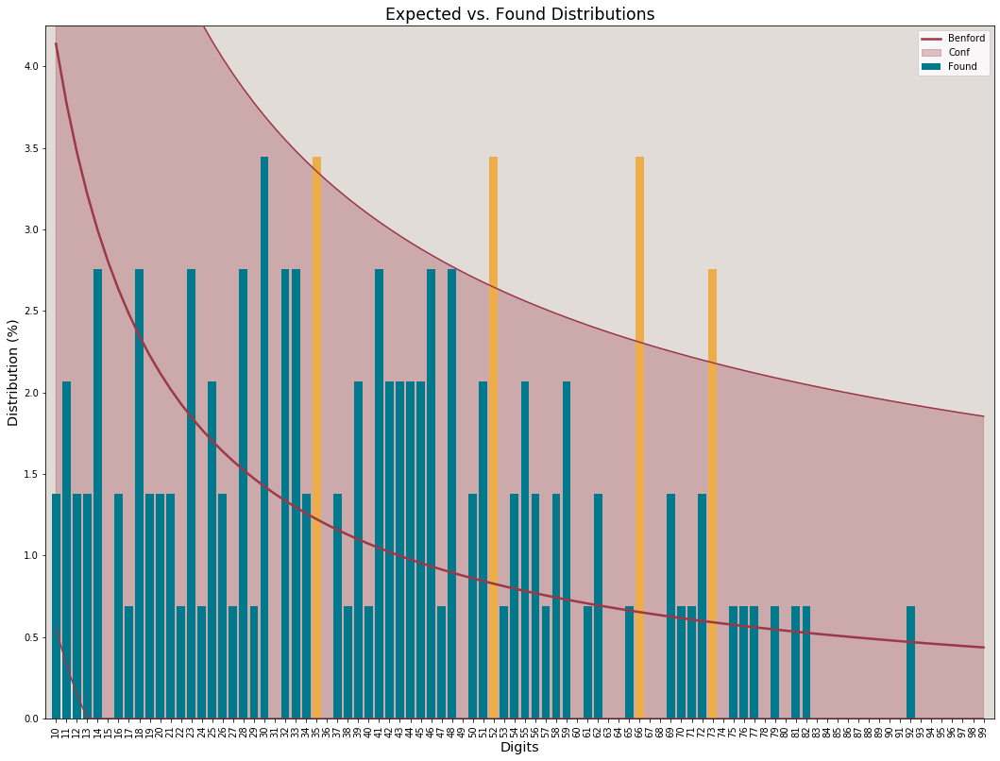



 #################  COUNTRY:  Armenia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 145 registries.
Sec_Dig
0    0.089655
1    0.103448
2    0.144828
3    0.124138
4    0.082759
5    0.110345
6    0.110345
7    0.048276
8    0.103448
9    0.082759
Name: Found, dtype: float64

Test performed on 145 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020466
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.9436.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0405.
Critical K-S for this series: 0.1129


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


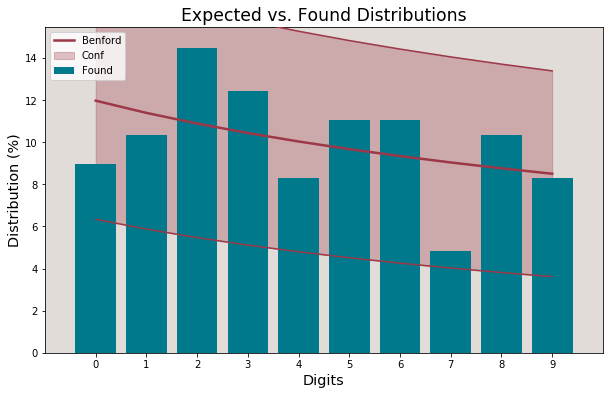

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Australia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_1_Dig
1    0.394161
2    0.197080
3    0.138686
4    0.116788
5    0.043796
6    0.036496
7    0.029197
8    0.036496
9    0.007299
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.394161  2.283267
Mean Absolute Deviation: 0.032832
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 16.0822.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1477.
Critical K-S for this series: 0.1

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


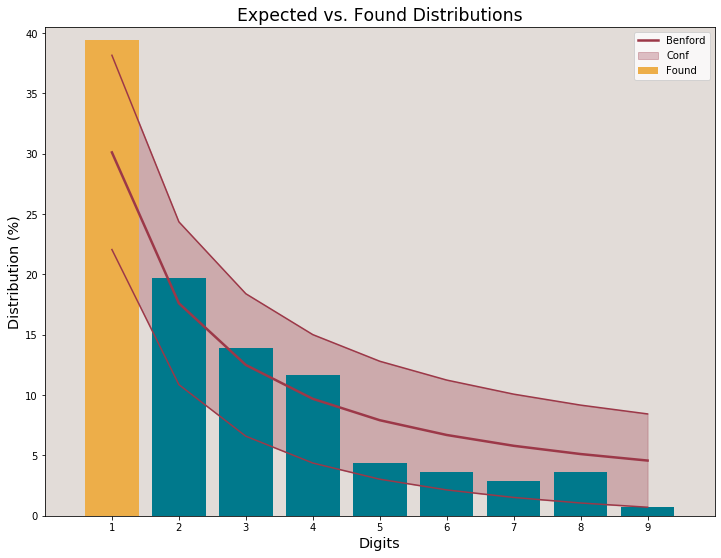



 #################  COUNTRY:  Australia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_2_Dig
10    0.036496
11    0.080292
12    0.043796
13    0.051095
14    0.029197
15    0.036496
16    0.043796
17    0.021898
18    0.043796
19    0.007299
20    0.021898
21    0.021898
22    0.014599
23    0.014599
24    0.036496
25    0.014599
26    0.029197
27    0.021898
28    0.014599
29    0.007299
30    0.021898
31    0.007299
32    0.007299
33    0.007299
34    0.000000
35    0.014599
36    0.029197
37    0.029197
38    0.007299
39    0.014599
40    0.000000
41    0.036496
42    0.021898
43    0.007299
44    0.007299
45    0.014599
46    0.021898
47    0.000000
48    0.000000
49    0.007299
50    0.007299
51    0.007299
52    0.007299
53    0.014599
54    0.000000
55    0.000000
56    0.000000
57    0.007299
58    0.000000
59    0.000000
60    0.01459

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


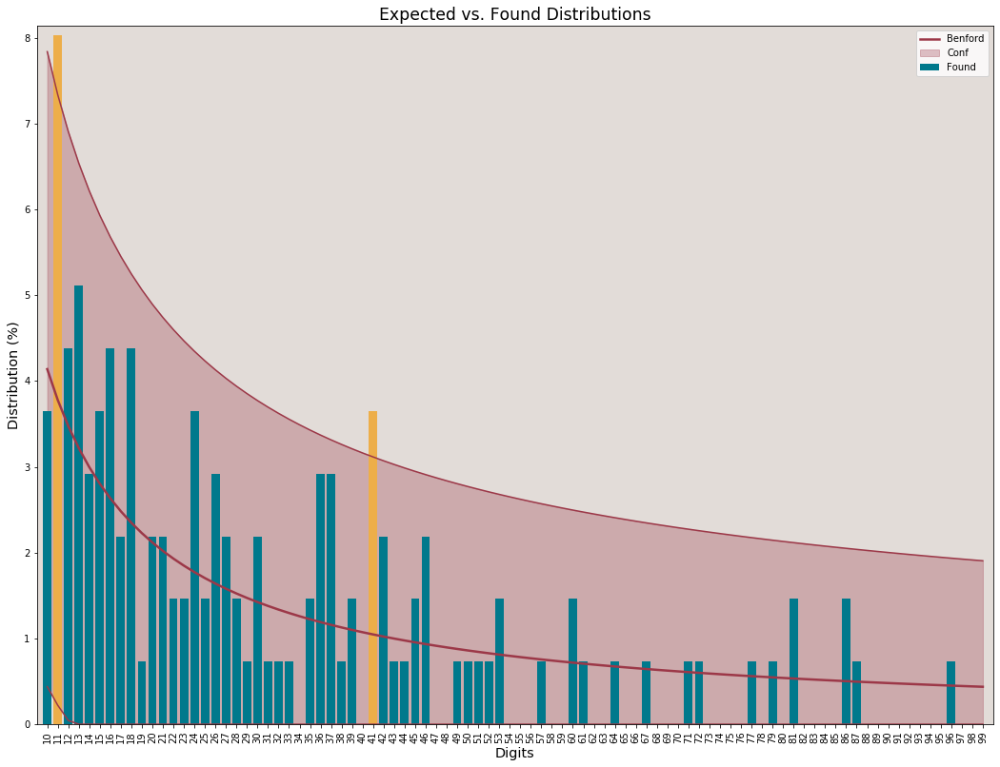



 #################  COUNTRY:  Australia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
Sec_Dig
0    0.102190
1    0.182482
2    0.102190
3    0.094891
4    0.080292
5    0.080292
6    0.145985
7    0.102190
8    0.065693
9    0.043796
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
1        0.113890  0.182482  2.392761
6        0.093375  0.145985  1.969619
Mean Absolute Deviation: 0.026608
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 14.8681.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0631.
Critical K-S for this series: 0.1162


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


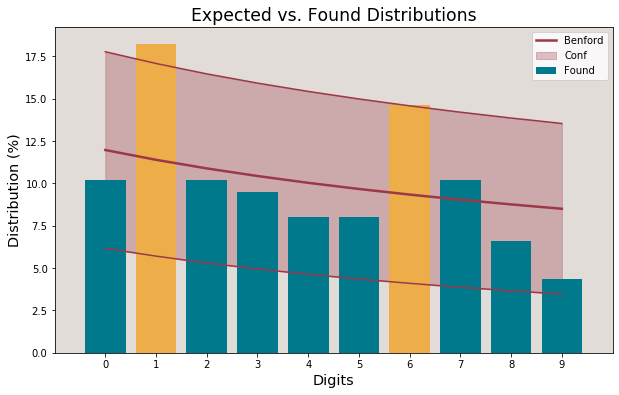

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Austria  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 156 registries.
First_1_Dig
1    0.301282
2    0.121795
3    0.166667
4    0.070513
5    0.108974
6    0.121795
7    0.051282
8    0.044872
9    0.012821
Name: Found, dtype: float64

Test performed on 156 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
6            0.066947  0.121795  2.580806
Mean Absolute Deviation: 0.028138
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 18.6063.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0540.
Critical K-S for this series: 0.108

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


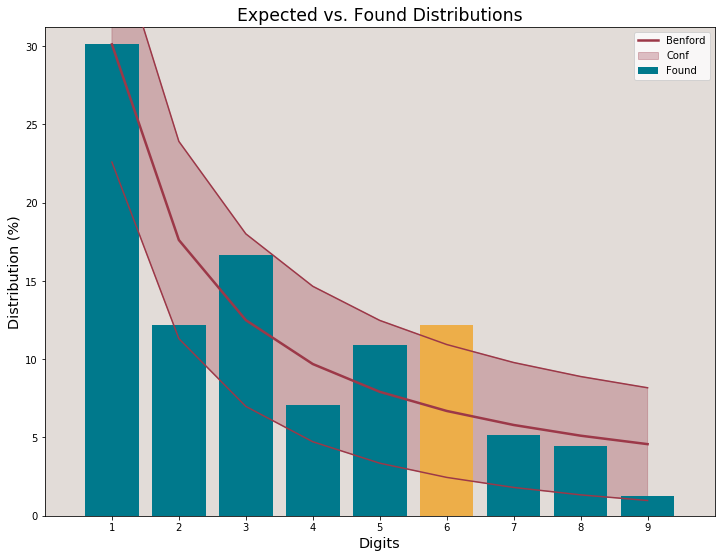



 #################  COUNTRY:  Austria  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 156 registries.
First_2_Dig
10    0.051282
11    0.038462
12    0.044872
13    0.064103
14    0.019231
15    0.025641
16    0.019231
17    0.012821
18    0.012821
19    0.012821
20    0.025641
21    0.019231
22    0.006410
23    0.000000
24    0.019231
25    0.012821
26    0.000000
27    0.012821
28    0.012821
29    0.012821
30    0.012821
31    0.044872
32    0.019231
33    0.019231
34    0.019231
35    0.006410
36    0.012821
37    0.012821
38    0.012821
39    0.006410
40    0.006410
41    0.019231
42    0.006410
43    0.000000
44    0.006410
45    0.006410
46    0.012821
47    0.006410
48    0.006410
49    0.000000
50    0.012821
51    0.012821
52    0.019231
53    0.000000
54    0.006410
55    0.019231
56    0.006410
57    0.012821
58    0.006410
59    0.012821
60    0.019231


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


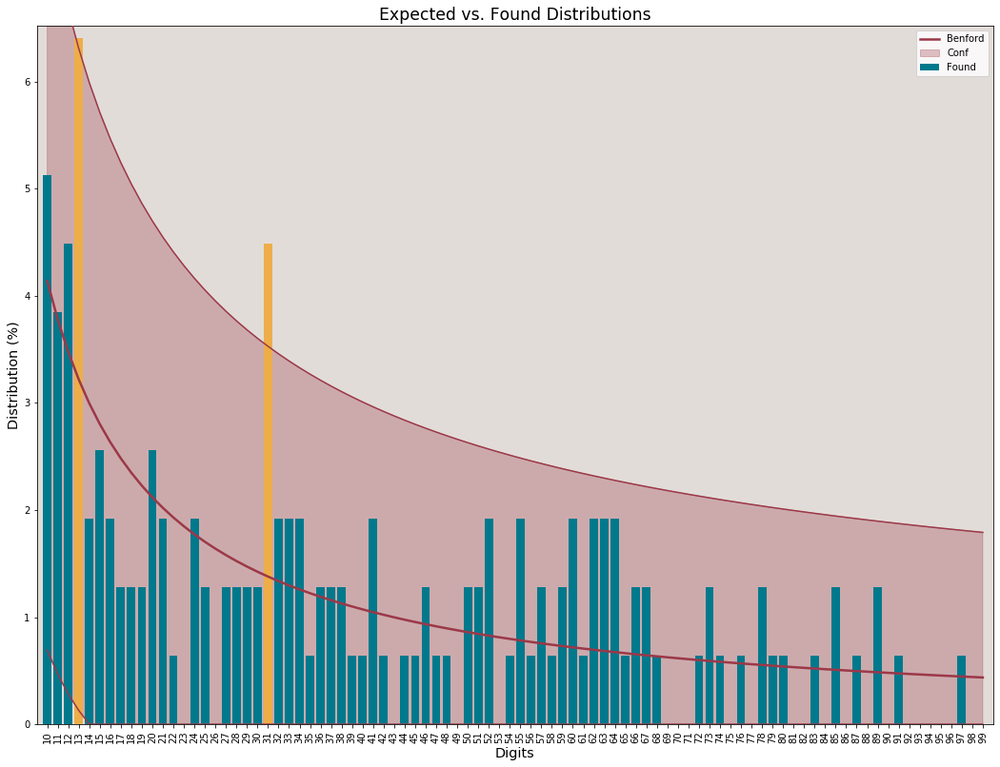



 #################  COUNTRY:  Austria  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 156 registries.
Sec_Dig
0    0.134615
1    0.147436
2    0.121795
3    0.121795
4    0.096154
5    0.089744
6    0.070513
7    0.083333
8    0.070513
9    0.064103
Name: Found, dtype: float64

Test performed on 156 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.015784
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.9119.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0789.
Critical K-S for this series: 0.1089


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


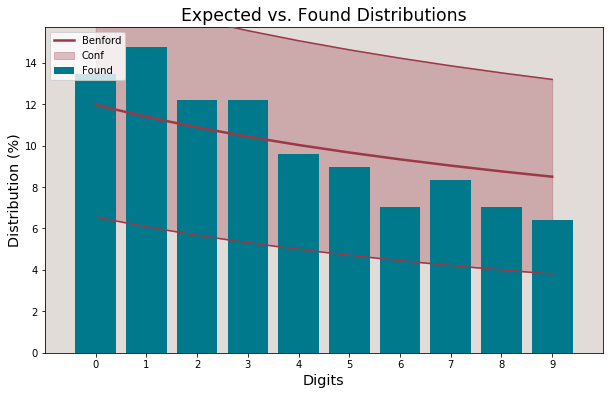

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Azerbaijan  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 140 registries.
First_1_Dig
1    0.192857
2    0.114286
3    0.250000
4    0.128571
5    0.207143
6    0.050000
7    0.042857
8    0.007143
9    0.007143
Name: Found, dtype: float64

Test performed on 140 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
5            0.079181  0.207143  5.450695
3            0.124939  0.250000  4.347466
Mean Absolute Deviation: 0.063263
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 67.4207.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic i

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


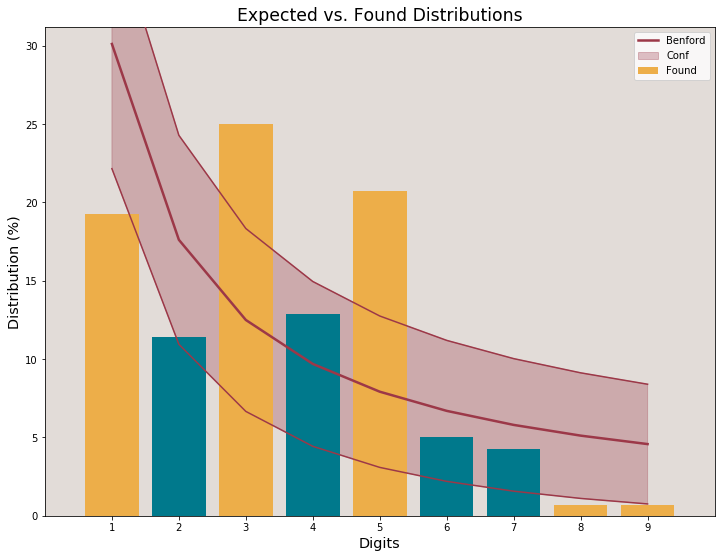



 #################  COUNTRY:  Azerbaijan  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 140 registries.
First_2_Dig
10    0.050000
11    0.014286
12    0.028571
13    0.021429
14    0.028571
15    0.014286
16    0.014286
17    0.007143
18    0.000000
19    0.014286
20    0.000000
21    0.000000
22    0.007143
23    0.014286
24    0.014286
25    0.028571
26    0.007143
27    0.021429
28    0.014286
29    0.007143
30    0.014286
31    0.021429
32    0.028571
33    0.064286
34    0.007143
35    0.021429
36    0.021429
37    0.007143
38    0.042857
39    0.021429
40    0.014286
41    0.021429
42    0.000000
43    0.021429
44    0.014286
45    0.000000
46    0.000000
47    0.021429
48    0.000000
49    0.035714
50    0.021429
51    0.014286
52    0.042857
53    0.028571
54    0.035714
55    0.014286
56    0.007143
57    0.021429
58    0.014286
59    0.007143
60    0.0000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


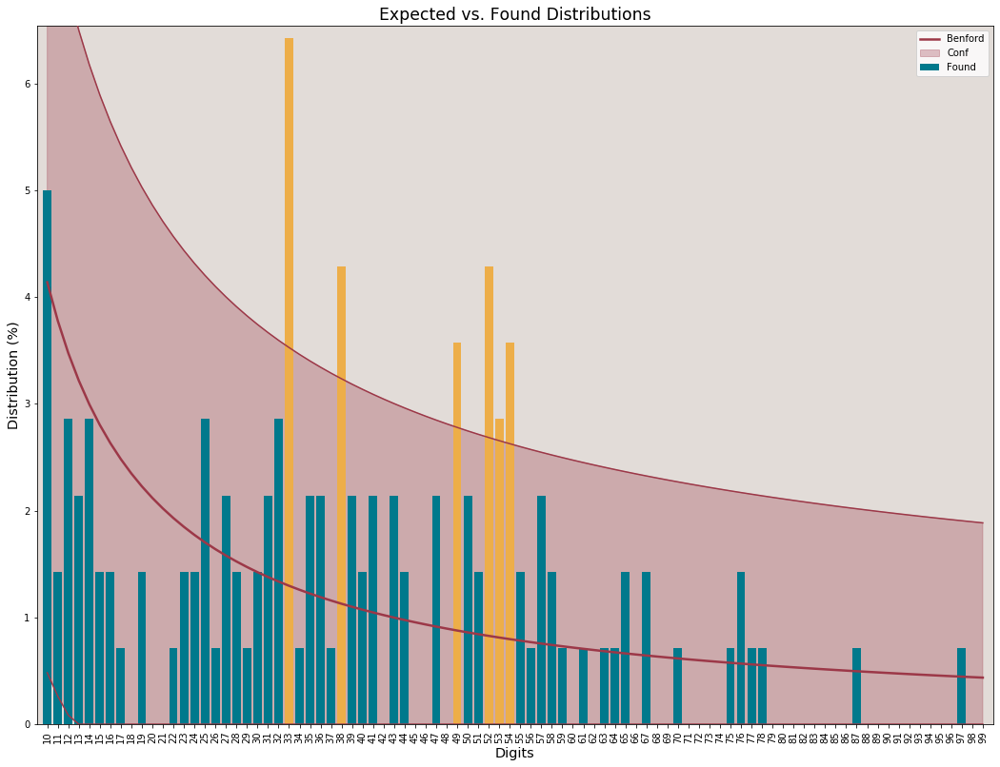



 #################  COUNTRY:  Azerbaijan  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 140 registries.
Sec_Dig
0    0.107143
1    0.078571
2    0.107143
3    0.157143
4    0.107143
5    0.100000
6    0.064286
7    0.114286
8    0.078571
9    0.085714
Name: Found, dtype: float64

Test performed on 140 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.017524
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.8315.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0495.
Critical K-S for this series: 0.1149


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


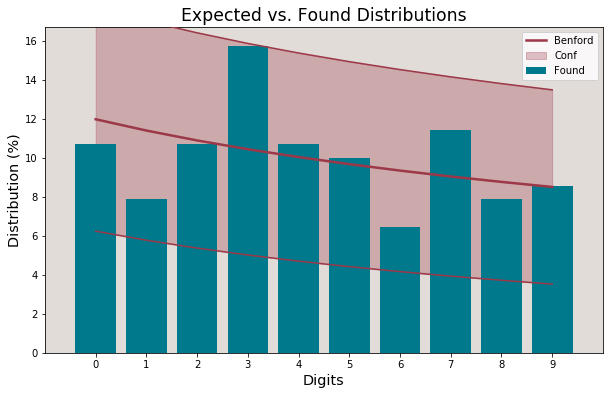

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Bahrain  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_1_Dig
1    0.157534
2    0.171233
3    0.198630
4    0.184932
5    0.171233
6    0.061644
7    0.034247
8    0.006849
9    0.013699
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
5            0.079181  0.171233  3.965921
4            0.096910  0.184932  3.455260
3            0.124939  0.198630  2.567784
Mean Absolute Deviation: 0.056392
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 54.0109.
Critical Chi-square for this series: 15.5

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


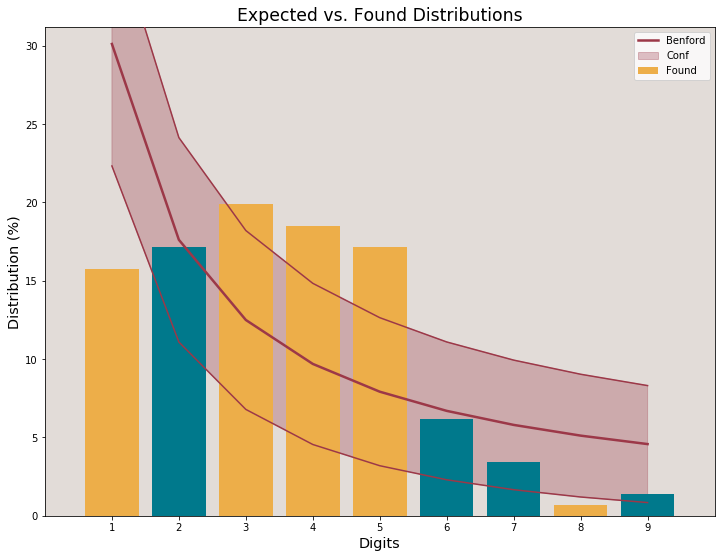



 #################  COUNTRY:  Bahrain  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_2_Dig
10    0.020548
11    0.027397
12    0.013699
13    0.013699
14    0.006849
15    0.013699
16    0.041096
17    0.000000
18    0.006849
19    0.013699
20    0.013699
21    0.027397
22    0.020548
23    0.000000
24    0.013699
25    0.000000
26    0.013699
27    0.013699
28    0.027397
29    0.041096
30    0.013699
31    0.006849
32    0.013699
33    0.020548
34    0.034247
35    0.020548
36    0.000000
37    0.006849
38    0.061644
39    0.020548
40    0.013699
41    0.027397
42    0.013699
43    0.027397
44    0.020548
45    0.013699
46    0.034247
47    0.006849
48    0.027397
49    0.000000
50    0.027397
51    0.047945
52    0.020548
53    0.027397
54    0.013699
55    0.006849
56    0.006849
57    0.006849
58    0.006849
59    0.006849
60    0.013699


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


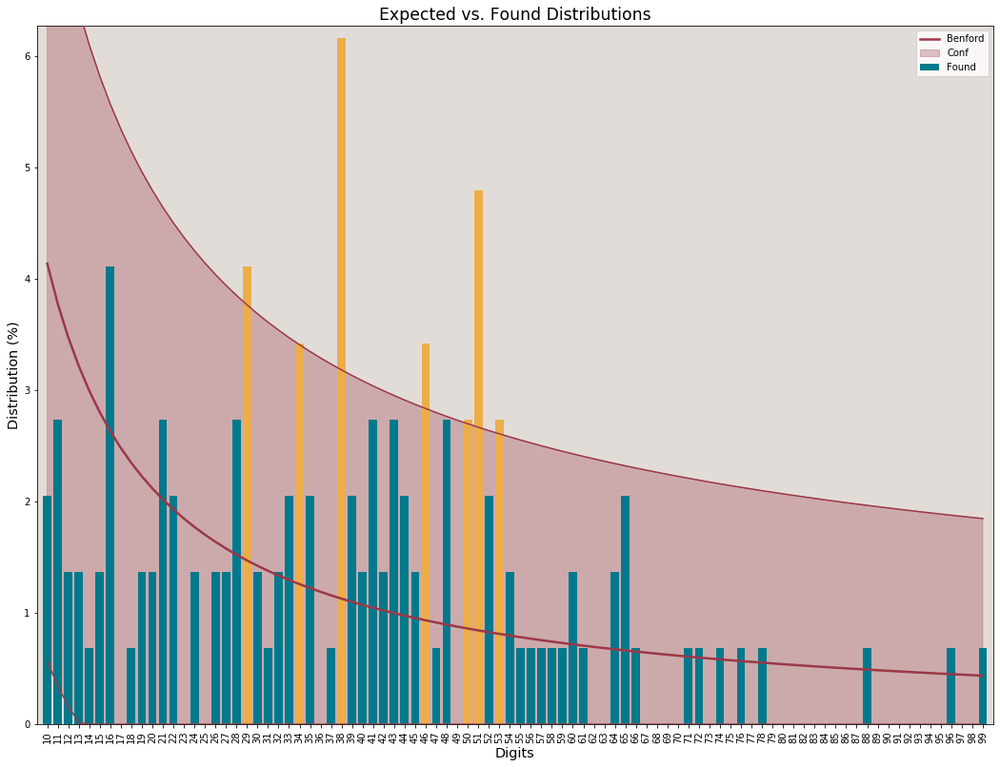



 #################  COUNTRY:  Bahrain  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
Sec_Dig
0    0.102740
1    0.150685
2    0.089041
3    0.089041
4    0.109589
5    0.075342
6    0.116438
7    0.034247
8    0.143836
9    0.089041
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
8         0.08757  0.143836  2.258755
Mean Absolute Deviation: 0.025890
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 14.9749.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0603.
Critical K-S for this series: 0.1126


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


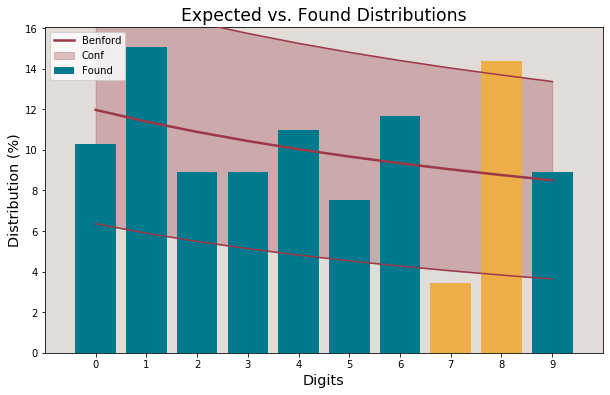

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Bangladesh  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 127 registries.
First_1_Dig
1    0.173228
2    0.299213
3    0.299213
4    0.070866
5    0.055118
6    0.031496
7    0.031496
8    0.015748
9    0.023622
Name: Found, dtype: float64

Test performed on 127 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.299213  5.805541
2            0.176091  0.299213  3.526246
Mean Absolute Deviation: 0.066088
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 58.9072.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic i

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


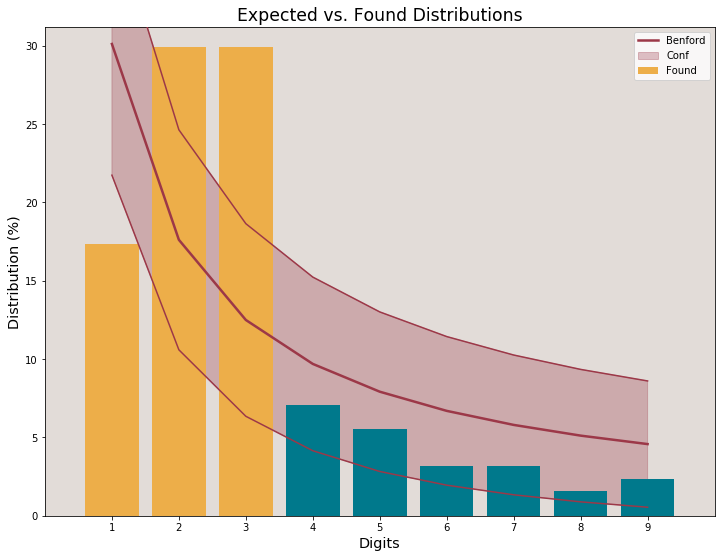



 #################  COUNTRY:  Bangladesh  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 127 registries.
First_2_Dig
10    0.015748
11    0.023622
12    0.023622
13    0.015748
14    0.000000
15    0.015748
16    0.023622
17    0.015748
18    0.023622
19    0.015748
20    0.015748
21    0.015748
22    0.007874
23    0.007874
24    0.023622
25    0.031496
26    0.062992
27    0.062992
28    0.031496
29    0.039370
30    0.062992
31    0.055118
32    0.031496
33    0.007874
34    0.047244
35    0.031496
36    0.007874
37    0.007874
38    0.031496
39    0.015748
40    0.023622
41    0.023622
42    0.000000
43    0.007874
44    0.000000
45    0.000000
46    0.000000
47    0.000000
48    0.000000
49    0.015748
50    0.007874
51    0.000000
52    0.000000
53    0.000000
54    0.015748
55    0.007874
56    0.007874
57    0.007874
58    0.007874
59    0.000000
60    0.0000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


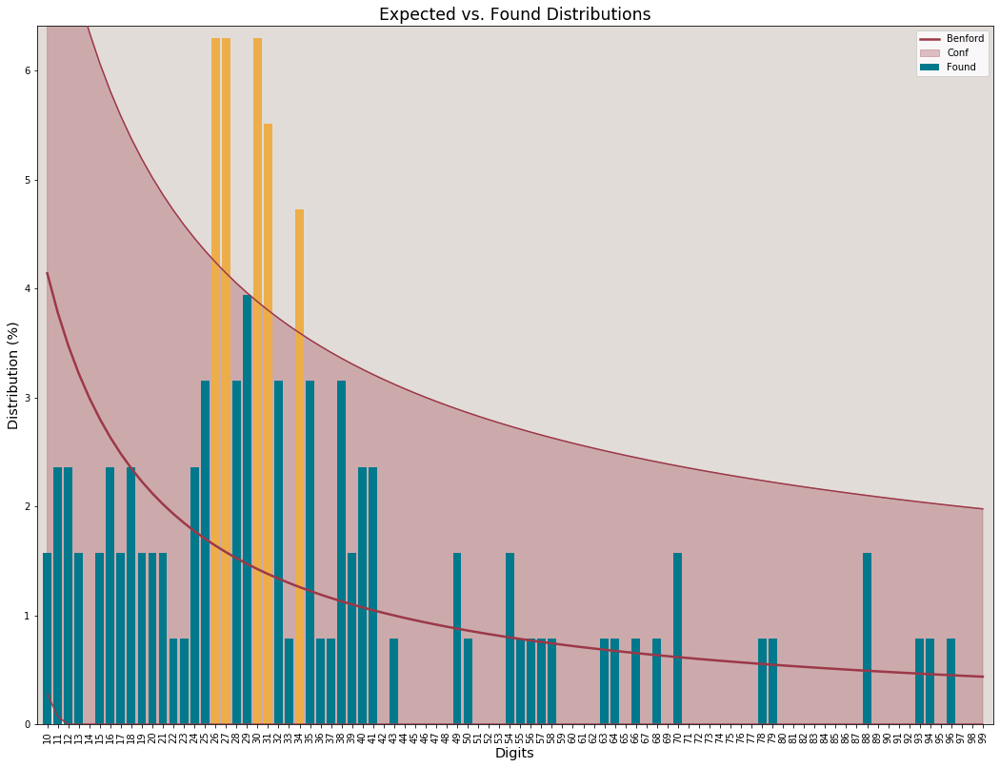



 #################  COUNTRY:  Bangladesh  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 127 registries.
Sec_Dig
0    0.141732
1    0.118110
2    0.062992
3    0.055118
4    0.102362
5    0.086614
6    0.118110
7    0.094488
8    0.125984
9    0.094488
Name: Found, dtype: float64

Test performed on 127 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021021
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 9.2044.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0768.
Critical K-S for this series: 0.1207


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


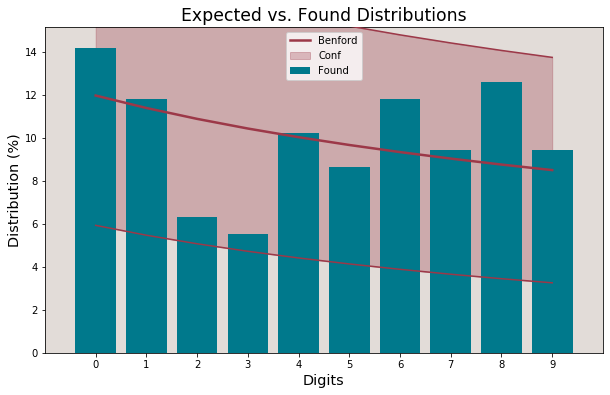

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Belarus  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
First_1_Dig
1    0.288889
2    0.059259
3    0.066667
4    0.081481
5    0.044444
6    0.037037
7    0.059259
8    0.155556
9    0.207407
Name: Found, dtype: float64

Test performed on 135 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
9            0.045757  0.207407  8.782449
8            0.051153  0.155556  5.310822
Mean Absolute Deviation: 0.059405
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 124.2575.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


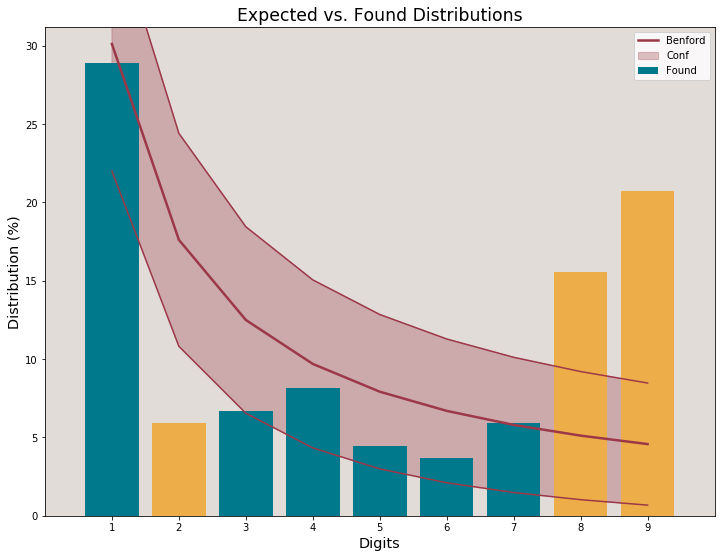



 #################  COUNTRY:  Belarus  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
First_2_Dig
10    0.014815
11    0.051852
12    0.029630
13    0.029630
14    0.022222
15    0.037037
16    0.029630
17    0.029630
18    0.022222
19    0.022222
20    0.007407
21    0.000000
22    0.007407
23    0.000000
24    0.007407
25    0.007407
26    0.000000
27    0.014815
28    0.007407
29    0.007407
30    0.007407
31    0.007407
32    0.007407
33    0.007407
34    0.007407
35    0.007407
36    0.007407
37    0.000000
38    0.014815
39    0.000000
40    0.000000
41    0.000000
42    0.007407
43    0.014815
44    0.007407
45    0.022222
46    0.007407
47    0.014815
48    0.000000
49    0.007407
50    0.000000
51    0.022222
52    0.000000
53    0.000000
54    0.000000
55    0.007407
56    0.007407
57    0.007407
58    0.000000
59    0.000000
60    0.007407


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


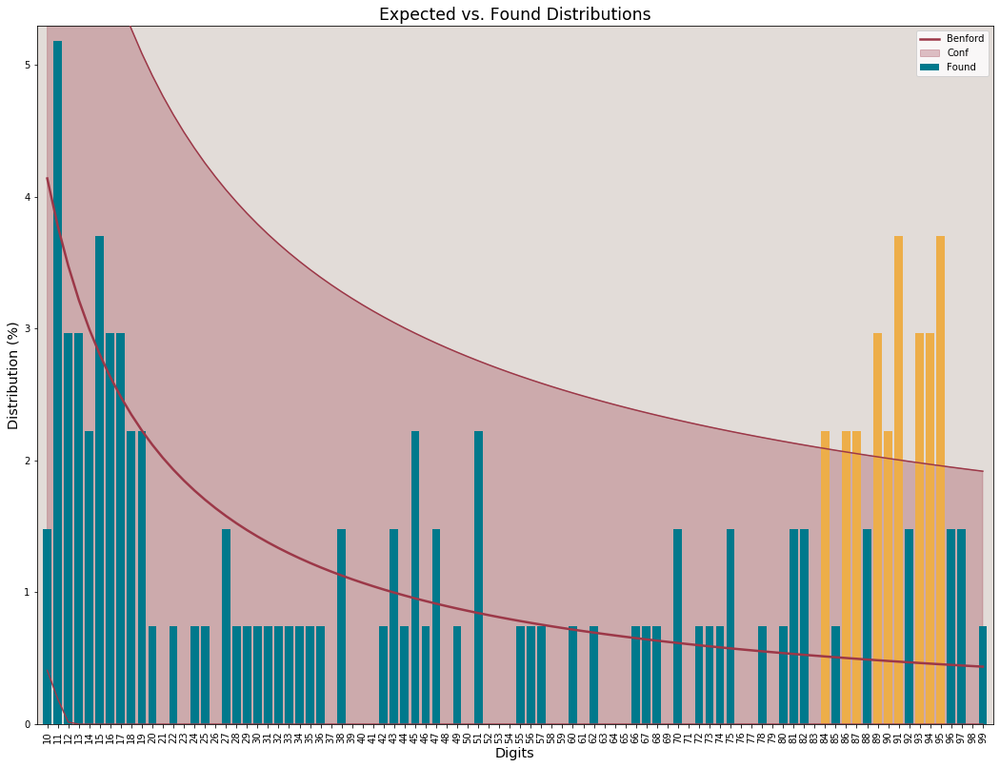



 #################  COUNTRY:  Belarus  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
Sec_Dig
0    0.081481
1    0.133333
2    0.096296
3    0.088889
4    0.103704
5    0.140741
6    0.096296
7    0.111111
8    0.074074
9    0.074074
Name: Found, dtype: float64

Test performed on 135 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.018117
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.4504.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0467.
Critical K-S for this series: 0.1171


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


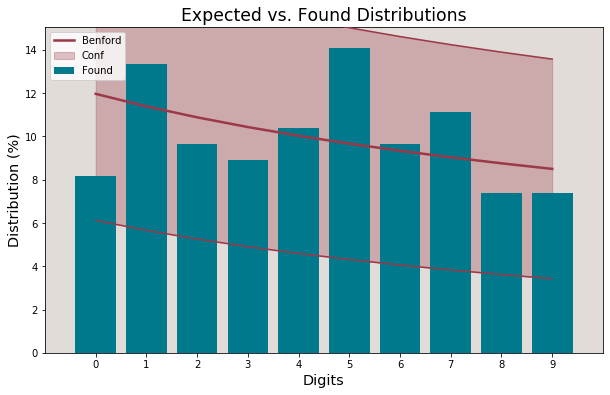

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Belgium  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 161 registries.
First_1_Dig
1    0.360248
2    0.142857
3    0.068323
4    0.105590
5    0.080745
6    0.086957
7    0.068323
8    0.031056
9    0.055901
Name: Found, dtype: float64

Test performed on 161 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.024433
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 10.0384.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0592.
Critical K-S for this series: 0.1072


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


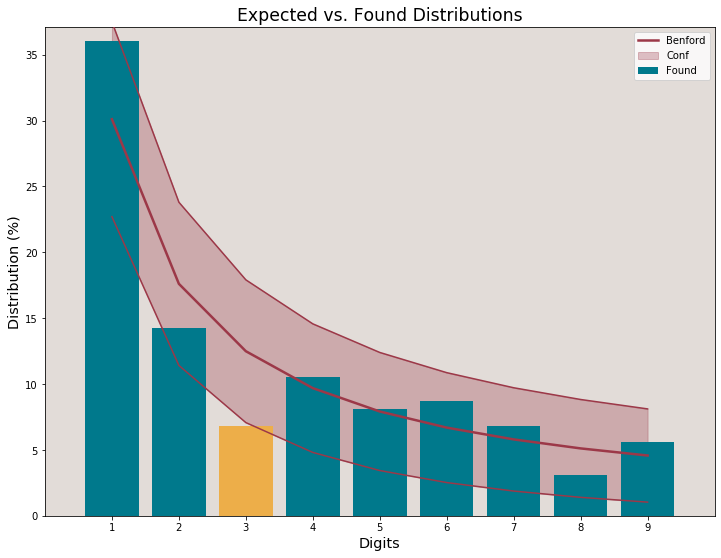



 #################  COUNTRY:  Belgium  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 161 registries.
First_2_Dig
10    0.024845
11    0.049689
12    0.055901
13    0.031056
14    0.055901
15    0.043478
16    0.037267
17    0.031056
18    0.018634
19    0.012422
20    0.024845
21    0.006211
22    0.024845
23    0.024845
24    0.018634
25    0.006211
26    0.006211
27    0.012422
28    0.006211
29    0.012422
30    0.006211
31    0.018634
32    0.000000
33    0.006211
34    0.006211
35    0.006211
36    0.000000
37    0.000000
38    0.018634
39    0.006211
40    0.000000
41    0.006211
42    0.006211
43    0.012422
44    0.018634
45    0.000000
46    0.006211
47    0.012422
48    0.012422
49    0.031056
50    0.000000
51    0.006211
52    0.006211
53    0.018634
54    0.012422
55    0.012422
56    0.000000
57    0.006211
58    0.006211
59    0.012422
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


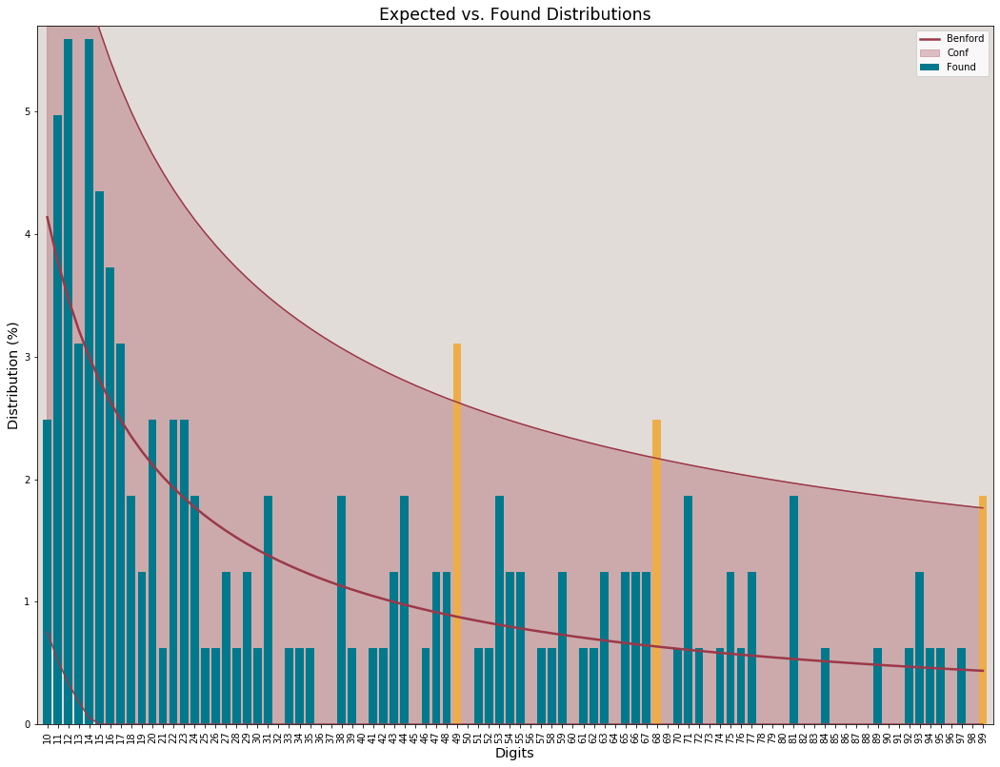



 #################  COUNTRY:  Belgium  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 161 registries.
Sec_Dig
0    0.062112
1    0.130435
2    0.111801
3    0.118012
4    0.130435
5    0.099379
6    0.068323
7    0.093168
8    0.086957
9    0.099379
Name: Found, dtype: float64

Test performed on 161 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.016647
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.1048.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0576.
Critical K-S for this series: 0.1072


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


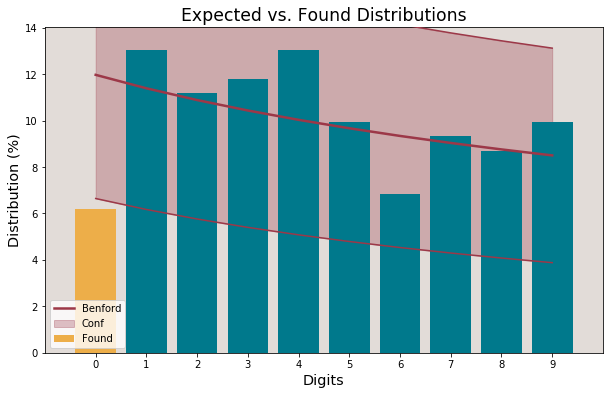

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Bolivia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 130 registries.
First_1_Dig
1    0.438462
2    0.146154
3    0.084615
4    0.053846
5    0.046154
6    0.100000
7    0.007692
8    0.084615
9    0.038462
Name: Found, dtype: float64

Test performed on 130 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.438462  3.320446
Mean Absolute Deviation: 0.045322
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 25.5788.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1374.
Critical K-S for this series: 0.119

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


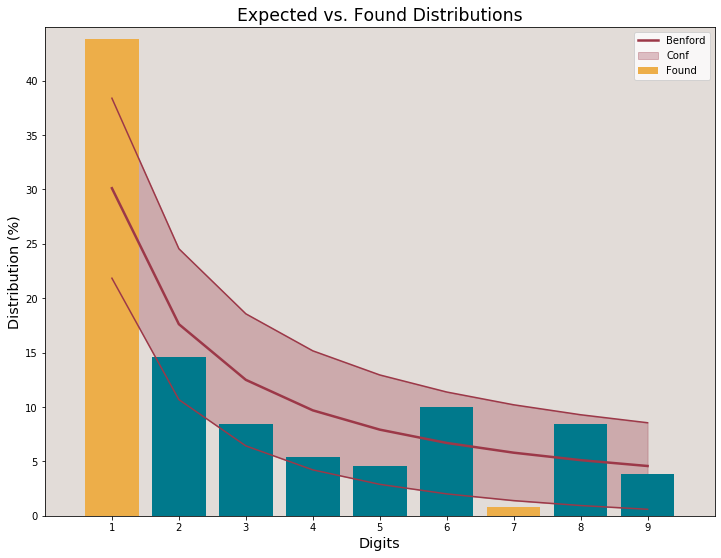



 #################  COUNTRY:  Bolivia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 130 registries.
First_2_Dig
10    0.061538
11    0.069231
12    0.076923
13    0.046154
14    0.038462
15    0.023077
16    0.030769
17    0.038462
18    0.030769
19    0.023077
20    0.023077
21    0.007692
22    0.015385
23    0.007692
24    0.038462
25    0.000000
26    0.023077
27    0.015385
28    0.015385
29    0.000000
30    0.015385
31    0.007692
32    0.000000
33    0.007692
34    0.023077
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.030769
40    0.000000
41    0.000000
42    0.000000
43    0.015385
44    0.015385
45    0.000000
46    0.007692
47    0.007692
48    0.007692
49    0.000000
50    0.000000
51    0.007692
52    0.000000
53    0.000000
54    0.015385
55    0.000000
56    0.000000
57    0.015385
58    0.000000
59    0.007692
60    0.015385


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


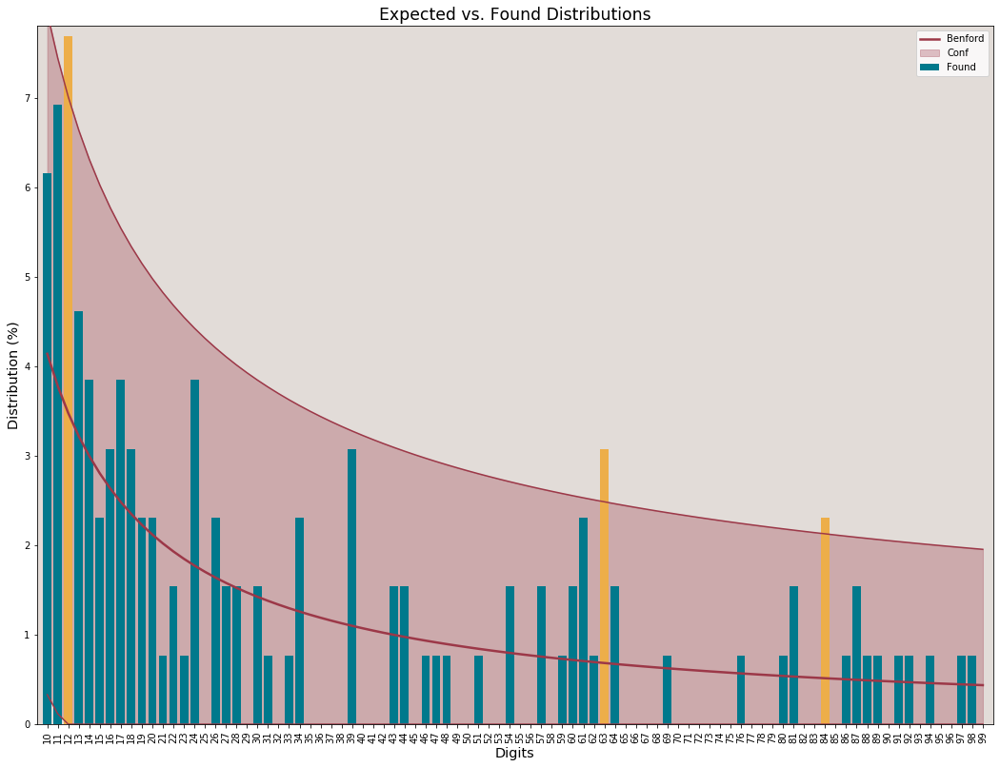



 #################  COUNTRY:  Bolivia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 130 registries.
Sec_Dig
0    0.123077
1    0.138462
2    0.107692
3    0.107692
4    0.176923
5    0.023077
6    0.076923
7    0.100000
8    0.069231
9    0.076923
Name: Found, dtype: float64

Test performed on 130 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
4        0.100308  0.176923  2.761858
Mean Absolute Deviation: 0.023519
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 16.7185.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1068.
Critical K-S for this series: 0.1193


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


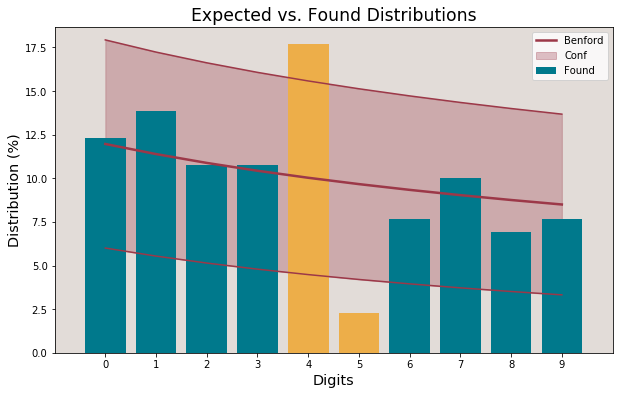

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Bosnia and Herzegovina  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
First_1_Dig
1    0.251852
2    0.244444
3    0.155556
4    0.133333
5    0.074074
6    0.096296
7    0.007407
8    0.022222
9    0.014815
Name: Found, dtype: float64

Test performed on 135 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.244444  1.972075
Mean Absolute Deviation: 0.036610
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 20.2993.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1105.
Critical K-S for thi

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


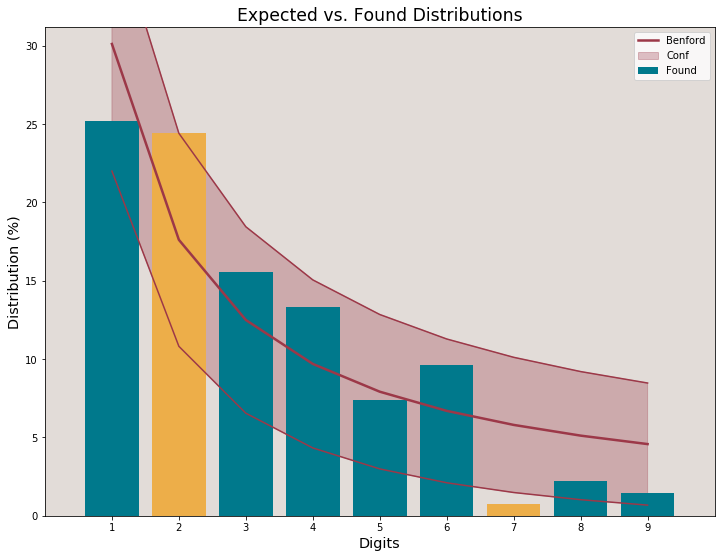



 #################  COUNTRY:  Bosnia and Herzegovina  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
First_2_Dig
10    0.022222
11    0.022222
12    0.014815
13    0.007407
14    0.029630
15    0.029630
16    0.044444
17    0.022222
18    0.029630
19    0.029630
20    0.022222
21    0.022222
22    0.029630
23    0.029630
24    0.022222
25    0.044444
26    0.014815
27    0.022222
28    0.029630
29    0.007407
30    0.044444
31    0.044444
32    0.007407
33    0.022222
34    0.007407
35    0.014815
36    0.000000
37    0.007407
38    0.007407
39    0.000000
40    0.029630
41    0.007407
42    0.007407
43    0.022222
44    0.007407
45    0.014815
46    0.014815
47    0.007407
48    0.014815
49    0.007407
50    0.000000
51    0.007407
52    0.007407
53    0.000000
54    0.007407
55    0.007407
56    0.007407
57    0.000000
58    0.022222
59    0.014815


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


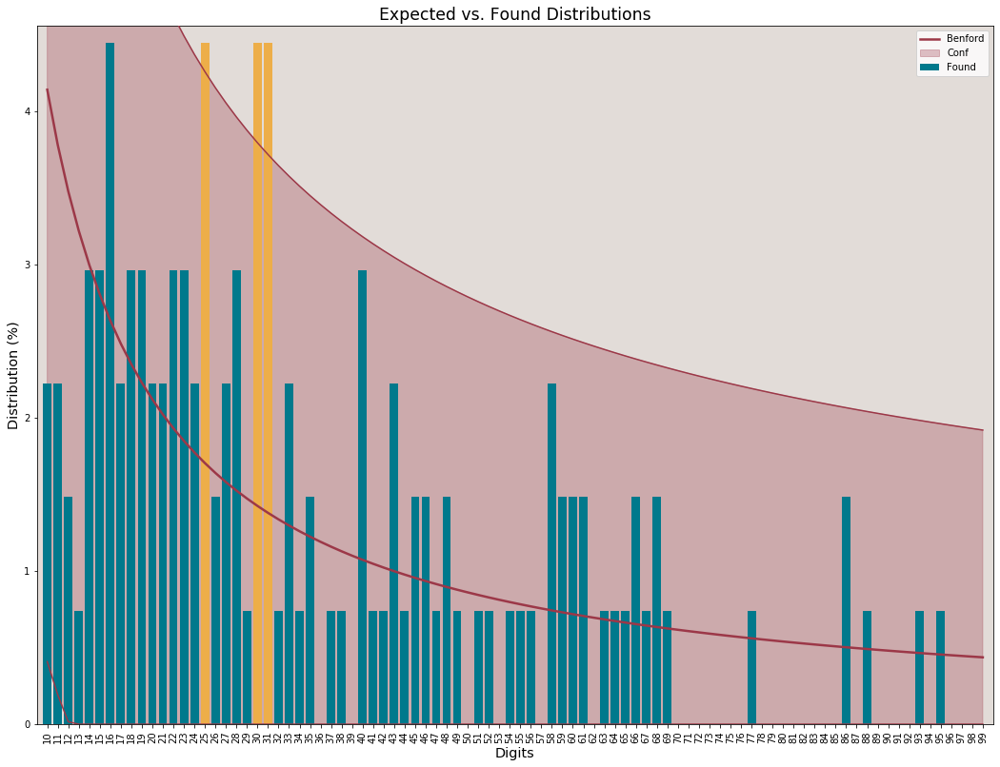



 #################  COUNTRY:  Bosnia and Herzegovina  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
Sec_Dig
0    0.133333
1    0.118519
2    0.066667
3    0.096296
4    0.081481
5    0.125926
6    0.111111
7    0.074074
8    0.125926
9    0.066667
Name: Found, dtype: float64

Test performed on 135 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020725
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.8477.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0507.
Critical K-S for this series: 0.1171


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


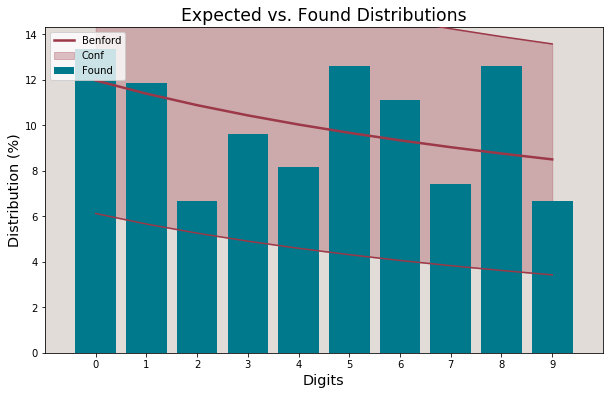

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Brazil  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
First_1_Dig
1    0.254902
2    0.235294
3    0.183007
4    0.137255
5    0.098039
6    0.045752
7    0.019608
8    0.006536
9    0.019608
Name: Found, dtype: float64

Test performed on 153 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.183007  2.050015
Mean Absolute Deviation: 0.039216
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 24.6673.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1303.
Critical K-S for this series: 0.1099

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


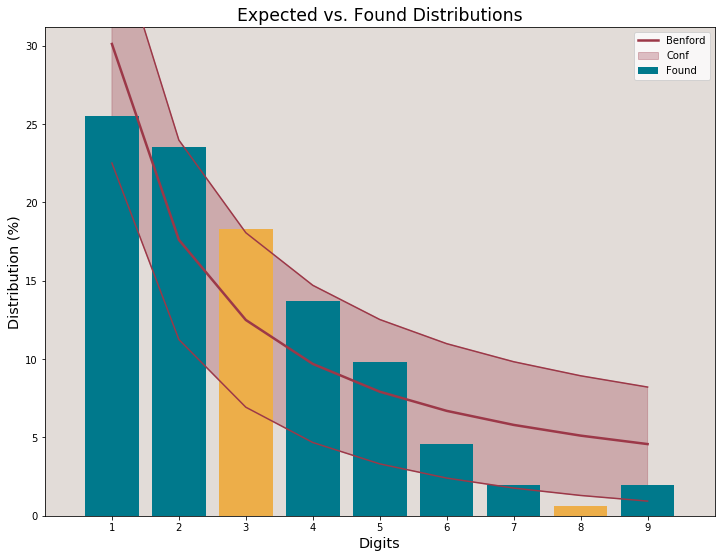



 #################  COUNTRY:  Brazil  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
First_2_Dig
10    0.032680
11    0.039216
12    0.019608
13    0.019608
14    0.013072
15    0.019608
16    0.032680
17    0.026144
18    0.026144
19    0.026144
20    0.045752
21    0.026144
22    0.019608
23    0.032680
24    0.026144
25    0.019608
26    0.026144
27    0.006536
28    0.026144
29    0.006536
30    0.032680
31    0.006536
32    0.032680
33    0.019608
34    0.032680
35    0.013072
36    0.000000
37    0.013072
38    0.006536
39    0.026144
40    0.006536
41    0.019608
42    0.019608
43    0.000000
44    0.006536
45    0.032680
46    0.019608
47    0.000000
48    0.019608
49    0.013072
50    0.013072
51    0.013072
52    0.006536
53    0.013072
54    0.006536
55    0.013072
56    0.006536
57    0.019608
58    0.000000
59    0.006536
60    0.000000
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


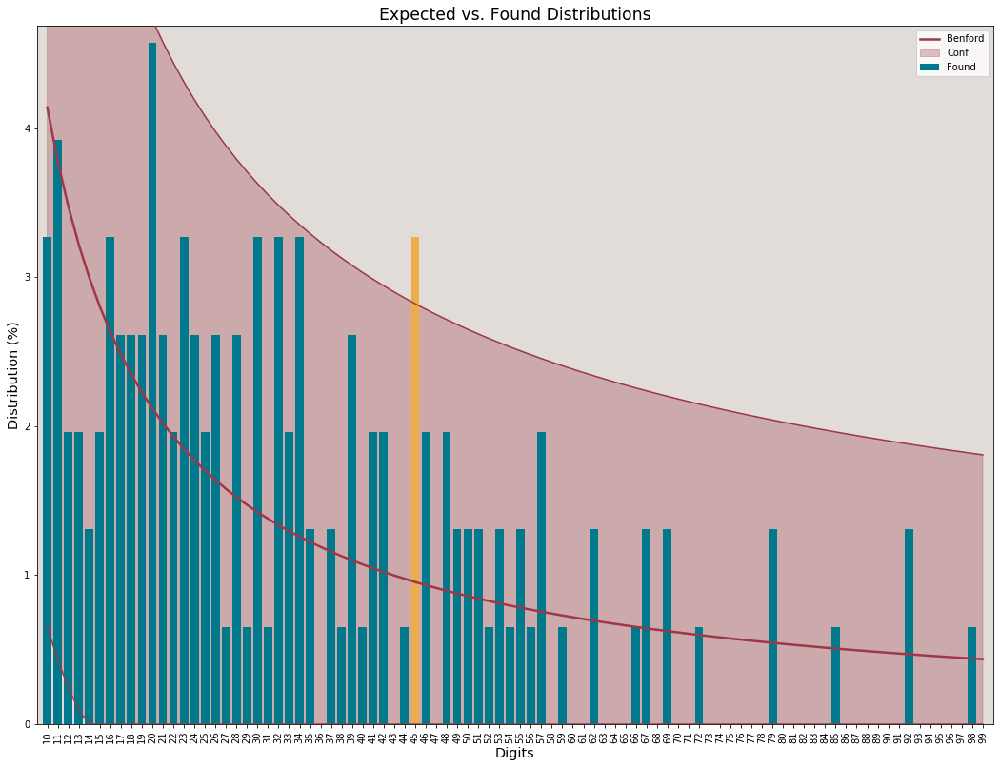



 #################  COUNTRY:  Brazil  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
Sec_Dig
0    0.130719
1    0.104575
2    0.130719
3    0.084967
4    0.084967
5    0.104575
6    0.091503
7    0.078431
8    0.084967
9    0.104575
Name: Found, dtype: float64

Test performed on 153 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.012083
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 2.9022.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0236.
Critical K-S for this series: 0.1099


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


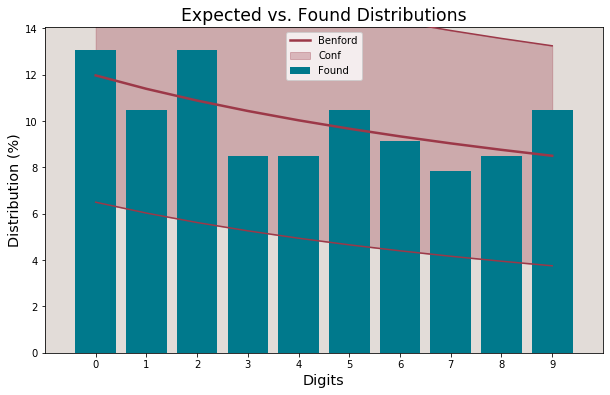

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Bulgaria  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
First_1_Dig
1    0.338028
2    0.253521
3    0.154930
4    0.070423
5    0.049296
6    0.021127
7    0.042254
8    0.049296
9    0.021127
Name: Found, dtype: float64

Test performed on 142 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.253521  2.312233
Mean Absolute Deviation: 0.032093
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 16.0844.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1444.
Critical K-S for this series: 0.11

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


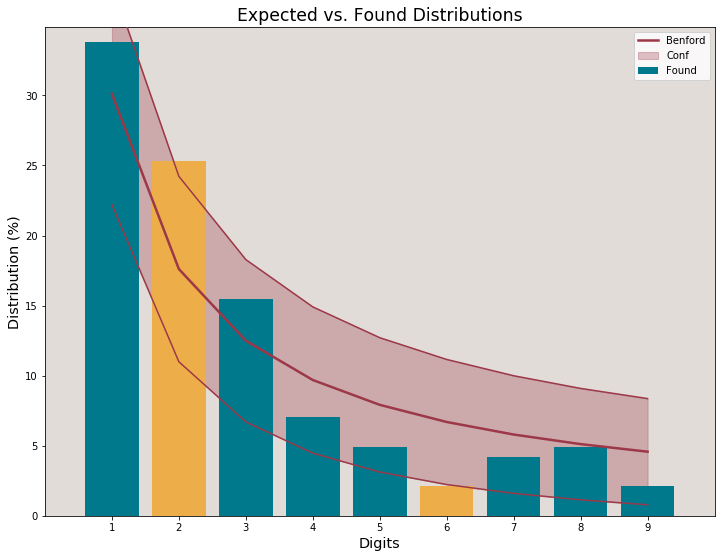



 #################  COUNTRY:  Bulgaria  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
First_2_Dig
10    0.049296
11    0.056338
12    0.007042
13    0.028169
14    0.042254
15    0.021127
16    0.049296
17    0.007042
18    0.042254
19    0.035211
20    0.007042
21    0.007042
22    0.028169
23    0.021127
24    0.035211
25    0.042254
26    0.028169
27    0.021127
28    0.035211
29    0.028169
30    0.007042
31    0.014085
32    0.021127
33    0.035211
34    0.014085
35    0.007042
36    0.021127
37    0.014085
38    0.014085
39    0.007042
40    0.007042
41    0.007042
42    0.000000
43    0.007042
44    0.007042
45    0.000000
46    0.021127
47    0.007042
48    0.007042
49    0.007042
50    0.000000
51    0.014085
52    0.000000
53    0.021127
54    0.000000
55    0.000000
56    0.000000
57    0.000000
58    0.000000
59    0.014085
60    0.000000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


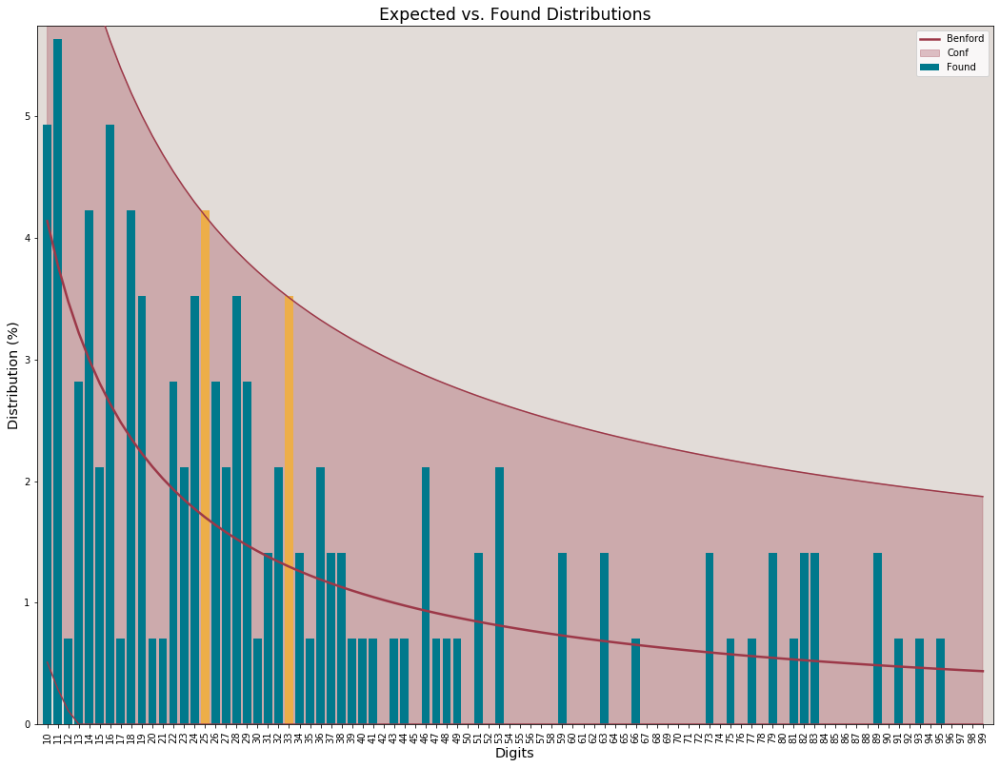



 #################  COUNTRY:  Bulgaria  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
Sec_Dig
0    0.070423
1    0.112676
2    0.070423
3    0.161972
4    0.098592
5    0.084507
6    0.126761
7    0.056338
8    0.098592
9    0.119718
Name: Found, dtype: float64

Test performed on 142 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
3         0.10433  0.161972  2.109761
Mean Absolute Deviation: 0.027354
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 15.2730.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0889.
Critical K-S for this series: 0.1141


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


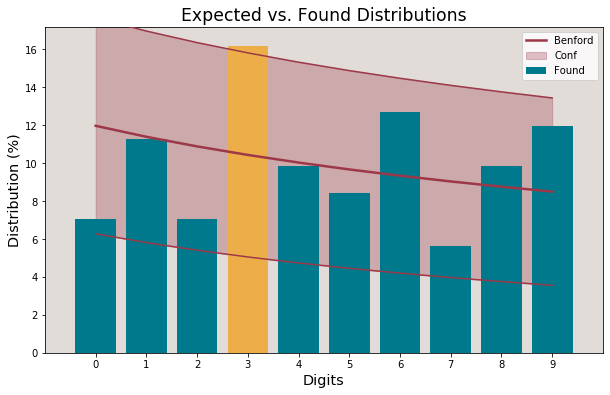

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Canada  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
First_1_Dig
1    0.437908
2    0.111111
3    0.169935
4    0.071895
5    0.045752
6    0.071895
7    0.052288
8    0.013072
9    0.026144
Name: Found, dtype: float64

Test performed on 153 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found  Z_score
First_1_Dig                             
1             0.30103  0.437908   3.6029
Mean Absolute Deviation: 0.041516
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 24.5835.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1369.
Critical K-S for this series: 0.1099


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


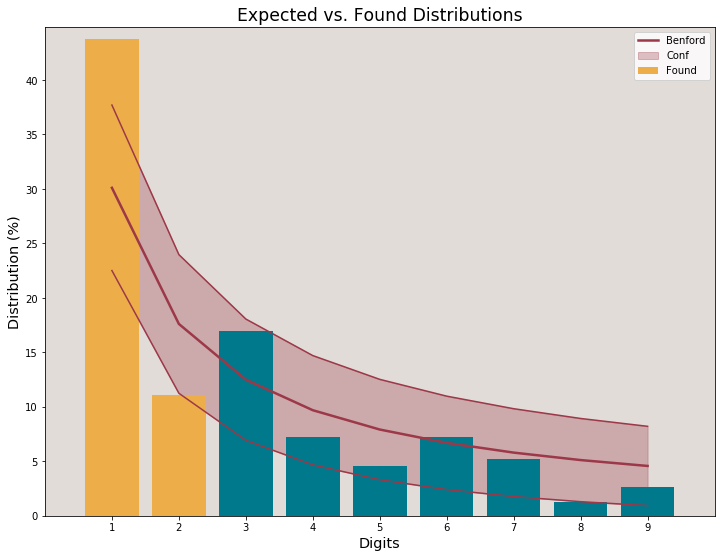



 #################  COUNTRY:  Canada  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
First_2_Dig
10    0.045752
11    0.078431
12    0.091503
13    0.032680
14    0.058824
15    0.045752
16    0.039216
17    0.032680
18    0.006536
19    0.006536
20    0.006536
21    0.019608
22    0.013072
23    0.019608
24    0.013072
25    0.000000
26    0.006536
27    0.013072
28    0.019608
29    0.000000
30    0.000000
31    0.026144
32    0.026144
33    0.013072
34    0.006536
35    0.019608
36    0.019608
37    0.019608
38    0.019608
39    0.019608
40    0.026144
41    0.006536
42    0.006536
43    0.013072
44    0.000000
45    0.000000
46    0.006536
47    0.013072
48    0.000000
49    0.000000
50    0.000000
51    0.006536
52    0.000000
53    0.006536
54    0.013072
55    0.000000
56    0.013072
57    0.006536
58    0.000000
59    0.000000
60    0.013072
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


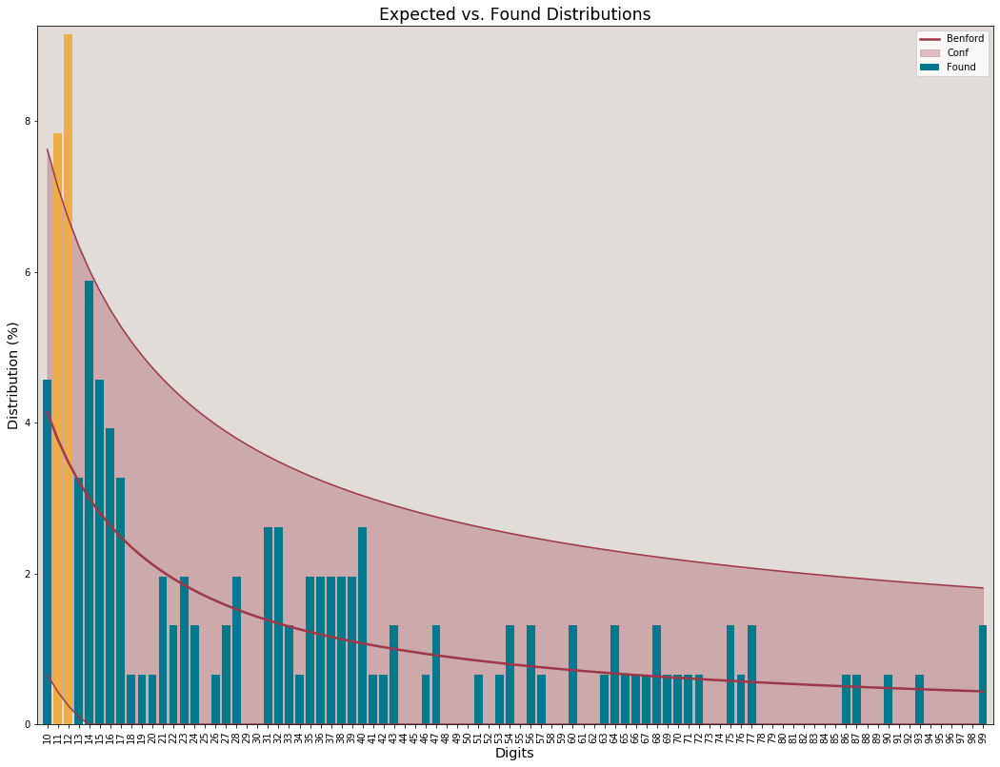



 #################  COUNTRY:  Canada  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
Sec_Dig
0    0.104575
1    0.143791
2    0.143791
3    0.098039
4    0.104575
5    0.084967
6    0.104575
7    0.111111
8    0.058824
9    0.045752
Name: Found, dtype: float64

Test performed on 153 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020219
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.6664.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0680.
Critical K-S for this series: 0.1099


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


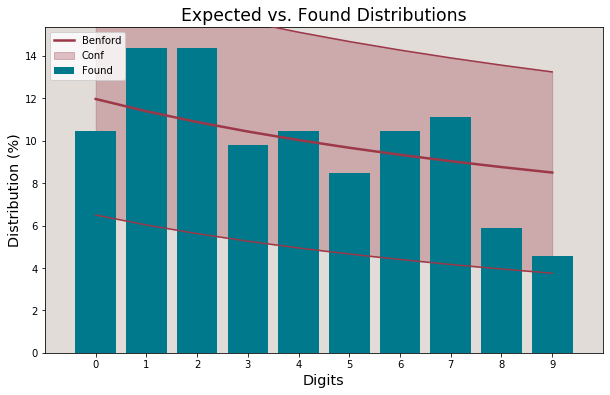

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Chile  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_1_Dig
1    0.218543
2    0.211921
3    0.211921
4    0.198675
5    0.092715
6    0.033113
7    0.000000
8    0.006623
9    0.026490
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
4            0.096910  0.198675  4.089526
3            0.124939  0.211921  3.109519
Mean Absolute Deviation: 0.052913
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 48.5610.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


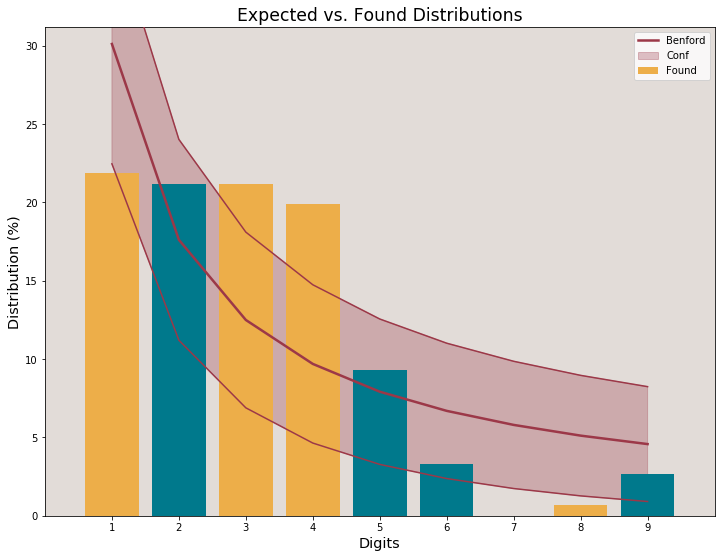



 #################  COUNTRY:  Chile  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_2_Dig
10    0.033113
11    0.019868
12    0.013245
13    0.013245
14    0.019868
15    0.006623
16    0.026490
17    0.039735
18    0.026490
19    0.019868
20    0.033113
21    0.033113
22    0.019868
23    0.026490
24    0.019868
25    0.013245
26    0.026490
27    0.006623
28    0.019868
29    0.013245
30    0.033113
31    0.026490
32    0.006623
33    0.013245
34    0.006623
35    0.039735
36    0.026490
37    0.026490
38    0.006623
39    0.026490
40    0.013245
41    0.006623
42    0.052980
43    0.013245
44    0.019868
45    0.006623
46    0.039735
47    0.013245
48    0.019868
49    0.013245
50    0.006623
51    0.013245
52    0.019868
53    0.013245
54    0.006623
55    0.019868
56    0.006623
57    0.006623
58    0.000000
59    0.000000
60    0.000000
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


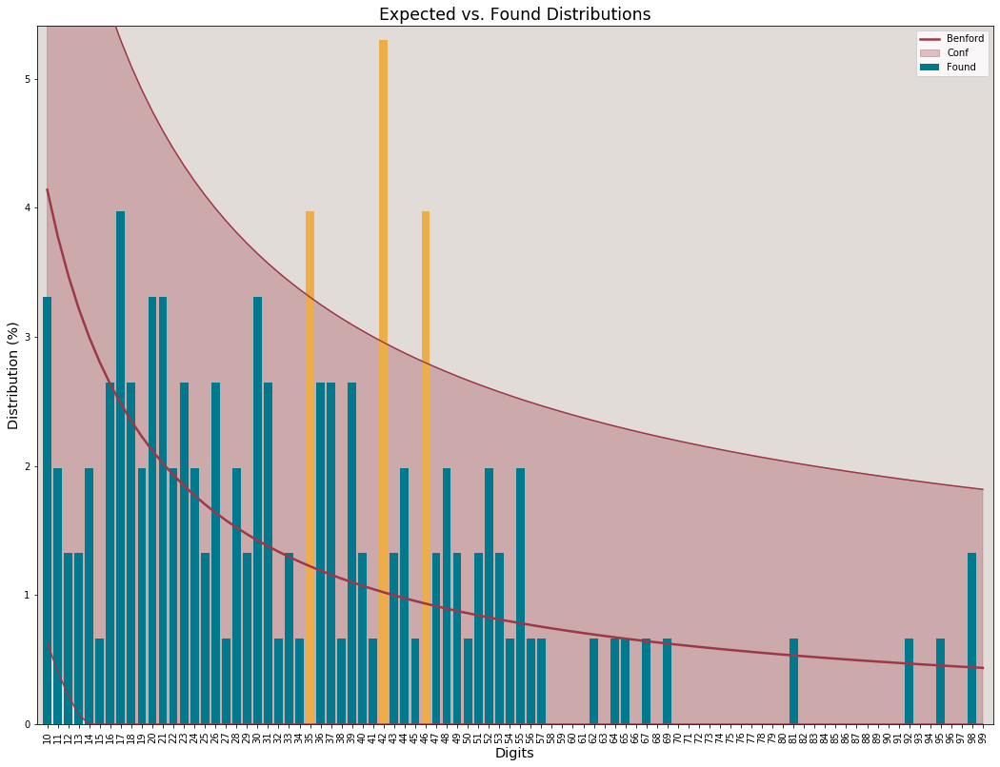



 #################  COUNTRY:  Chile  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
Sec_Dig
0    0.119205
1    0.105960
2    0.125828
3    0.079470
4    0.079470
5    0.099338
6    0.125828
7    0.099338
8    0.086093
9    0.079470
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.012221
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 3.9403.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0371.
Critical K-S for this series: 0.1107


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


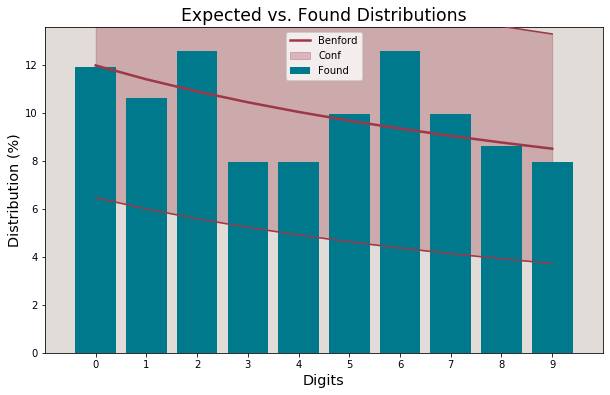

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  China  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
First_1_Dig
1    0.376471
2    0.205882
3    0.094118
4    0.100000
5    0.058824
6    0.041176
7    0.035294
8    0.047059
9    0.041176
Name: Found, dtype: float64

Test performed on 170 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.376471  2.060748
Mean Absolute Deviation: 0.024071
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 9.6002.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1052.
Critical K-S for this series: 0.1043


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


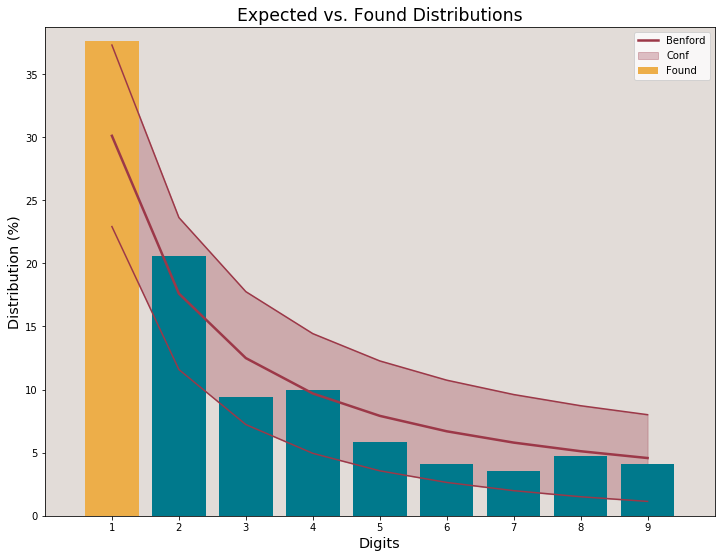



 #################  COUNTRY:  China  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
First_2_Dig
10    0.035294
11    0.052941
12    0.047059
13    0.035294
14    0.035294
15    0.047059
16    0.005882
17    0.052941
18    0.029412
19    0.035294
20    0.052941
21    0.017647
22    0.017647
23    0.011765
24    0.017647
25    0.029412
26    0.011765
27    0.011765
28    0.011765
29    0.023529
30    0.005882
31    0.017647
32    0.017647
33    0.005882
34    0.005882
35    0.011765
36    0.011765
37    0.005882
38    0.005882
39    0.005882
40    0.005882
41    0.011765
42    0.005882
43    0.017647
44    0.017647
45    0.005882
46    0.017647
47    0.005882
48    0.005882
49    0.005882
50    0.005882
51    0.005882
52    0.011765
53    0.000000
54    0.011765
55    0.011765
56    0.005882
57    0.005882
58    0.000000
59    0.000000
60    0.005882
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


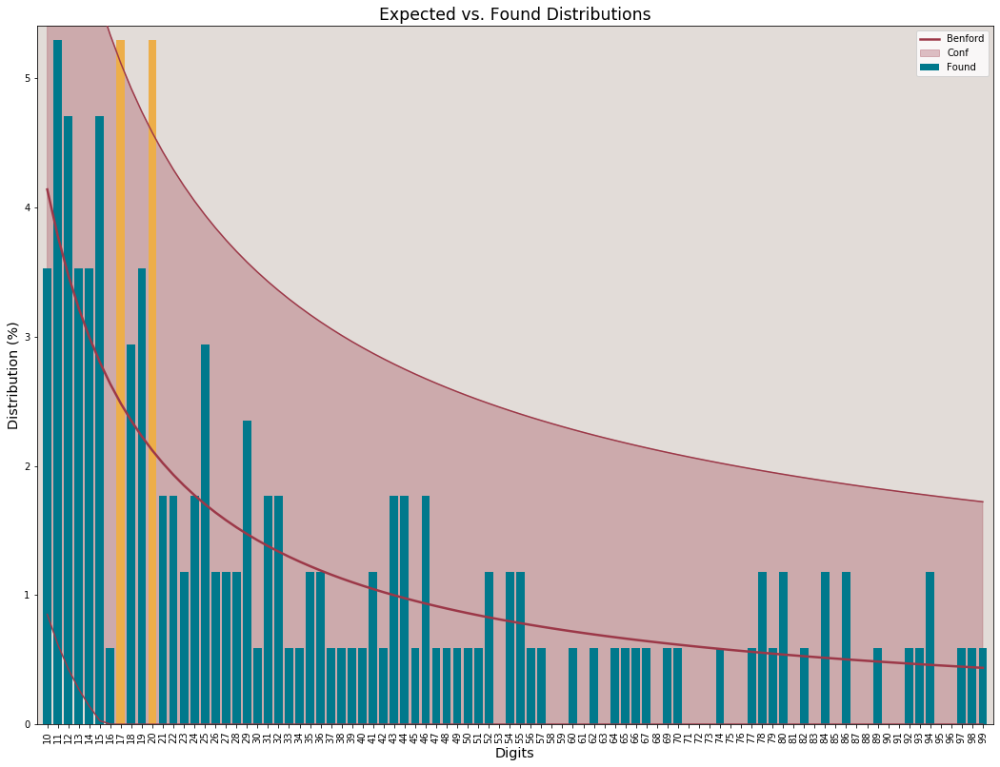



 #################  COUNTRY:  China  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
Sec_Dig
0    0.129412
1    0.105882
2    0.117647
3    0.076471
4    0.123529
5    0.111765
6    0.070588
7    0.100000
8    0.070588
9    0.094118
Name: Found, dtype: float64

Test performed on 170 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.015127
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.7774.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0210.
Critical K-S for this series: 0.1043


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


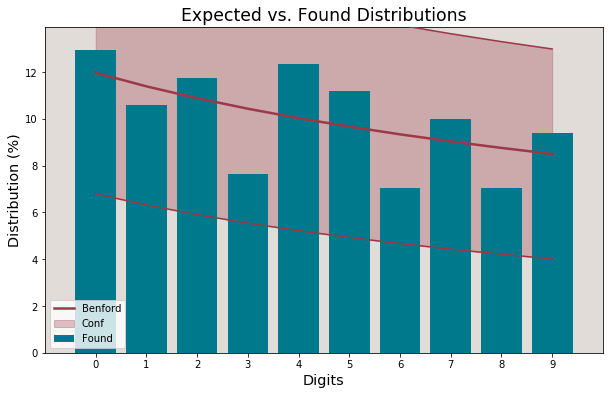

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Colombia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_1_Dig
1    0.278912
2    0.156463
3    0.142857
4    0.068027
5    0.054422
6    0.088435
7    0.088435
8    0.054422
9    0.068027
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021198
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 8.3290.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0775.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


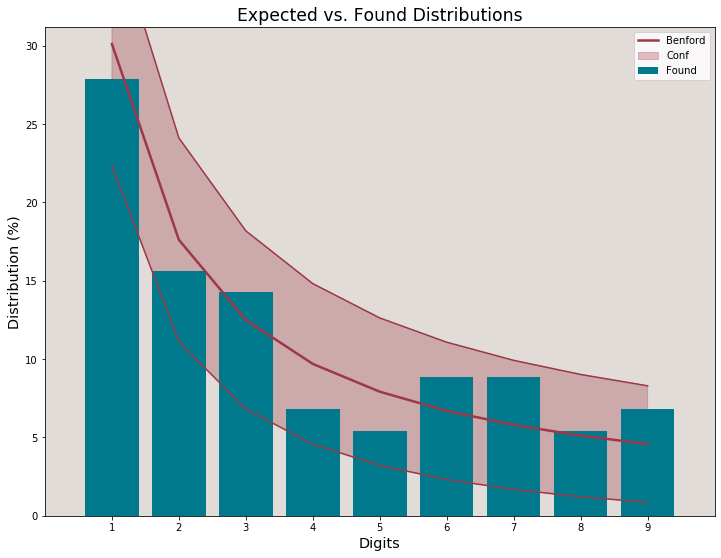



 #################  COUNTRY:  Colombia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_2_Dig
10    0.061224
11    0.040816
12    0.040816
13    0.034014
14    0.006803
15    0.027211
16    0.013605
17    0.020408
18    0.034014
19    0.000000
20    0.027211
21    0.034014
22    0.000000
23    0.027211
24    0.000000
25    0.020408
26    0.020408
27    0.013605
28    0.006803
29    0.006803
30    0.027211
31    0.027211
32    0.013605
33    0.006803
34    0.013605
35    0.013605
36    0.000000
37    0.020408
38    0.020408
39    0.000000
40    0.000000
41    0.027211
42    0.006803
43    0.000000
44    0.006803
45    0.006803
46    0.000000
47    0.000000
48    0.006803
49    0.013605
50    0.006803
51    0.000000
52    0.013605
53    0.006803
54    0.000000
55    0.006803
56    0.013605
57    0.000000
58    0.000000
59    0.006803
60    0.006803

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


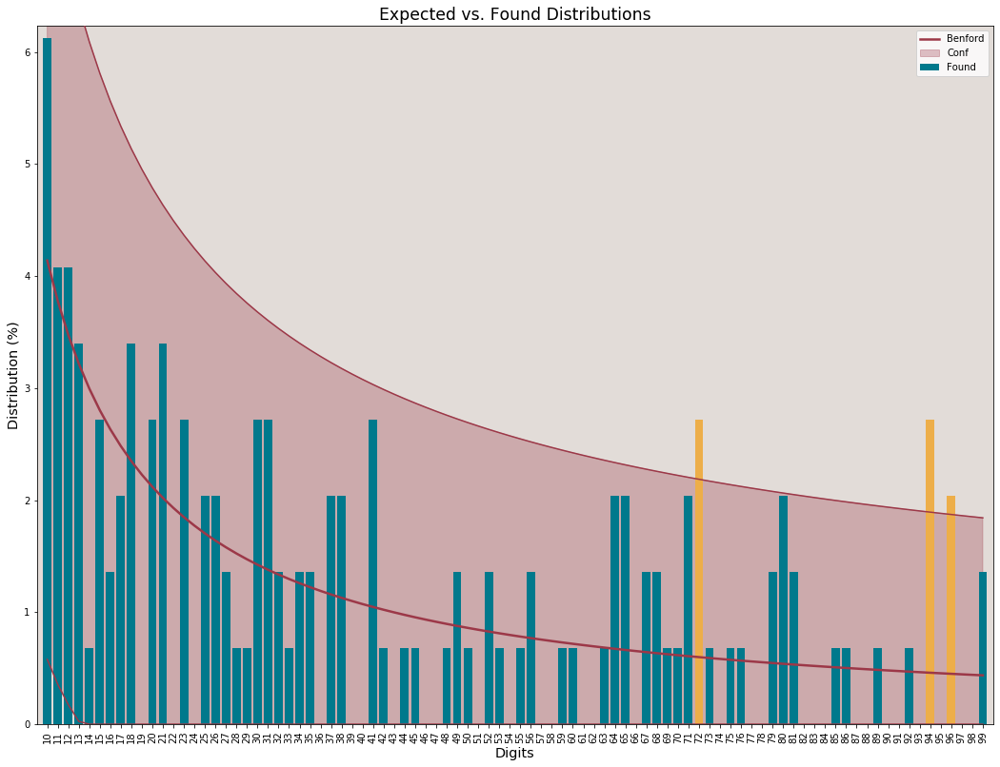



 #################  COUNTRY:  Colombia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
Sec_Dig
0    0.156463
1    0.163265
2    0.108844
3    0.088435
4    0.074830
5    0.108844
6    0.081633
7    0.068027
8    0.081633
9    0.068027
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.019669
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.9260.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0862.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


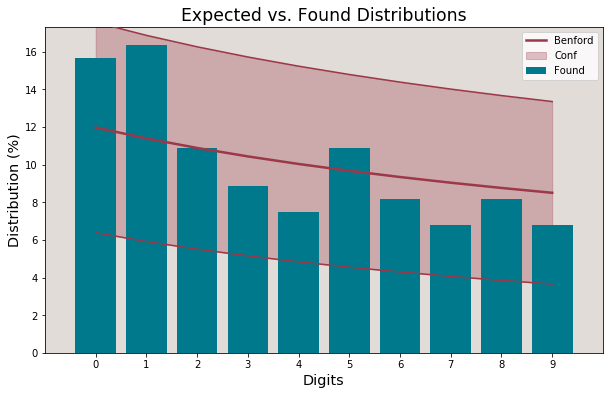

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Costa Rica  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 112 registries.
First_1_Dig
1    0.357143
2    0.187500
3    0.133929
4    0.071429
5    0.116071
6    0.062500
7    0.035714
8    0.017857
9    0.017857
Name: Found, dtype: float64

Test performed on 112 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.025200
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 9.3263.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0879.
Critical K-S for this series: 0.1285


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


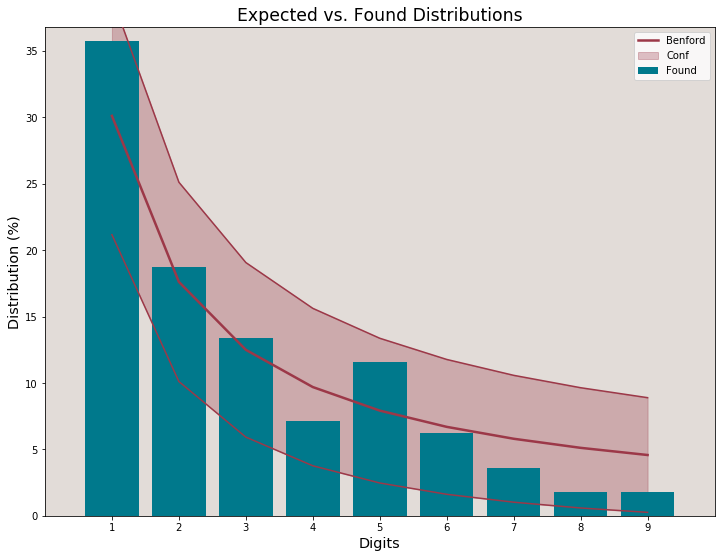



 #################  COUNTRY:  Costa Rica  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 112 registries.
First_2_Dig
10    0.035714
11    0.017857
12    0.035714
13    0.035714
14    0.017857
15    0.035714
16    0.053571
17    0.026786
18    0.017857
19    0.080357
20    0.008929
21    0.026786
22    0.008929
23    0.000000
24    0.044643
25    0.017857
26    0.008929
27    0.017857
28    0.035714
29    0.017857
30    0.008929
31    0.008929
32    0.017857
33    0.008929
34    0.008929
35    0.017857
36    0.026786
37    0.026786
38    0.008929
39    0.000000
40    0.000000
41    0.000000
42    0.026786
43    0.008929
44    0.017857
45    0.008929
46    0.000000
47    0.000000
48    0.000000
49    0.008929
50    0.026786
51    0.000000
52    0.008929
53    0.017857
54    0.008929
55    0.017857
56    0.017857
57    0.000000
58    0.017857
59    0.000000
60    0.0000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


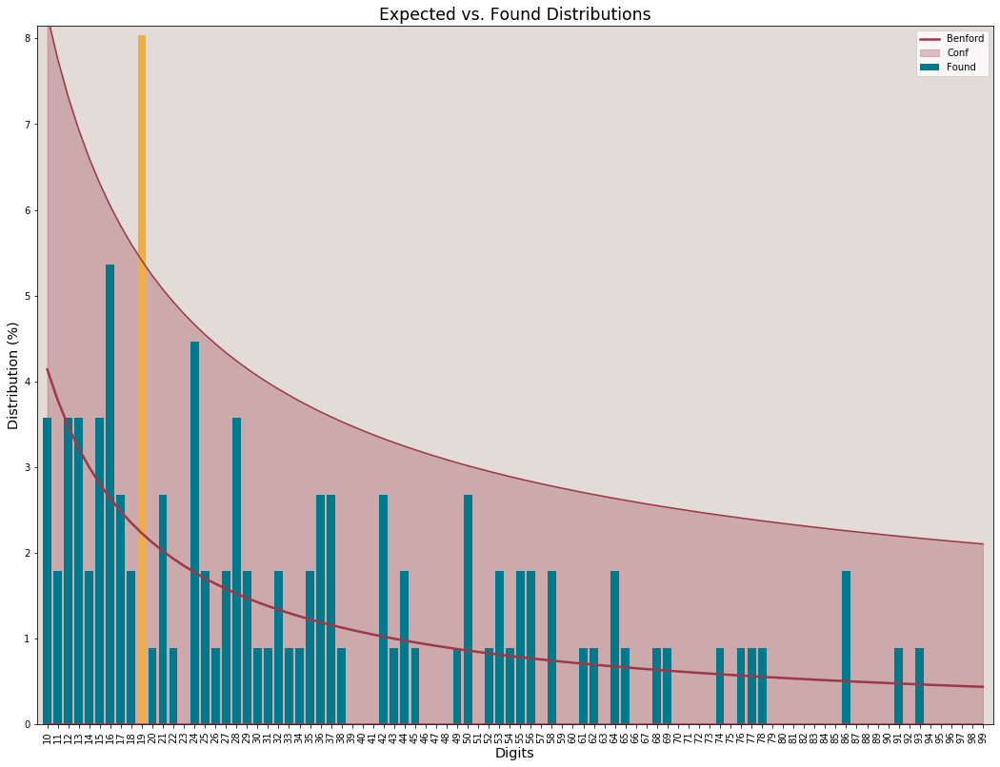



 #################  COUNTRY:  Costa Rica  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 112 registries.
Sec_Dig
0    0.080357
1    0.071429
2    0.107143
3    0.080357
4    0.125000
5    0.107143
6    0.133929
7    0.080357
8    0.098214
9    0.116071
Name: Found, dtype: float64

Test performed on 112 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.023486
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.1613.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1074.
Critical K-S for this series: 0.1285


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


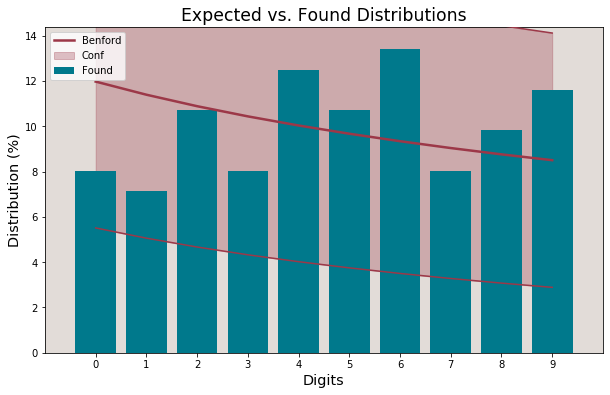

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Cote dIvoire  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 126 registries.
First_1_Dig
1    0.206349
2    0.206349
3    0.214286
4    0.095238
5    0.126984
6    0.055556
7    0.063492
8    0.007937
9    0.023810
Name: Found, dtype: float64

Test performed on 126 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.214286  2.898459
Mean Absolute Deviation: 0.038424
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 22.3347.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0947.
Critical K-S for this series: 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


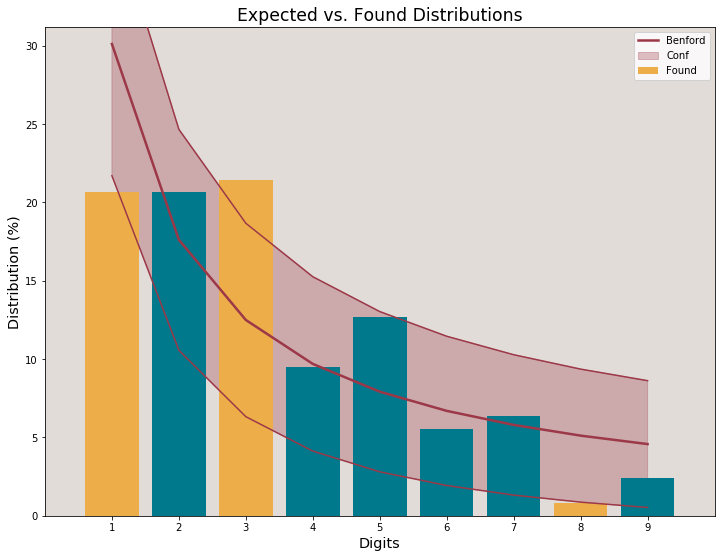



 #################  COUNTRY:  Cote dIvoire  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 126 registries.
First_2_Dig
10    0.047619
11    0.015873
12    0.015873
13    0.000000
14    0.023810
15    0.007937
16    0.047619
17    0.007937
18    0.015873
19    0.023810
20    0.023810
21    0.023810
22    0.015873
23    0.015873
24    0.031746
25    0.023810
26    0.015873
27    0.015873
28    0.023810
29    0.015873
30    0.015873
31    0.015873
32    0.023810
33    0.007937
34    0.039683
35    0.015873
36    0.031746
37    0.015873
38    0.023810
39    0.023810
40    0.007937
41    0.015873
42    0.000000
43    0.007937
44    0.007937
45    0.000000
46    0.015873
47    0.015873
48    0.015873
49    0.007937
50    0.000000
51    0.000000
52    0.023810
53    0.015873
54    0.015873
55    0.023810
56    0.007937
57    0.000000
58    0.015873
59    0.023810
60    0.00

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


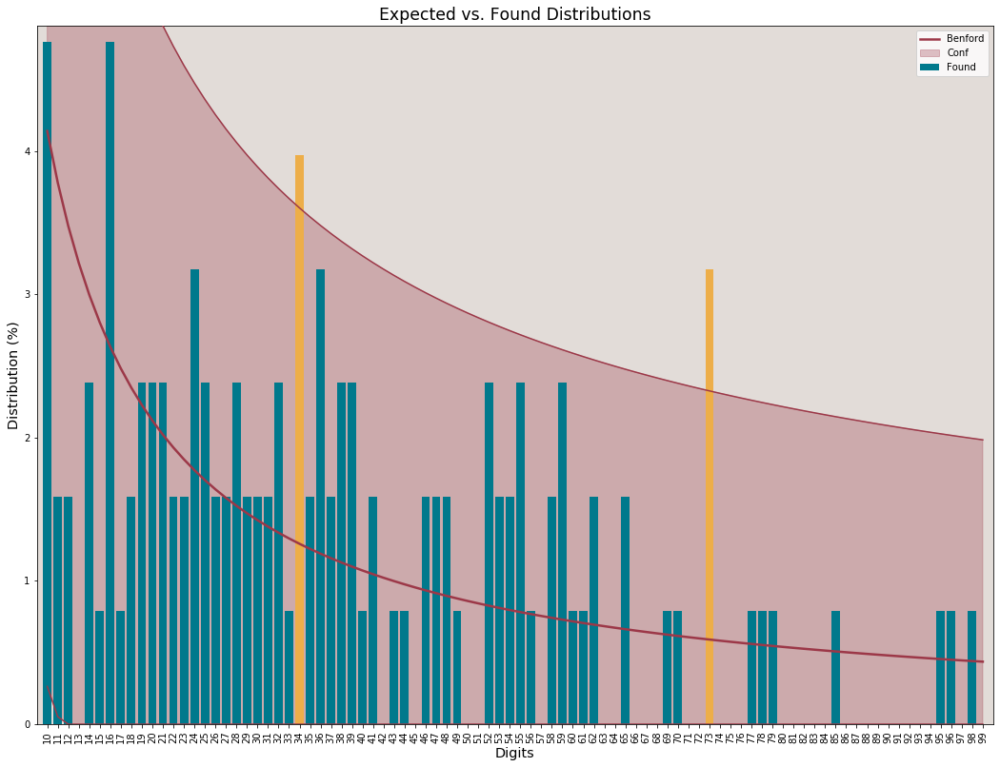



 #################  COUNTRY:  Cote dIvoire  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 126 registries.
Sec_Dig
0    0.111111
1    0.079365
2    0.095238
3    0.079365
4    0.119048
5    0.103175
6    0.126984
7    0.063492
8    0.111111
9    0.111111
Name: Found, dtype: float64

Test performed on 126 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021700
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.1971.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0816.
Critical K-S for this series: 0.1212


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


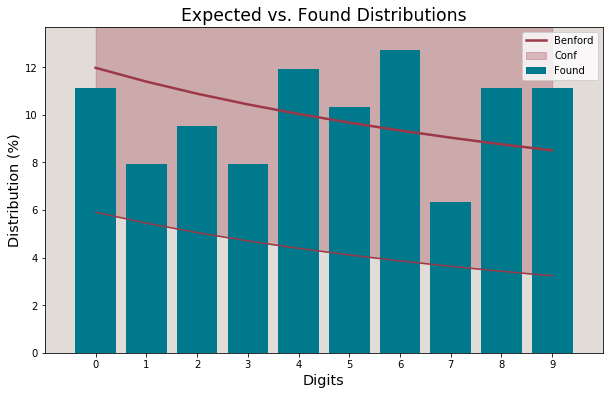

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Czechia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
First_1_Dig
1    0.287582
2    0.189542
3    0.091503
4    0.084967
5    0.124183
6    0.071895
7    0.065359
8    0.045752
9    0.039216
Name: Found, dtype: float64

Test performed on 153 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.015726
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 6.1860.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0454.
Critical K-S for this series: 0.1099


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


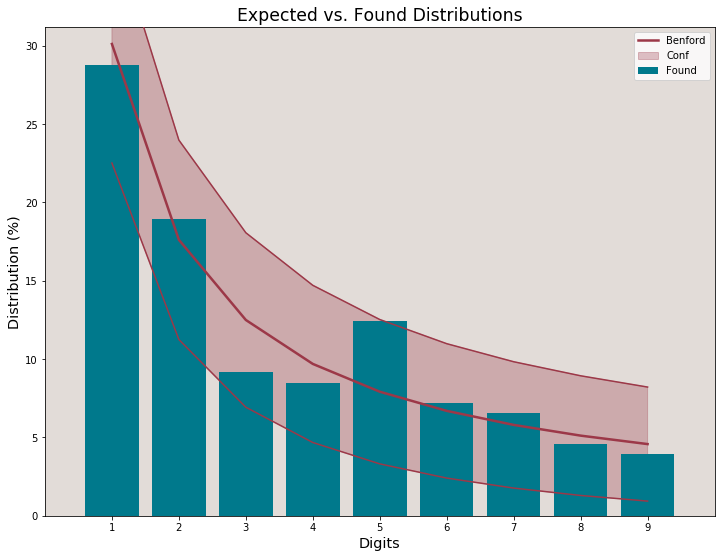



 #################  COUNTRY:  Czechia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
First_2_Dig
10    0.032680
11    0.039216
12    0.045752
13    0.045752
14    0.019608
15    0.013072
16    0.026144
17    0.039216
18    0.013072
19    0.013072
20    0.019608
21    0.019608
22    0.013072
23    0.026144
24    0.019608
25    0.006536
26    0.026144
27    0.006536
28    0.032680
29    0.019608
30    0.013072
31    0.006536
32    0.006536
33    0.019608
34    0.013072
35    0.006536
36    0.006536
37    0.000000
38    0.019608
39    0.000000
40    0.013072
41    0.000000
42    0.006536
43    0.006536
44    0.000000
45    0.013072
46    0.019608
47    0.013072
48    0.006536
49    0.006536
50    0.006536
51    0.013072
52    0.019608
53    0.019608
54    0.013072
55    0.019608
56    0.013072
57    0.006536
58    0.000000
59    0.013072
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


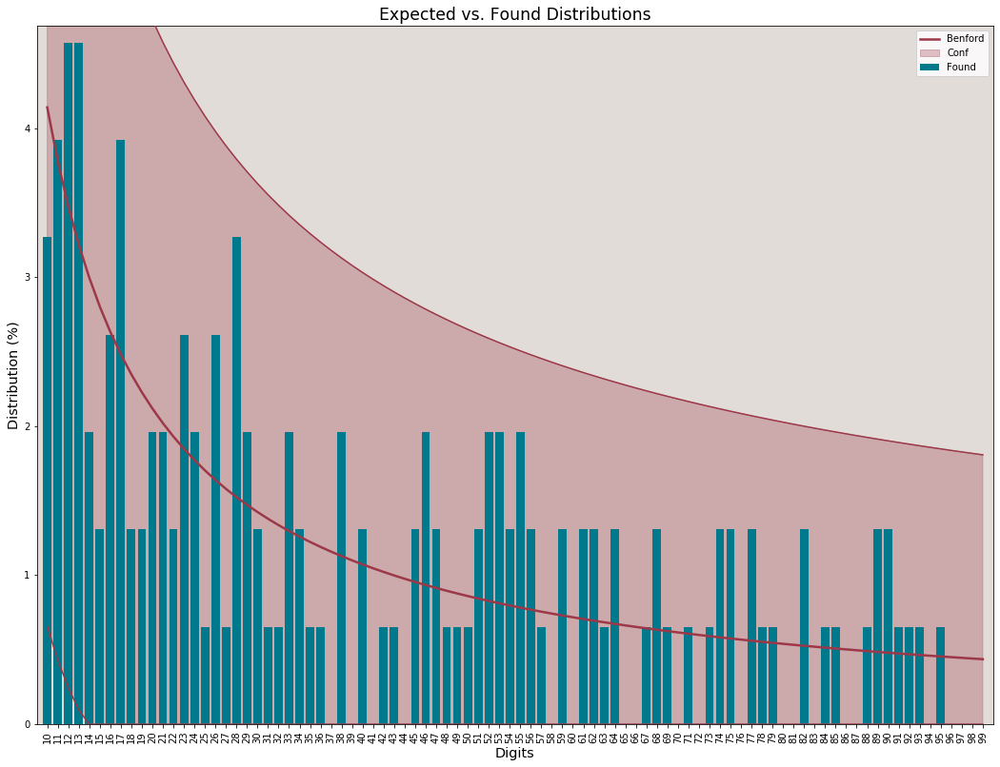



 #################  COUNTRY:  Czechia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 153 registries.
Sec_Dig
0    0.098039
1    0.104575
2    0.124183
3    0.137255
4    0.098039
5    0.084967
6    0.091503
7    0.084967
8    0.098039
9    0.078431
Name: Found, dtype: float64

Test performed on 153 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.011751
0.010000 < MAD <= 0.012000: Marginally Acceptable conformity.


The Chi-square statistic is 3.1856.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0310.
Critical K-S for this series: 0.1099


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


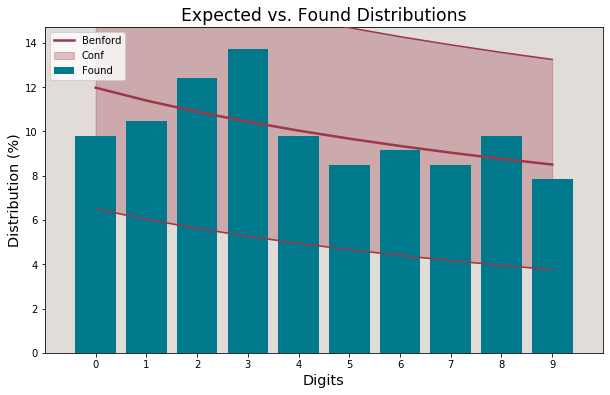

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Democratic Republic of the Congo  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 117 registries.
First_1_Dig
1    0.418803
2    0.136752
3    0.085470
4    0.051282
5    0.059829
6    0.059829
7    0.085470
8    0.051282
9    0.051282
Name: Found, dtype: float64

Test performed on 117 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found  Z_score
First_1_Dig                             
1             0.30103  0.418803  2.67642
Mean Absolute Deviation: 0.033535
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 12.6349.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1178.
Critical K-S 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


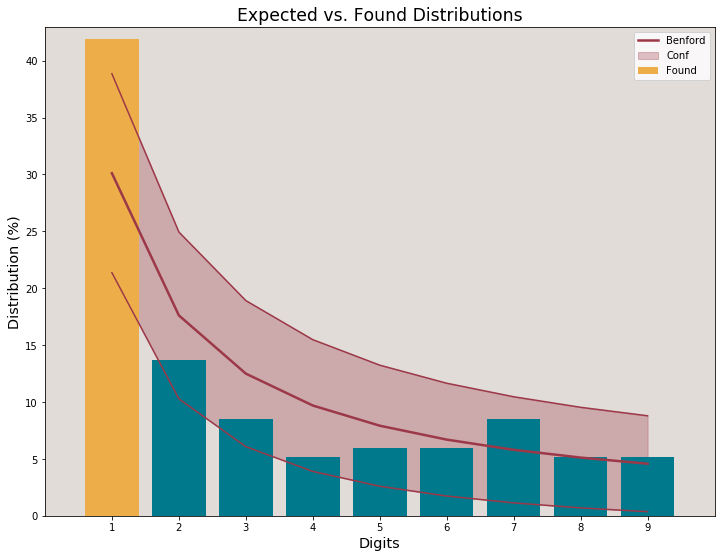



 #################  COUNTRY:  Democratic Republic of the Congo  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 117 registries.
First_2_Dig
10    0.042735
11    0.068376
12    0.042735
13    0.068376
14    0.025641
15    0.034188
16    0.008547
17    0.042735
18    0.034188
19    0.051282
20    0.042735
21    0.008547
22    0.025641
23    0.008547
24    0.008547
25    0.008547
26    0.008547
27    0.017094
28    0.000000
29    0.008547
30    0.000000
31    0.017094
32    0.025641
33    0.008547
34    0.017094
35    0.000000
36    0.008547
37    0.000000
38    0.008547
39    0.000000
40    0.017094
41    0.000000
42    0.008547
43    0.000000
44    0.000000
45    0.008547
46    0.008547
47    0.008547
48    0.000000
49    0.000000
50    0.008547
51    0.000000
52    0.000000
53    0.000000
54    0.017094
55    0.000000
56    0.017094
57    0.000000
58    0.008547
59   

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


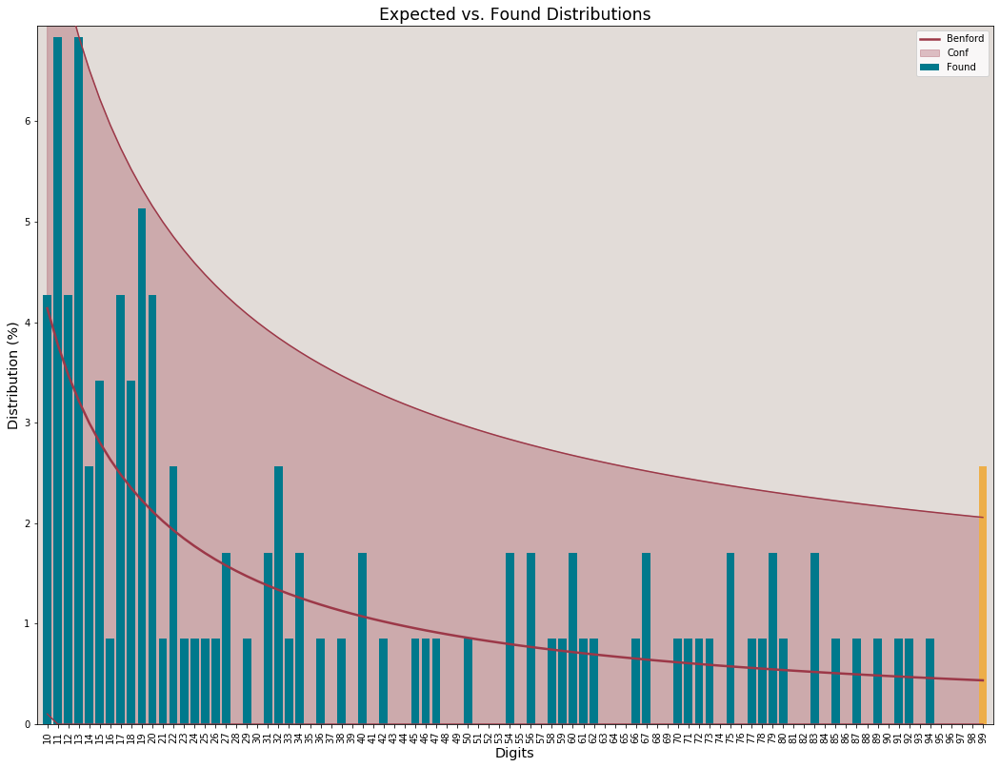



 #################  COUNTRY:  Democratic Republic of the Congo  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 117 registries.
Sec_Dig
0    0.145299
1    0.119658
2    0.128205
3    0.111111
4    0.076923
5    0.076923
6    0.059829
7    0.102564
8    0.059829
9    0.119658
Name: Found, dtype: float64

Test performed on 117 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020885
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.5266.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0576.
Critical K-S for this series: 0.1257


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


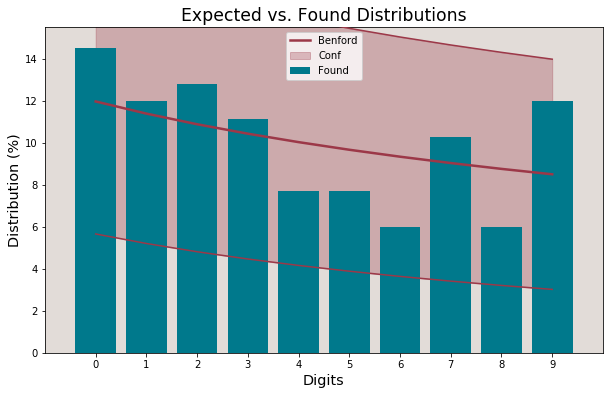

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Denmark  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 139 registries.
First_1_Dig
1    0.381295
2    0.122302
3    0.136691
4    0.122302
5    0.050360
6    0.057554
7    0.071942
8    0.021583
9    0.035971
Name: Found, dtype: float64

Test performed on 139 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.381295  1.970546
Mean Absolute Deviation: 0.029191
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 11.1119.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0803.
Critical K-S for this series: 0.115

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


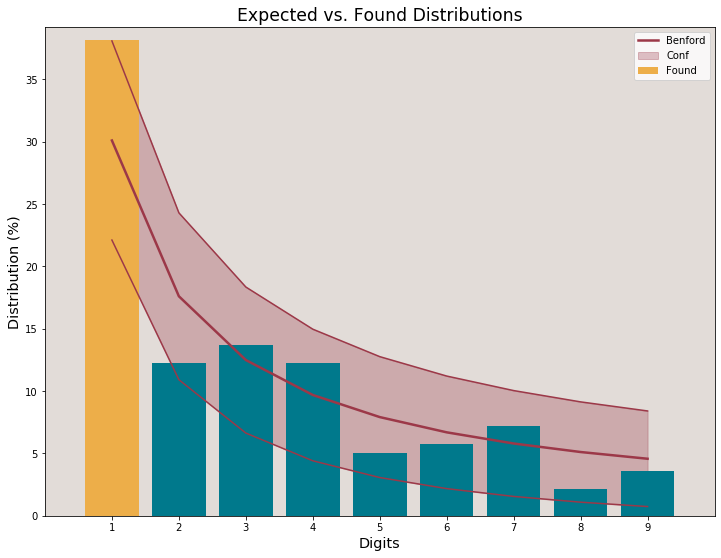



 #################  COUNTRY:  Denmark  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 139 registries.
First_2_Dig
10    0.043165
11    0.021583
12    0.028777
13    0.057554
14    0.028777
15    0.064748
16    0.043165
17    0.035971
18    0.021583
19    0.035971
20    0.007194
21    0.021583
22    0.000000
23    0.021583
24    0.028777
25    0.007194
26    0.007194
27    0.014388
28    0.007194
29    0.007194
30    0.021583
31    0.014388
32    0.021583
33    0.014388
34    0.007194
35    0.007194
36    0.014388
37    0.014388
38    0.000000
39    0.021583
40    0.035971
41    0.014388
42    0.000000
43    0.000000
44    0.007194
45    0.000000
46    0.014388
47    0.007194
48    0.028777
49    0.014388
50    0.007194
51    0.000000
52    0.007194
53    0.000000
54    0.014388
55    0.000000
56    0.000000
57    0.014388
58    0.000000
59    0.007194
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


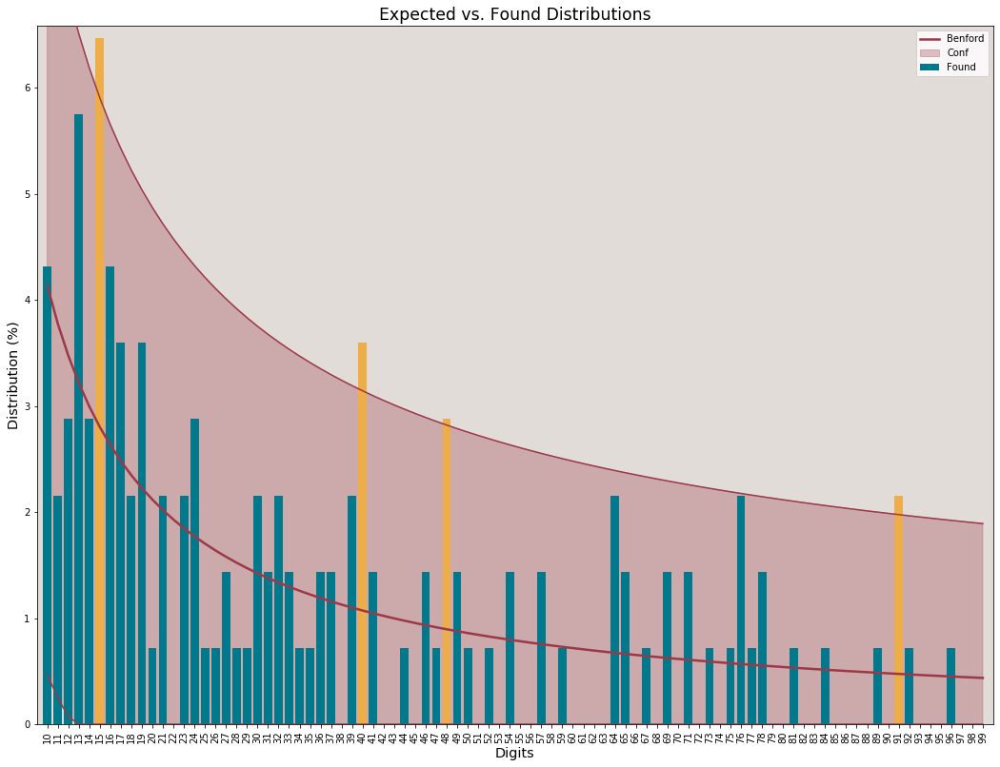



 #################  COUNTRY:  Denmark  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 139 registries.
Sec_Dig
0    0.115108
1    0.115108
2    0.064748
3    0.100719
4    0.115108
5    0.100719
6    0.107914
7    0.100719
8    0.071942
9    0.107914
Name: Found, dtype: float64

Test performed on 139 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.013576
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.5781.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0510.
Critical K-S for this series: 0.1154


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


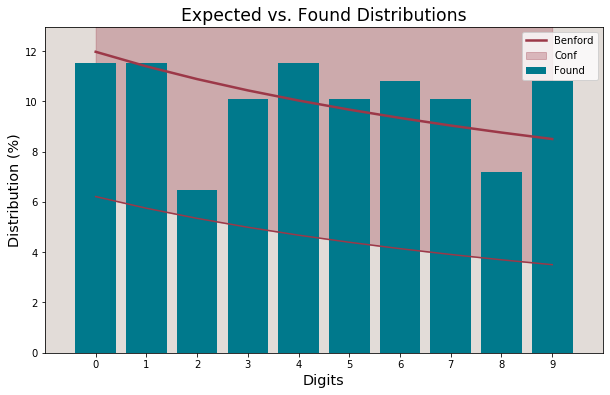

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Dominican Republic  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
First_1_Dig
1    0.309859
2    0.190141
3    0.112676
4    0.112676
5    0.056338
6    0.042254
7    0.042254
8    0.077465
9    0.056338
Name: Found, dtype: float64

Test performed on 142 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.016786
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 5.8361.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0369.
Critical K-S for this series: 0.1141


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


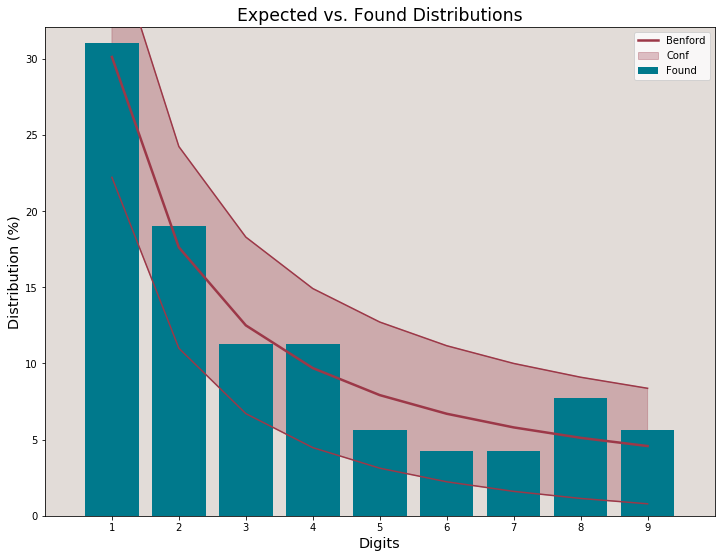



 #################  COUNTRY:  Dominican Republic  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
First_2_Dig
10    0.035211
11    0.049296
12    0.042254
13    0.049296
14    0.042254
15    0.021127
16    0.007042
17    0.035211
18    0.021127
19    0.007042
20    0.049296
21    0.000000
22    0.000000
23    0.014085
24    0.014085
25    0.014085
26    0.007042
27    0.014085
28    0.063380
29    0.014085
30    0.014085
31    0.007042
32    0.021127
33    0.007042
34    0.014085
35    0.000000
36    0.000000
37    0.028169
38    0.007042
39    0.014085
40    0.007042
41    0.028169
42    0.021127
43    0.014085
44    0.007042
45    0.007042
46    0.014085
47    0.000000
48    0.007042
49    0.007042
50    0.007042
51    0.007042
52    0.007042
53    0.007042
54    0.007042
55    0.000000
56    0.014085
57    0.007042
58    0.000000
59    0.000000
60  

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


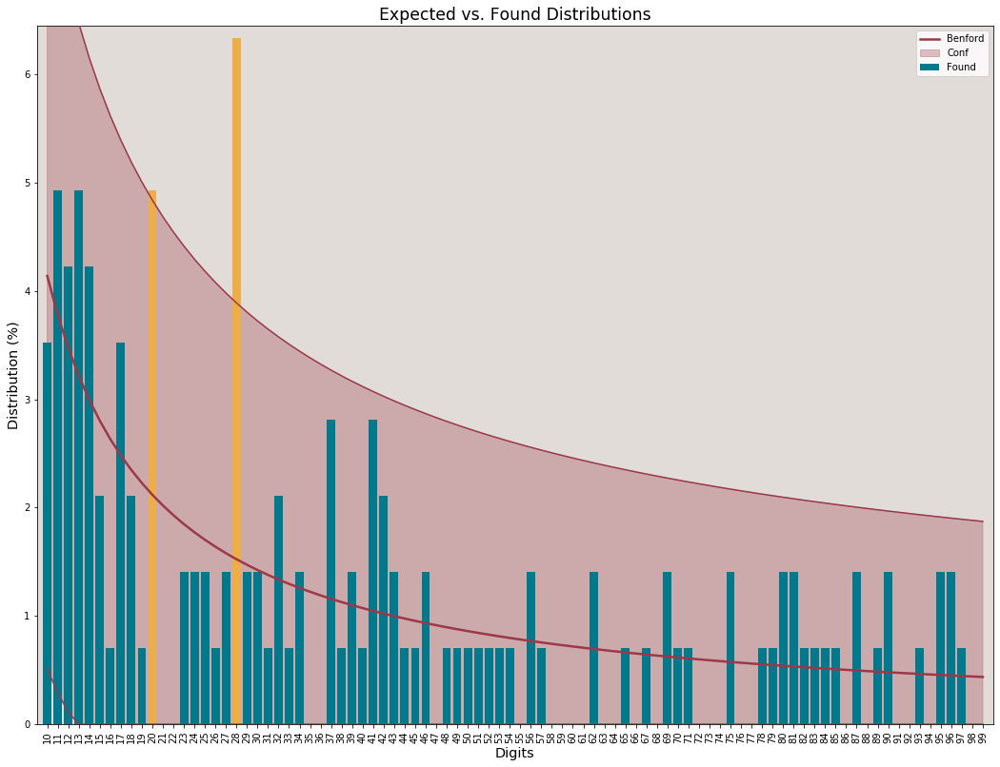



 #################  COUNTRY:  Dominican Republic  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
Sec_Dig
0    0.147887
1    0.112676
2    0.112676
3    0.105634
4    0.091549
5    0.084507
6    0.056338
7    0.112676
8    0.105634
9    0.070423
Name: Found, dtype: float64

Test performed on 142 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.014751
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 5.0471.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0322.
Critical K-S for this series: 0.1141


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


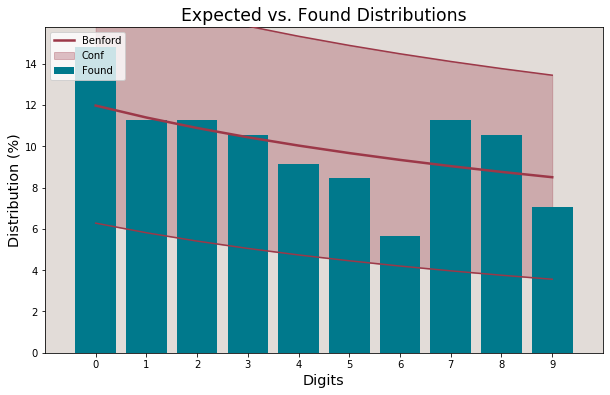

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Ecuador  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 136 registries.
First_1_Dig
1    0.227941
2    0.132353
3    0.051471
4    0.139706
5    0.132353
6    0.095588
7    0.073529
8    0.058824
9    0.088235
Name: Found, dtype: float64

Test performed on 136 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
9            0.045757  0.088235  2.165487
5            0.079181  0.132353  2.137640
Mean Absolute Deviation: 0.042288
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 24.9446.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


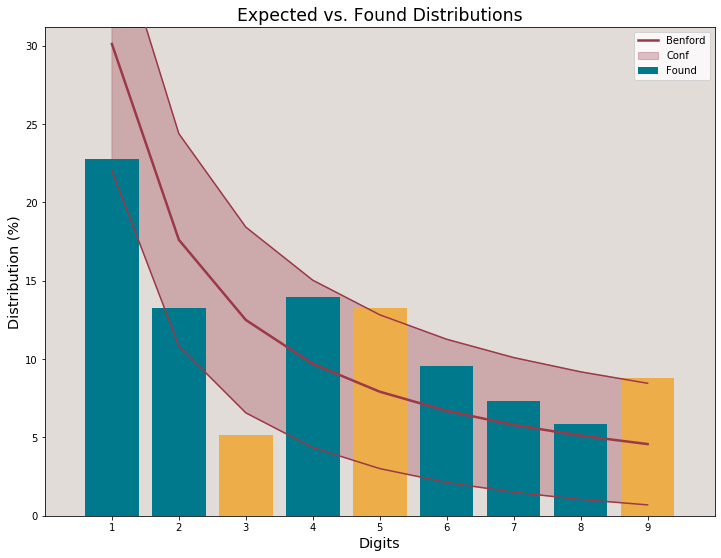



 #################  COUNTRY:  Ecuador  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 136 registries.
First_2_Dig
10    0.066176
11    0.051471
12    0.022059
13    0.007353
14    0.022059
15    0.007353
16    0.022059
17    0.000000
18    0.014706
19    0.014706
20    0.029412
21    0.014706
22    0.022059
23    0.007353
24    0.007353
25    0.036765
26    0.000000
27    0.007353
28    0.000000
29    0.007353
30    0.000000
31    0.007353
32    0.000000
33    0.014706
34    0.000000
35    0.000000
36    0.014706
37    0.000000
38    0.000000
39    0.014706
40    0.014706
41    0.022059
42    0.022059
43    0.007353
44    0.007353
45    0.044118
46    0.007353
47    0.000000
48    0.007353
49    0.007353
50    0.000000
51    0.014706
52    0.029412
53    0.014706
54    0.007353
55    0.014706
56    0.007353
57    0.029412
58    0.007353
59    0.007353
60    0.022059


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


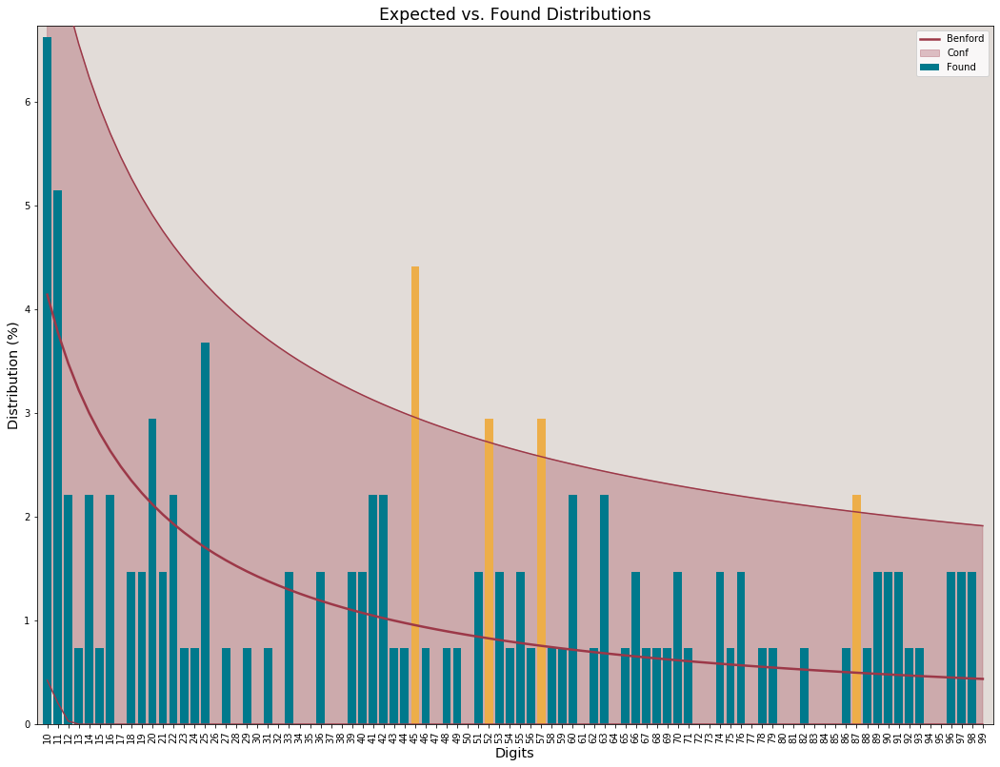



 #################  COUNTRY:  Ecuador  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 136 registries.
Sec_Dig
0    0.161765
1    0.132353
2    0.117647
3    0.080882
4    0.058824
5    0.117647
6    0.102941
7    0.080882
8    0.066176
9    0.080882
Name: Found, dtype: float64

Test performed on 136 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.019982
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.1919.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0694.
Critical K-S for this series: 0.1166


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


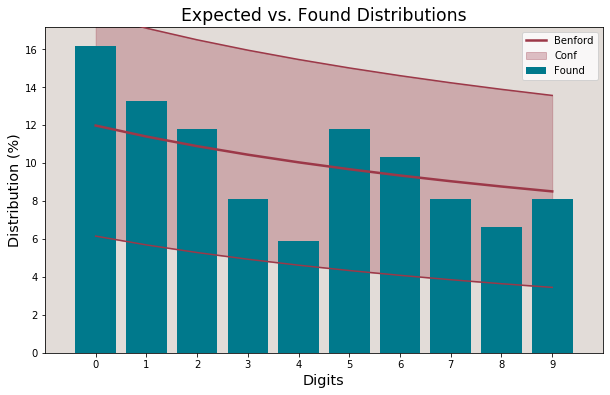

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Egypt  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_1_Dig
1    0.462585
2    0.081633
3    0.115646
4    0.108844
5    0.027211
6    0.061224
7    0.054422
8    0.013605
9    0.074830
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.462585  4.180265
Mean Absolute Deviation: 0.045014
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 32.3964.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1616.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


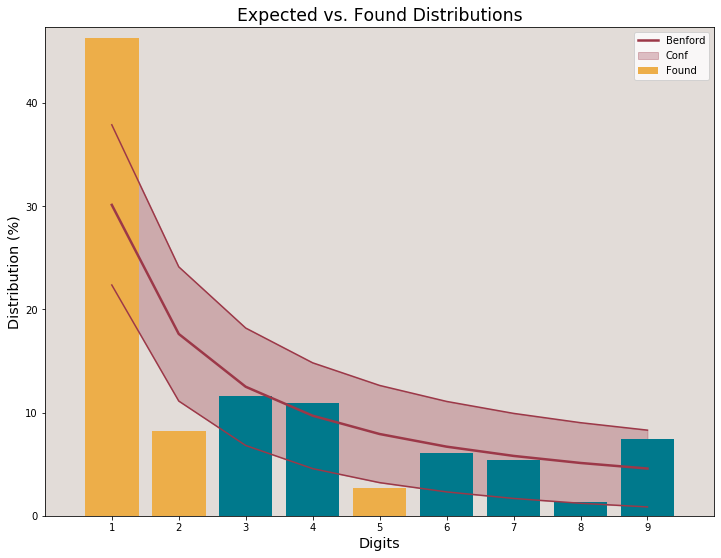



 #################  COUNTRY:  Egypt  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_2_Dig
10    0.020408
11    0.040816
12    0.054422
13    0.074830
14    0.081633
15    0.081633
16    0.068027
17    0.027211
18    0.013605
19    0.000000
20    0.013605
21    0.000000
22    0.013605
23    0.013605
24    0.006803
25    0.000000
26    0.013605
27    0.006803
28    0.000000
29    0.013605
30    0.006803
31    0.000000
32    0.006803
33    0.020408
34    0.027211
35    0.006803
36    0.000000
37    0.000000
38    0.013605
39    0.034014
40    0.027211
41    0.006803
42    0.006803
43    0.013605
44    0.000000
45    0.000000
46    0.020408
47    0.013605
48    0.006803
49    0.013605
50    0.000000
51    0.013605
52    0.000000
53    0.006803
54    0.006803
55    0.000000
56    0.000000
57    0.000000
58    0.000000
59    0.000000
60    0.006803
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


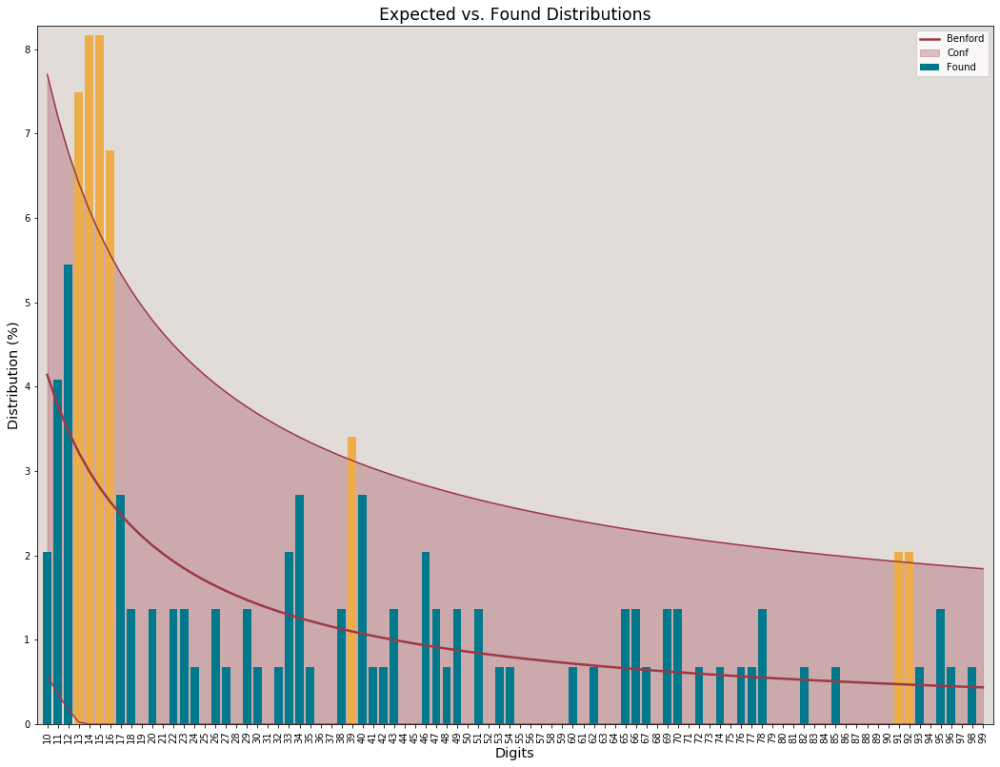



 #################  COUNTRY:  Egypt  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
Sec_Dig
0    0.088435
1    0.081633
2    0.122449
3    0.136054
4    0.129252
5    0.122449
6    0.129252
7    0.061224
8    0.054422
9    0.074830
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.027189
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 11.8786.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0724.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


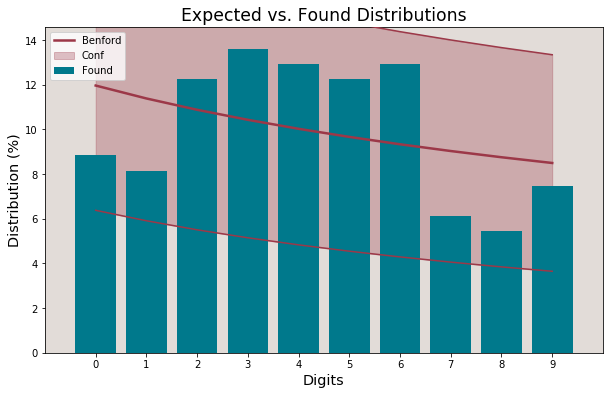

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  El Salvador  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 111 registries.
First_1_Dig
1    0.234234
2    0.207207
3    0.153153
4    0.153153
5    0.027027
6    0.054054
7    0.054054
8    0.090090
9    0.027027
Name: Found, dtype: float64

Test performed on 111 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.034336
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 14.8454.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0668.
Critical K-S for this series: 0.1291


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


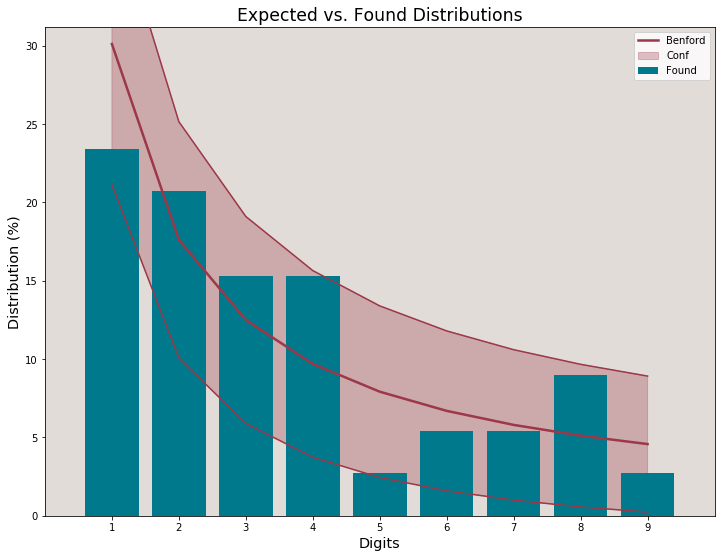



 #################  COUNTRY:  El Salvador  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 111 registries.
First_2_Dig
10    0.054054
11    0.045045
12    0.036036
13    0.036036
14    0.009009
15    0.000000
16    0.009009
17    0.018018
18    0.027027
19    0.000000
20    0.009009
21    0.000000
22    0.018018
23    0.018018
24    0.027027
25    0.045045
26    0.027027
27    0.018018
28    0.018018
29    0.027027
30    0.018018
31    0.009009
32    0.027027
33    0.009009
34    0.009009
35    0.000000
36    0.009009
37    0.018018
38    0.009009
39    0.045045
40    0.045045
41    0.054054
42    0.018018
43    0.018018
44    0.009009
45    0.000000
46    0.000000
47    0.009009
48    0.000000
49    0.000000
50    0.000000
51    0.000000
52    0.009009
53    0.000000
54    0.000000
55    0.009009
56    0.000000
57    0.000000
58    0.000000
59    0.009009
60    0.000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


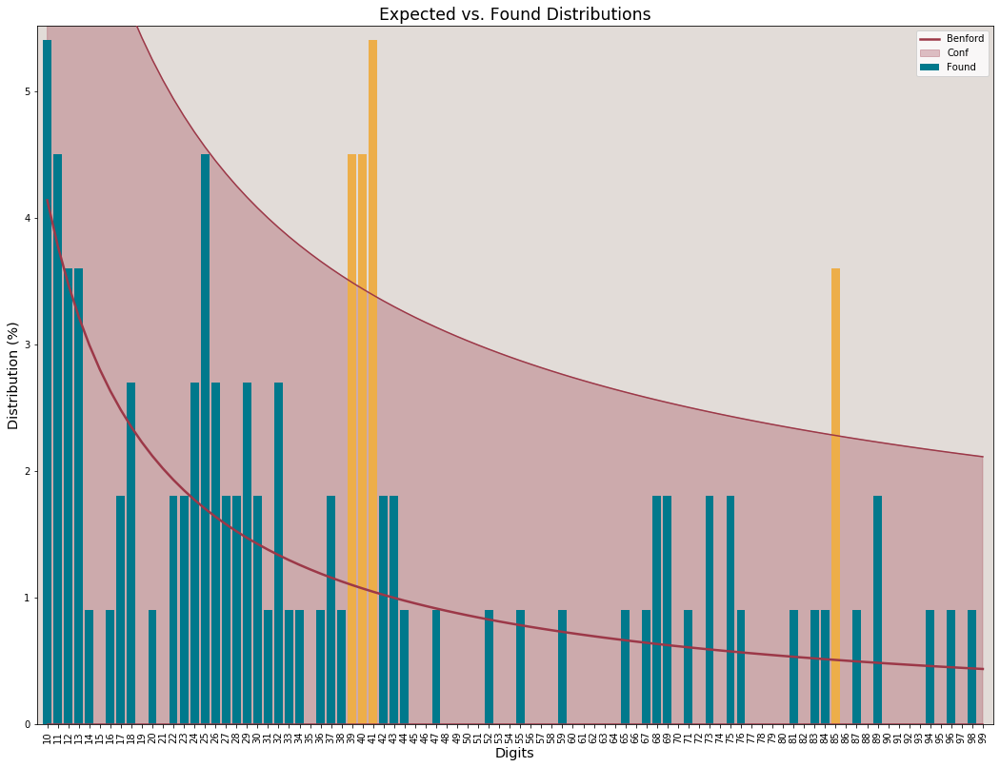



 #################  COUNTRY:  El Salvador  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 111 registries.
Sec_Dig
0    0.126126
1    0.126126
2    0.108108
3    0.108108
4    0.072072
5    0.117117
6    0.063063
7    0.081081
8    0.081081
9    0.117117
Name: Found, dtype: float64

Test performed on 111 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.015004
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.1606.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0321.
Critical K-S for this series: 0.1291


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


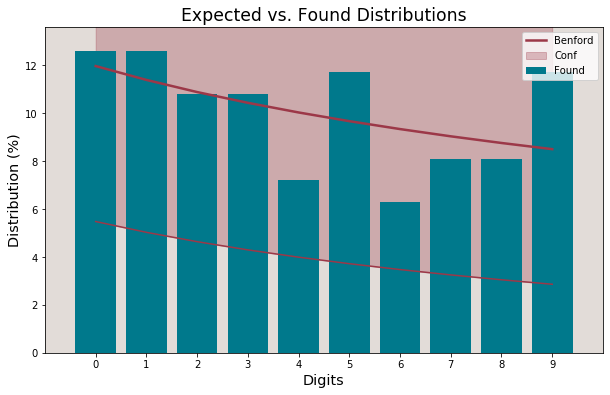

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Finland  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 115 registries.
First_1_Dig
1    0.417391
2    0.165217
3    0.052174
4    0.043478
5    0.078261
6    0.052174
7    0.069565
8    0.060870
9    0.060870
Name: Found, dtype: float64

Test performed on 115 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.417391  2.618696
Mean Absolute Deviation: 0.033947
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 14.9391.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1164.
Critical K-S for this series: 0.126

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


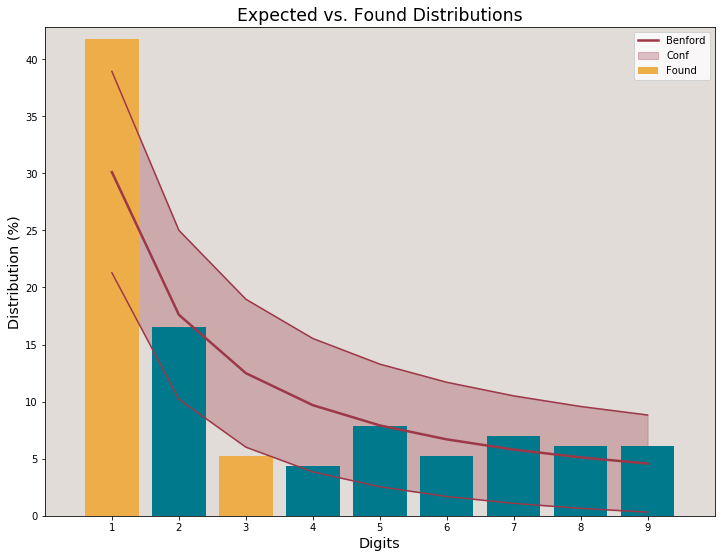



 #################  COUNTRY:  Finland  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 115 registries.
First_2_Dig
10    0.069565
11    0.086957
12    0.026087
13    0.034783
14    0.034783
15    0.017391
16    0.043478
17    0.043478
18    0.008696
19    0.052174
20    0.034783
21    0.000000
22    0.026087
23    0.008696
24    0.034783
25    0.000000
26    0.017391
27    0.008696
28    0.017391
29    0.017391
30    0.008696
31    0.017391
32    0.000000
33    0.026087
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
44    0.017391
45    0.017391
46    0.000000
47    0.008696
48    0.000000
49    0.000000
50    0.034783
51    0.017391
52    0.000000
53    0.000000
54    0.000000
55    0.000000
56    0.008696
57    0.008696
58    0.008696
59    0.000000
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


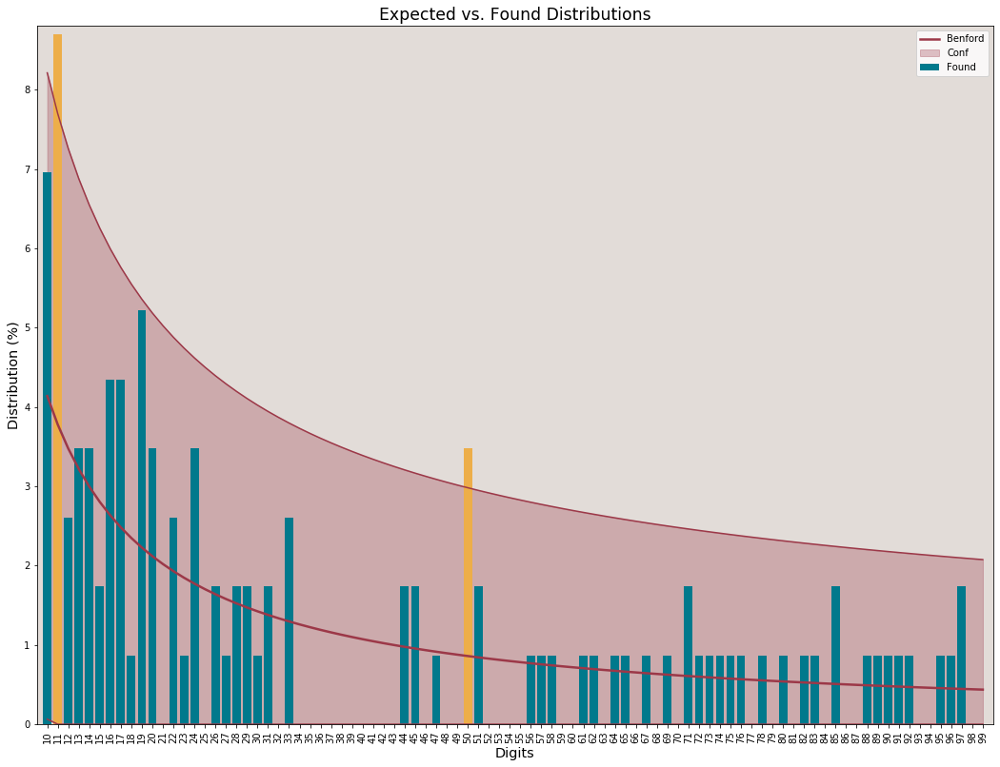



 #################  COUNTRY:  Finland  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 115 registries.
Sec_Dig
0    0.165217
1    0.156522
2    0.086957
3    0.086957
4    0.104348
5    0.078261
6    0.086957
7    0.095652
8    0.052174
9    0.086957
Name: Found, dtype: float64

Test performed on 115 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.019894
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.8249.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0882.
Critical K-S for this series: 0.1268


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


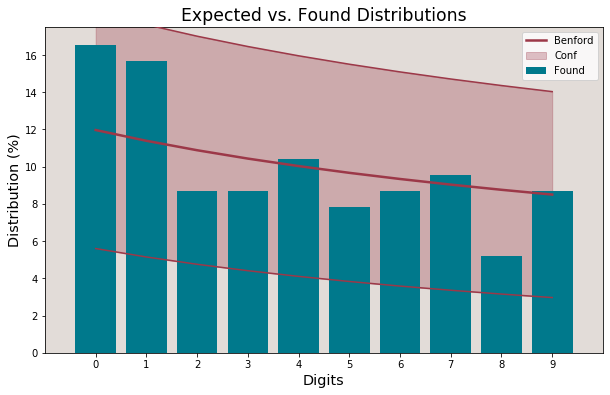

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  France  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_1_Dig
1    0.263514
2    0.141892
3    0.141892
4    0.162162
5    0.108108
6    0.067568
7    0.060811
8    0.027027
9    0.027027
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
4             0.09691  0.162162  2.544413
Mean Absolute Deviation: 0.025460
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 12.9219.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0717.
Critical K-S for this series: 0.1118

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


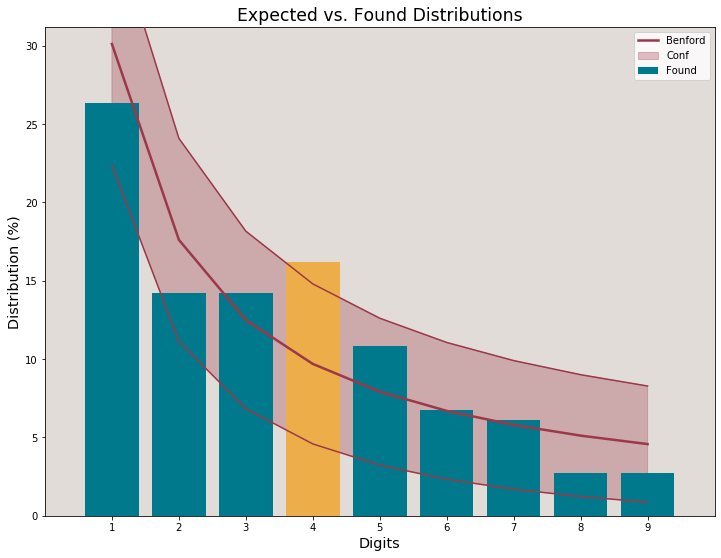



 #################  COUNTRY:  France  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_2_Dig
10    0.033784
11    0.033784
12    0.013514
13    0.040541
14    0.006757
15    0.027027
16    0.047297
17    0.006757
18    0.033784
19    0.020270
20    0.020270
21    0.020270
22    0.006757
23    0.000000
24    0.013514
25    0.027027
26    0.027027
27    0.006757
28    0.013514
29    0.006757
30    0.013514
31    0.013514
32    0.000000
33    0.020270
34    0.020270
35    0.013514
36    0.000000
37    0.027027
38    0.020270
39    0.013514
40    0.027027
41    0.020270
42    0.020270
43    0.027027
44    0.000000
45    0.013514
46    0.020270
47    0.006757
48    0.013514
49    0.013514
50    0.006757
51    0.006757
52    0.020270
53    0.006757
54    0.020270
55    0.000000
56    0.006757
57    0.013514
58    0.013514
59    0.013514
60    0.006757
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


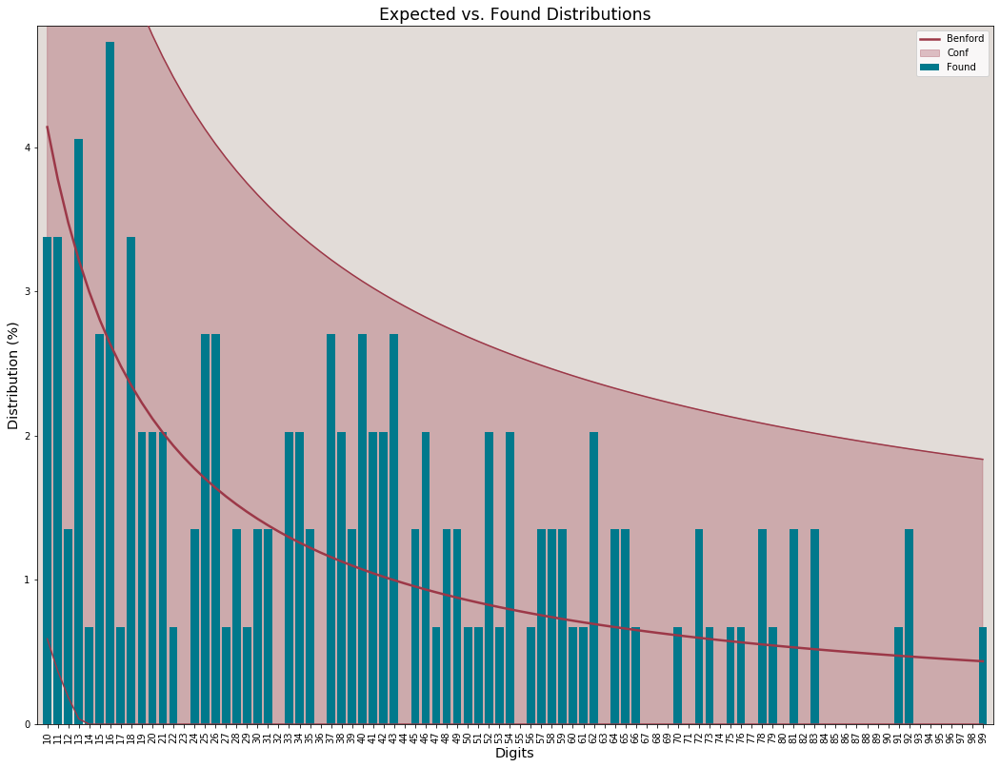



 #################  COUNTRY:  France  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
Sec_Dig
0    0.114865
1    0.121622
2    0.108108
3    0.114865
4    0.074324
5    0.101351
6    0.114865
7    0.060811
8    0.108108
9    0.081081
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.012994
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.1952.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0166.
Critical K-S for this series: 0.1118


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


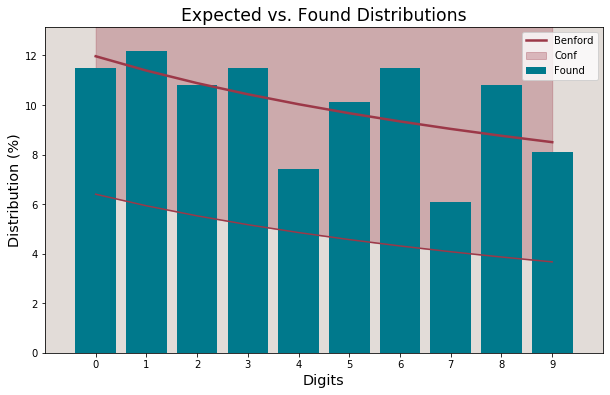

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Germany  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 165 registries.
First_1_Dig
1    0.157576
2    0.181818
3    0.169697
4    0.127273
5    0.139394
6    0.103030
7    0.060606
8    0.024242
9    0.036364
Name: Found, dtype: float64

Test performed on 165 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
5            0.079181  0.139394  2.720233
Mean Absolute Deviation: 0.039946
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 28.9634.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1435.
Critical K-S for this series: 0.105

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


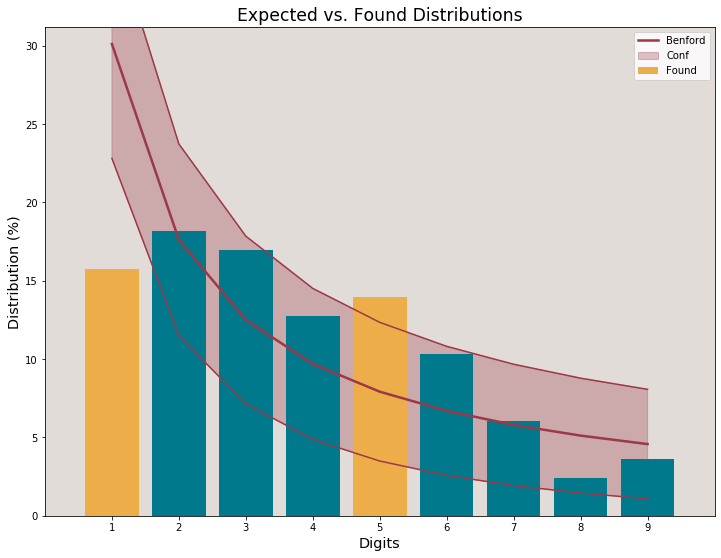



 #################  COUNTRY:  Germany  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 165 registries.
First_2_Dig
10    0.036364
11    0.036364
12    0.012121
13    0.012121
14    0.006061
15    0.012121
16    0.012121
17    0.018182
18    0.006061
19    0.006061
20    0.018182
21    0.018182
22    0.006061
23    0.030303
24    0.036364
25    0.018182
26    0.012121
27    0.006061
28    0.036364
29    0.000000
30    0.012121
31    0.006061
32    0.006061
33    0.018182
34    0.030303
35    0.024242
36    0.018182
37    0.012121
38    0.006061
39    0.036364
40    0.018182
41    0.012121
42    0.006061
43    0.018182
44    0.018182
45    0.006061
46    0.018182
47    0.012121
48    0.000000
49    0.018182
50    0.024242
51    0.006061
52    0.012121
53    0.018182
54    0.012121
55    0.018182
56    0.006061
57    0.006061
58    0.024242
59    0.012121
60    0.012121


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


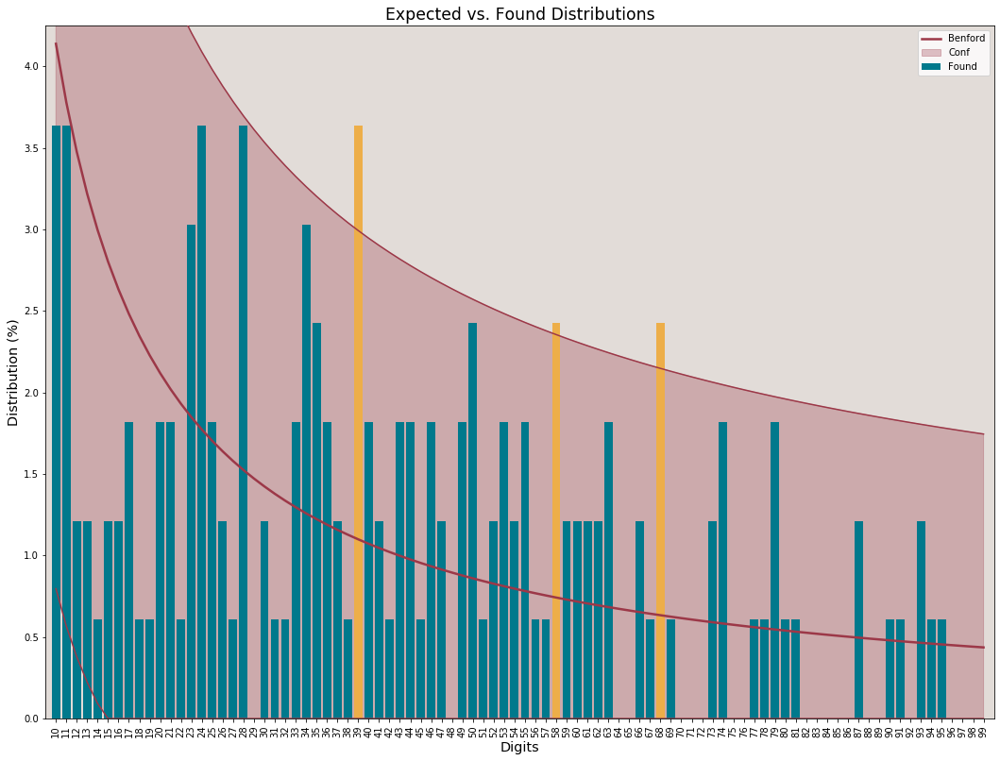



 #################  COUNTRY:  Germany  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 165 registries.
Sec_Dig
0    0.133333
1    0.103030
2    0.054545
3    0.139394
4    0.127273
5    0.084848
6    0.078788
7    0.078788
8    0.103030
9    0.096970
Name: Found, dtype: float64

Test performed on 165 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020623
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 9.6227.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0515.
Critical K-S for this series: 0.1059


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


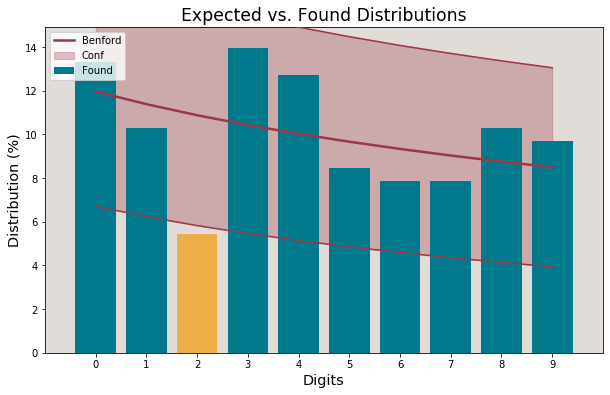

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Greece  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 127 registries.
First_1_Dig
1    0.354331
2    0.251969
3    0.110236
4    0.047244
5    0.086614
6    0.039370
7    0.078740
8    0.000000
9    0.031496
Name: Found, dtype: float64

Test performed on 127 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.251969  2.128459
Mean Absolute Deviation: 0.034969
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 18.3381.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1292.
Critical K-S for this series: 0.1207

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


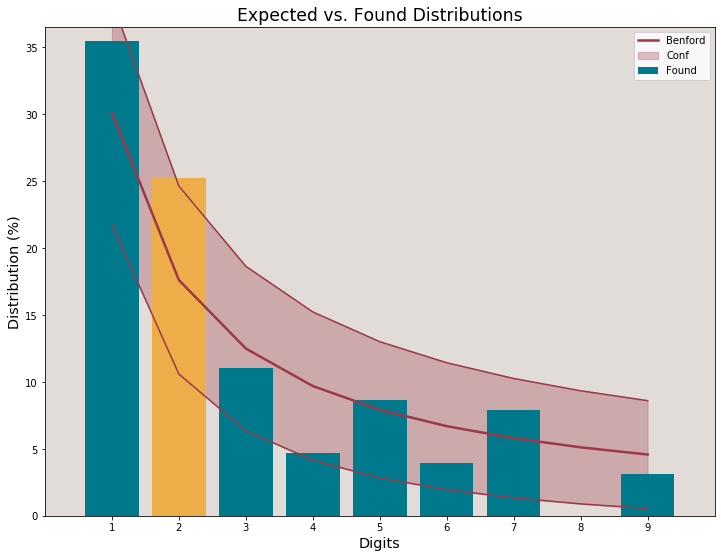



 #################  COUNTRY:  Greece  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 127 registries.
First_2_Dig
10    0.094488
11    0.047244
12    0.000000
13    0.039370
14    0.023622
15    0.078740
16    0.015748
17    0.007874
18    0.007874
19    0.039370
20    0.039370
21    0.031496
22    0.023622
23    0.023622
24    0.015748
25    0.031496
26    0.007874
27    0.031496
28    0.023622
29    0.023622
30    0.000000
31    0.039370
32    0.000000
33    0.023622
34    0.015748
35    0.015748
36    0.007874
37    0.000000
38    0.007874
39    0.000000
40    0.015748
41    0.000000
42    0.007874
43    0.007874
44    0.000000
45    0.000000
46    0.007874
47    0.000000
48    0.007874
49    0.000000
50    0.007874
51    0.000000
52    0.023622
53    0.000000
54    0.000000
55    0.015748
56    0.015748
57    0.023622
58    0.000000
59    0.000000
60    0.015748
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


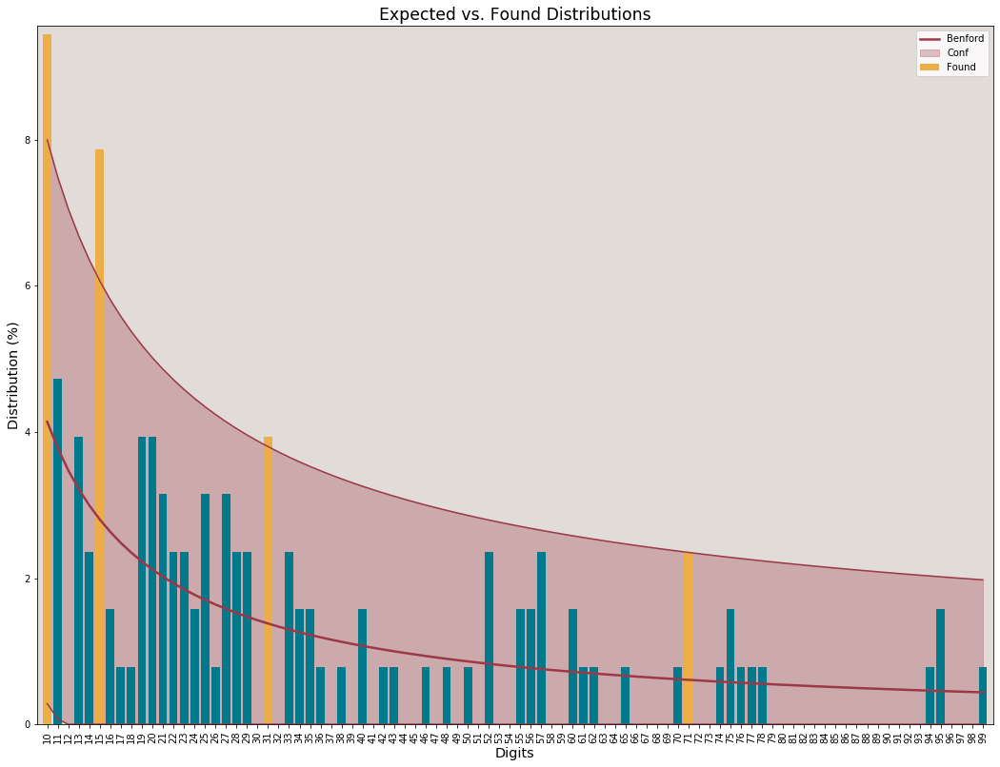



 #################  COUNTRY:  Greece  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 127 registries.
Sec_Dig
0    0.181102
1    0.149606
2    0.062992
3    0.094488
4    0.070866
5    0.181102
6    0.062992
7    0.070866
8    0.055118
9    0.070866
Name: Found, dtype: float64

Test performed on 127 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
5        0.096677  0.181102  3.069376
0        0.119679  0.181102  1.995881
Mean Absolute Deviation: 0.036313
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 22.0707.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0971.
Critical K-S for this series: 0.1207


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


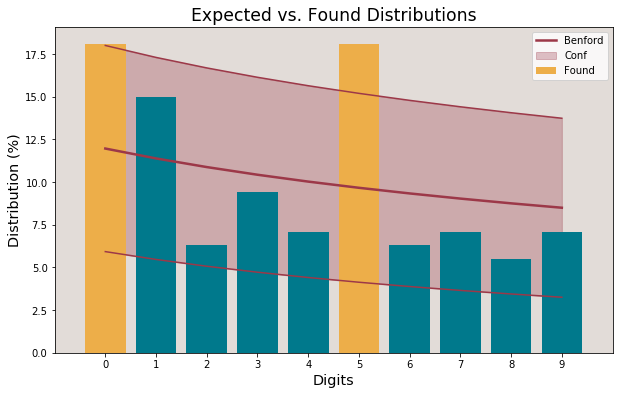

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Guatemala  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 120 registries.
First_1_Dig
1    0.275000
2    0.166667
3    0.175000
4    0.100000
5    0.041667
6    0.075000
7    0.033333
8    0.075000
9    0.058333
Name: Found, dtype: float64

Test performed on 120 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021695
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 8.0057.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0364.
Critical K-S for this series: 0.1242


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


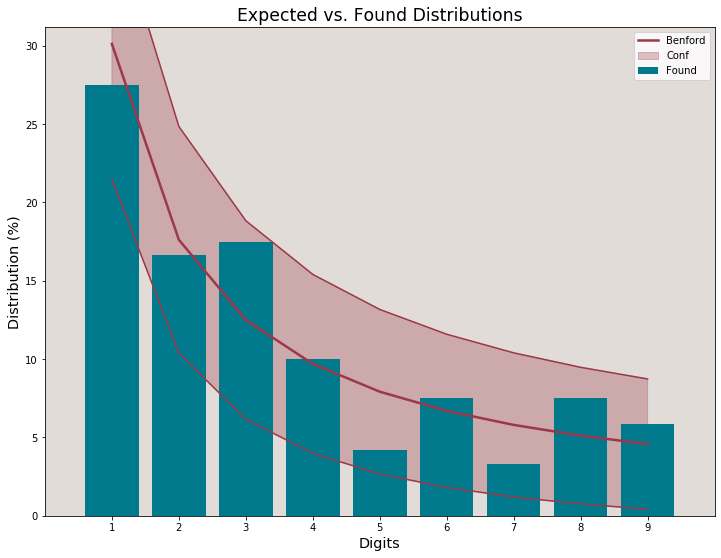



 #################  COUNTRY:  Guatemala  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 120 registries.
First_2_Dig
10    0.025000
11    0.058333
12    0.066667
13    0.033333
14    0.025000
15    0.008333
16    0.016667
17    0.016667
18    0.008333
19    0.016667
20    0.016667
21    0.008333
22    0.016667
23    0.016667
24    0.025000
25    0.025000
26    0.016667
27    0.033333
28    0.008333
29    0.000000
30    0.016667
31    0.008333
32    0.016667
33    0.025000
34    0.025000
35    0.025000
36    0.016667
37    0.008333
38    0.008333
39    0.025000
40    0.000000
41    0.008333
42    0.033333
43    0.016667
44    0.016667
45    0.008333
46    0.008333
47    0.008333
48    0.000000
49    0.000000
50    0.008333
51    0.000000
52    0.000000
53    0.008333
54    0.008333
55    0.000000
56    0.016667
57    0.000000
58    0.000000
59    0.000000
60    0.00000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


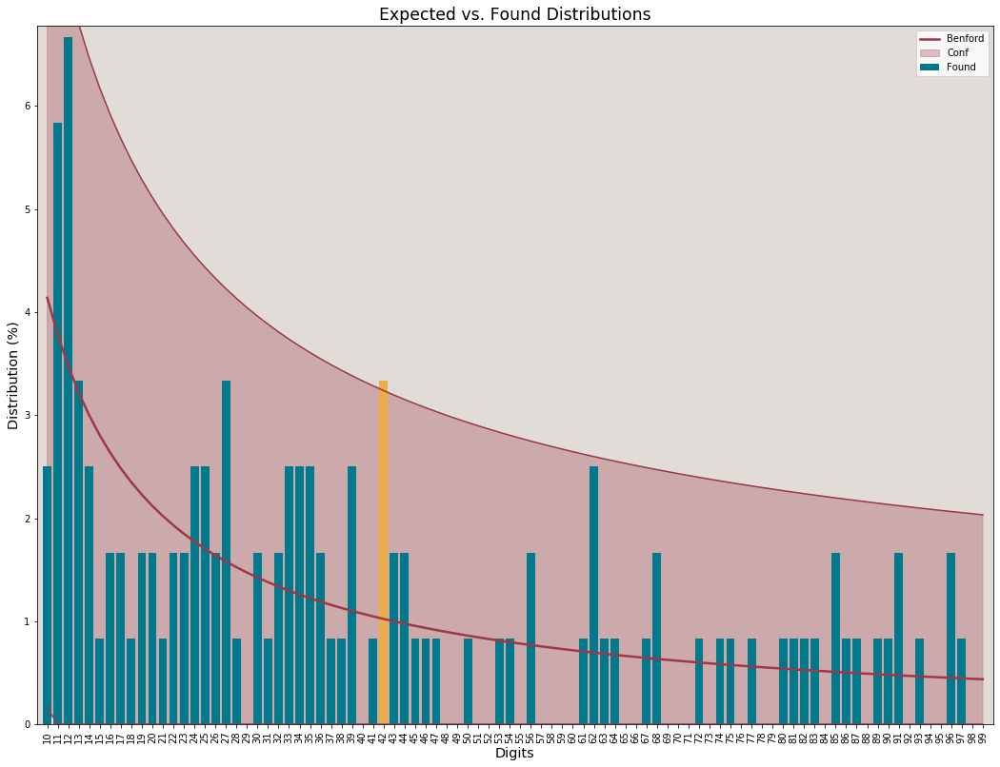



 #################  COUNTRY:  Guatemala  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 120 registries.
Sec_Dig
0    0.083333
1    0.116667
2    0.175000
3    0.125000
4    0.116667
5    0.091667
6    0.100000
7    0.100000
8    0.041667
9    0.050000
Name: Found, dtype: float64

Test performed on 120 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected  Found   Z_score
Sec_Dig                           
2        0.108821  0.175  2.181351
Mean Absolute Deviation: 0.024451
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 11.8016.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0809.
Critical K-S for this series: 0.1242


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


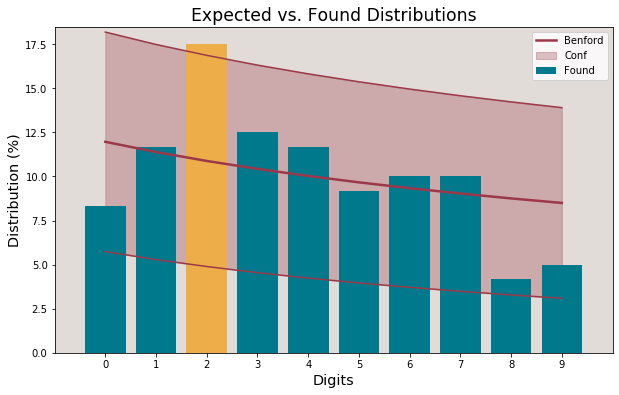

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Guinea  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 111 registries.
First_1_Dig
1    0.243243
2    0.054054
3    0.063063
4    0.180180
5    0.126126
6    0.135135
7    0.072072
8    0.063063
9    0.063063
Name: Found, dtype: float64

Test performed on 111 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
4            0.096910  0.180180  2.805102
6            0.066947  0.135135  2.684557
Mean Absolute Deviation: 0.053711
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 34.1753.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


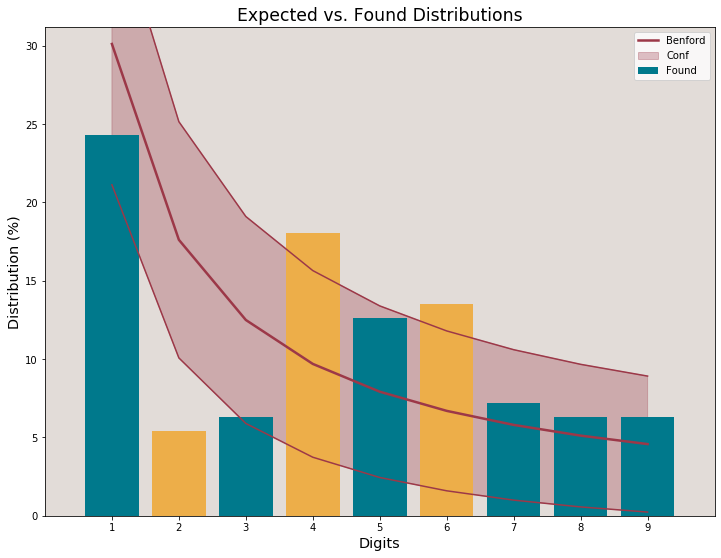



 #################  COUNTRY:  Guinea  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 111 registries.
First_2_Dig
10    0.081081
11    0.036036
12    0.027027
13    0.027027
14    0.018018
15    0.009009
16    0.018018
17    0.009009
18    0.018018
19    0.000000
20    0.018018
21    0.000000
22    0.009009
23    0.000000
24    0.000000
25    0.000000
26    0.009009
27    0.000000
28    0.009009
29    0.009009
30    0.009009
31    0.009009
32    0.000000
33    0.009009
34    0.009009
35    0.000000
36    0.000000
37    0.009009
38    0.009009
39    0.009009
40    0.027027
41    0.009009
42    0.036036
43    0.009009
44    0.009009
45    0.009009
46    0.018018
47    0.018018
48    0.018018
49    0.027027
50    0.009009
51    0.018018
52    0.000000
53    0.009009
54    0.009009
55    0.009009
56    0.009009
57    0.018018
58    0.018018
59    0.027027
60    0.009009
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


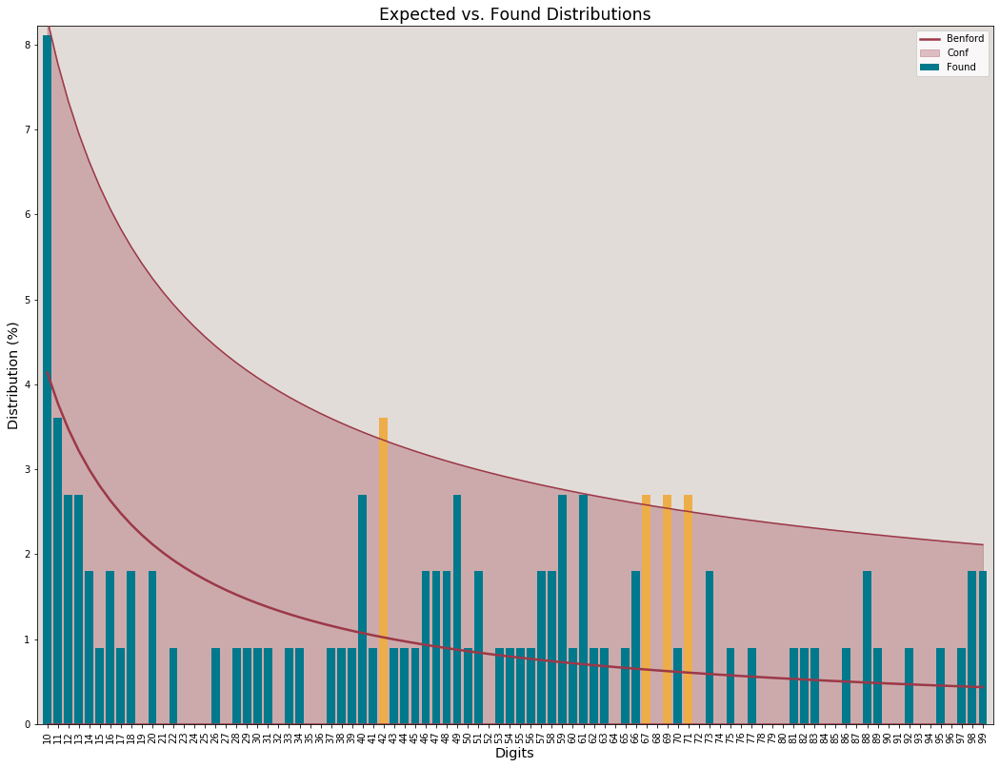



 #################  COUNTRY:  Guinea  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 111 registries.
Sec_Dig
0    0.162162
1    0.135135
2    0.099099
3    0.090090
4    0.045045
5    0.054054
6    0.081081
7    0.099099
8    0.108108
9    0.126126
Name: Found, dtype: float64

Test performed on 111 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.026828
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.9088.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0704.
Critical K-S for this series: 0.1291


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


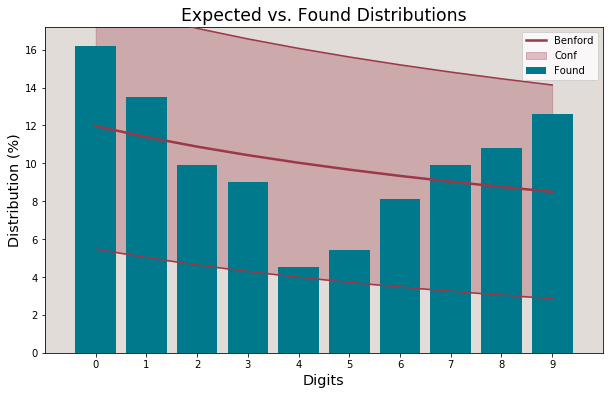

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Honduras  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 128 registries.
First_1_Dig
1    0.296875
2    0.085938
3    0.101562
4    0.125000
5    0.093750
6    0.070312
7    0.101562
8    0.070312
9    0.054688
Name: Found, dtype: float64

Test performed on 128 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.026152
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 13.2139.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1177.
Critical K-S for this series: 0.1202


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


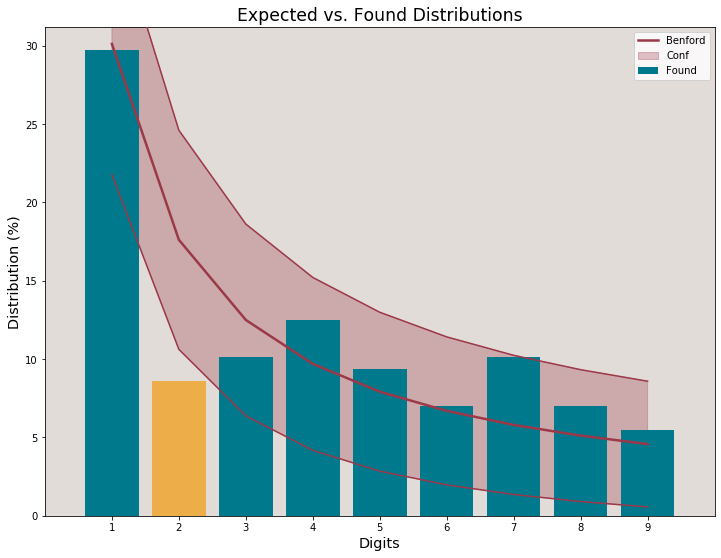



 #################  COUNTRY:  Honduras  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 128 registries.
First_2_Dig
10    0.078125
11    0.015625
12    0.031250
13    0.007812
14    0.023438
15    0.046875
16    0.046875
17    0.023438
18    0.007812
19    0.015625
20    0.015625
21    0.007812
22    0.007812
23    0.015625
24    0.000000
25    0.000000
26    0.007812
27    0.007812
28    0.015625
29    0.007812
30    0.015625
31    0.015625
32    0.023438
33    0.015625
34    0.015625
35    0.000000
36    0.007812
37    0.000000
38    0.000000
39    0.007812
40    0.015625
41    0.000000
42    0.015625
43    0.000000
44    0.007812
45    0.015625
46    0.015625
47    0.023438
48    0.031250
49    0.000000
50    0.015625
51    0.023438
52    0.007812
53    0.007812
54    0.000000
55    0.007812
56    0.000000
57    0.000000
58    0.015625
59    0.015625
60    0.000000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


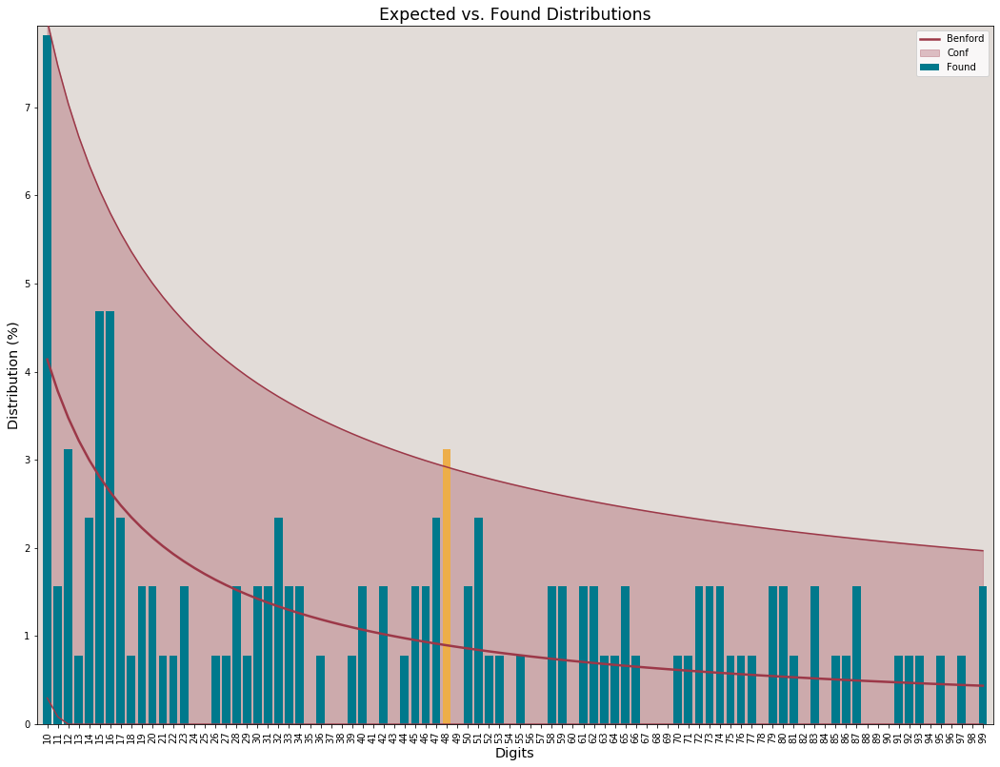



 #################  COUNTRY:  Honduras  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 128 registries.
Sec_Dig
0    0.164062
1    0.101562
2    0.125000
3    0.093750
4    0.070312
5    0.109375
6    0.101562
7    0.085938
8    0.070312
9    0.078125
Name: Found, dtype: float64

Test performed on 128 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.016289
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.7104.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0482.
Critical K-S for this series: 0.1202


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


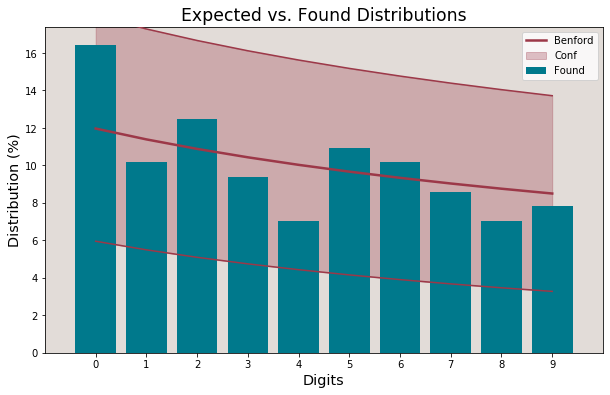

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Hungary  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 110 registries.
First_1_Dig
1    0.327273
2    0.190909
3    0.163636
4    0.090909
5    0.063636
6    0.054545
7    0.063636
8    0.036364
9    0.009091
Name: Found, dtype: float64

Test performed on 110 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.018978
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 6.0993.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0798.
Critical K-S for this series: 0.1297


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


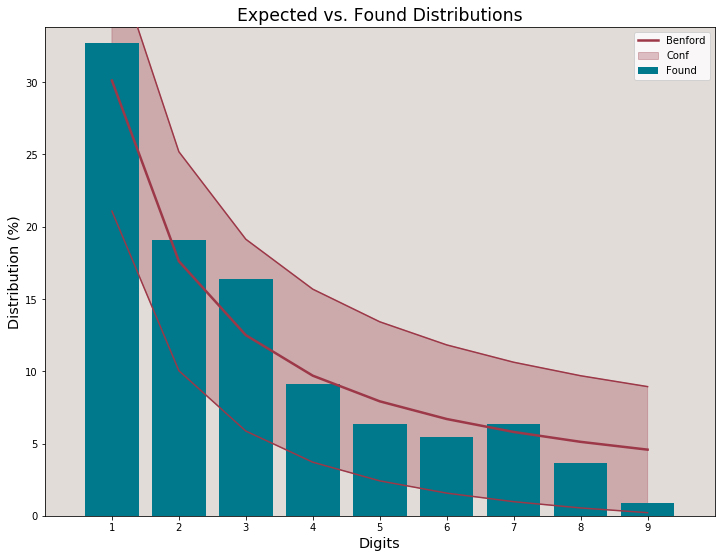



 #################  COUNTRY:  Hungary  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 110 registries.
First_2_Dig
10    0.045455
11    0.090909
12    0.036364
13    0.018182
14    0.036364
15    0.018182
16    0.036364
17    0.000000
18    0.027273
19    0.018182
20    0.009091
21    0.045455
22    0.018182
23    0.027273
24    0.009091
25    0.009091
26    0.027273
27    0.000000
28    0.036364
29    0.009091
30    0.009091
31    0.000000
32    0.009091
33    0.018182
34    0.000000
35    0.027273
36    0.018182
37    0.027273
38    0.009091
39    0.045455
40    0.000000
41    0.000000
42    0.009091
43    0.027273
44    0.009091
45    0.018182
46    0.009091
47    0.000000
48    0.018182
49    0.000000
50    0.009091
51    0.000000
52    0.000000
53    0.000000
54    0.009091
55    0.018182
56    0.018182
57    0.009091
58    0.000000
59    0.000000
60    0.018182


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


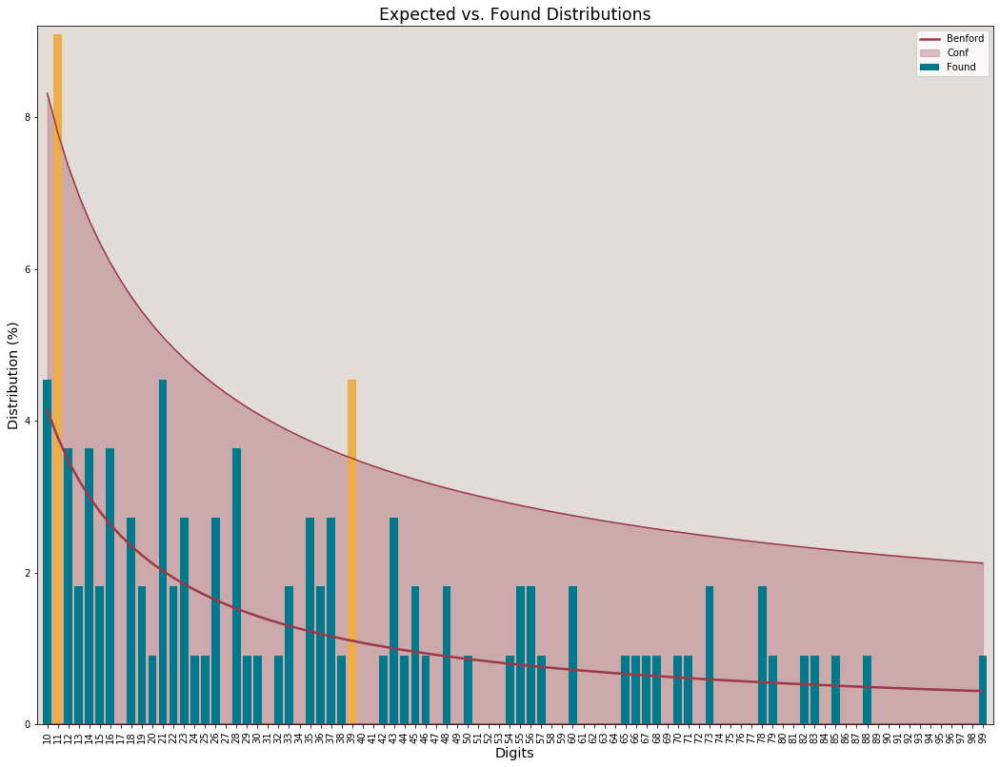



 #################  COUNTRY:  Hungary  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 110 registries.
Sec_Dig
0    0.100000
1    0.145455
2    0.081818
3    0.118182
4    0.063636
5    0.109091
6    0.118182
7    0.045455
8    0.127273
9    0.090909
Name: Found, dtype: float64

Test performed on 110 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.025650
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 9.1121.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0456.
Critical K-S for this series: 0.1297


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


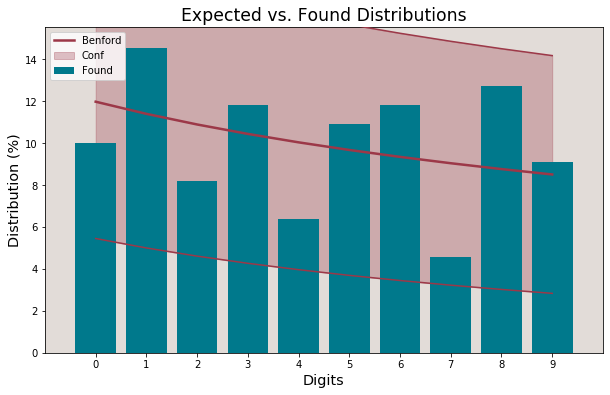

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  India  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_1_Dig
1    0.300000
2    0.140000
3    0.126667
4    0.086667
5    0.093333
6    0.093333
7    0.040000
8    0.040000
9    0.080000
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.017002
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 8.2613.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0456.
Critical K-S for this series: 0.1110


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


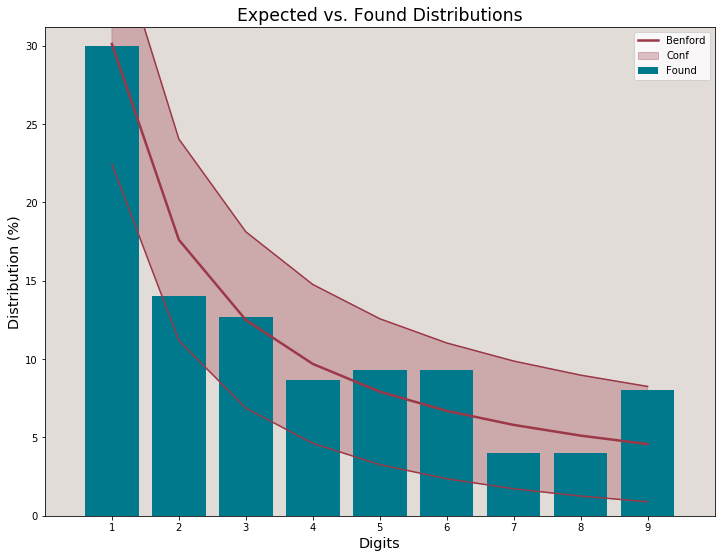



 #################  COUNTRY:  India  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_2_Dig
10    0.053333
11    0.026667
12    0.020000
13    0.033333
14    0.046667
15    0.026667
16    0.013333
17    0.013333
18    0.033333
19    0.033333
20    0.006667
21    0.000000
22    0.033333
23    0.006667
24    0.020000
25    0.006667
26    0.020000
27    0.006667
28    0.026667
29    0.013333
30    0.000000
31    0.000000
32    0.020000
33    0.020000
34    0.013333
35    0.020000
36    0.006667
37    0.020000
38    0.006667
39    0.020000
40    0.013333
41    0.000000
42    0.006667
43    0.000000
44    0.000000
45    0.006667
46    0.000000
47    0.013333
48    0.020000
49    0.026667
50    0.000000
51    0.000000
52    0.033333
53    0.006667
54    0.013333
55    0.006667
56    0.026667
57    0.006667
58    0.000000
59    0.000000
60    0.013333
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


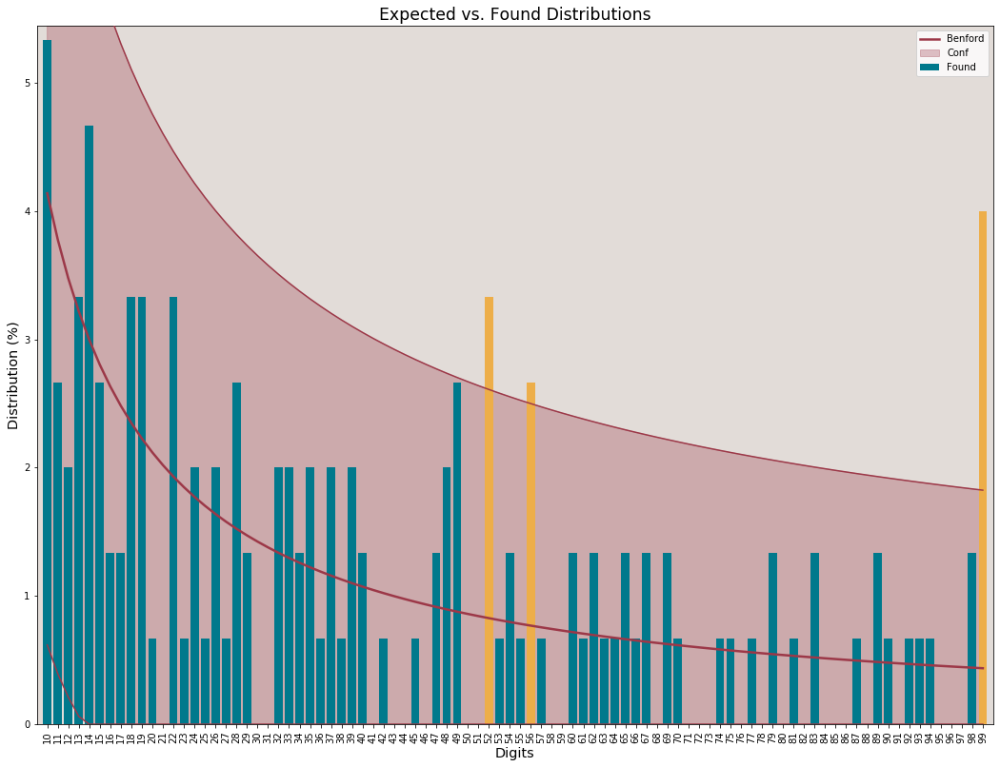



 #################  COUNTRY:  India  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
Sec_Dig
0    0.100000
1    0.040000
2    0.133333
3    0.093333
4    0.113333
5    0.086667
6    0.073333
7    0.086667
8    0.100000
9    0.173333
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
9        0.084997  0.173333  3.733053
Mean Absolute Deviation: 0.027661
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 23.7907.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1008.
Critical K-S for this series: 0.1110


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


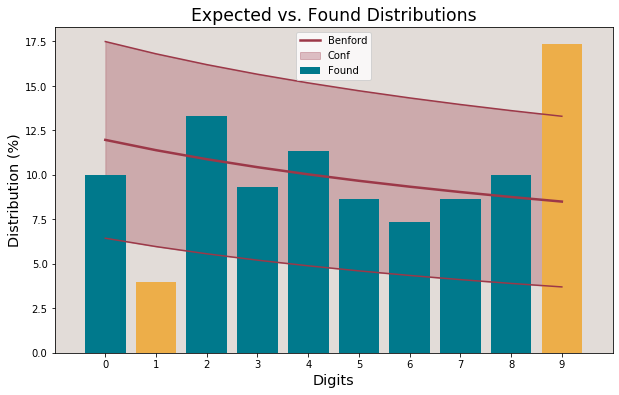

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Indonesia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_1_Dig
1    0.470199
2    0.125828
3    0.125828
4    0.086093
5    0.046358
6    0.072848
7    0.013245
8    0.026490
9    0.033113
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.470199  4.443132
Mean Absolute Deviation: 0.039102
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 26.3747.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1692.
Critical K-S for this series: 0.1

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


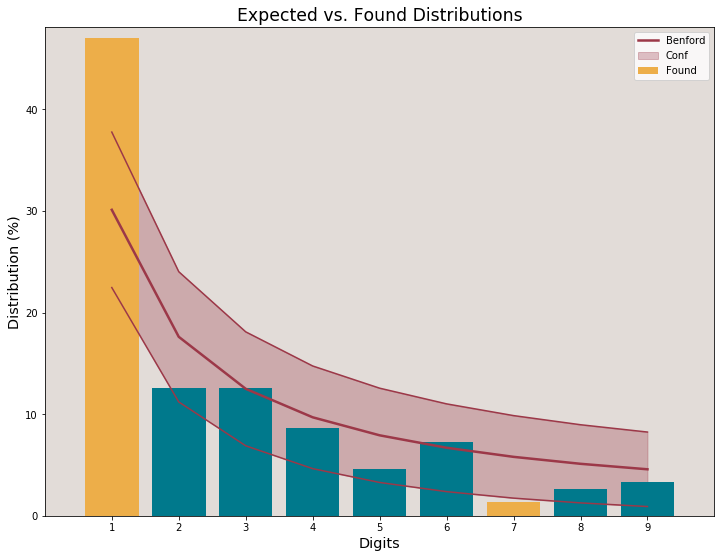



 #################  COUNTRY:  Indonesia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_2_Dig
10    0.079470
11    0.046358
12    0.052980
13    0.039735
14    0.033113
15    0.052980
16    0.059603
17    0.026490
18    0.052980
19    0.026490
20    0.006623
21    0.033113
22    0.006623
23    0.013245
24    0.013245
25    0.000000
26    0.013245
27    0.013245
28    0.013245
29    0.013245
30    0.000000
31    0.006623
32    0.013245
33    0.026490
34    0.013245
35    0.013245
36    0.006623
37    0.006623
38    0.019868
39    0.019868
40    0.006623
41    0.013245
42    0.000000
43    0.013245
44    0.000000
45    0.000000
46    0.006623
47    0.006623
48    0.026490
49    0.013245
50    0.000000
51    0.000000
52    0.013245
53    0.006623
54    0.000000
55    0.013245
56    0.006623
57    0.000000
58    0.006623
59    0.000000
60    0.00662

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


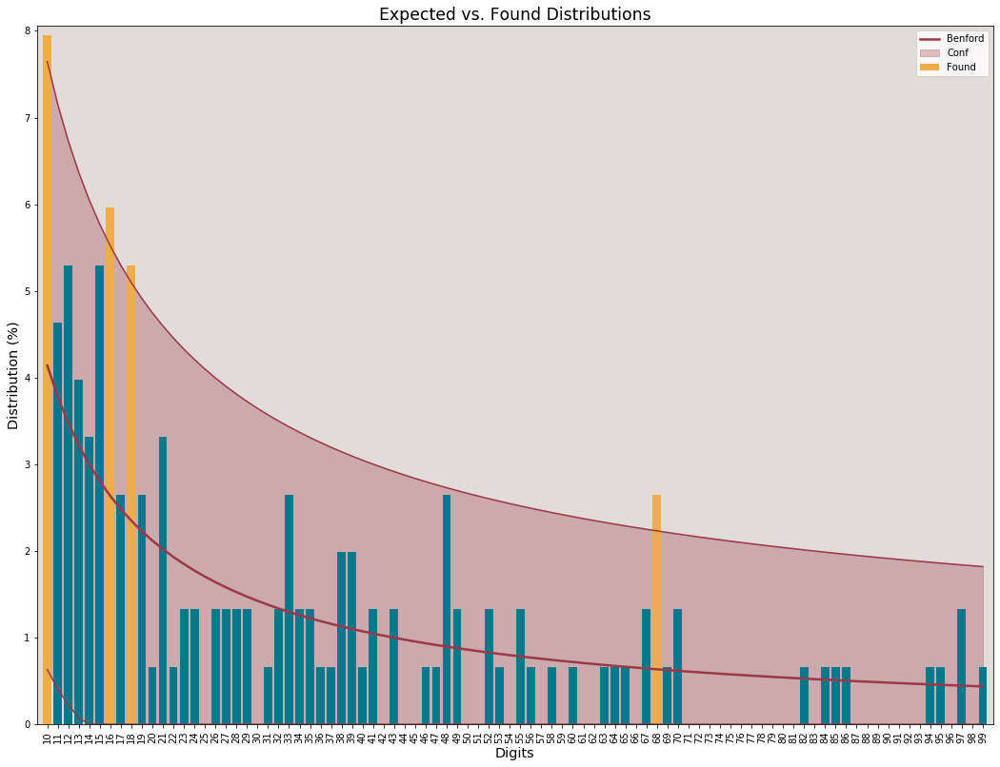



 #################  COUNTRY:  Indonesia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
Sec_Dig
0    0.112583
1    0.099338
2    0.092715
3    0.105960
4    0.079470
5    0.099338
6    0.099338
7    0.079470
8    0.145695
9    0.086093
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
8         0.08757  0.145695  2.382884
Mean Absolute Deviation: 0.013895
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.4561.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0592.
Critical K-S for this series: 0.1107


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


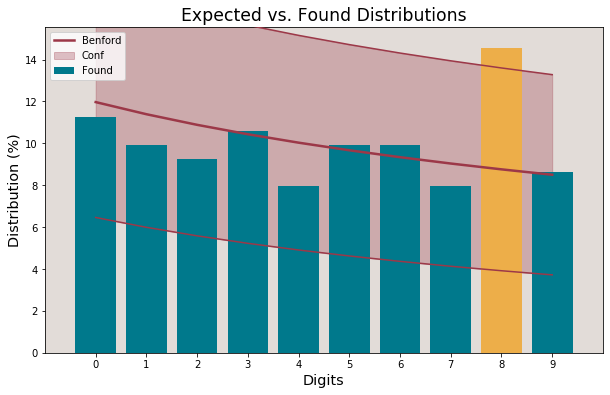

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Iran  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
First_1_Dig
1    0.335294
2    0.529412
3    0.047059
4    0.005882
5    0.029412
6    0.000000
7    0.005882
8    0.017647
9    0.029412
Name: Found, dtype: float64

Test performed on 170 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found    Z_score
First_1_Dig                               
2            0.176091  0.529412  11.993736
Mean Absolute Deviation: 0.086130
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 173.3510.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.3876.
Critical K-S for this series: 0.10

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


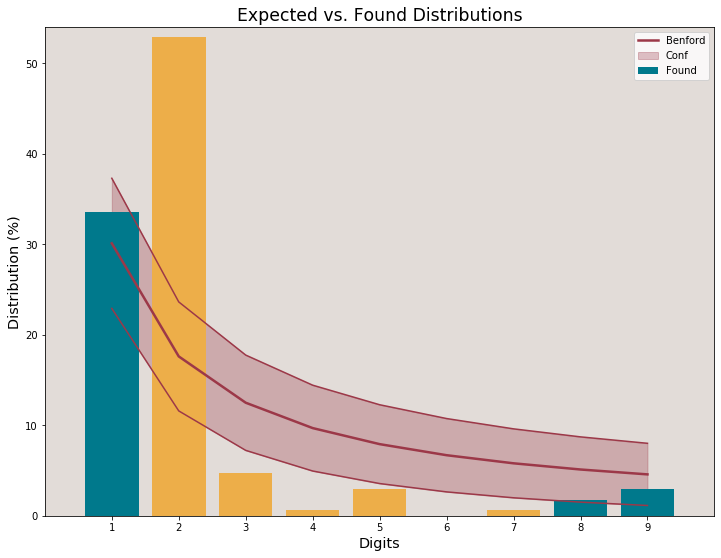



 #################  COUNTRY:  Iran  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
First_2_Dig
10    0.058824
11    0.041176
12    0.041176
13    0.035294
14    0.029412
15    0.029412
16    0.035294
17    0.017647
18    0.029412
19    0.017647
20    0.052941
21    0.041176
22    0.047059
23    0.082353
24    0.076471
25    0.088235
26    0.094118
27    0.005882
28    0.017647
29    0.023529
30    0.005882
31    0.023529
32    0.000000
33    0.000000
34    0.005882
35    0.005882
36    0.000000
37    0.000000
38    0.005882
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
44    0.005882
45    0.000000
46    0.000000
47    0.000000
48    0.000000
49    0.000000
50    0.000000
51    0.000000
52    0.011765
53    0.000000
54    0.000000
55    0.000000
56    0.000000
57    0.000000
58    0.005882
59    0.011765
60    0.000000
61 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


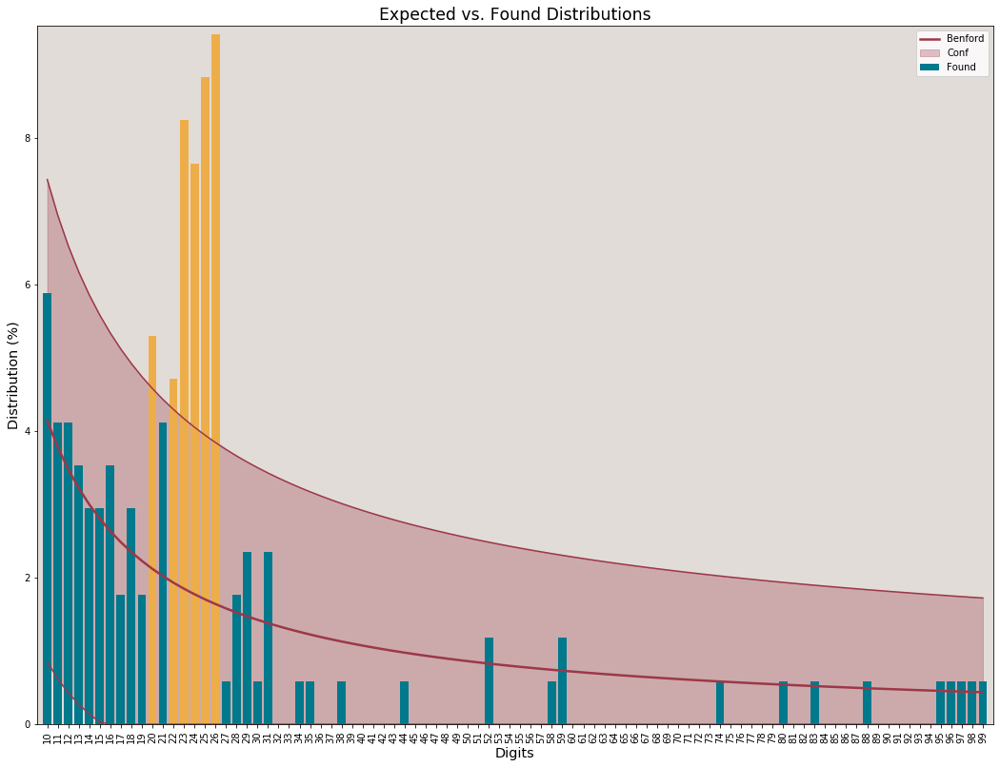



 #################  COUNTRY:  Iran  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
Sec_Dig
0    0.123529
1    0.105882
2    0.100000
3    0.123529
4    0.123529
5    0.129412
6    0.135294
7    0.029412
8    0.070588
9    0.058824
Name: Found, dtype: float64

Test performed on 170 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.024185
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 15.7539.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1041.
Critical K-S for this series: 0.1043


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


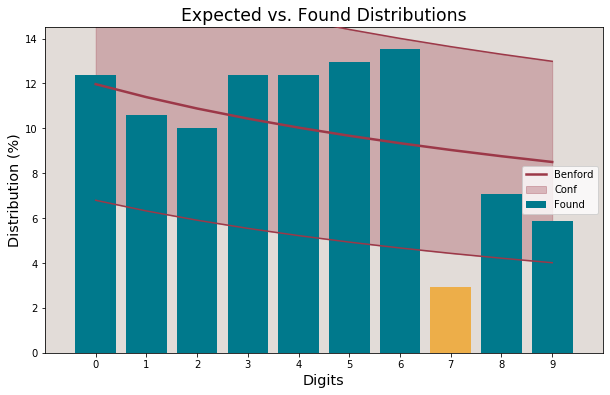

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Iraq  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 143 registries.
First_1_Dig
1    0.279720
2    0.335664
3    0.118881
4    0.048951
5    0.062937
6    0.048951
7    0.055944
8    0.041958
9    0.006993
Name: Found, dtype: float64

Test performed on 143 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.335664  4.900014
Mean Absolute Deviation: 0.035461
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 30.4412.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1383.
Critical K-S for this series: 0.1137


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


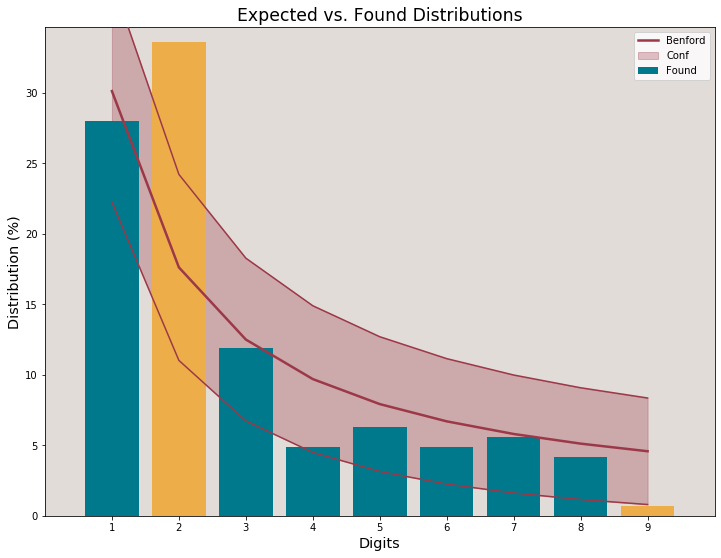



 #################  COUNTRY:  Iraq  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 143 registries.
First_2_Dig
10    0.027972
11    0.055944
12    0.027972
13    0.013986
14    0.013986
15    0.034965
16    0.034965
17    0.020979
18    0.020979
19    0.027972
20    0.041958
21    0.055944
22    0.027972
23    0.034965
24    0.048951
25    0.006993
26    0.013986
27    0.048951
28    0.041958
29    0.013986
30    0.041958
31    0.006993
32    0.006993
33    0.020979
34    0.013986
35    0.006993
36    0.006993
37    0.000000
38    0.000000
39    0.013986
40    0.000000
41    0.013986
42    0.006993
43    0.000000
44    0.000000
45    0.000000
46    0.000000
47    0.006993
48    0.013986
49    0.006993
50    0.020979
51    0.013986
52    0.000000
53    0.000000
54    0.000000
55    0.006993
56    0.000000
57    0.020979
58    0.000000
59    0.000000
60    0.006993
61 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


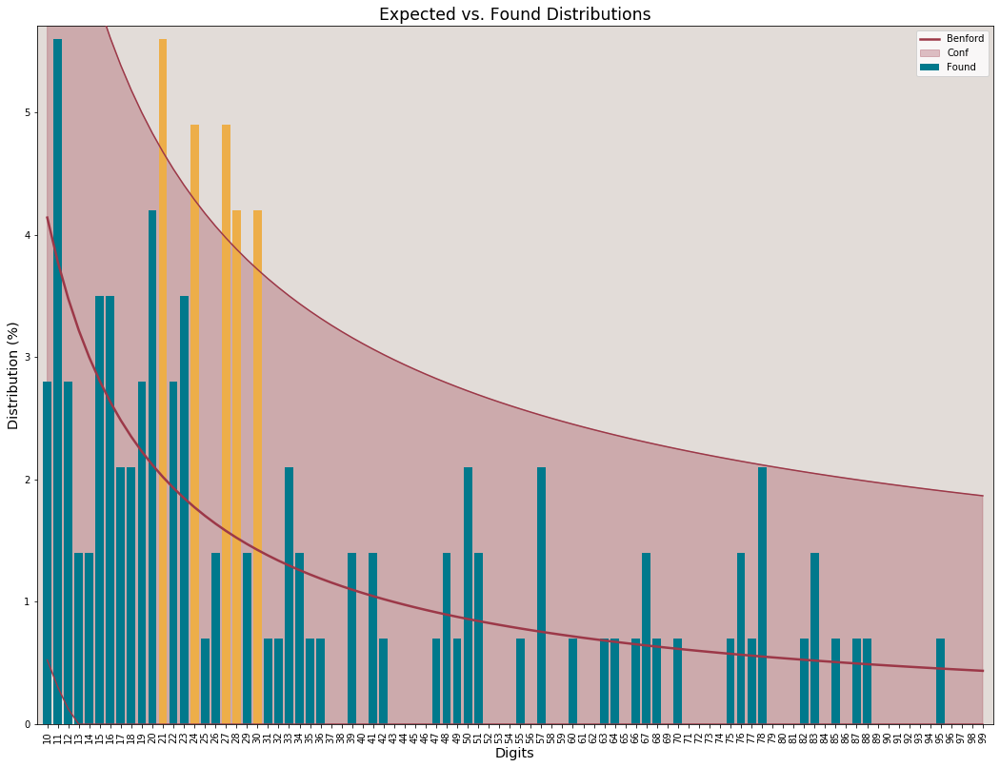



 #################  COUNTRY:  Iraq  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 143 registries.
Sec_Dig
0    0.146853
1    0.146853
2    0.076923
3    0.090909
4    0.083916
5    0.076923
6    0.076923
7    0.125874
8    0.111888
9    0.062937
Name: Found, dtype: float64

Test performed on 143 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.023995
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.9868.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0601.
Critical K-S for this series: 0.1137


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


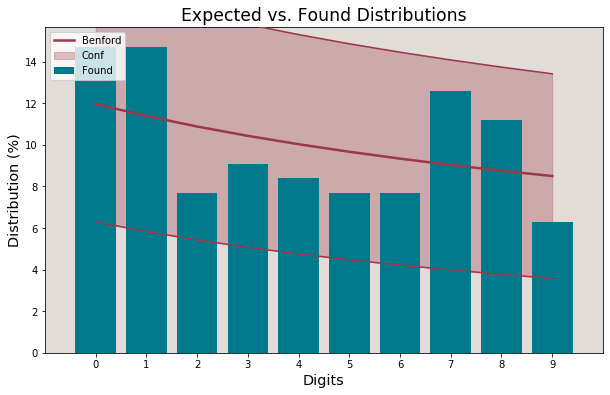

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Ireland  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 131 registries.
First_1_Dig
1    0.274809
2    0.206107
3    0.160305
4    0.083969
5    0.076336
6    0.068702
7    0.068702
8    0.030534
9    0.030534
Name: Found, dtype: float64

Test performed on 131 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.017300
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 4.5380.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0392.
Critical K-S for this series: 0.1188


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


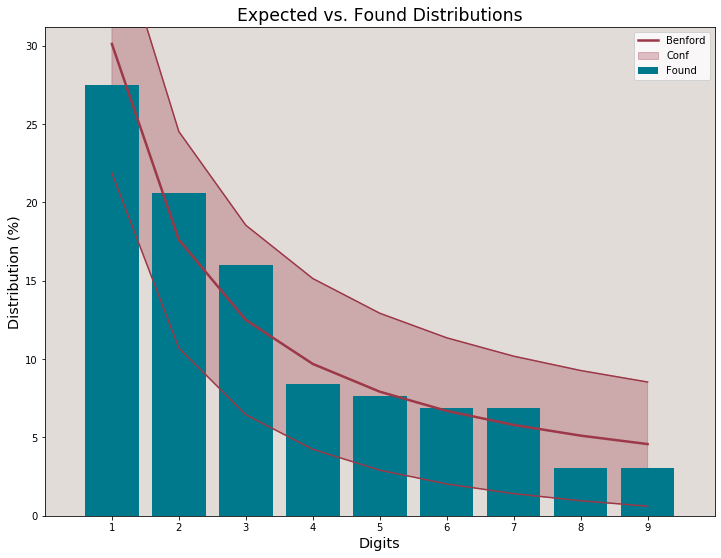



 #################  COUNTRY:  Ireland  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 131 registries.
First_2_Dig
10    0.038168
11    0.038168
12    0.045802
13    0.045802
14    0.015267
15    0.022901
16    0.007634
17    0.022901
18    0.022901
19    0.015267
20    0.030534
21    0.045802
22    0.022901
23    0.038168
24    0.015267
25    0.015267
26    0.015267
27    0.007634
28    0.000000
29    0.015267
30    0.007634
31    0.007634
32    0.022901
33    0.015267
34    0.015267
35    0.015267
36    0.007634
37    0.030534
38    0.038168
39    0.000000
40    0.022901
41    0.000000
42    0.015267
43    0.000000
44    0.007634
45    0.022901
46    0.007634
47    0.000000
48    0.000000
49    0.007634
50    0.015267
51    0.015267
52    0.000000
53    0.015267
54    0.007634
55    0.000000
56    0.000000
57    0.015267
58    0.000000
59    0.007634
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


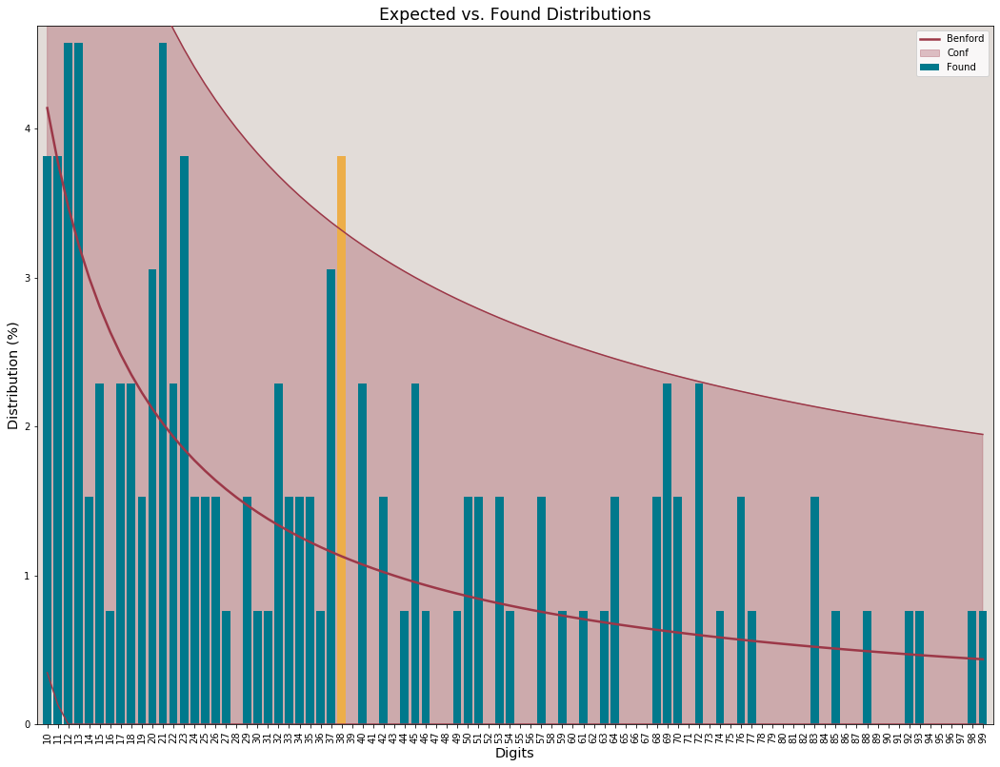



 #################  COUNTRY:  Ireland  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 131 registries.
Sec_Dig
0    0.129771
1    0.114504
2    0.137405
3    0.145038
4    0.083969
5    0.083969
6    0.053435
7    0.083969
8    0.091603
9    0.076336
Name: Found, dtype: float64

Test performed on 131 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.016806
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.1807.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0800.
Critical K-S for this series: 0.1188


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


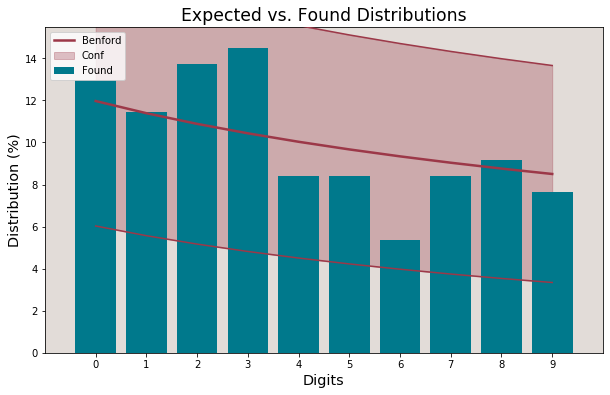

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Israel  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 149 registries.
First_1_Dig
1    0.395973
2    0.221477
3    0.100671
4    0.087248
5    0.060403
6    0.053691
7    0.040268
8    0.026846
9    0.013423
Name: Found, dtype: float64

Test performed on 149 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.395973  2.437221
Mean Absolute Deviation: 0.031184
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 14.0378.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1403.
Critical K-S for this series: 0.1114

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


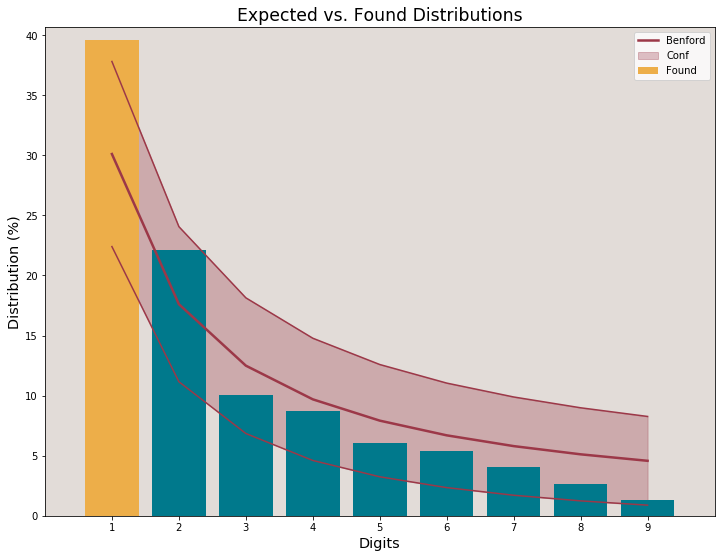



 #################  COUNTRY:  Israel  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 149 registries.
First_2_Dig
10    0.033557
11    0.040268
12    0.060403
13    0.046980
14    0.073826
15    0.013423
16    0.013423
17    0.053691
18    0.033557
19    0.026846
20    0.040268
21    0.013423
22    0.033557
23    0.040268
24    0.020134
25    0.026846
26    0.000000
27    0.000000
28    0.006711
29    0.040268
30    0.020134
31    0.013423
32    0.000000
33    0.013423
34    0.013423
35    0.013423
36    0.013423
37    0.006711
38    0.006711
39    0.000000
40    0.013423
41    0.006711
42    0.000000
43    0.020134
44    0.020134
45    0.006711
46    0.006711
47    0.006711
48    0.006711
49    0.000000
50    0.000000
51    0.006711
52    0.000000
53    0.013423
54    0.000000
55    0.006711
56    0.006711
57    0.000000
58    0.006711
59    0.020134
60    0.000000
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


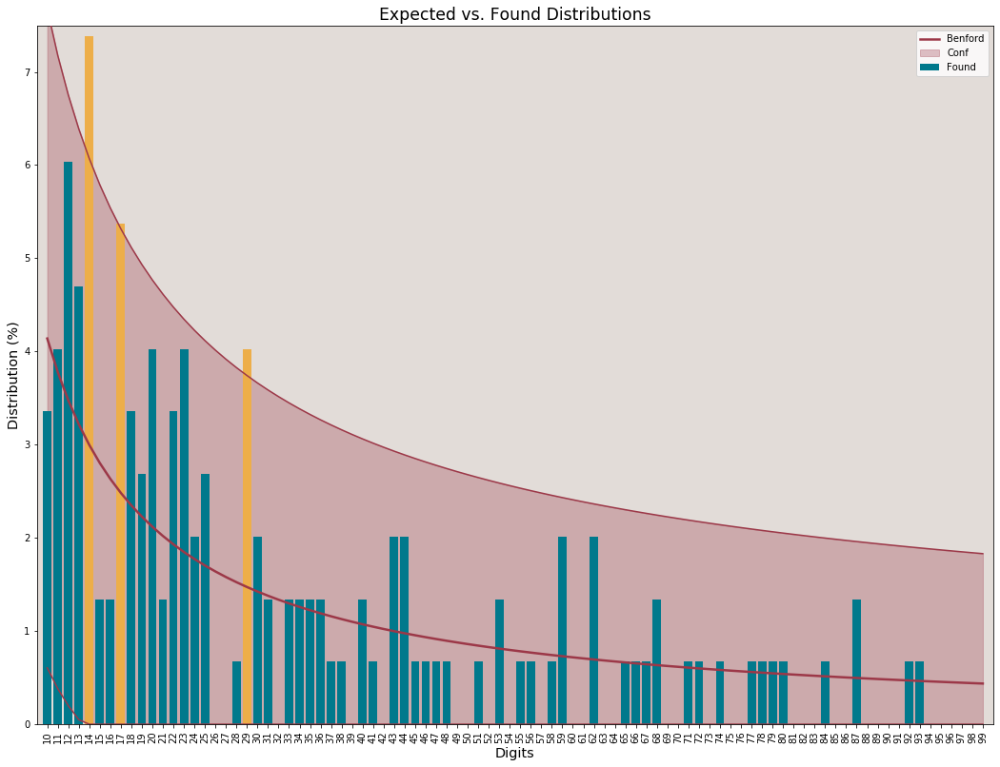



 #################  COUNTRY:  Israel  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 149 registries.
Sec_Dig
0    0.114094
1    0.087248
2    0.127517
3    0.140940
4    0.140940
5    0.073826
6    0.046980
7    0.093960
8    0.080537
9    0.093960
Name: Found, dtype: float64

Test performed on 149 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021701
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.2985.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0637.
Critical K-S for this series: 0.1114


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


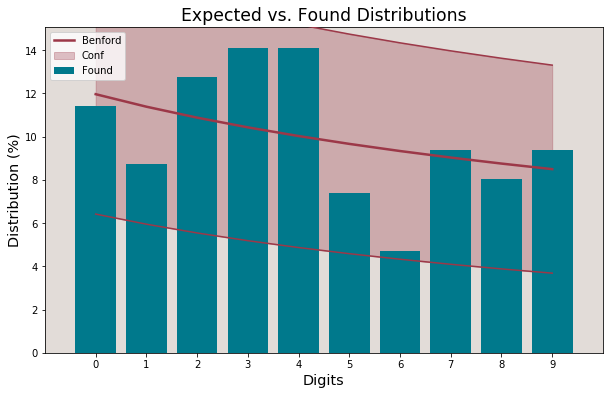

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Italy  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
First_1_Dig
1    0.223529
2    0.264706
3    0.176471
4    0.105882
5    0.105882
6    0.047059
7    0.029412
8    0.023529
9    0.023529
Name: Found, dtype: float64

Test performed on 170 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.264706  2.932664
Mean Absolute Deviation: 0.039071
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 24.0284.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0983.
Critical K-S for this series: 0.1043


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


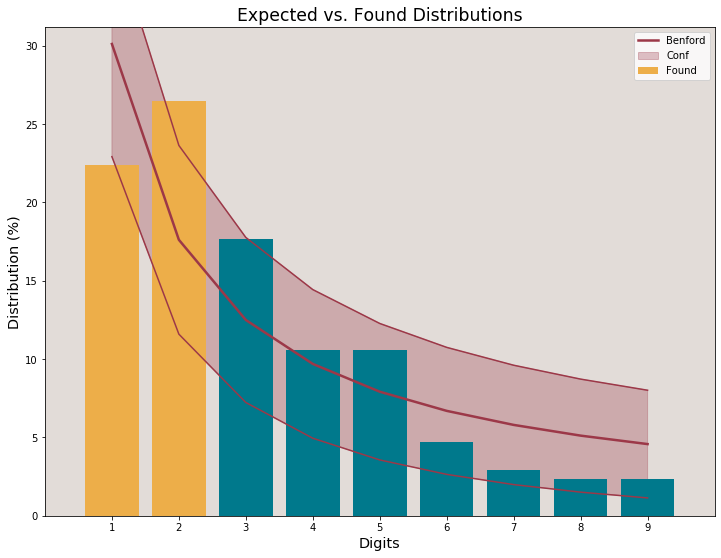



 #################  COUNTRY:  Italy  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
First_2_Dig
10    0.011765
11    0.011765
12    0.023529
13    0.017647
14    0.035294
15    0.005882
16    0.023529
17    0.035294
18    0.017647
19    0.041176
20    0.035294
21    0.017647
22    0.023529
23    0.052941
24    0.011765
25    0.029412
26    0.023529
27    0.023529
28    0.029412
29    0.017647
30    0.035294
31    0.011765
32    0.011765
33    0.017647
34    0.035294
35    0.017647
36    0.000000
37    0.017647
38    0.017647
39    0.011765
40    0.029412
41    0.005882
42    0.011765
43    0.005882
44    0.000000
45    0.011765
46    0.023529
47    0.011765
48    0.005882
49    0.000000
50    0.000000
51    0.011765
52    0.017647
53    0.017647
54    0.000000
55    0.011765
56    0.005882
57    0.005882
58    0.011765
59    0.023529
60    0.000000
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


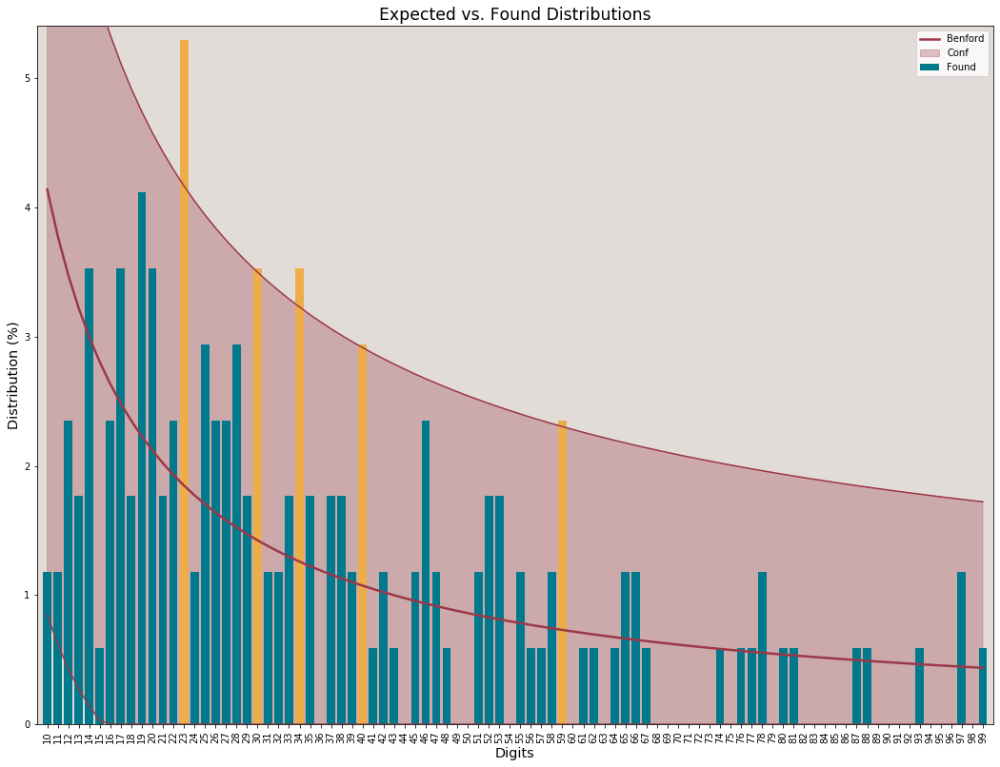



 #################  COUNTRY:  Italy  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 170 registries.
Sec_Dig
0    0.117647
1    0.070588
2    0.094118
3    0.117647
4    0.094118
5    0.088235
6    0.094118
7    0.123529
8    0.100000
9    0.100000
Name: Found, dtype: float64

Test performed on 170 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.014934
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.4439.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0614.
Critical K-S for this series: 0.1043


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


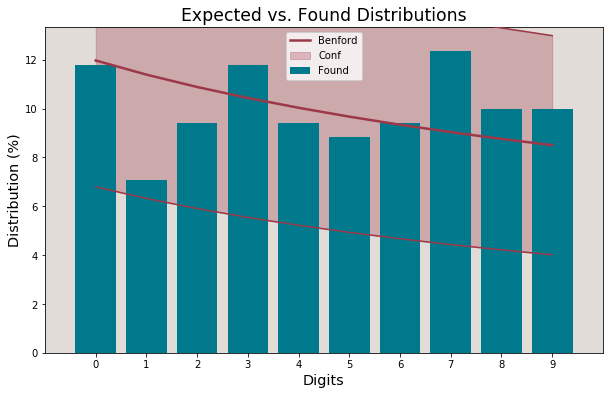

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Japan  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 165 registries.
First_1_Dig
1    0.236364
2    0.151515
3    0.157576
4    0.139394
5    0.133333
6    0.060606
7    0.042424
8    0.060606
9    0.018182
Name: Found, dtype: float64

Test performed on 165 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
5            0.079181  0.133333  2.431923
Mean Absolute Deviation: 0.030828
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 17.2674.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0892.
Critical K-S for this series: 0.1059


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


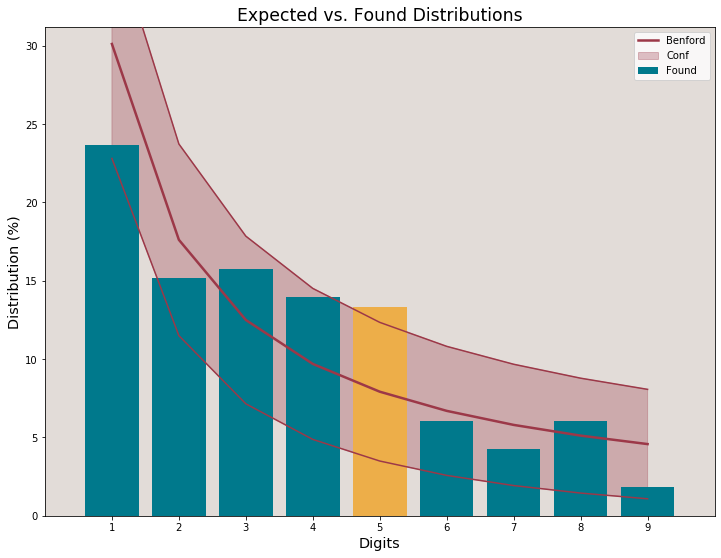



 #################  COUNTRY:  Japan  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 165 registries.
First_2_Dig
10    0.018182
11    0.036364
12    0.030303
13    0.030303
14    0.018182
15    0.024242
16    0.006061
17    0.024242
18    0.006061
19    0.042424
20    0.036364
21    0.012121
22    0.012121
23    0.012121
24    0.012121
25    0.012121
26    0.012121
27    0.018182
28    0.012121
29    0.012121
30    0.000000
31    0.012121
32    0.012121
33    0.024242
34    0.012121
35    0.012121
36    0.018182
37    0.012121
38    0.018182
39    0.036364
40    0.012121
41    0.024242
42    0.006061
43    0.018182
44    0.012121
45    0.012121
46    0.018182
47    0.018182
48    0.012121
49    0.006061
50    0.012121
51    0.024242
52    0.006061
53    0.000000
54    0.006061
55    0.006061
56    0.024242
57    0.012121
58    0.012121
59    0.030303
60    0.012121
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


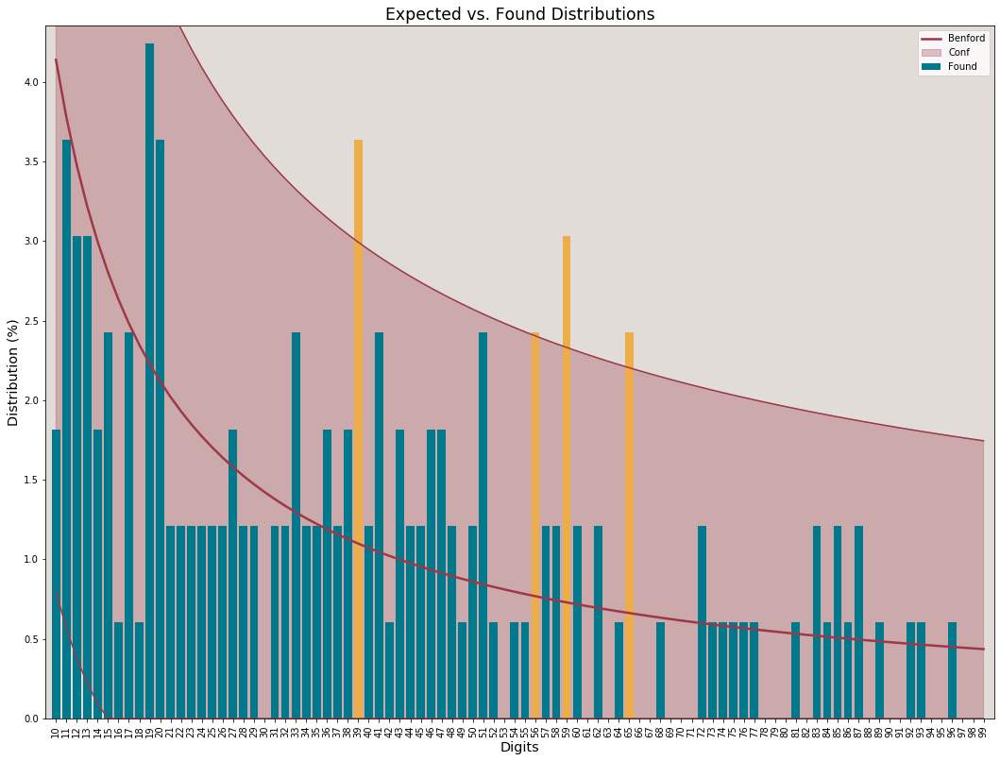



 #################  COUNTRY:  Japan  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 165 registries.
Sec_Dig
0    0.090909
1    0.115152
2    0.096970
3    0.109091
4    0.078788
5    0.109091
6    0.096970
7    0.103030
8    0.066667
9    0.133333
Name: Found, dtype: float64

Test performed on 165 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found  Z_score
Sec_Dig                             
9        0.084997  0.133333   2.0868
Mean Absolute Deviation: 0.016609
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.0922.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0561.
Critical K-S for this series: 0.1059


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


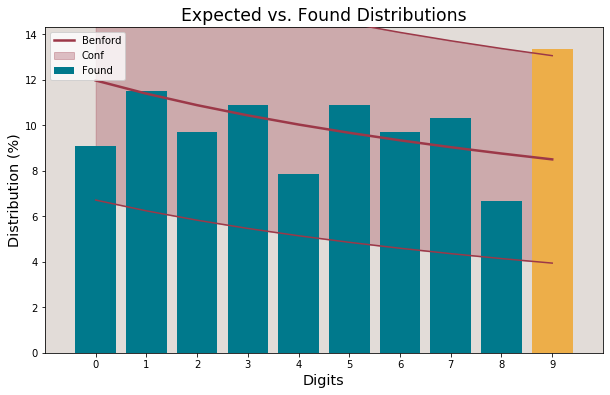

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Kazakhstan  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_1_Dig
1    0.437956
2    0.160584
3    0.124088
4    0.109489
5    0.051095
6    0.021898
7    0.036496
8    0.036496
9    0.021898
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.437956  3.400791
Mean Absolute Deviation: 0.033223
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 17.8334.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1369.
Critical K-S for this series: 0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


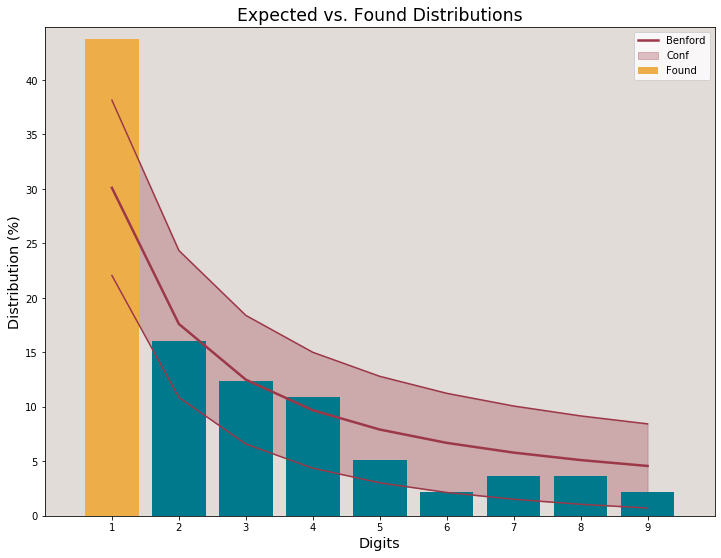



 #################  COUNTRY:  Kazakhstan  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_2_Dig
10    0.021898
11    0.021898
12    0.029197
13    0.021898
14    0.087591
15    0.058394
16    0.080292
17    0.065693
18    0.029197
19    0.021898
20    0.029197
21    0.029197
22    0.021898
23    0.007299
24    0.014599
25    0.007299
26    0.014599
27    0.021898
28    0.007299
29    0.007299
30    0.007299
31    0.021898
32    0.014599
33    0.014599
34    0.007299
35    0.014599
36    0.021898
37    0.000000
38    0.021898
39    0.000000
40    0.014599
41    0.007299
42    0.007299
43    0.014599
44    0.007299
45    0.014599
46    0.014599
47    0.014599
48    0.000000
49    0.014599
50    0.007299
51    0.000000
52    0.007299
53    0.007299
54    0.007299
55    0.014599
56    0.007299
57    0.000000
58    0.000000
59    0.000000
60    0.0000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


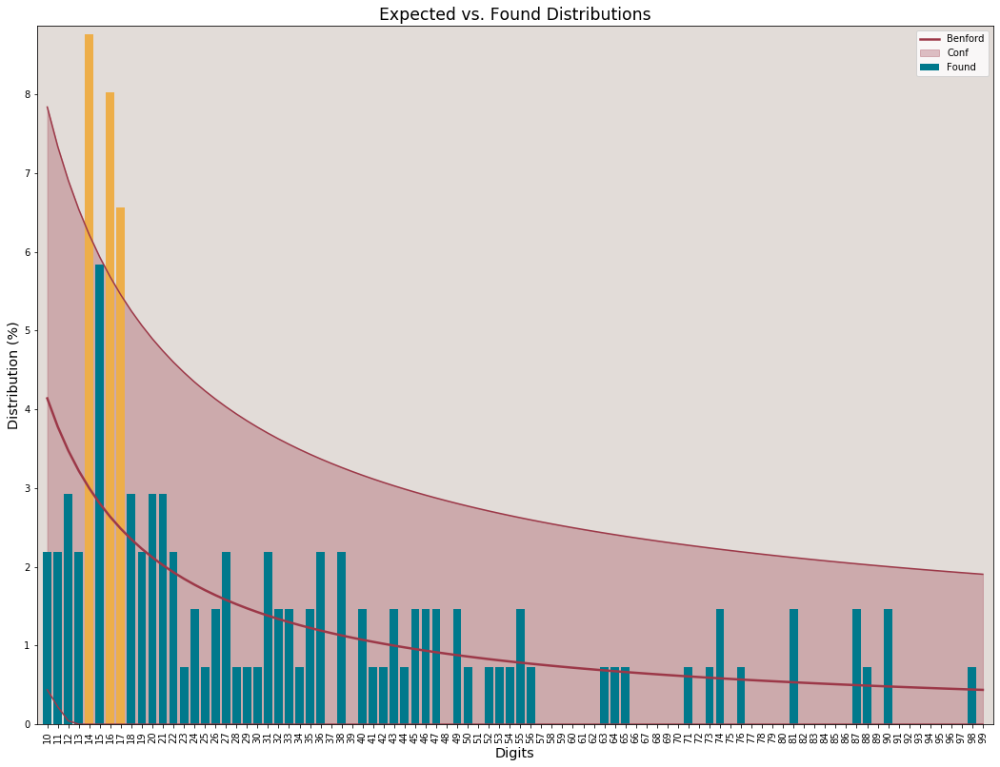



 #################  COUNTRY:  Kazakhstan  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
Sec_Dig
0    0.094891
1    0.102190
2    0.080292
3    0.080292
4    0.145985
5    0.116788
6    0.145985
7    0.116788
8    0.072993
9    0.043796
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
6        0.093375  0.145985  1.969619
Mean Absolute Deviation: 0.028967
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 14.2637.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0891.
Critical K-S for this series: 0.1162


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


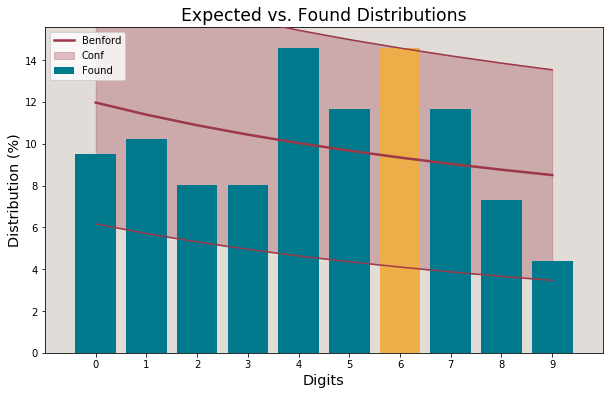

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Kenya  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 118 registries.
First_1_Dig
1    0.372881
2    0.194915
3    0.084746
4    0.076271
5    0.076271
6    0.093220
7    0.067797
8    0.008475
9    0.025424
Name: Found, dtype: float64

Test performed on 118 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.028167
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 10.9984.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0907.
Critical K-S for this series: 0.1252


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


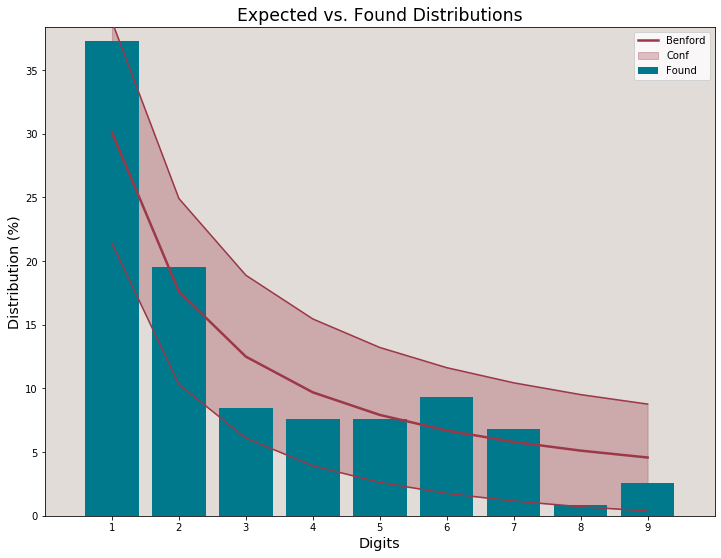



 #################  COUNTRY:  Kenya  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 118 registries.
First_2_Dig
10    0.025424
11    0.033898
12    0.101695
13    0.033898
14    0.042373
15    0.033898
16    0.042373
17    0.025424
18    0.033898
19    0.000000
20    0.000000
21    0.016949
22    0.033898
23    0.016949
24    0.016949
25    0.042373
26    0.016949
27    0.025424
28    0.016949
29    0.008475
30    0.025424
31    0.008475
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.025424
38    0.016949
39    0.008475
40    0.000000
41    0.008475
42    0.008475
43    0.000000
44    0.008475
45    0.008475
46    0.008475
47    0.016949
48    0.000000
49    0.016949
50    0.000000
51    0.008475
52    0.008475
53    0.008475
54    0.016949
55    0.000000
56    0.000000
57    0.008475
58    0.000000
59    0.025424
60    0.025424
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


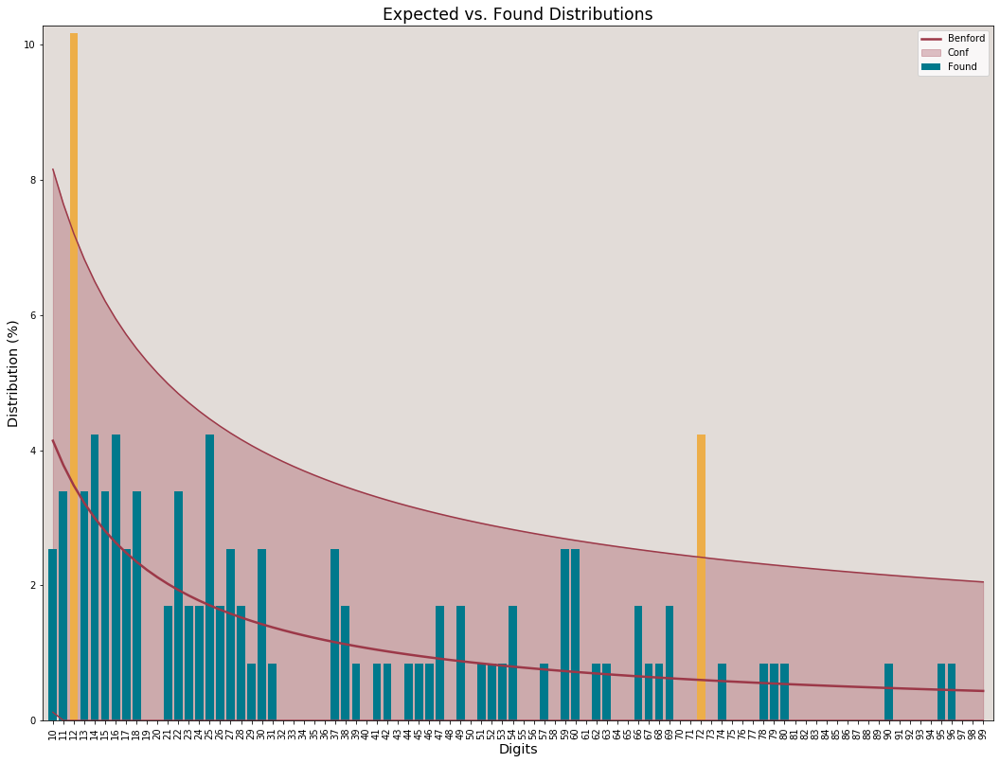



 #################  COUNTRY:  Kenya  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 118 registries.
Sec_Dig
0    0.093220
1    0.076271
2    0.203390
3    0.067797
4    0.093220
5    0.093220
6    0.093220
7    0.110169
8    0.084746
9    0.084746
Name: Found, dtype: float64

Test performed on 118 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected    Found   Z_score
Sec_Dig                             
2        0.108821  0.20339  3.150927
Mean Absolute Deviation: 0.022877
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 13.9610.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0641.
Critical K-S for this series: 0.1252


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


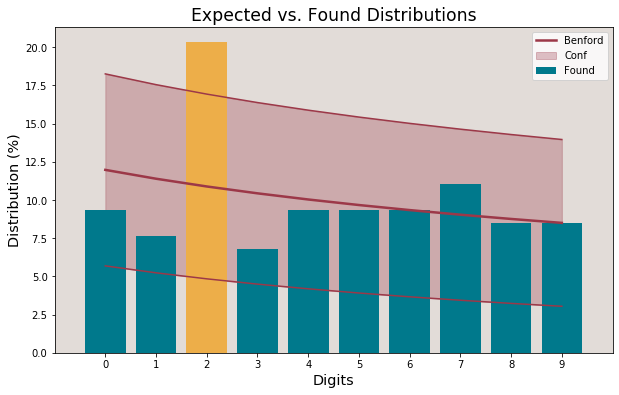

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Kuwait  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 145 registries.
First_1_Dig
1    0.200000
2    0.082759
3    0.034483
4    0.082759
5    0.124138
6    0.186207
7    0.124138
8    0.103448
9    0.062069
Name: Found, dtype: float64

Test performed on 145 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
6            0.066947  0.186207  5.579803
7            0.057992  0.124138  3.230164
8            0.051153  0.103448  2.669896
Mean Absolute Deviation: 0.066438
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 75.9271.
Critical Chi-square for this series: 15.50

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


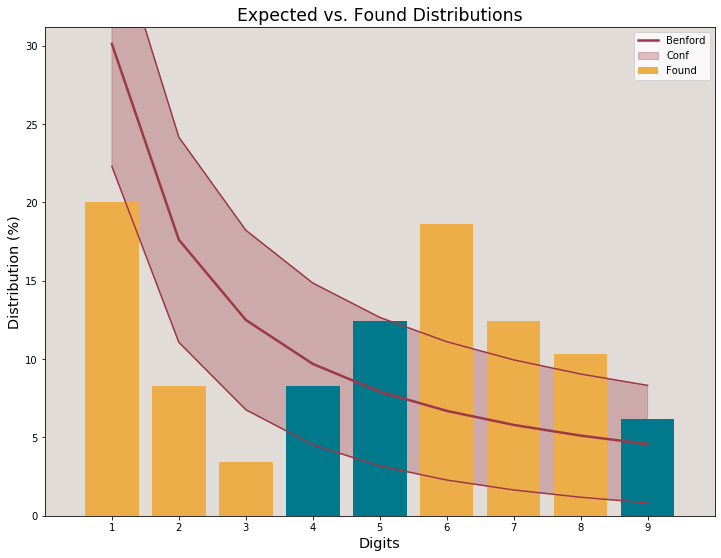



 #################  COUNTRY:  Kuwait  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 145 registries.
First_2_Dig
10    0.062069
11    0.034483
12    0.013793
13    0.020690
14    0.000000
15    0.020690
16    0.020690
17    0.020690
18    0.006897
19    0.000000
20    0.013793
21    0.013793
22    0.000000
23    0.006897
24    0.006897
25    0.006897
26    0.000000
27    0.013793
28    0.013793
29    0.006897
30    0.013793
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.006897
36    0.006897
37    0.000000
38    0.006897
39    0.000000
40    0.000000
41    0.006897
42    0.006897
43    0.000000
44    0.000000
45    0.006897
46    0.020690
47    0.020690
48    0.013793
49    0.006897
50    0.013793
51    0.020690
52    0.020690
53    0.000000
54    0.006897
55    0.034483
56    0.006897
57    0.006897
58    0.006897
59    0.006897
60    0.034483
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


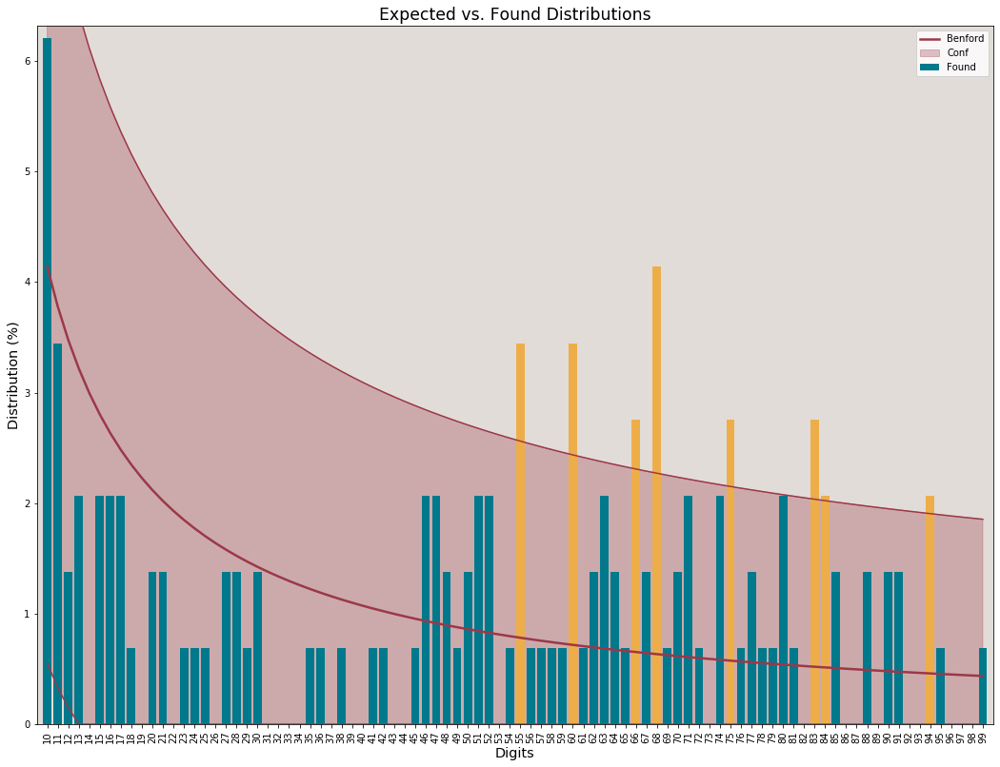



 #################  COUNTRY:  Kuwait  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 145 registries.
Sec_Dig
0    0.186207
1    0.124138
2    0.062069
3    0.075862
4    0.089655
5    0.131034
6    0.089655
7    0.089655
8    0.110345
9    0.041379
Name: Found, dtype: float64

Test performed on 145 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
0        0.119679  0.186207  2.340137
Mean Absolute Deviation: 0.026781
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 15.5960.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0768.
Critical K-S for this series: 0.1129


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


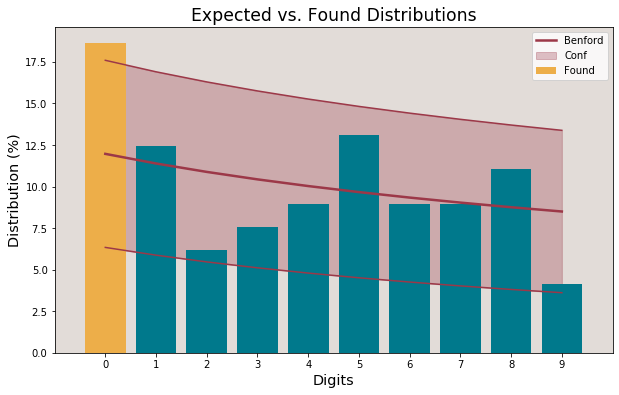

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Kyrgyzstan  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 128 registries.
First_1_Dig
1    0.242188
2    0.257812
3    0.156250
4    0.132812
5    0.070312
6    0.046875
7    0.054688
8    0.007812
9    0.031250
Name: Found, dtype: float64

Test performed on 128 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.257812  2.311319
Mean Absolute Deviation: 0.033097
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 15.2442.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0901.
Critical K-S for this series: 0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


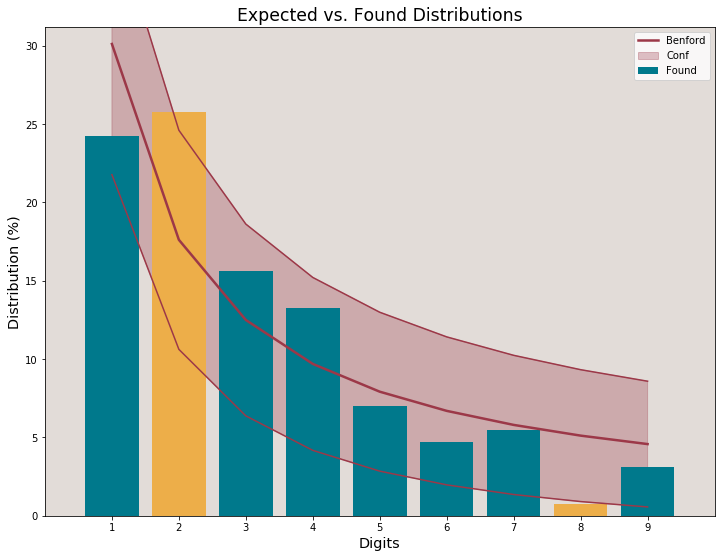



 #################  COUNTRY:  Kyrgyzstan  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 128 registries.
First_2_Dig
10    0.023438
11    0.039062
12    0.015625
13    0.039062
14    0.031250
15    0.000000
16    0.007812
17    0.039062
18    0.007812
19    0.039062
20    0.015625
21    0.023438
22    0.023438
23    0.039062
24    0.007812
25    0.039062
26    0.046875
27    0.023438
28    0.031250
29    0.007812
30    0.015625
31    0.015625
32    0.007812
33    0.015625
34    0.007812
35    0.015625
36    0.015625
37    0.023438
38    0.031250
39    0.007812
40    0.000000
41    0.031250
42    0.039062
43    0.023438
44    0.000000
45    0.007812
46    0.000000
47    0.000000
48    0.023438
49    0.007812
50    0.007812
51    0.007812
52    0.015625
53    0.000000
54    0.015625
55    0.007812
56    0.007812
57    0.000000
58    0.007812
59    0.000000
60    0.0156

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


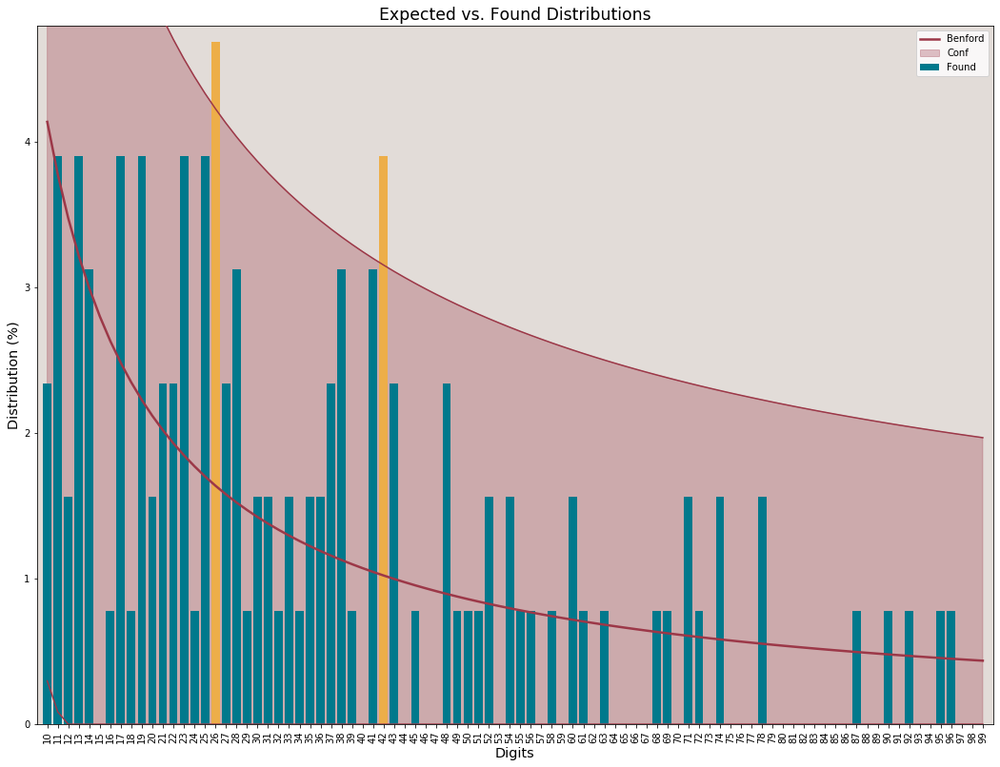



 #################  COUNTRY:  Kyrgyzstan  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 128 registries.
Sec_Dig
0    0.085938
1    0.140625
2    0.117188
3    0.125000
4    0.078125
5    0.078125
6    0.085938
7    0.093750
8    0.125000
9    0.070312
Name: Found, dtype: float64

Test performed on 128 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.019320
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.1759.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0337.
Critical K-S for this series: 0.1202


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


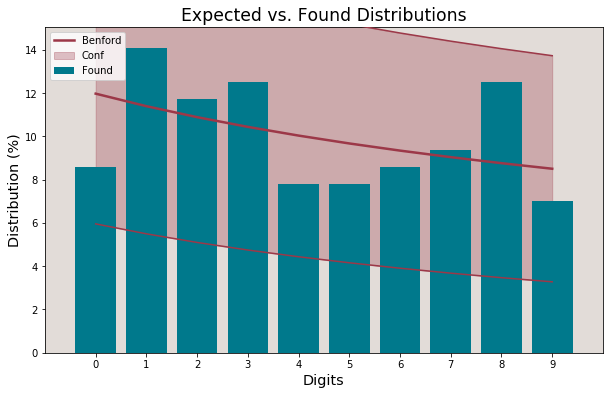

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Malaysia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 124 registries.
First_1_Dig
1    0.508065
2    0.112903
3    0.137097
4    0.064516
5    0.072581
6    0.040323
7    0.024194
8    0.024194
9    0.016129
Name: Found, dtype: float64

Test performed on 124 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.508065  4.928078
Mean Absolute Deviation: 0.048709
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 29.9217.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.2070.
Critical K-S for this series: 0.12

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


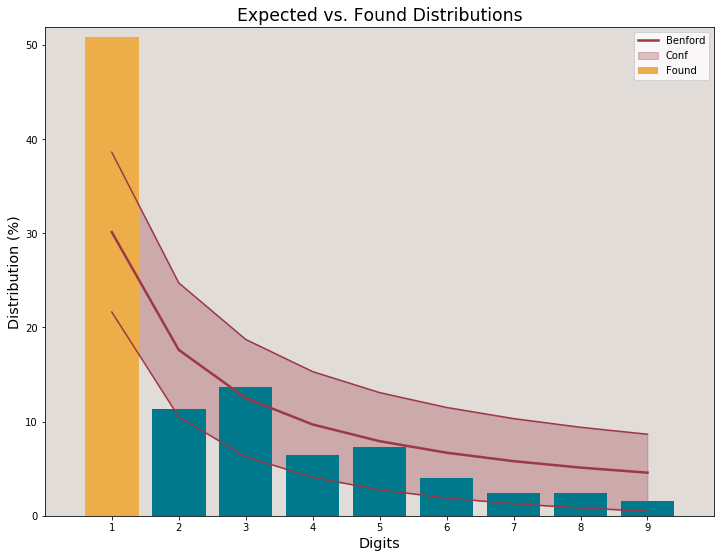



 #################  COUNTRY:  Malaysia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 124 registries.
First_2_Dig
10    0.080645
11    0.040323
12    0.048387
13    0.064516
14    0.048387
15    0.096774
16    0.024194
17    0.048387
18    0.040323
19    0.016129
20    0.024194
21    0.048387
22    0.008065
23    0.016129
24    0.000000
25    0.008065
26    0.000000
27    0.000000
28    0.000000
29    0.008065
30    0.016129
31    0.024194
32    0.000000
33    0.016129
34    0.000000
35    0.000000
36    0.016129
37    0.024194
38    0.016129
39    0.024194
40    0.016129
41    0.016129
42    0.000000
43    0.008065
44    0.000000
45    0.008065
46    0.000000
47    0.008065
48    0.008065
49    0.000000
50    0.016129
51    0.008065
52    0.000000
53    0.000000
54    0.016129
55    0.008065
56    0.000000
57    0.024194
58    0.000000
59    0.000000
60    0.008065

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


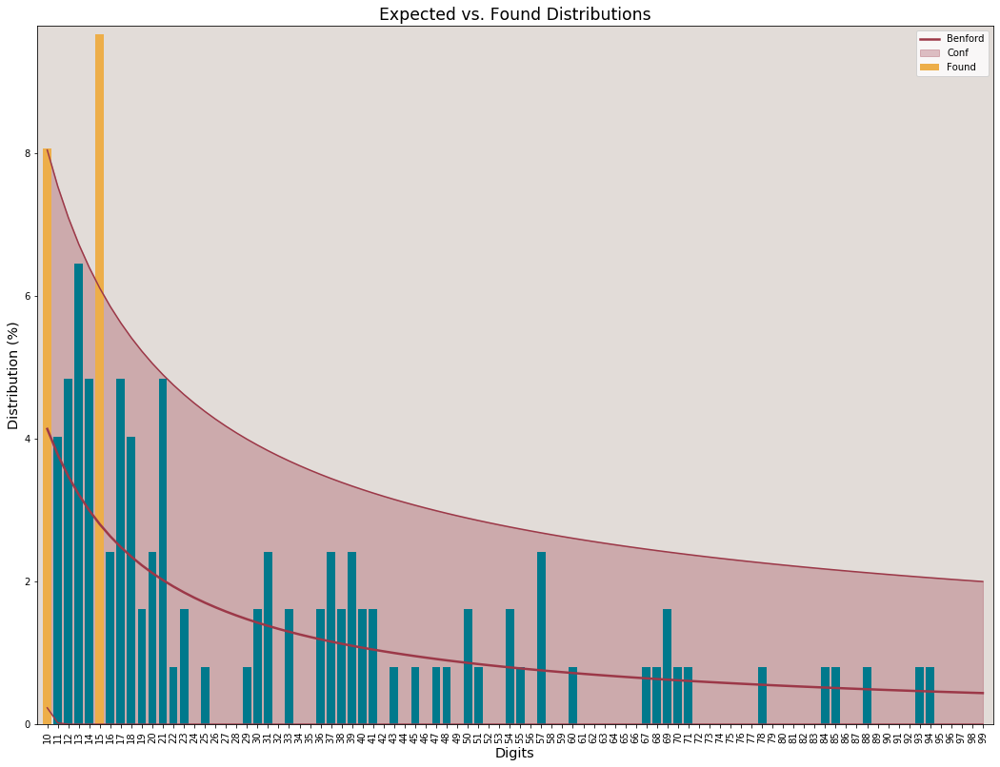



 #################  COUNTRY:  Malaysia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 124 registries.
Sec_Dig
0    0.169355
1    0.145161
2    0.056452
3    0.112903
4    0.080645
5    0.129032
6    0.040323
7    0.112903
8    0.088710
9    0.064516
Name: Found, dtype: float64

Test performed on 124 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.029113
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 13.7040.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0809.
Critical K-S for this series: 0.1221


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


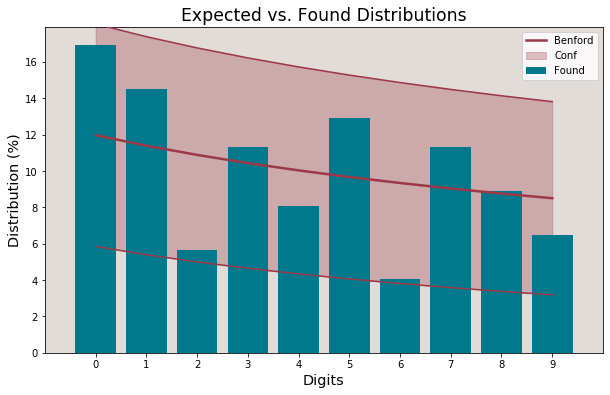

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Mexico  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_1_Dig
1    0.213333
2    0.133333
3    0.133333
4    0.173333
5    0.100000
6    0.140000
7    0.066667
8    0.026667
9    0.013333
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
6            0.066947  0.140000  3.416522
4            0.096910  0.173333  3.025894
Mean Absolute Deviation: 0.041637
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 32.6920.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


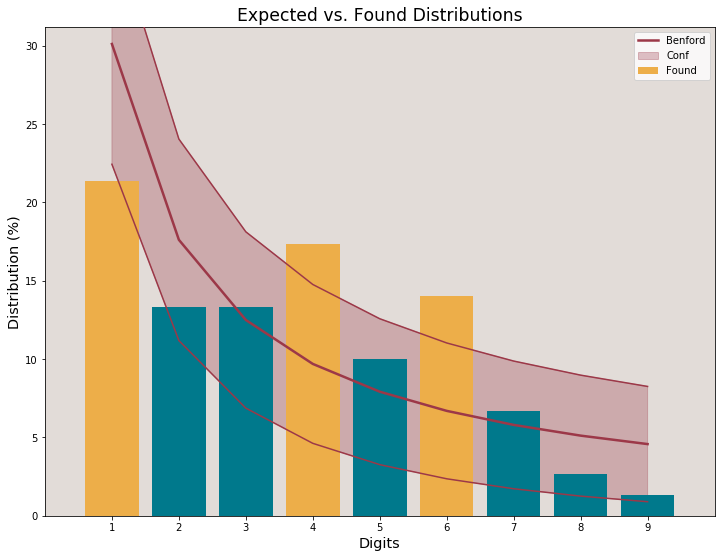



 #################  COUNTRY:  Mexico  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_2_Dig
10    0.033333
11    0.020000
12    0.026667
13    0.040000
14    0.020000
15    0.020000
16    0.013333
17    0.006667
18    0.006667
19    0.026667
20    0.013333
21    0.006667
22    0.006667
23    0.000000
24    0.026667
25    0.013333
26    0.006667
27    0.020000
28    0.006667
29    0.033333
30    0.000000
31    0.006667
32    0.006667
33    0.013333
34    0.040000
35    0.013333
36    0.000000
37    0.006667
38    0.026667
39    0.020000
40    0.013333
41    0.013333
42    0.000000
43    0.013333
44    0.033333
45    0.020000
46    0.020000
47    0.020000
48    0.020000
49    0.020000
50    0.006667
51    0.020000
52    0.006667
53    0.013333
54    0.026667
55    0.000000
56    0.013333
57    0.013333
58    0.000000
59    0.000000
60    0.013333
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


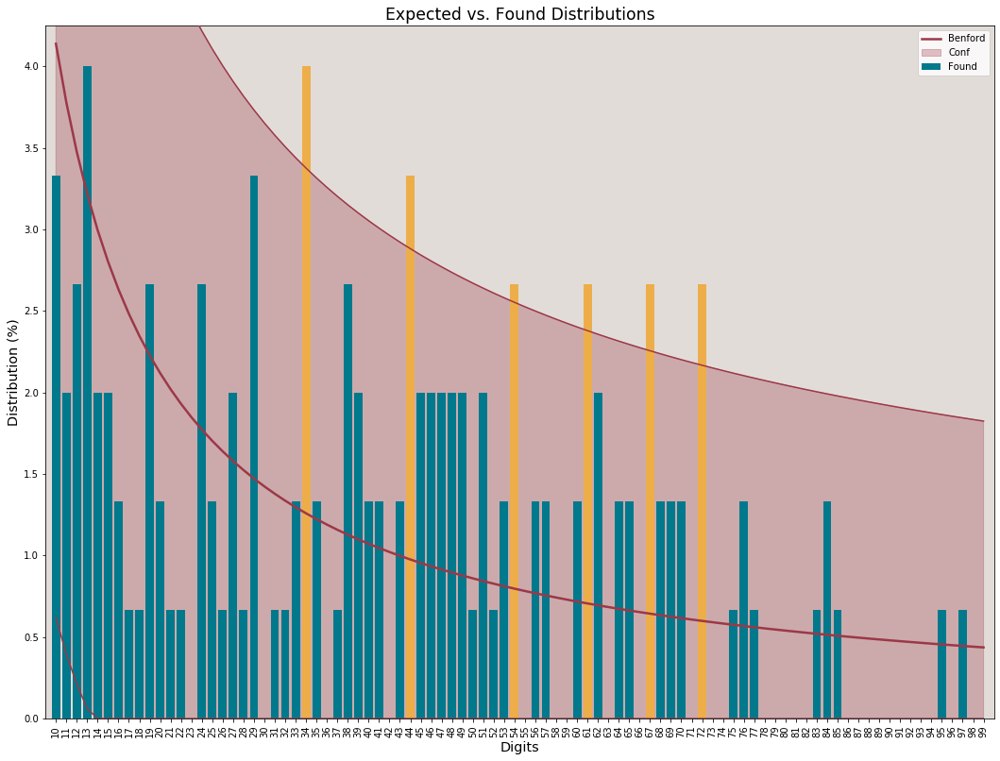



 #################  COUNTRY:  Mexico  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
Sec_Dig
0    0.093333
1    0.093333
2    0.093333
3    0.086667
4    0.173333
5    0.100000
6    0.066667
7    0.106667
8    0.073333
9    0.113333
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
4        0.100308  0.173333  2.841268
Mean Absolute Deviation: 0.024200
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 13.5492.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0801.
Critical K-S for this series: 0.1110


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


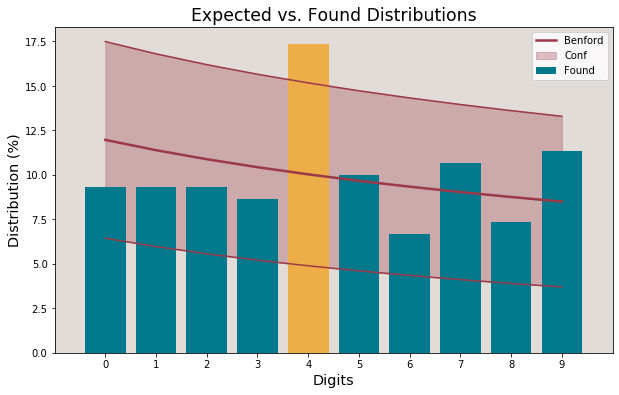

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Moldova  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 144 registries.
First_1_Dig
1    0.416667
2    0.215278
3    0.173611
4    0.048611
5    0.027778
6    0.027778
7    0.041667
8    0.027778
9    0.020833
Name: Found, dtype: float64

Test performed on 144 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.416667  2.934285
Mean Absolute Deviation: 0.045221
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 26.1093.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.2035.
Critical K-S for this series: 0.113

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


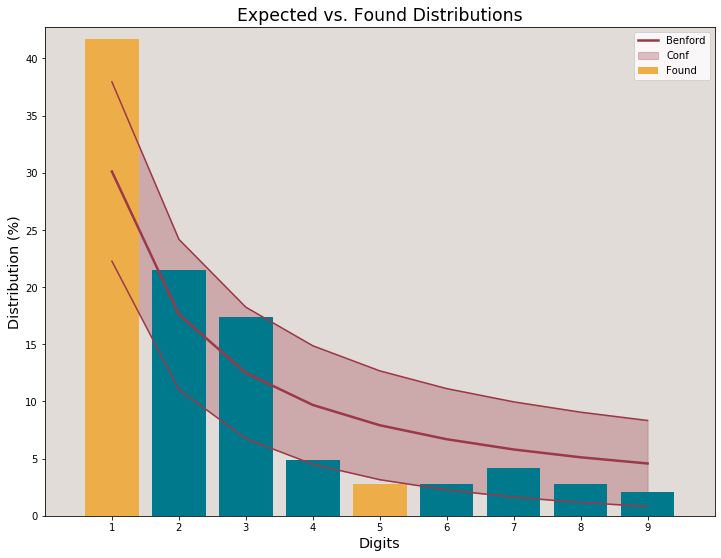



 #################  COUNTRY:  Moldova  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 144 registries.
First_2_Dig
10    0.048611
11    0.048611
12    0.069444
13    0.034722
14    0.055556
15    0.041667
16    0.027778
17    0.027778
18    0.041667
19    0.020833
20    0.020833
21    0.020833
22    0.041667
23    0.020833
24    0.027778
25    0.027778
26    0.013889
27    0.000000
28    0.027778
29    0.013889
30    0.020833
31    0.000000
32    0.027778
33    0.020833
34    0.006944
35    0.020833
36    0.034722
37    0.027778
38    0.006944
39    0.006944
40    0.020833
41    0.000000
42    0.006944
43    0.000000
44    0.000000
45    0.013889
46    0.000000
47    0.006944
48    0.000000
49    0.000000
50    0.006944
51    0.000000
52    0.000000
53    0.000000
54    0.006944
55    0.006944
56    0.000000
57    0.006944
58    0.000000
59    0.000000
60    0.006944


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


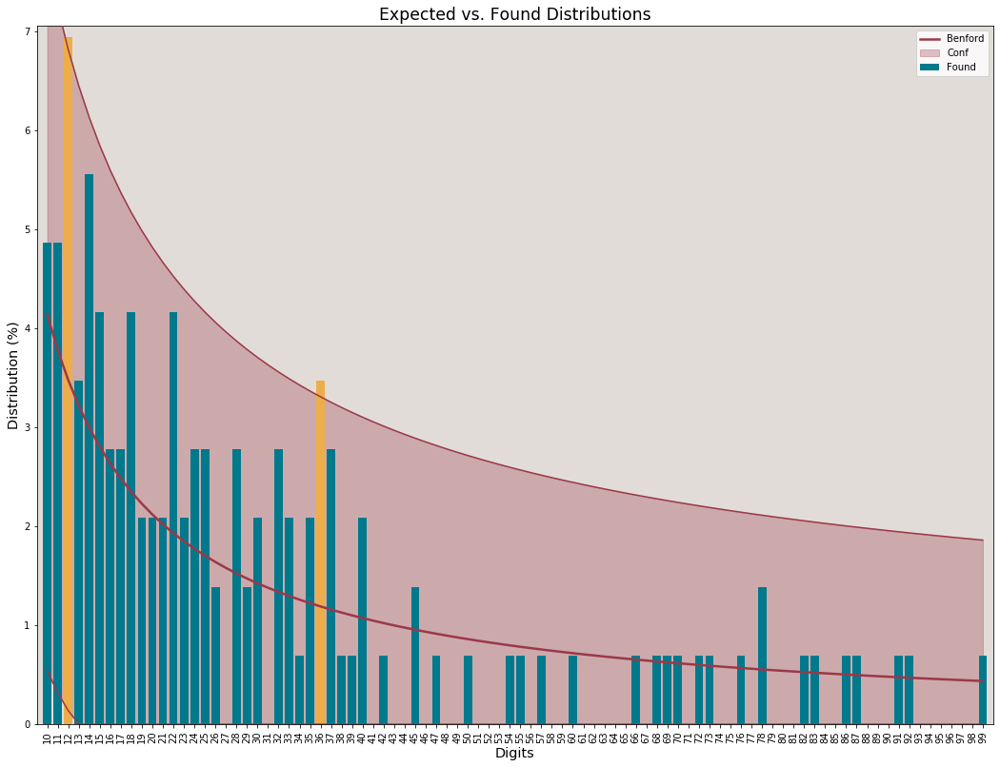



 #################  COUNTRY:  Moldova  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 144 registries.
Sec_Dig
0    0.131944
1    0.076389
2    0.166667
3    0.090278
4    0.097222
5    0.111111
6    0.097222
7    0.076389
8    0.097222
9    0.055556
Name: Found, dtype: float64

Test performed on 144 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
2        0.108821  0.166667  2.095195
Mean Absolute Deviation: 0.019609
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.9387.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0338.
Critical K-S for this series: 0.1133


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


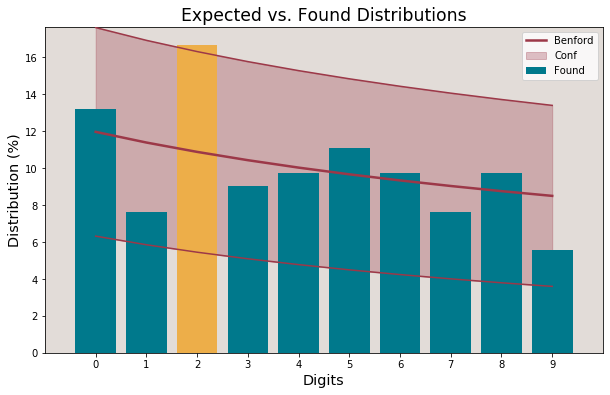

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Morocco  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 144 registries.
First_1_Dig
1    0.423611
2    0.125000
3    0.069444
4    0.041667
5    0.069444
6    0.076389
7    0.076389
8    0.055556
9    0.062500
Name: Found, dtype: float64

Test performed on 144 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.423611  3.115956
Mean Absolute Deviation: 0.038126
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 19.5480.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1226.
Critical K-S for this series: 0.113

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


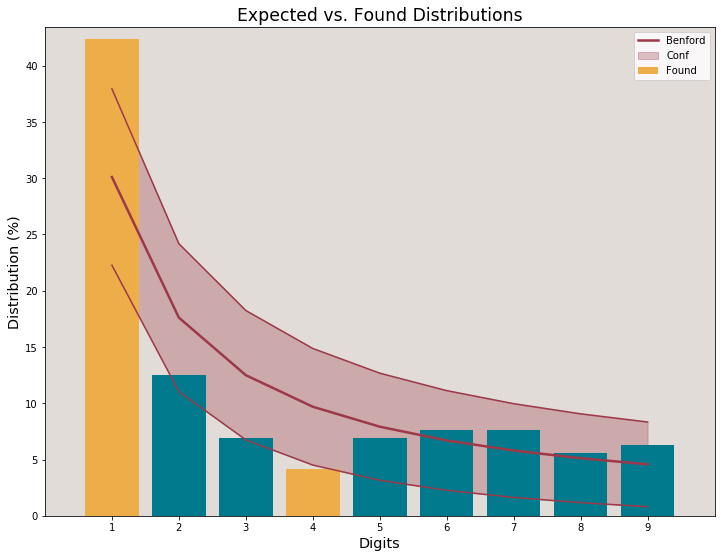



 #################  COUNTRY:  Morocco  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 144 registries.
First_2_Dig
10    0.083333
11    0.034722
12    0.048611
13    0.048611
14    0.020833
15    0.006944
16    0.055556
17    0.041667
18    0.027778
19    0.055556
20    0.006944
21    0.020833
22    0.013889
23    0.013889
24    0.020833
25    0.006944
26    0.006944
27    0.013889
28    0.013889
29    0.006944
30    0.013889
31    0.006944
32    0.006944
33    0.013889
34    0.000000
35    0.000000
36    0.006944
37    0.013889
38    0.000000
39    0.006944
40    0.000000
41    0.000000
42    0.013889
43    0.006944
44    0.006944
45    0.013889
46    0.000000
47    0.000000
48    0.000000
49    0.000000
50    0.013889
51    0.000000
52    0.006944
53    0.013889
54    0.006944
55    0.013889
56    0.006944
57    0.006944
58    0.000000
59    0.000000
60    0.006944


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


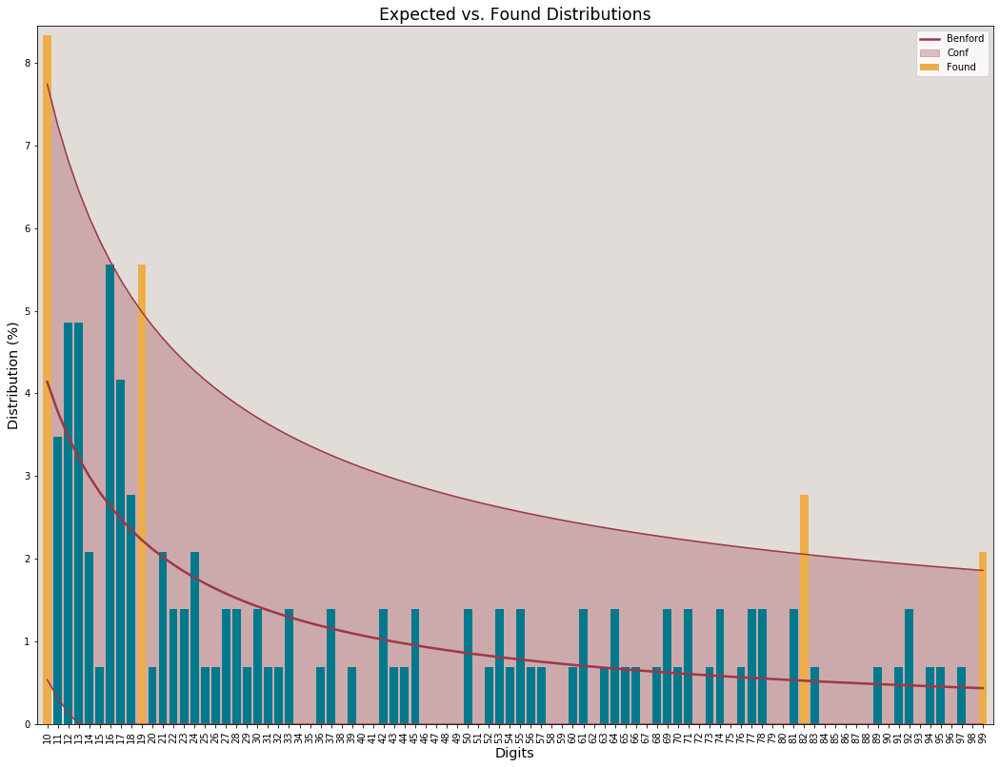



 #################  COUNTRY:  Morocco  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 144 registries.
Sec_Dig
0    0.131944
1    0.111111
2    0.131944
3    0.118056
4    0.090278
5    0.055556
6    0.090278
7    0.097222
8    0.062500
9    0.111111
Name: Found, dtype: float64

Test performed on 144 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.016420
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.1003.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0463.
Critical K-S for this series: 0.1133


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


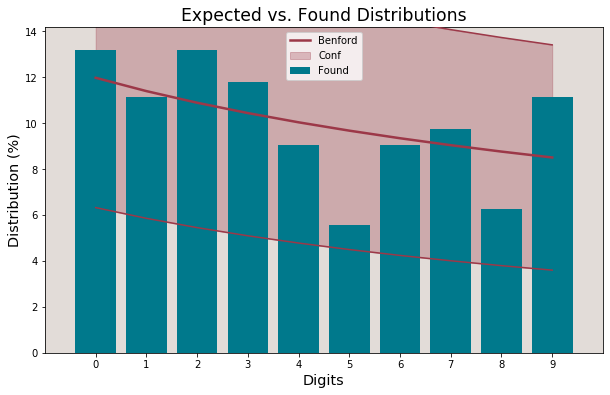

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Netherlands  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 160 registries.
First_1_Dig
1    0.41875
2    0.11250
3    0.06875
4    0.06875
5    0.07500
6    0.06875
7    0.08125
8    0.06250
9    0.04375
Name: Found, dtype: float64

Test performed on 160 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected    Found   Z_score
First_1_Dig                             
1             0.30103  0.41875  3.160032
Mean Absolute Deviation: 0.034251
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 18.3448.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1177.
Critical K-S for this series: 0.1075


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


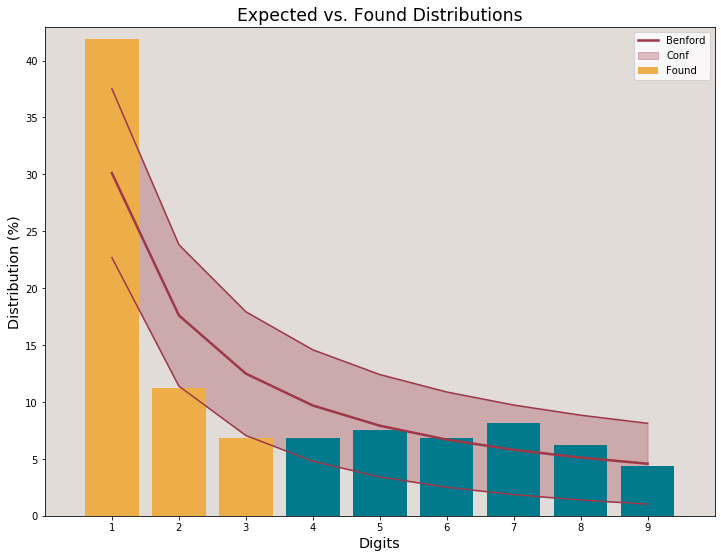



 #################  COUNTRY:  Netherlands  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 160 registries.
First_2_Dig
10    0.09375
11    0.05625
12    0.03750
13    0.03750
14    0.01875
15    0.00625
16    0.05000
17    0.03750
18    0.04375
19    0.03750
20    0.02500
21    0.01875
22    0.01250
23    0.01250
24    0.01250
25    0.00625
26    0.00000
27    0.01250
28    0.00625
29    0.00625
30    0.00000
31    0.01875
32    0.00000
33    0.01250
34    0.01250
35    0.00000
36    0.00625
37    0.01250
38    0.00625
39    0.00000
40    0.01250
41    0.00000
42    0.01250
43    0.00625
44    0.01250
45    0.00625
46    0.00625
47    0.00625
48    0.00625
49    0.00000
50    0.00625
51    0.01250
52    0.01250
53    0.01250
54    0.01250
55    0.00000
56    0.00625
57    0.01250
58    0.00000
59    0.00000
60    0.01250
61    0.01250
62    0.00625
63    0.00625
64   

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


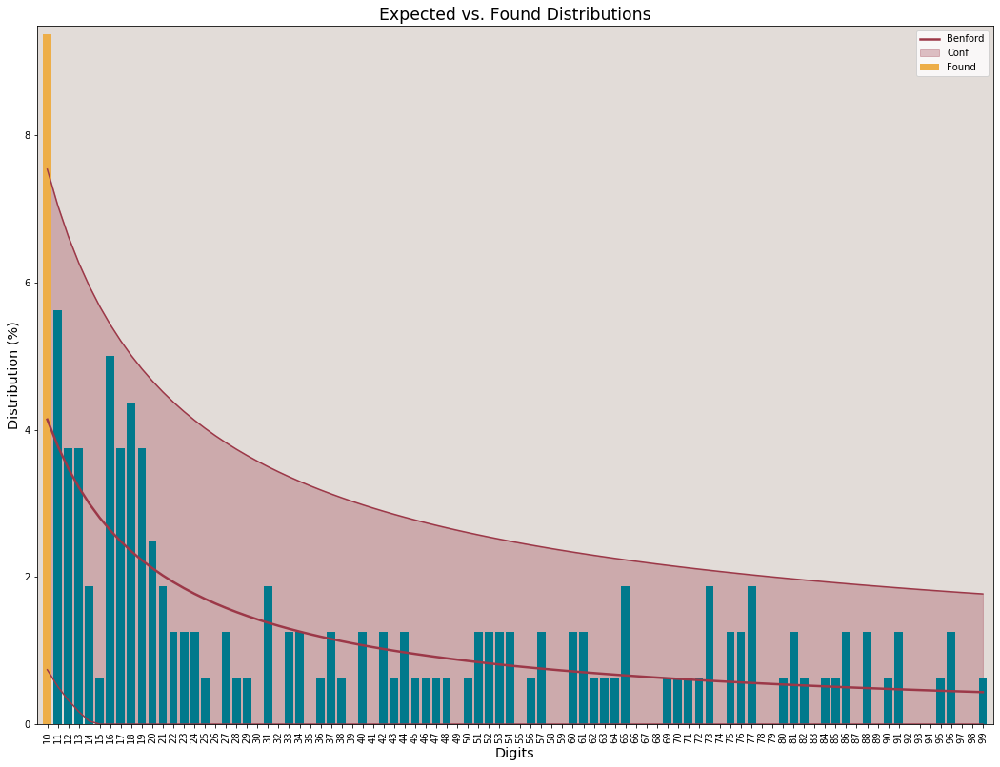



 #################  COUNTRY:  Netherlands  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 160 registries.
Sec_Dig
0    0.16875
1    0.15000
2    0.09375
3    0.10625
4    0.08125
5    0.06250
6    0.10625
7    0.10000
8    0.07500
9    0.05625
Name: Found, dtype: float64

Test performed on 160 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021925
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.1964.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0852.
Critical K-S for this series: 0.1075


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


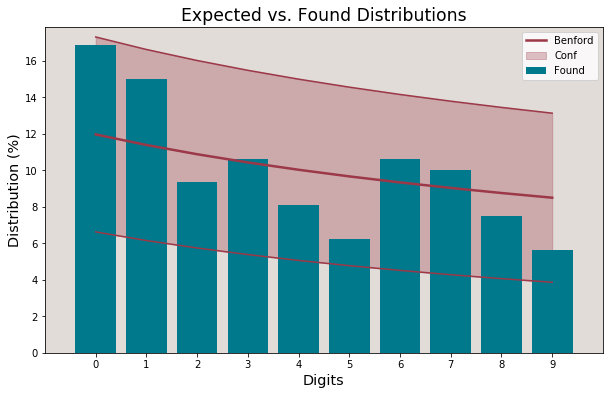

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Nigeria  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
First_1_Dig
1    0.170370
2    0.177778
3    0.162963
4    0.148148
5    0.155556
6    0.133333
7    0.022222
8    0.014815
9    0.014815
Name: Found, dtype: float64

Test performed on 135 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
5            0.079181  0.155556  3.126997
6            0.066947  0.133333  2.914053
Mean Absolute Deviation: 0.051935
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 40.9981.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


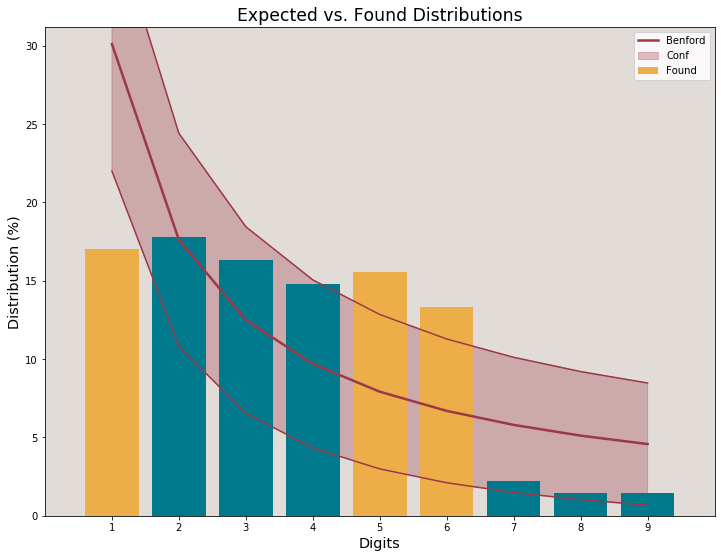



 #################  COUNTRY:  Nigeria  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
First_2_Dig
10    0.022222
11    0.014815
12    0.007407
13    0.007407
14    0.022222
15    0.000000
16    0.029630
17    0.022222
18    0.014815
19    0.029630
20    0.029630
21    0.014815
22    0.029630
23    0.022222
24    0.037037
25    0.007407
26    0.007407
27    0.014815
28    0.014815
29    0.000000
30    0.029630
31    0.014815
32    0.007407
33    0.014815
34    0.022222
35    0.022222
36    0.000000
37    0.000000
38    0.051852
39    0.000000
40    0.022222
41    0.007407
42    0.000000
43    0.022222
44    0.007407
45    0.029630
46    0.022222
47    0.000000
48    0.007407
49    0.029630
50    0.014815
51    0.007407
52    0.000000
53    0.000000
54    0.014815
55    0.022222
56    0.022222
57    0.037037
58    0.007407
59    0.029630
60    0.022222


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


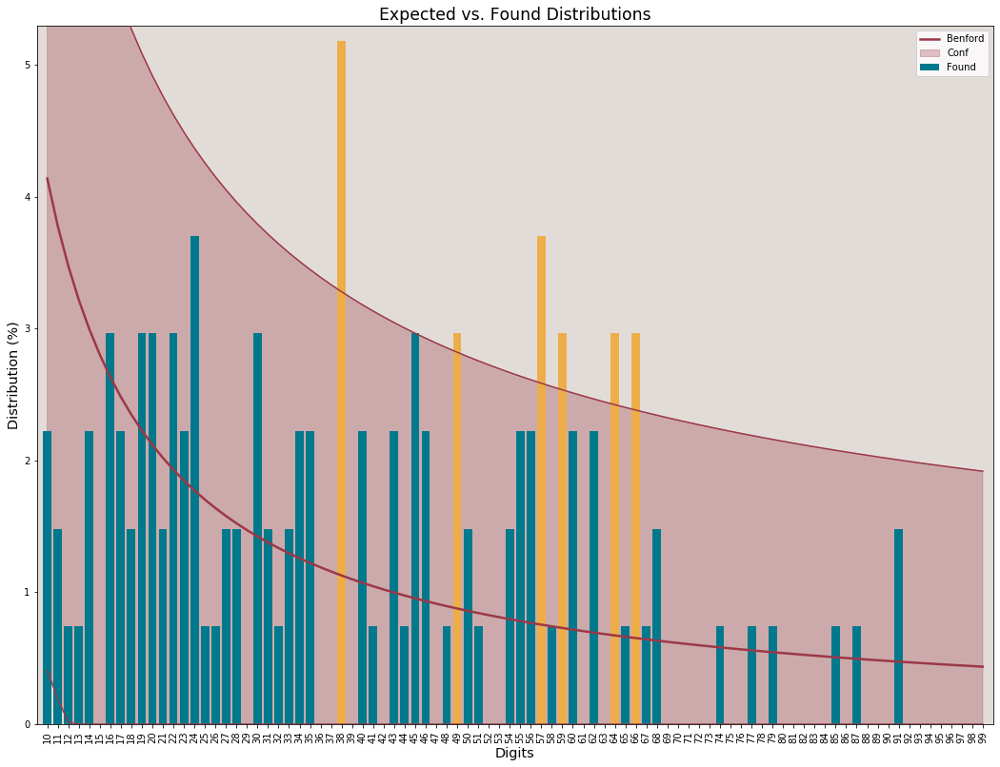



 #################  COUNTRY:  Nigeria  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 135 registries.
Sec_Dig
0    0.140741
1    0.074074
2    0.066667
3    0.066667
4    0.140741
5    0.096296
6    0.111111
7    0.096296
8    0.111111
9    0.096296
Name: Found, dtype: float64

Test performed on 135 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.024003
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.1847.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0986.
Critical K-S for this series: 0.1171


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


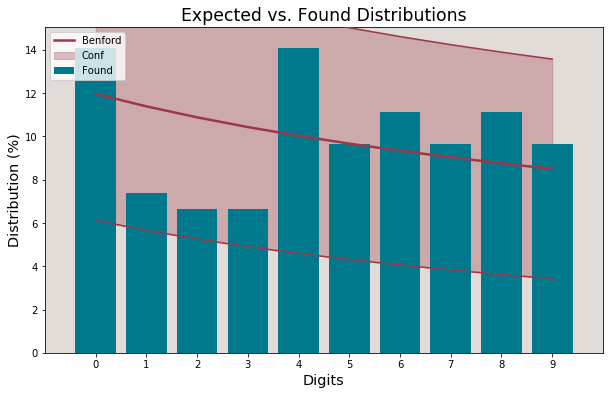

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  North Macedonia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_1_Dig
1    0.510949
2    0.233577
3    0.058394
4    0.051095
5    0.029197
6    0.029197
7    0.021898
8    0.051095
9    0.014599
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.510949  5.263331
Mean Absolute Deviation: 0.059423
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 43.6721.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.2674.
Critical K-S for this serie

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


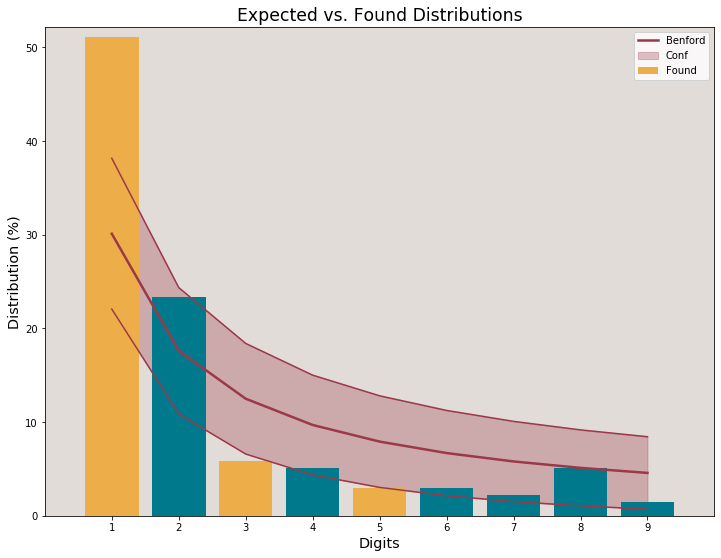



 #################  COUNTRY:  North Macedonia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_2_Dig
10    0.043796
11    0.051095
12    0.094891
13    0.072993
14    0.014599
15    0.051095
16    0.051095
17    0.029197
18    0.058394
19    0.043796
20    0.036496
21    0.014599
22    0.051095
23    0.021898
24    0.007299
25    0.021898
26    0.021898
27    0.000000
28    0.021898
29    0.036496
30    0.007299
31    0.000000
32    0.000000
33    0.007299
34    0.007299
35    0.000000
36    0.014599
37    0.014599
38    0.007299
39    0.000000
40    0.007299
41    0.014599
42    0.000000
43    0.000000
44    0.007299
45    0.000000
46    0.007299
47    0.000000
48    0.007299
49    0.007299
50    0.000000
51    0.000000
52    0.007299
53    0.014599
54    0.007299
55    0.000000
56    0.000000
57    0.000000
58    0.000000
59    0.000000
60    0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


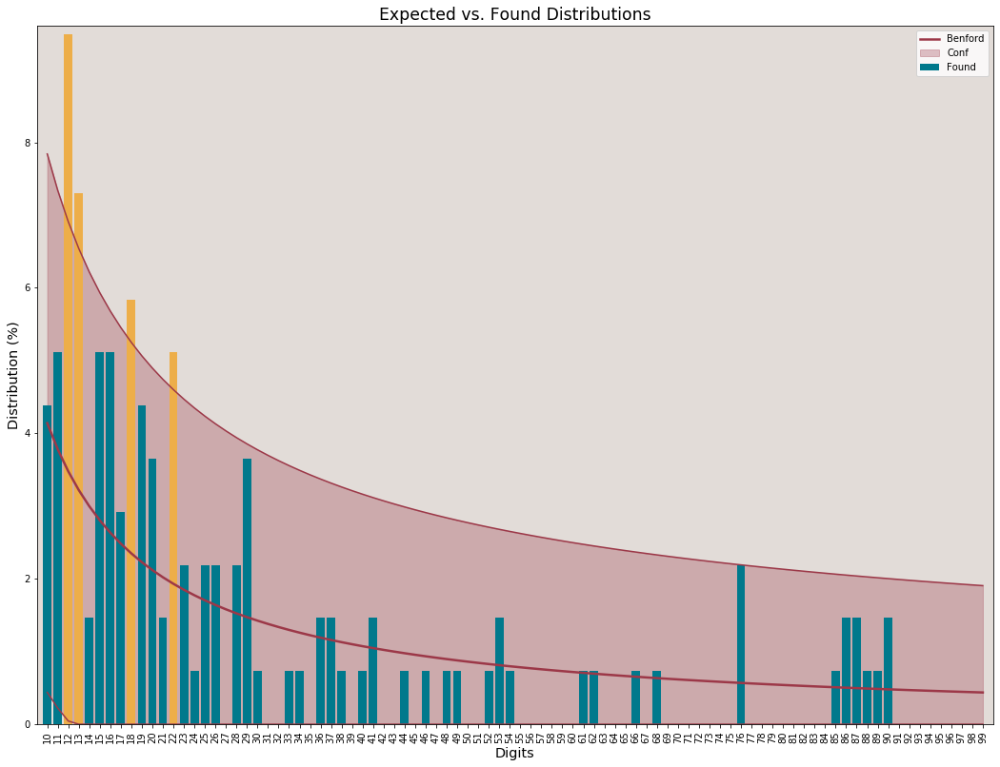



 #################  COUNTRY:  North Macedonia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
Sec_Dig
0    0.109489
1    0.087591
2    0.160584
3    0.116788
4    0.043796
5    0.080292
6    0.138686
7    0.058394
8    0.109489
9    0.094891
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.028269
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 14.7405.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0452.
Critical K-S for this series: 0.1162


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


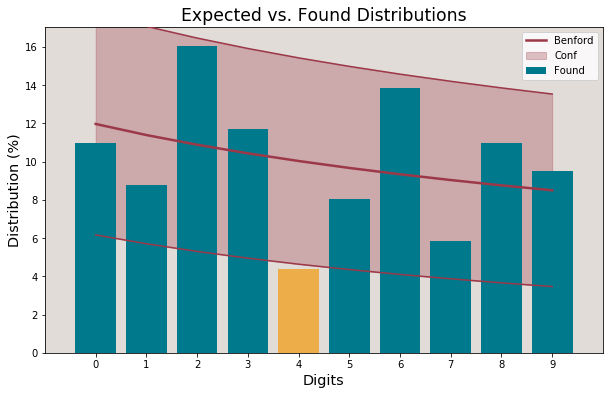

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Norway  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 116 registries.
First_1_Dig
1    0.344828
2    0.241379
3    0.137931
4    0.086207
5    0.060345
6    0.034483
7    0.034483
8    0.034483
9    0.025862
Name: Found, dtype: float64

Test performed on 116 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.027128
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 8.9260.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1221.
Critical K-S for this series: 0.1263


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


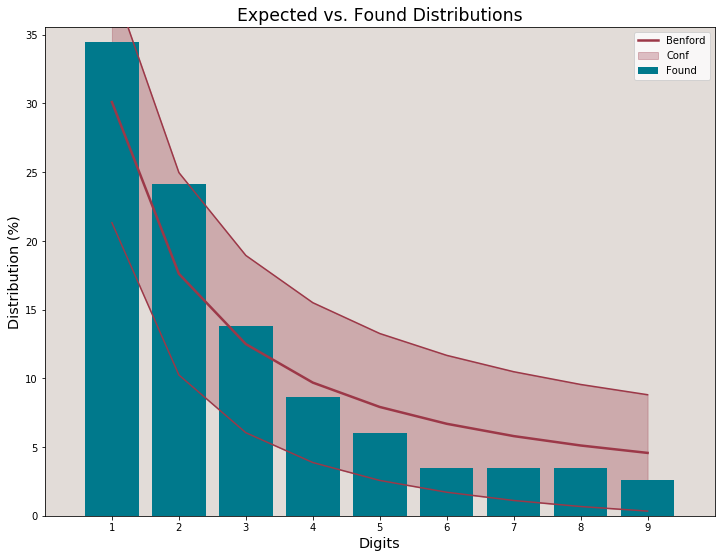



 #################  COUNTRY:  Norway  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 116 registries.
First_2_Dig
10    0.043103
11    0.060345
12    0.034483
13    0.043103
14    0.008621
15    0.025862
16    0.034483
17    0.025862
18    0.034483
19    0.034483
20    0.008621
21    0.017241
22    0.051724
23    0.043103
24    0.008621
25    0.017241
26    0.017241
27    0.034483
28    0.017241
29    0.025862
30    0.025862
31    0.008621
32    0.017241
33    0.000000
34    0.008621
35    0.034483
36    0.008621
37    0.008621
38    0.017241
39    0.008621
40    0.008621
41    0.008621
42    0.017241
43    0.025862
44    0.000000
45    0.008621
46    0.000000
47    0.008621
48    0.000000
49    0.008621
50    0.017241
51    0.000000
52    0.008621
53    0.008621
54    0.000000
55    0.000000
56    0.008621
57    0.000000
58    0.000000
59    0.017241
60    0.008621
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


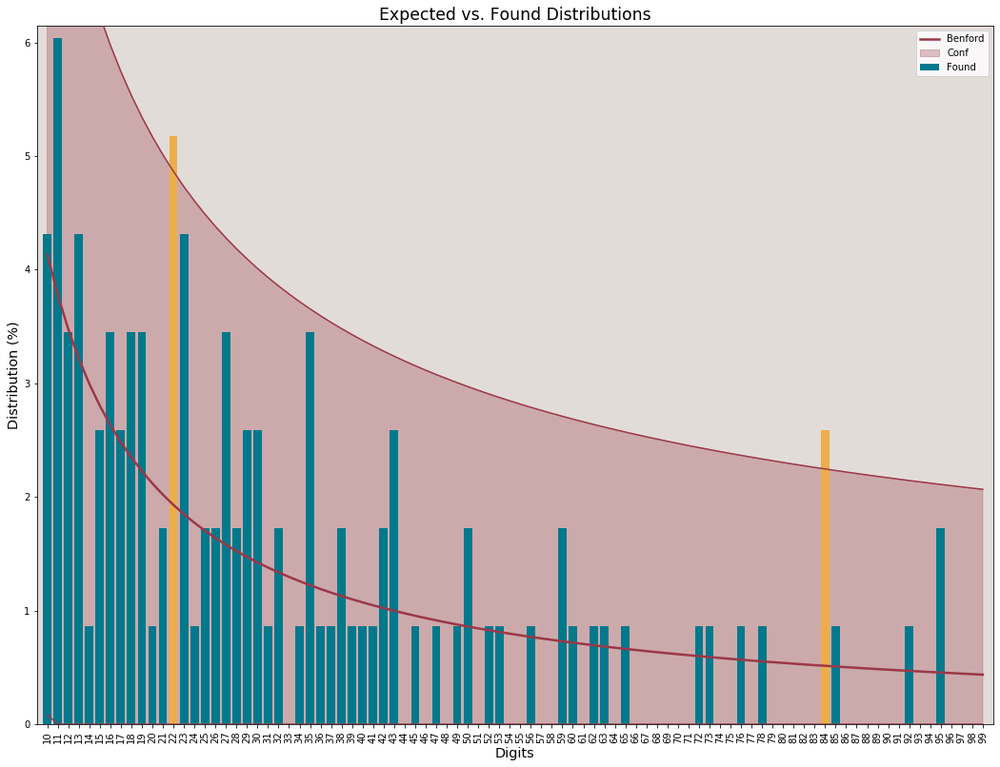



 #################  COUNTRY:  Norway  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 116 registries.
Sec_Dig
0    0.112069
1    0.094828
2    0.155172
3    0.137931
4    0.051724
5    0.120690
6    0.077586
7    0.077586
8    0.077586
9    0.094828
Name: Found, dtype: float64

Test performed on 116 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.022759
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.1761.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0533.
Critical K-S for this series: 0.1263


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


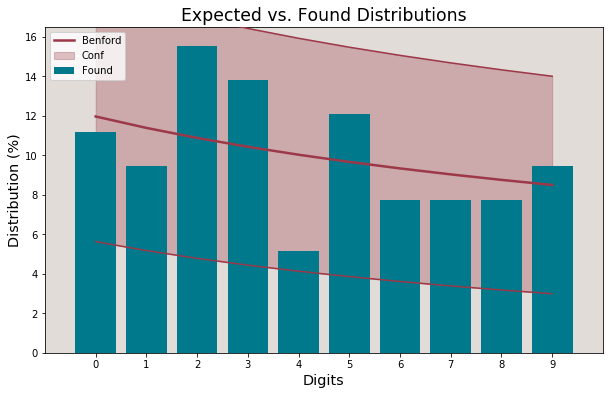

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Oman  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 131 registries.
First_1_Dig
1    0.480916
2    0.106870
3    0.053435
4    0.045802
5    0.053435
6    0.053435
7    0.076336
8    0.068702
9    0.061069
Name: Found, dtype: float64

Test performed on 131 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.480916  4.393241
Mean Absolute Deviation: 0.051354
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 30.2120.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1799.
Critical K-S for this series: 0.1188


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


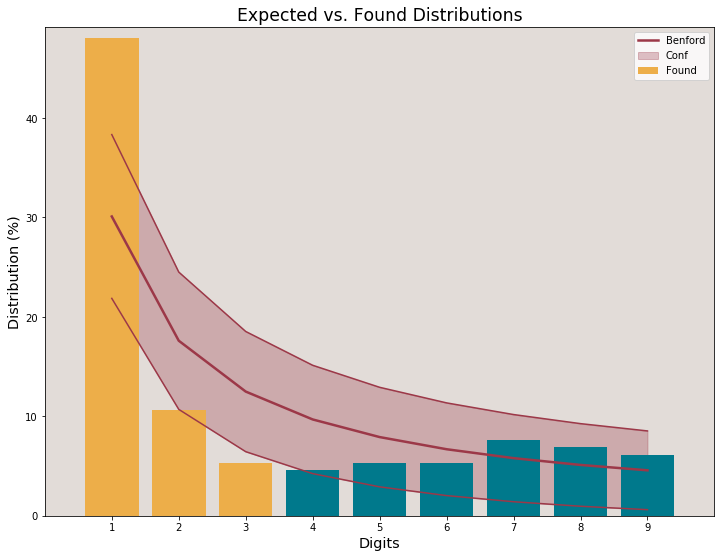



 #################  COUNTRY:  Oman  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 131 registries.
First_2_Dig
10    0.106870
11    0.106870
12    0.022901
13    0.068702
14    0.030534
15    0.053435
16    0.038168
17    0.022901
18    0.022901
19    0.007634
20    0.000000
21    0.038168
22    0.015267
23    0.000000
24    0.007634
25    0.007634
26    0.000000
27    0.007634
28    0.007634
29    0.022901
30    0.000000
31    0.000000
32    0.015267
33    0.000000
34    0.007634
35    0.007634
36    0.007634
37    0.007634
38    0.007634
39    0.000000
40    0.007634
41    0.000000
42    0.015267
43    0.000000
44    0.000000
45    0.000000
46    0.015267
47    0.000000
48    0.007634
49    0.000000
50    0.007634
51    0.015267
52    0.000000
53    0.007634
54    0.000000
55    0.007634
56    0.000000
57    0.007634
58    0.000000
59    0.007634
60    0.015267
61 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


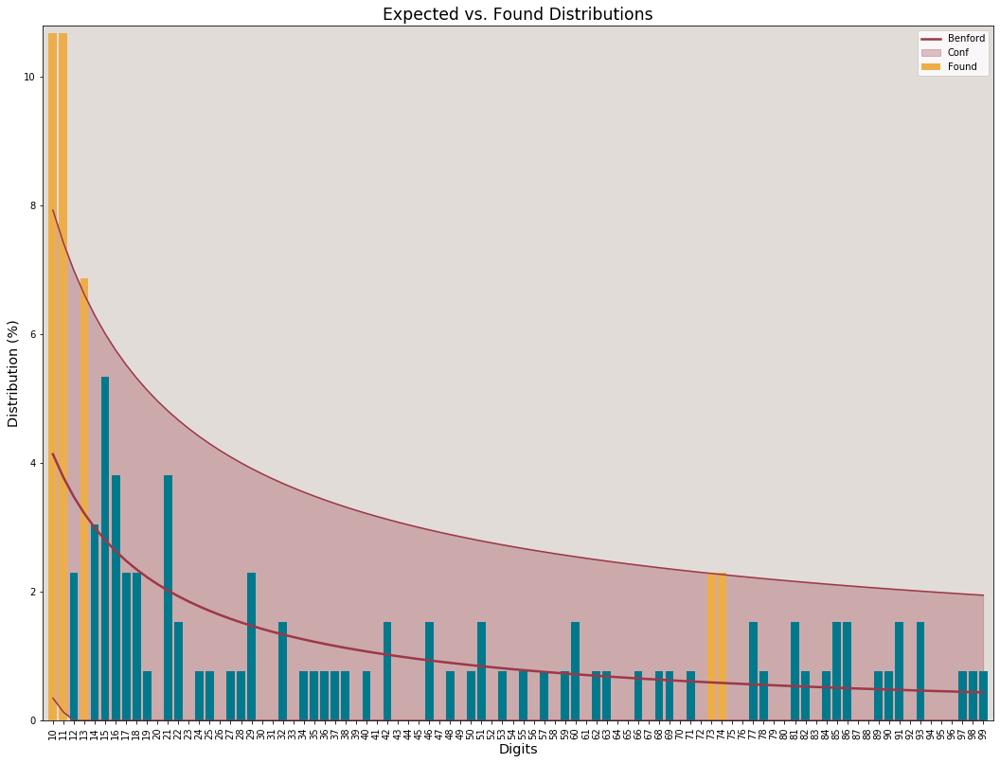



 #################  COUNTRY:  Oman  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 131 registries.
Sec_Dig
0    0.145038
1    0.198473
2    0.083969
3    0.122137
4    0.076336
5    0.091603
6    0.083969
7    0.068702
8    0.068702
9    0.061069
Name: Found, dtype: float64

Test performed on 131 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found  Z_score
Sec_Dig                             
1         0.11389  0.198473  2.90991
Mean Absolute Deviation: 0.025550
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 13.0788.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1099.
Critical K-S for this series: 0.1188


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


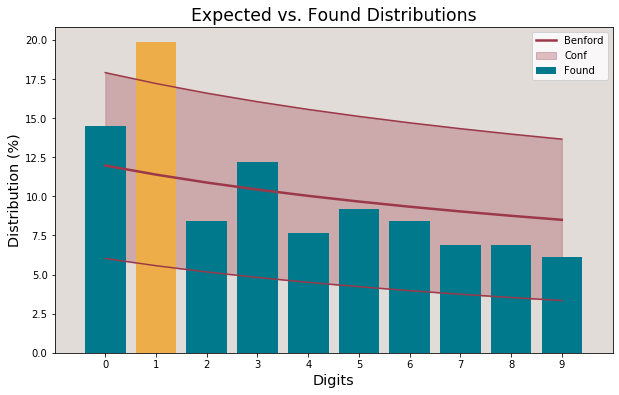

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Pakistan  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 141 registries.
First_1_Dig
1    0.354610
2    0.184397
3    0.092199
4    0.134752
5    0.078014
6    0.056738
7    0.042553
8    0.028369
9    0.028369
Name: Found, dtype: float64

Test performed on 141 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.022162
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 7.8572.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0670.
Critical K-S for this series: 0.1145


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


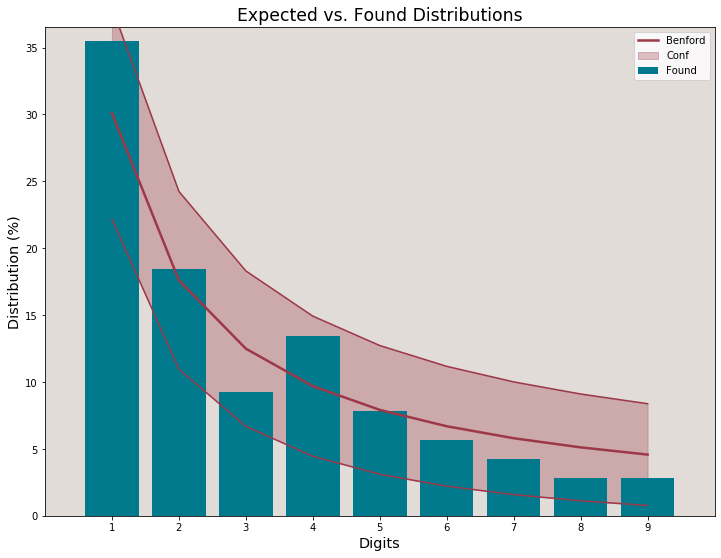



 #################  COUNTRY:  Pakistan  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 141 registries.
First_2_Dig
10    0.056738
11    0.035461
12    0.021277
13    0.035461
14    0.049645
15    0.049645
16    0.007092
17    0.049645
18    0.014184
19    0.035461
20    0.021277
21    0.035461
22    0.007092
23    0.000000
24    0.007092
25    0.028369
26    0.014184
27    0.042553
28    0.014184
29    0.014184
30    0.007092
31    0.014184
32    0.000000
33    0.028369
34    0.007092
35    0.007092
36    0.000000
37    0.000000
38    0.007092
39    0.021277
40    0.028369
41    0.014184
42    0.007092
43    0.014184
44    0.014184
45    0.007092
46    0.007092
47    0.014184
48    0.007092
49    0.021277
50    0.000000
51    0.014184
52    0.014184
53    0.028369
54    0.000000
55    0.000000
56    0.000000
57    0.000000
58    0.021277
59    0.000000
60    0.007092

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


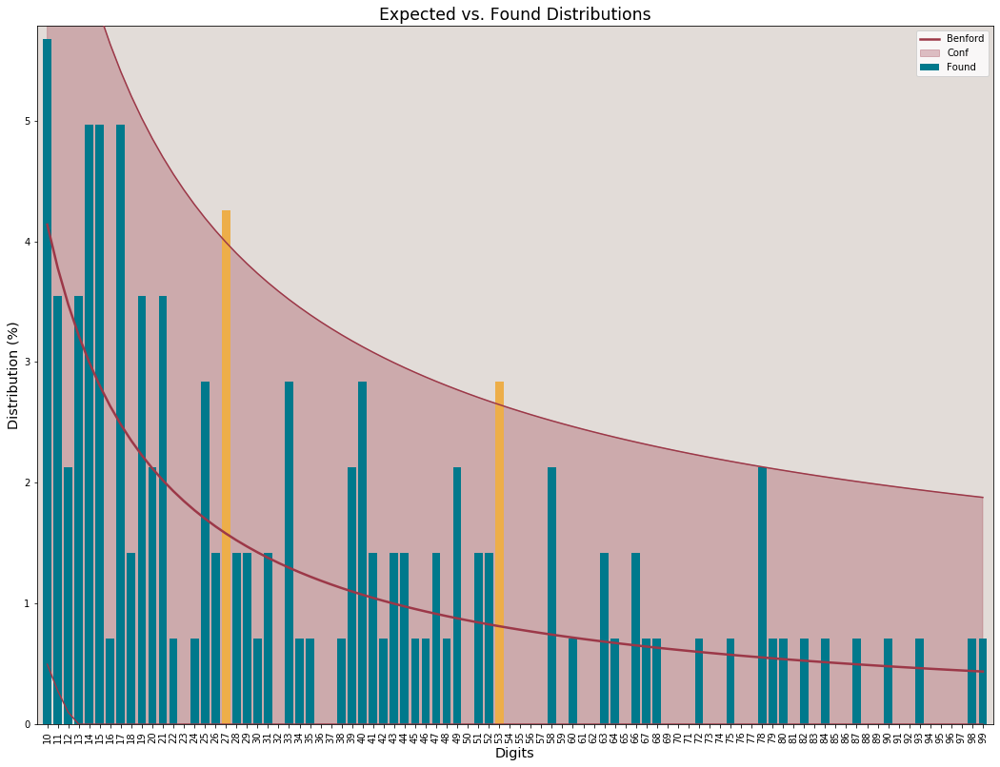



 #################  COUNTRY:  Pakistan  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 141 registries.
Sec_Dig
0    0.134752
1    0.113475
2    0.063830
3    0.127660
4    0.092199
5    0.099291
6    0.042553
7    0.120567
8    0.099291
9    0.106383
Name: Found, dtype: float64

Test performed on 141 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020868
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.0335.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0633.
Critical K-S for this series: 0.1145


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


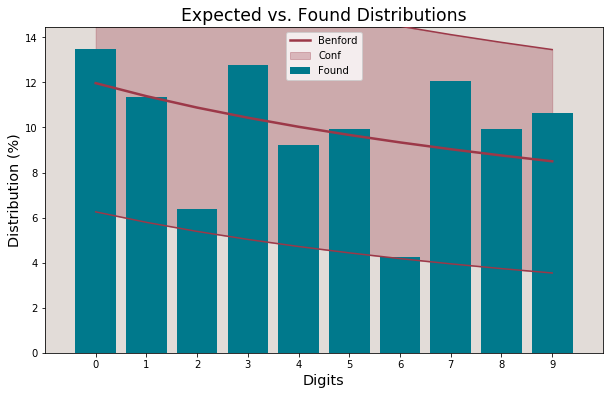

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Panama  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_1_Dig
1    0.459459
2    0.121622
3    0.040541
4    0.060811
5    0.027027
6    0.054054
7    0.081081
8    0.067568
9    0.087838
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1            0.301030  0.459459  4.112174
9            0.045757  0.087838  2.253219
Mean Absolute Deviation: 0.053336
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 38.5811.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


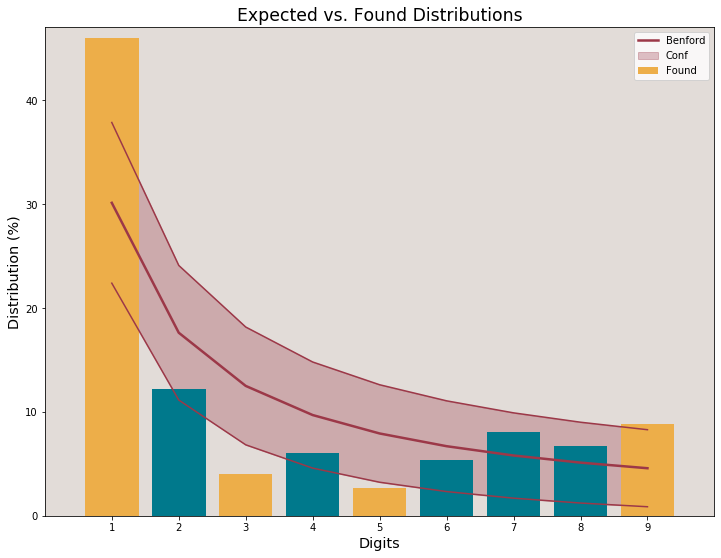



 #################  COUNTRY:  Panama  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_2_Dig
10    0.094595
11    0.087838
12    0.020270
13    0.040541
14    0.027027
15    0.040541
16    0.040541
17    0.054054
18    0.020270
19    0.033784
20    0.020270
21    0.006757
22    0.013514
23    0.006757
24    0.013514
25    0.013514
26    0.027027
27    0.006757
28    0.013514
29    0.000000
30    0.000000
31    0.006757
32    0.006757
33    0.000000
34    0.006757
35    0.000000
36    0.000000
37    0.020270
38    0.000000
39    0.000000
40    0.013514
41    0.006757
42    0.013514
43    0.006757
44    0.006757
45    0.006757
46    0.000000
47    0.000000
48    0.006757
49    0.000000
50    0.000000
51    0.006757
52    0.000000
53    0.000000
54    0.013514
55    0.000000
56    0.006757
57    0.000000
58    0.000000
59    0.000000
60    0.000000
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


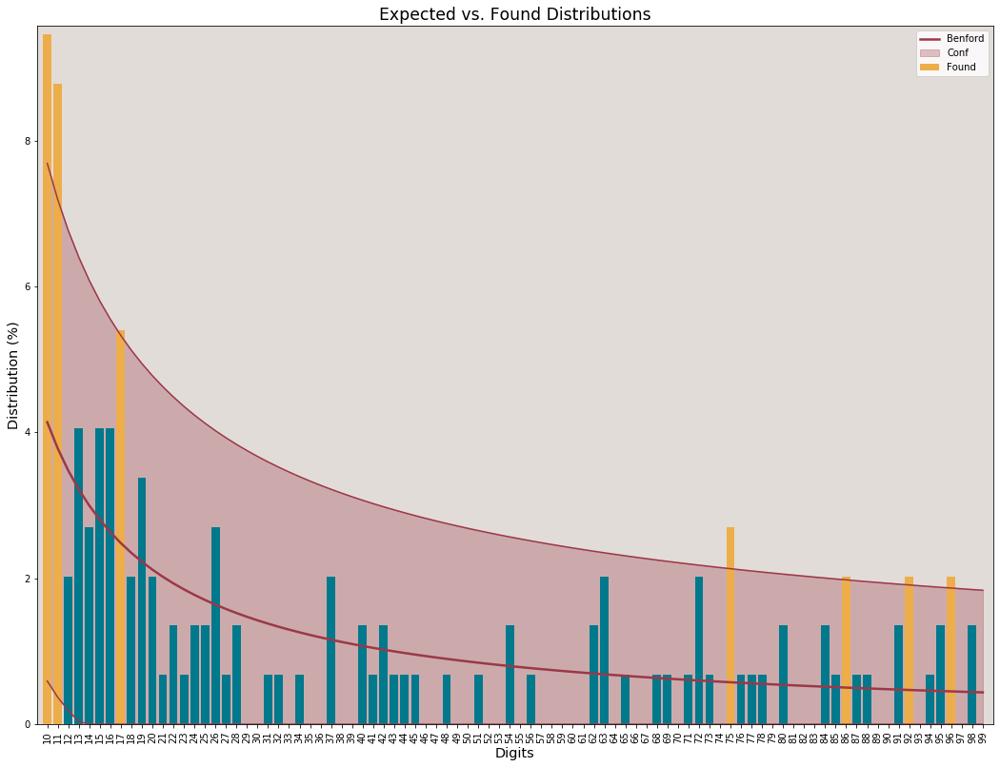



 #################  COUNTRY:  Panama  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
Sec_Dig
0    0.141892
1    0.135135
2    0.108108
3    0.081081
4    0.087838
5    0.114865
6    0.121622
7    0.094595
8    0.074324
9    0.040541
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.018827
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.7320.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0577.
Critical K-S for this series: 0.1118


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


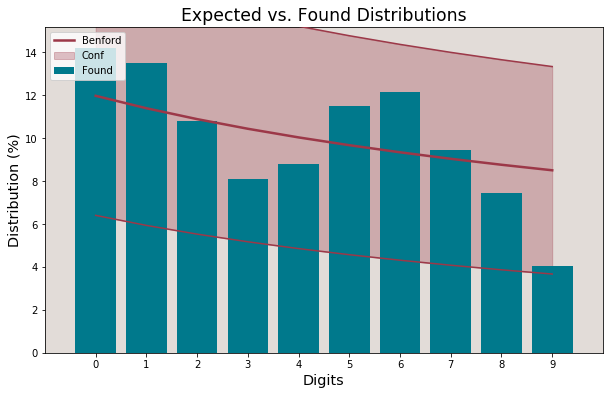

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Peru  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_1_Dig
1    0.116438
2    0.123288
3    0.315068
4    0.184932
5    0.082192
6    0.054795
7    0.054795
8    0.027397
9    0.041096
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.315068  6.822834
4            0.096910  0.184932  3.455260
Mean Absolute Deviation: 0.062480
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 74.7978.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.23

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


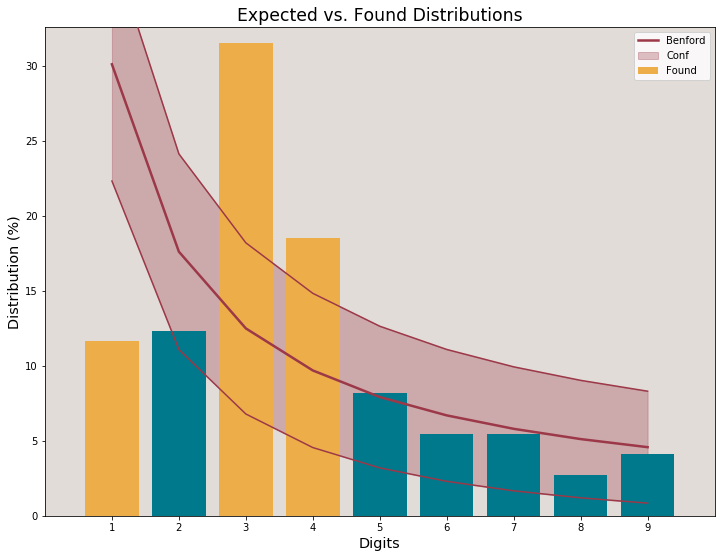



 #################  COUNTRY:  Peru  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_2_Dig
10    0.006849
11    0.020548
12    0.006849
13    0.006849
14    0.020548
15    0.027397
16    0.013699
17    0.000000
18    0.013699
19    0.000000
20    0.006849
21    0.013699
22    0.013699
23    0.000000
24    0.006849
25    0.006849
26    0.006849
27    0.013699
28    0.027397
29    0.027397
30    0.013699
31    0.027397
32    0.027397
33    0.013699
34    0.034247
35    0.041096
36    0.047945
37    0.041096
38    0.034247
39    0.034247
40    0.041096
41    0.006849
42    0.041096
43    0.013699
44    0.013699
45    0.027397
46    0.006849
47    0.013699
48    0.006849
49    0.013699
50    0.006849
51    0.000000
52    0.006849
53    0.006849
54    0.000000
55    0.020548
56    0.006849
57    0.006849
58    0.013699
59    0.013699
60    0.000000
61 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


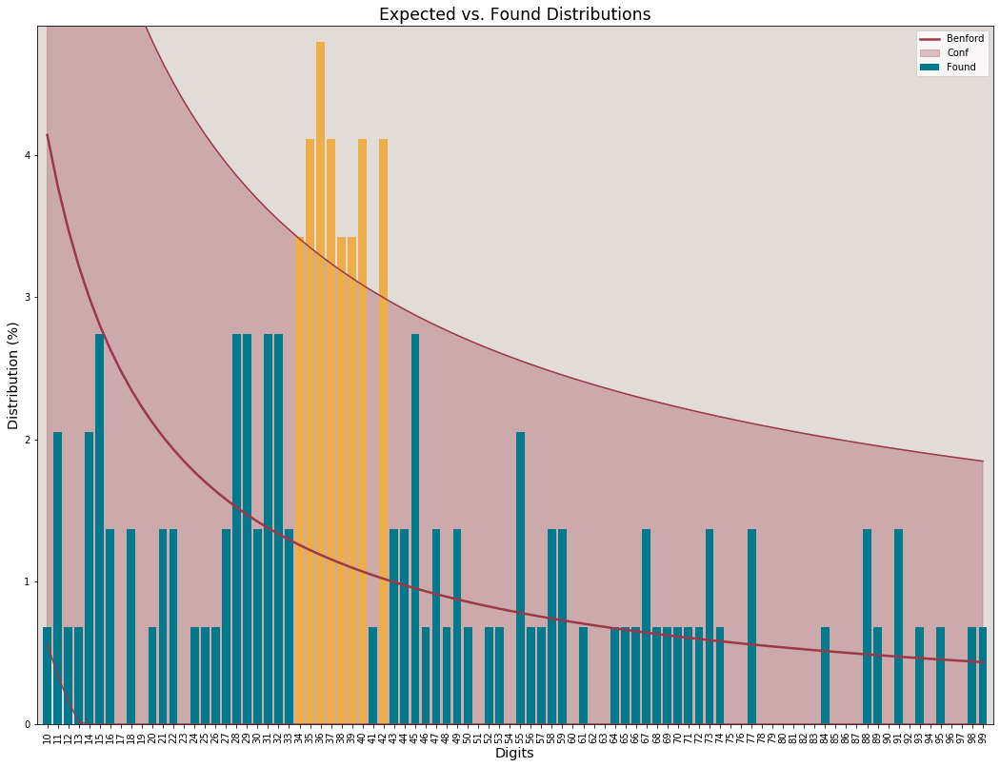



 #################  COUNTRY:  Peru  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
Sec_Dig
0    0.082192
1    0.095890
2    0.102740
3    0.061644
4    0.095890
5    0.136986
6    0.089041
7    0.102740
8    0.123288
9    0.109589
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.022601
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.6544.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1087.
Critical K-S for this series: 0.1126


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


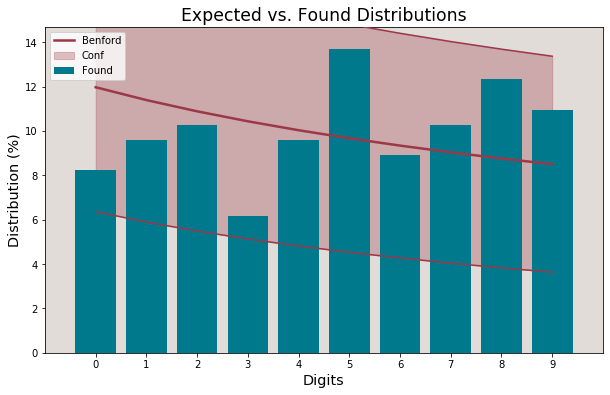

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Philippines  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_1_Dig
1    0.267123
2    0.308219
3    0.116438
4    0.075342
5    0.061644
6    0.061644
7    0.054795
8    0.020548
9    0.034247
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.308219  4.082795
Mean Absolute Deviation: 0.029362
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 19.5676.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0982.
Critical K-S for this series: 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


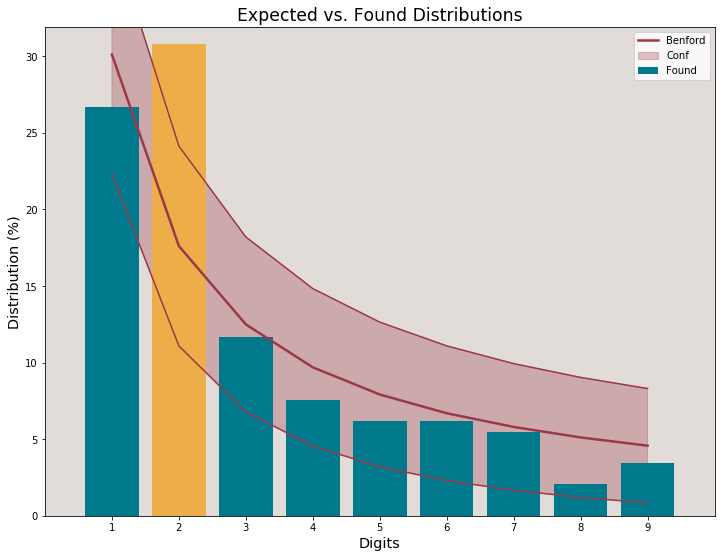



 #################  COUNTRY:  Philippines  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_2_Dig
10    0.041096
11    0.020548
12    0.013699
13    0.020548
14    0.027397
15    0.054795
16    0.020548
17    0.013699
18    0.034247
19    0.020548
20    0.061644
21    0.047945
22    0.020548
23    0.020548
24    0.020548
25    0.020548
26    0.020548
27    0.027397
28    0.034247
29    0.034247
30    0.006849
31    0.006849
32    0.020548
33    0.013699
34    0.013699
35    0.020548
36    0.006849
37    0.000000
38    0.020548
39    0.006849
40    0.000000
41    0.013699
42    0.000000
43    0.000000
44    0.006849
45    0.020548
46    0.000000
47    0.013699
48    0.006849
49    0.013699
50    0.000000
51    0.006849
52    0.000000
53    0.020548
54    0.000000
55    0.013699
56    0.006849
57    0.006849
58    0.000000
59    0.006849
60    0.006

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


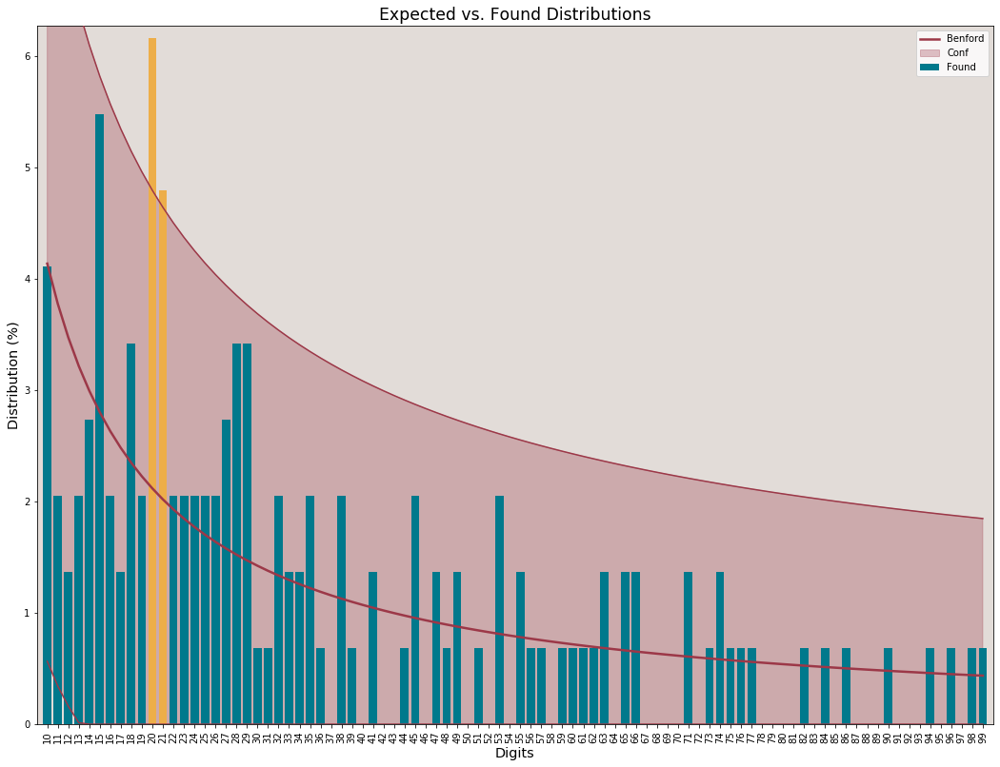



 #################  COUNTRY:  Philippines  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
Sec_Dig
0    0.123288
1    0.116438
2    0.068493
3    0.095890
4    0.095890
5    0.150685
6    0.089041
7    0.068493
8    0.102740
9    0.089041
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
5        0.096677  0.150685  2.068225
Mean Absolute Deviation: 0.015876
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 7.9524.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0470.
Critical K-S for this series: 0.1126


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


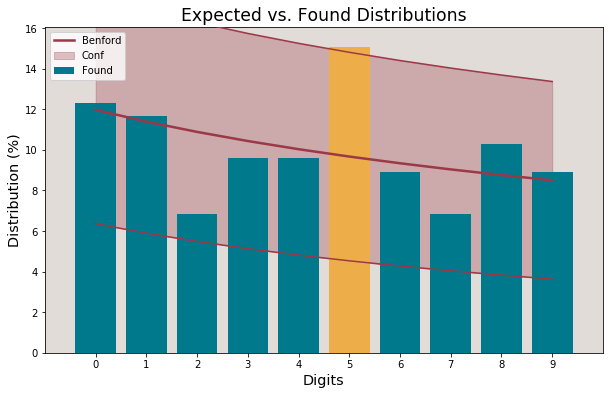

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Poland  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_1_Dig
1    0.072848
2    0.245033
3    0.370861
4    0.145695
5    0.079470
6    0.052980
7    0.013245
8    0.013245
9    0.006623
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.370861  9.016356
2            0.176091  0.245033  2.117319
Mean Absolute Deviation: 0.080875
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 121.9442.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


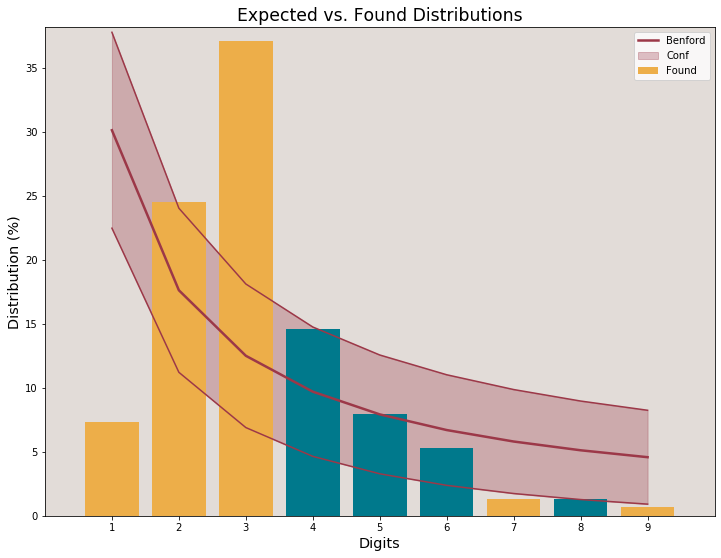



 #################  COUNTRY:  Poland  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_2_Dig
10    0.000000
11    0.013245
12    0.000000
13    0.000000
14    0.000000
15    0.013245
16    0.006623
17    0.006623
18    0.006623
19    0.026490
20    0.006623
21    0.013245
22    0.013245
23    0.026490
24    0.033113
25    0.019868
26    0.039735
27    0.039735
28    0.019868
29    0.033113
30    0.052980
31    0.079470
32    0.006623
33    0.033113
34    0.019868
35    0.033113
36    0.019868
37    0.046358
38    0.046358
39    0.033113
40    0.033113
41    0.019868
42    0.013245
43    0.013245
44    0.026490
45    0.006623
46    0.006623
47    0.019868
48    0.000000
49    0.006623
50    0.013245
51    0.006623
52    0.006623
53    0.000000
54    0.013245
55    0.000000
56    0.006623
57    0.013245
58    0.006623
59    0.013245
60    0.000000
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


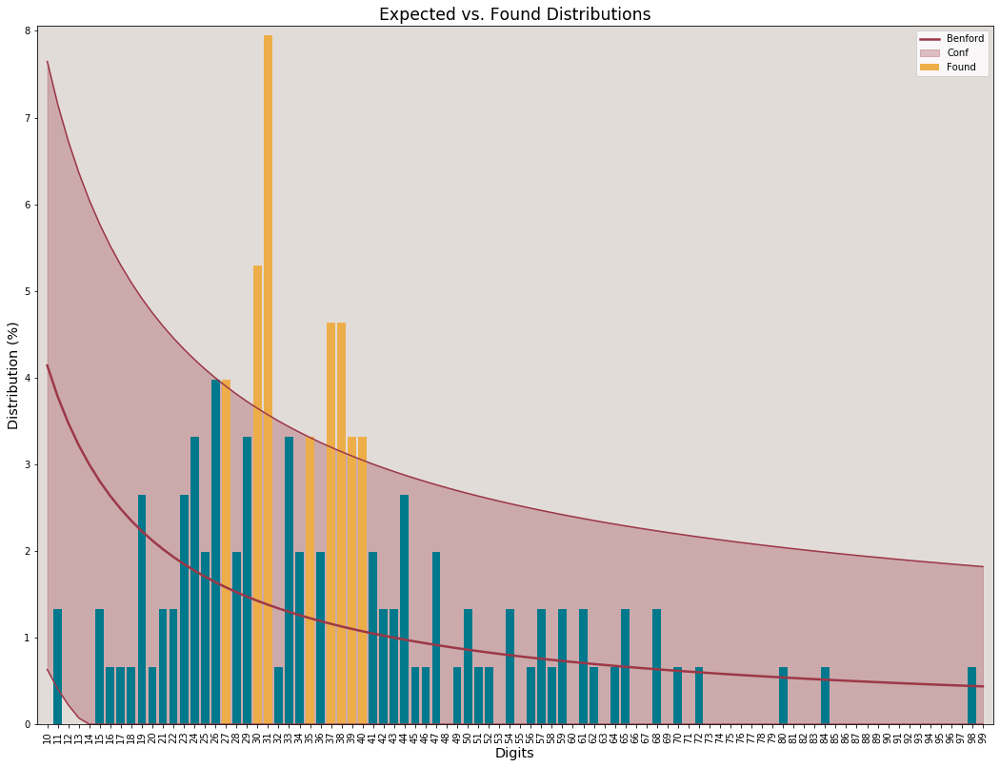



 #################  COUNTRY:  Poland  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
Sec_Dig
0    0.119205
1    0.145695
2    0.052980
3    0.072848
4    0.105960
5    0.086093
6    0.079470
7    0.125828
8    0.099338
9    0.112583
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.022457
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 11.3325.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0748.
Critical K-S for this series: 0.1107


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


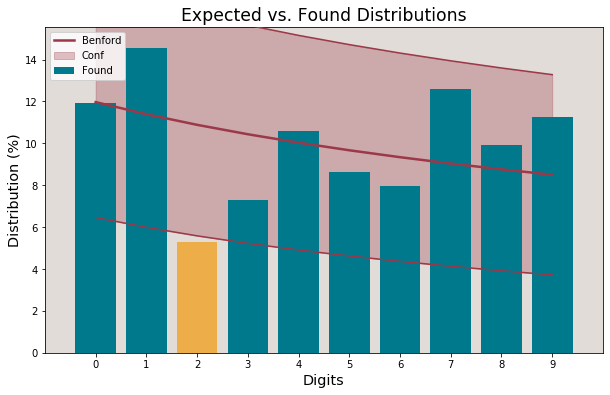

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Portugal  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_1_Dig
1    0.193333
2    0.280000
3    0.233333
4    0.086667
5    0.066667
6    0.046667
7    0.046667
8    0.026667
9    0.020000
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.233333  3.891531
2            0.176091  0.280000  3.233918
Mean Absolute Deviation: 0.047179
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 34.7283.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


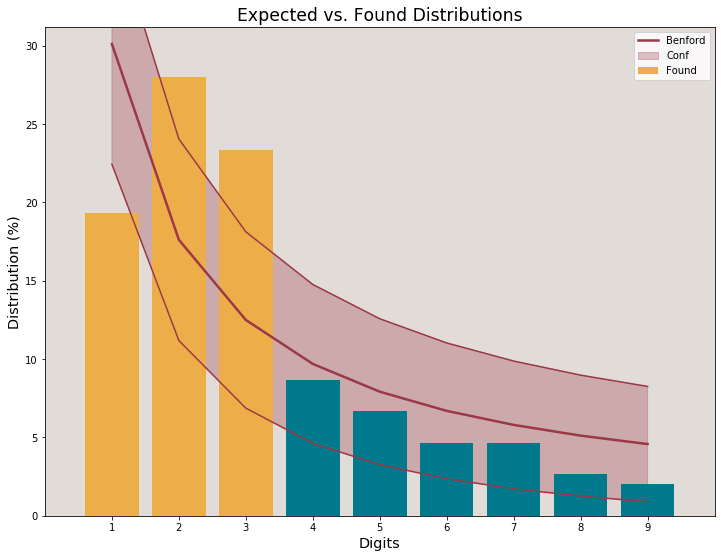



 #################  COUNTRY:  Portugal  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_2_Dig
10    0.013333
11    0.020000
12    0.006667
13    0.026667
14    0.013333
15    0.020000
16    0.020000
17    0.020000
18    0.033333
19    0.020000
20    0.026667
21    0.020000
22    0.046667
23    0.033333
24    0.006667
25    0.033333
26    0.026667
27    0.013333
28    0.026667
29    0.046667
30    0.026667
31    0.040000
32    0.026667
33    0.026667
34    0.026667
35    0.006667
36    0.026667
37    0.040000
38    0.006667
39    0.006667
40    0.006667
41    0.026667
42    0.006667
43    0.000000
44    0.013333
45    0.020000
46    0.006667
47    0.000000
48    0.006667
49    0.000000
50    0.000000
51    0.020000
52    0.006667
53    0.006667
54    0.013333
55    0.006667
56    0.000000
57    0.006667
58    0.000000
59    0.006667
60    0.006667

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


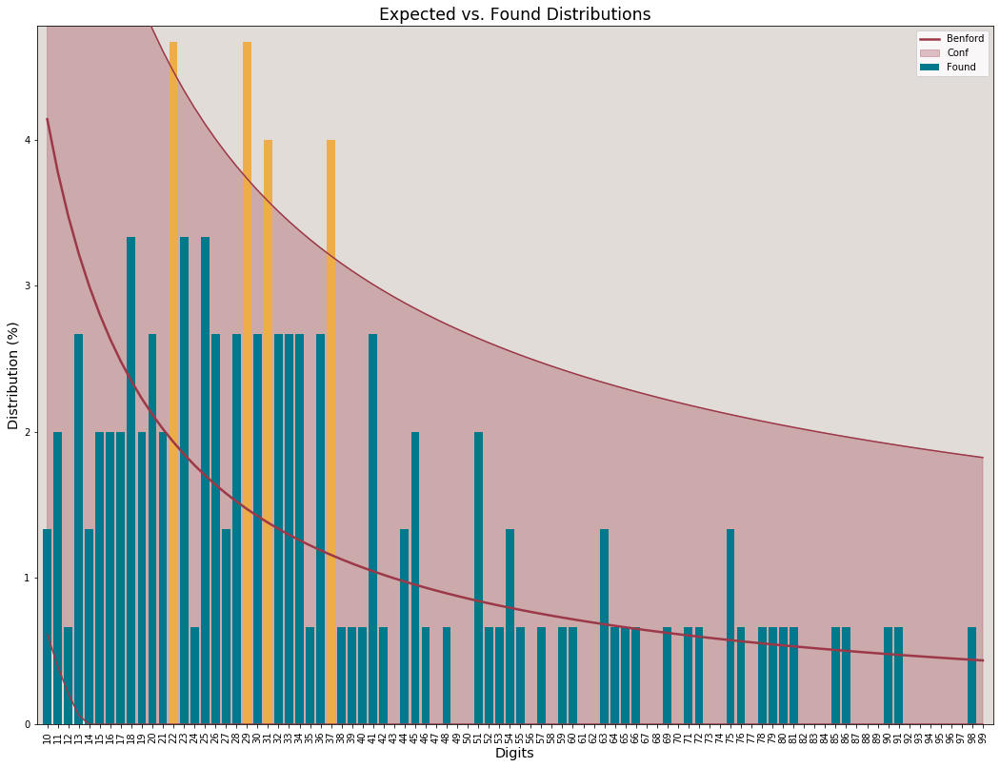



 #################  COUNTRY:  Portugal  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
Sec_Dig
0    0.093333
1    0.146667
2    0.100000
3    0.106667
4    0.080000
5    0.113333
6    0.100000
7    0.080000
8    0.086667
9    0.093333
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.013346
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 3.8196.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0263.
Critical K-S for this series: 0.1110


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


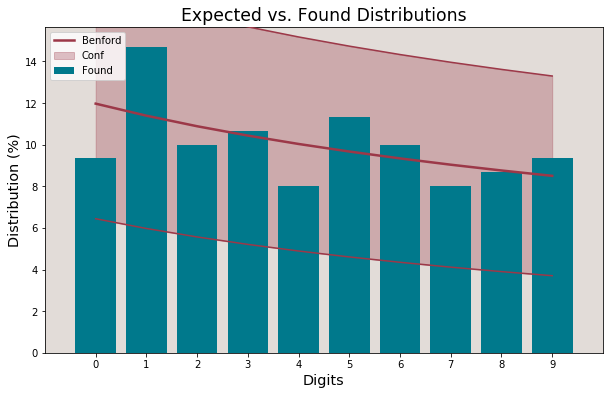

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Puerto Rico  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 129 registries.
First_1_Dig
1    0.209302
2    0.131783
3    0.131783
4    0.100775
5    0.100775
6    0.162791
7    0.093023
8    0.031008
9    0.038760
Name: Found, dtype: float64

Test performed on 129 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
6            0.066947  0.162791  4.179393
Mean Absolute Deviation: 0.036262
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 27.4637.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1360.
Critical K-S for this series: 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


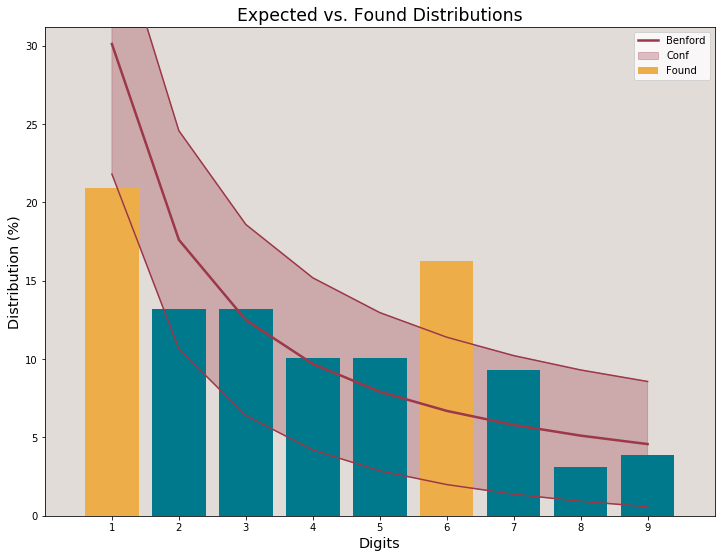



 #################  COUNTRY:  Puerto Rico  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 129 registries.
First_2_Dig
10    0.031008
11    0.038760
12    0.038760
13    0.015504
14    0.015504
15    0.007752
16    0.007752
17    0.007752
18    0.031008
19    0.015504
20    0.015504
21    0.007752
22    0.015504
23    0.023256
24    0.007752
25    0.023256
26    0.000000
27    0.007752
28    0.015504
29    0.015504
30    0.015504
31    0.007752
32    0.007752
33    0.015504
34    0.000000
35    0.015504
36    0.015504
37    0.000000
38    0.015504
39    0.038760
40    0.000000
41    0.000000
42    0.007752
43    0.015504
44    0.007752
45    0.007752
46    0.000000
47    0.046512
48    0.007752
49    0.007752
50    0.007752
51    0.023256
52    0.007752
53    0.015504
54    0.007752
55    0.000000
56    0.000000
57    0.023256
58    0.015504
59    0.000000
60    0.015

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


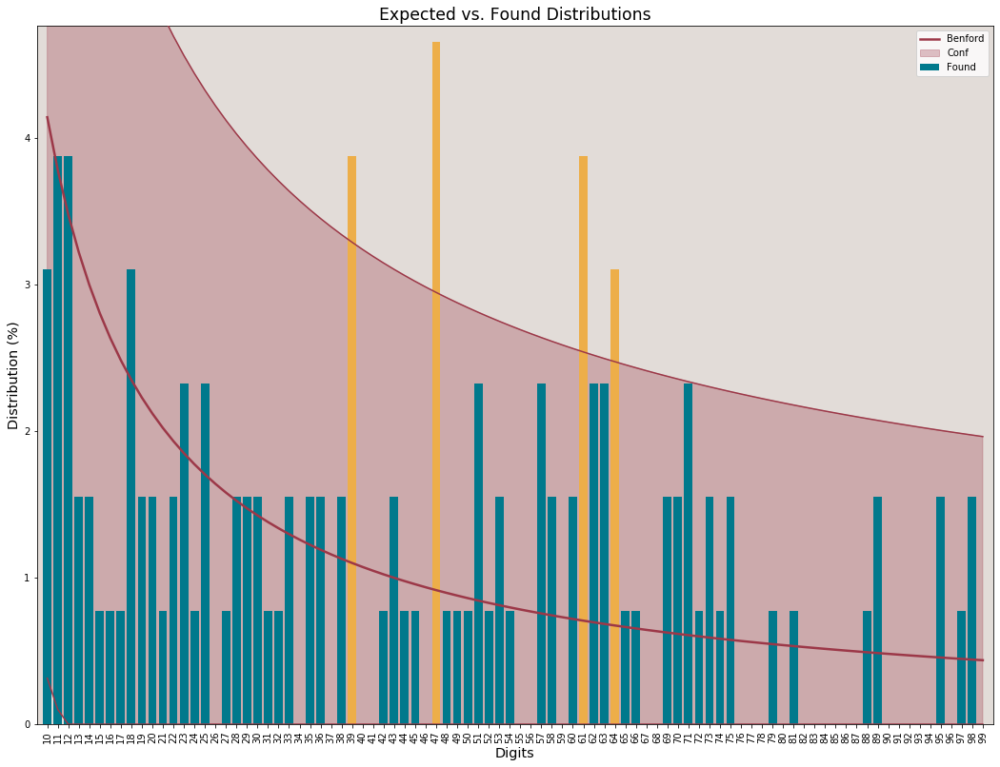



 #################  COUNTRY:  Puerto Rico  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 129 registries.
Sec_Dig
0    0.100775
1    0.147287
2    0.108527
3    0.124031
4    0.077519
5    0.093023
6    0.031008
7    0.093023
8    0.108527
9    0.116279
Name: Found, dtype: float64

Test performed on 129 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.021602
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 10.3302.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0549.
Critical K-S for this series: 0.1197


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


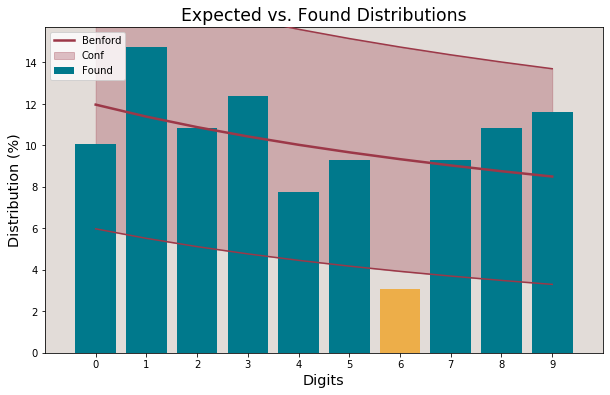

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Qatar  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_1_Dig
1    0.414966
2    0.163265
3    0.074830
4    0.068027
5    0.074830
6    0.081633
7    0.027211
8    0.047619
9    0.047619
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.414966  2.921614
Mean Absolute Deviation: 0.028996
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 13.6535.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1139.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


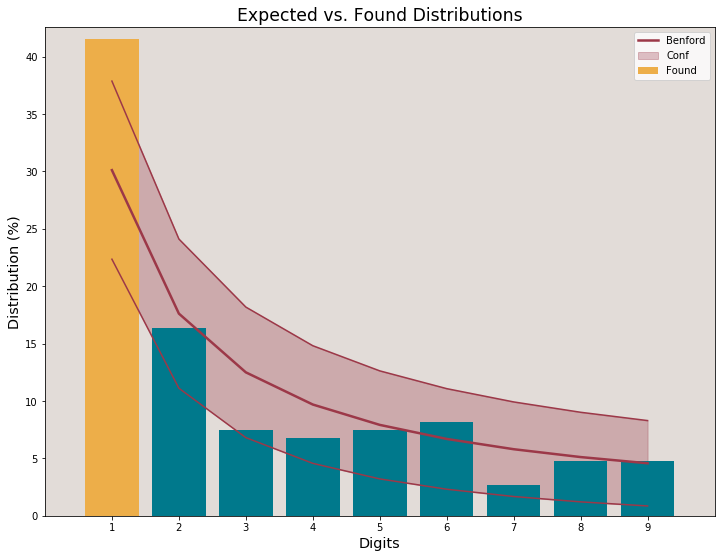



 #################  COUNTRY:  Qatar  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_2_Dig
10    0.047619
11    0.068027
12    0.027211
13    0.047619
14    0.013605
15    0.061224
16    0.027211
17    0.068027
18    0.020408
19    0.034014
20    0.000000
21    0.027211
22    0.013605
23    0.020408
24    0.000000
25    0.020408
26    0.020408
27    0.013605
28    0.027211
29    0.020408
30    0.006803
31    0.000000
32    0.000000
33    0.000000
34    0.013605
35    0.000000
36    0.000000
37    0.013605
38    0.013605
39    0.027211
40    0.000000
41    0.013605
42    0.000000
43    0.000000
44    0.020408
45    0.013605
46    0.006803
47    0.006803
48    0.000000
49    0.006803
50    0.000000
51    0.013605
52    0.006803
53    0.006803
54    0.013605
55    0.006803
56    0.013605
57    0.000000
58    0.006803
59    0.006803
60    0.020408
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


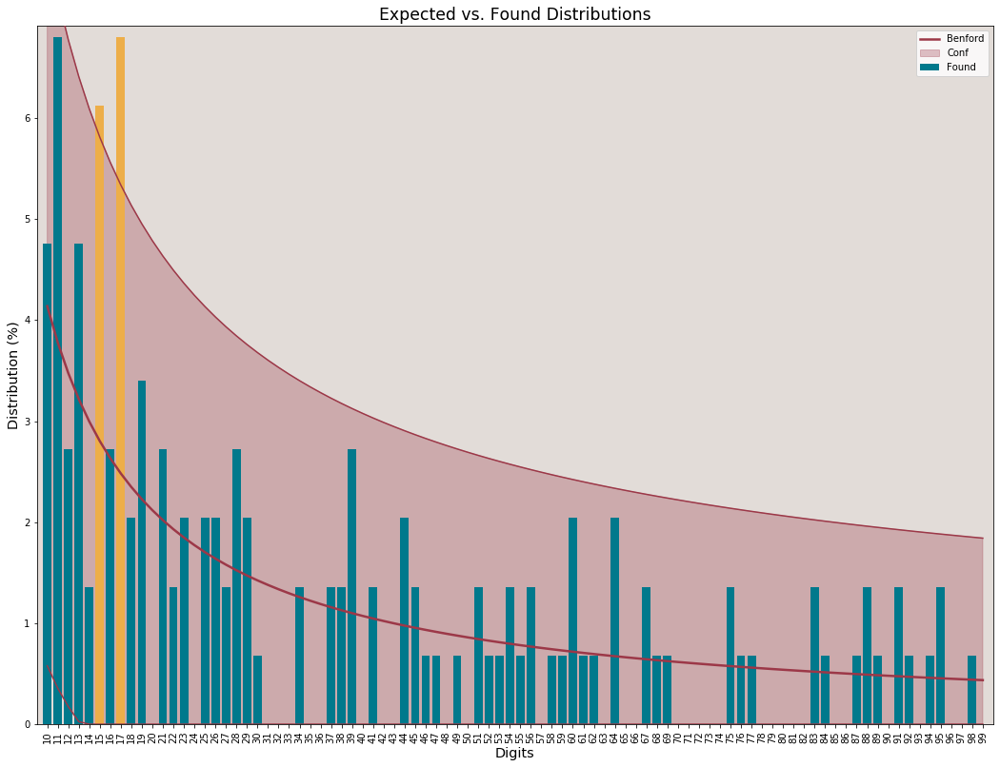



 #################  COUNTRY:  Qatar  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
Sec_Dig
0    0.074830
1    0.142857
2    0.061224
3    0.088435
4    0.095238
5    0.129252
6    0.074830
7    0.129252
8    0.095238
9    0.108844
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.026391
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 12.7065.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0844.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


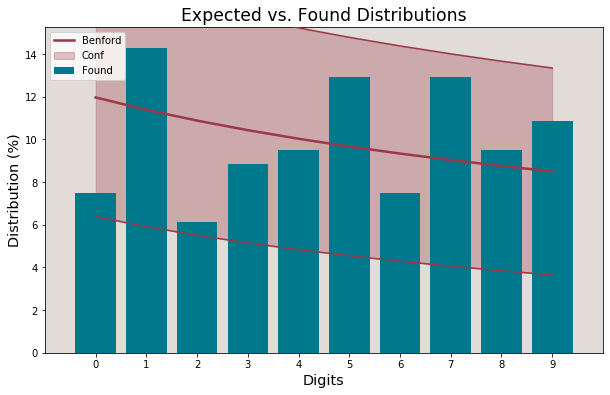

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Romania  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 152 registries.
First_1_Dig
1    0.355263
2    0.210526
3    0.223684
4    0.105263
5    0.026316
6    0.039474
7    0.019737
8    0.013158
9    0.006579
Name: Found, dtype: float64

Test performed on 152 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found  Z_score
First_1_Dig                             
3            0.124939  0.223684  3.55924
Mean Absolute Deviation: 0.043504
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 34.7837.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1958.
Critical K-S for this series: 0.1103


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


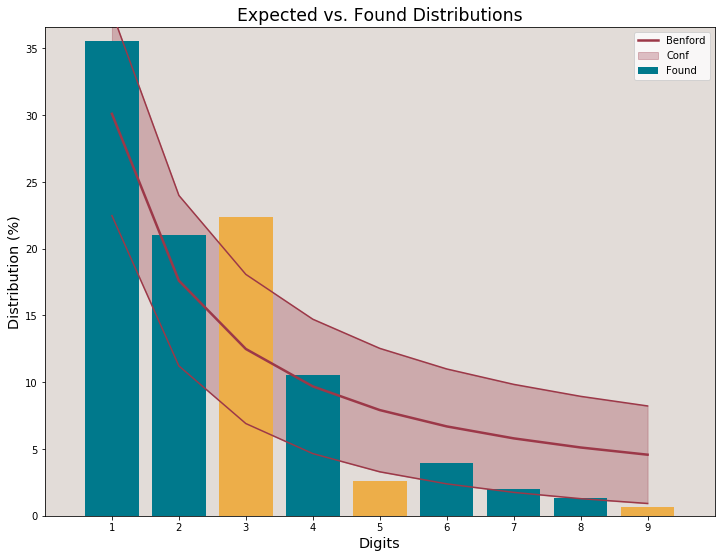



 #################  COUNTRY:  Romania  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 152 registries.
First_2_Dig
10    0.013158
11    0.052632
12    0.052632
13    0.032895
14    0.039474
15    0.019737
16    0.039474
17    0.006579
18    0.019737
19    0.078947
20    0.006579
21    0.032895
22    0.019737
23    0.019737
24    0.026316
25    0.026316
26    0.039474
27    0.026316
28    0.000000
29    0.013158
30    0.019737
31    0.026316
32    0.072368
33    0.026316
34    0.019737
35    0.006579
36    0.019737
37    0.000000
38    0.013158
39    0.019737
40    0.006579
41    0.019737
42    0.006579
43    0.019737
44    0.013158
45    0.019737
46    0.013158
47    0.000000
48    0.000000
49    0.006579
50    0.000000
51    0.000000
52    0.006579
53    0.000000
54    0.000000
55    0.006579
56    0.000000
57    0.000000
58    0.000000
59    0.013158
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


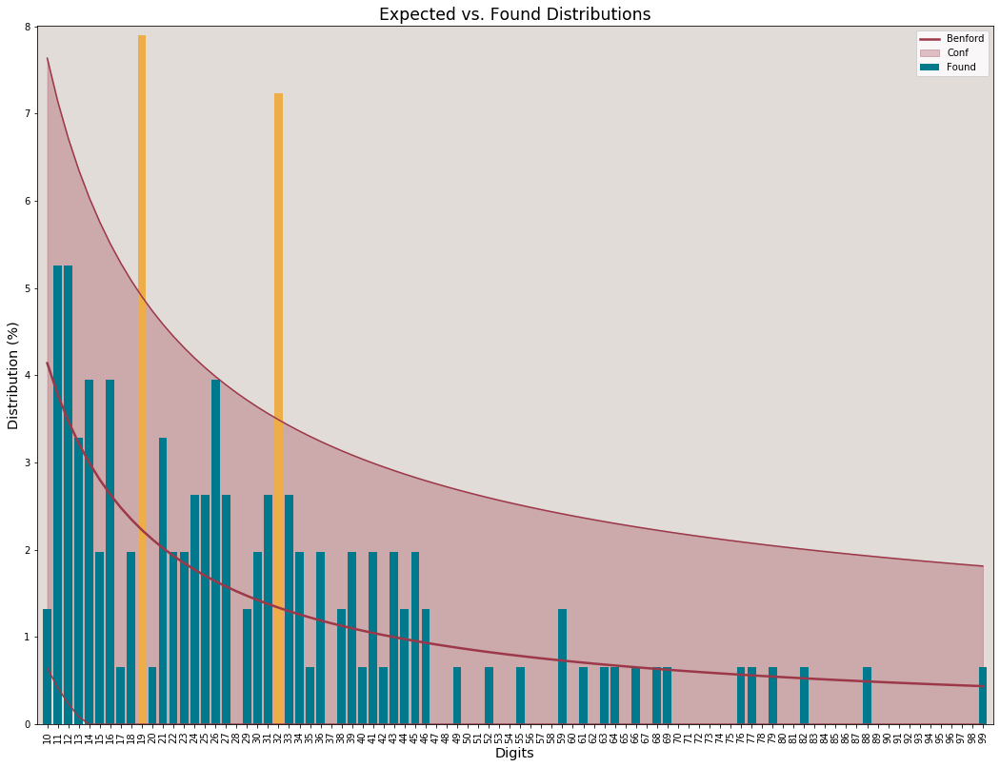



 #################  COUNTRY:  Romania  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 152 registries.
Sec_Dig
0    0.046053
1    0.138158
2    0.164474
3    0.105263
4    0.105263
5    0.078947
6    0.125000
7    0.039474
8    0.046053
9    0.151316
Name: Found, dtype: float64

Test performed on 152 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
9        0.084997  0.151316  2.786430
2        0.108821  0.164474  2.073023
Mean Absolute Deviation: 0.036750
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 29.3696.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0736.
Critical K-S for this series: 0.1103


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


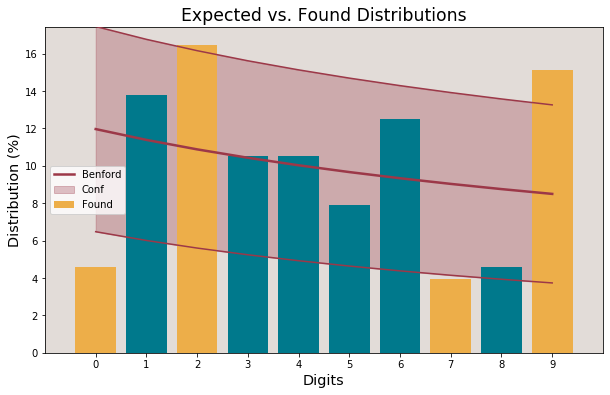

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Russia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_1_Dig
1    0.168919
2    0.040541
3    0.033784
4    0.040541
5    0.209459
6    0.189189
7    0.081081
8    0.175676
9    0.060811
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
8            0.051153  0.175676  6.689656
6            0.066947  0.189189  5.785797
5            0.079181  0.209459  5.717335
Mean Absolute Deviation: 0.092264
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 150.4352.
Critical Chi-square for this series: 15.5

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


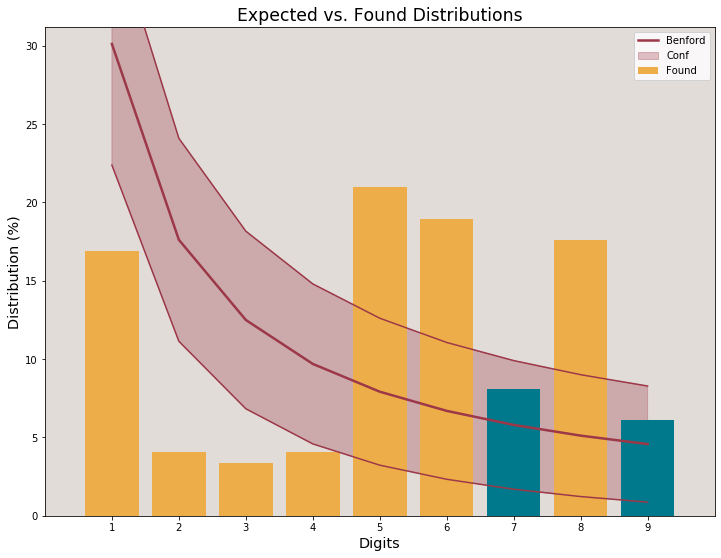



 #################  COUNTRY:  Russia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_2_Dig
10    0.060811
11    0.033784
12    0.006757
13    0.006757
14    0.013514
15    0.013514
16    0.013514
17    0.006757
18    0.006757
19    0.006757
20    0.000000
21    0.013514
22    0.006757
23    0.000000
24    0.000000
25    0.006757
26    0.000000
27    0.013514
28    0.000000
29    0.000000
30    0.013514
31    0.000000
32    0.000000
33    0.013514
34    0.006757
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.006757
41    0.000000
42    0.006757
43    0.000000
44    0.006757
45    0.006757
46    0.000000
47    0.013514
48    0.000000
49    0.000000
50    0.006757
51    0.013514
52    0.027027
53    0.020270
54    0.033784
55    0.006757
56    0.013514
57    0.013514
58    0.054054
59    0.020270
60    0.013514
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


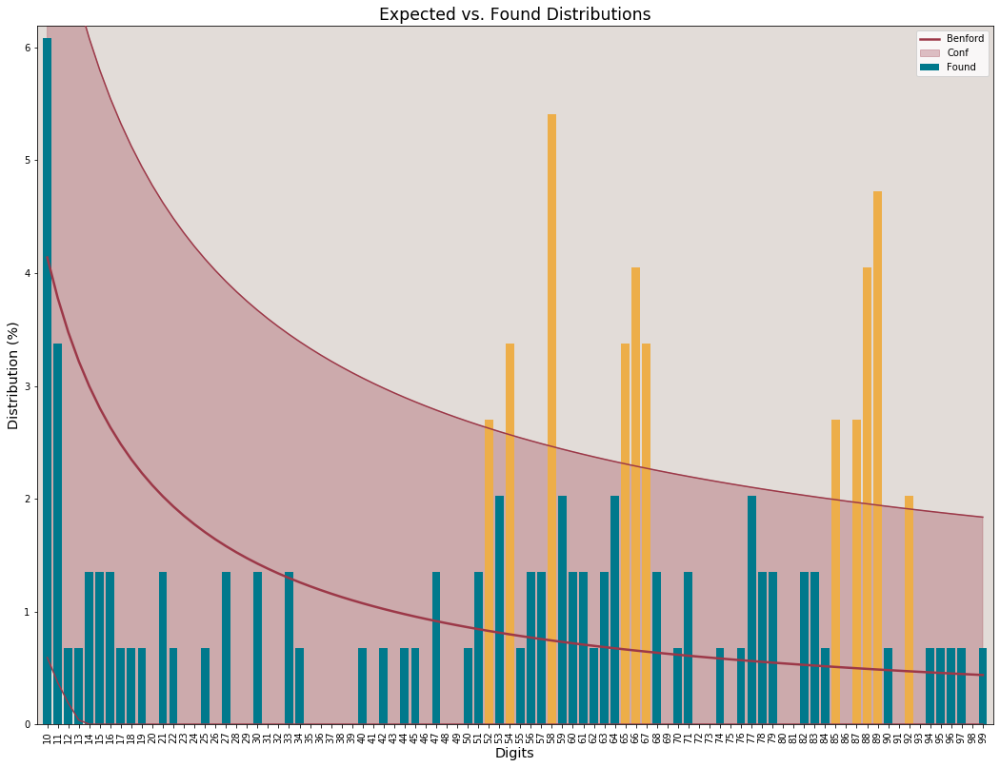



 #################  COUNTRY:  Russia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
Sec_Dig
0    0.114865
1    0.087838
2    0.087838
3    0.067568
4    0.101351
5    0.101351
6    0.081081
7    0.135135
8    0.128378
9    0.094595
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020181
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 9.9613.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0952.
Critical K-S for this series: 0.1118


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


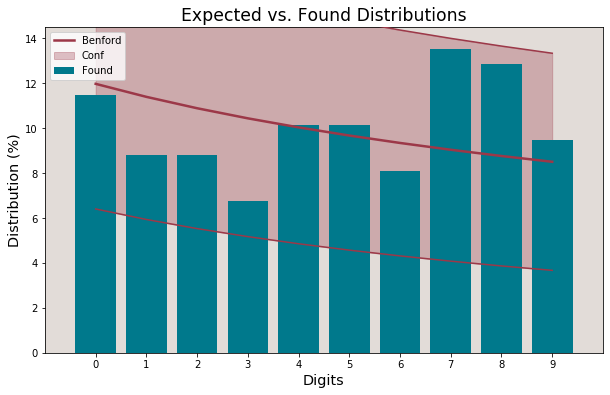

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Saudi Arabia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 149 registries.
First_1_Dig
1    0.409396
2    0.248322
3    0.208054
4    0.093960
5    0.013423
6    0.006711
7    0.006711
8    0.000000
9    0.013423
Name: Found, dtype: float64

Test performed on 149 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.208054  2.944465
1            0.301030  0.409396  2.794414
2            0.176091  0.248322  2.207229
Mean Absolute Deviation: 0.058603
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 52.4742.
Critical Chi-square for this series:

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


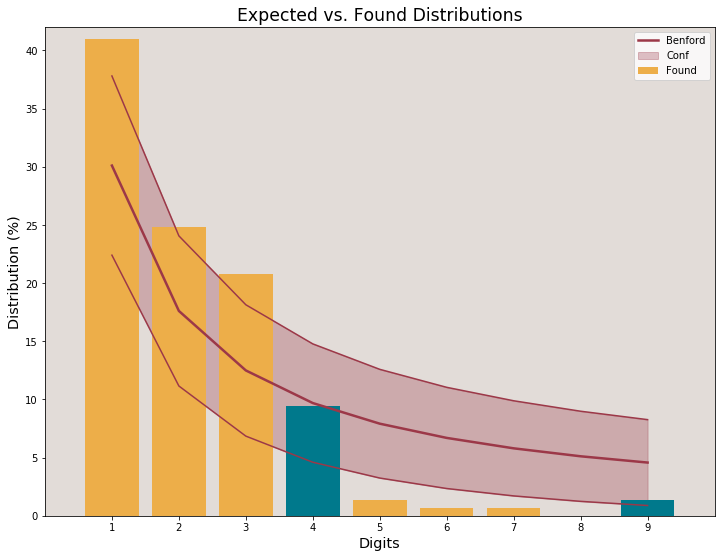



 #################  COUNTRY:  Saudi Arabia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 149 registries.
First_2_Dig
10    0.006711
11    0.073826
12    0.026846
13    0.067114
14    0.020134
15    0.046980
16    0.046980
17    0.033557
18    0.033557
19    0.053691
20    0.020134
21    0.006711
22    0.026846
23    0.026846
24    0.026846
25    0.046980
26    0.040268
27    0.026846
28    0.013423
29    0.013423
30    0.013423
31    0.033557
32    0.013423
33    0.046980
34    0.006711
35    0.013423
36    0.013423
37    0.013423
38    0.013423
39    0.040268
40    0.000000
41    0.013423
42    0.026846
43    0.020134
44    0.000000
45    0.006711
46    0.000000
47    0.013423
48    0.000000
49    0.013423
50    0.000000
51    0.013423
52    0.000000
53    0.000000
54    0.000000
55    0.000000
56    0.000000
57    0.000000
58    0.000000
59    0.000000
60    0.00

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


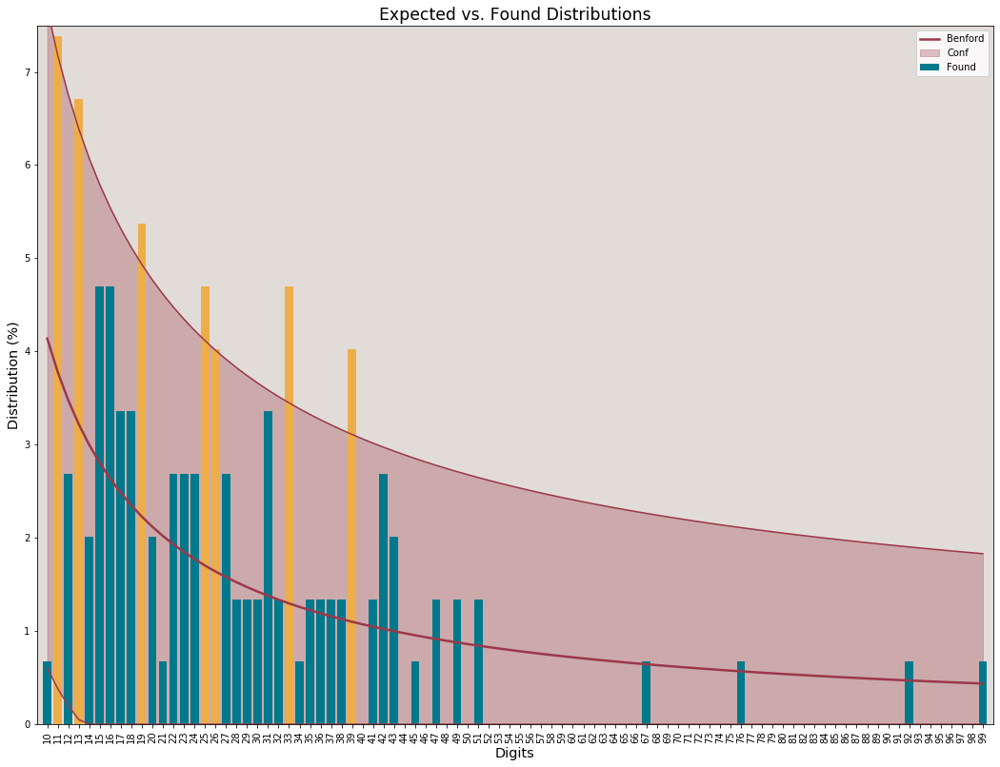



 #################  COUNTRY:  Saudi Arabia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 149 registries.
Sec_Dig
0    0.040268
1    0.140940
2    0.100671
3    0.161074
4    0.053691
5    0.114094
6    0.107383
7    0.093960
8    0.060403
9    0.127517
Name: Found, dtype: float64

Test performed on 149 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
3         0.10433  0.161074  2.131884
Mean Absolute Deviation: 0.032269
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 21.9530.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0794.
Critical K-S for this series: 0.1114


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


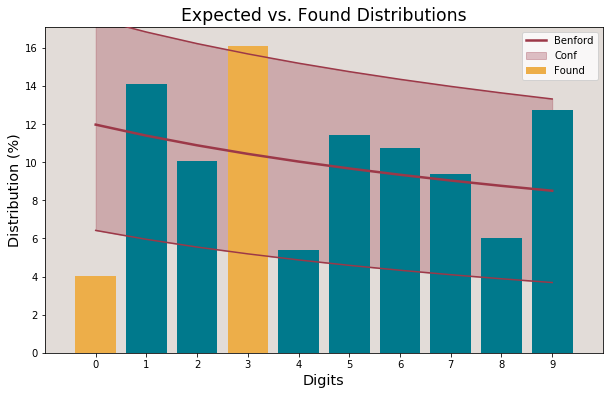

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Senegal  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 132 registries.
First_1_Dig
1    0.507576
2    0.015152
3    0.037879
4    0.030303
5    0.060606
6    0.083333
7    0.045455
8    0.083333
9    0.136364
Name: Found, dtype: float64

Test performed on 132 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1            0.301030  0.507576  5.078443
9            0.045757  0.136364  4.773507
Mean Absolute Deviation: 0.076827
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 79.9908.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


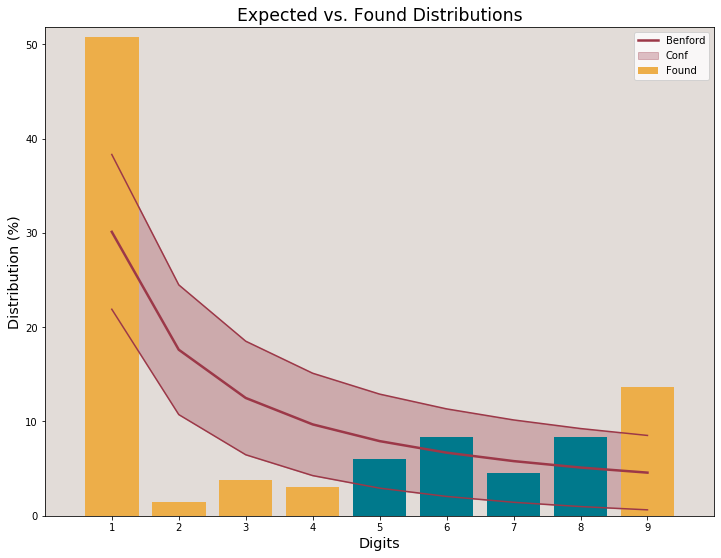



 #################  COUNTRY:  Senegal  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 132 registries.
First_2_Dig
10    0.068182
11    0.098485
12    0.128788
13    0.075758
14    0.053030
15    0.045455
16    0.007576
17    0.030303
18    0.000000
19    0.000000
20    0.007576
21    0.007576
22    0.000000
23    0.000000
24    0.000000
25    0.000000
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.007576
31    0.007576
32    0.000000
33    0.000000
34    0.000000
35    0.007576
36    0.000000
37    0.015152
38    0.000000
39    0.000000
40    0.000000
41    0.007576
42    0.007576
43    0.000000
44    0.000000
45    0.007576
46    0.007576
47    0.000000
48    0.000000
49    0.000000
50    0.000000
51    0.015152
52    0.007576
53    0.000000
54    0.000000
55    0.000000
56    0.000000
57    0.007576
58    0.007576
59    0.022727
60    0.007576


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


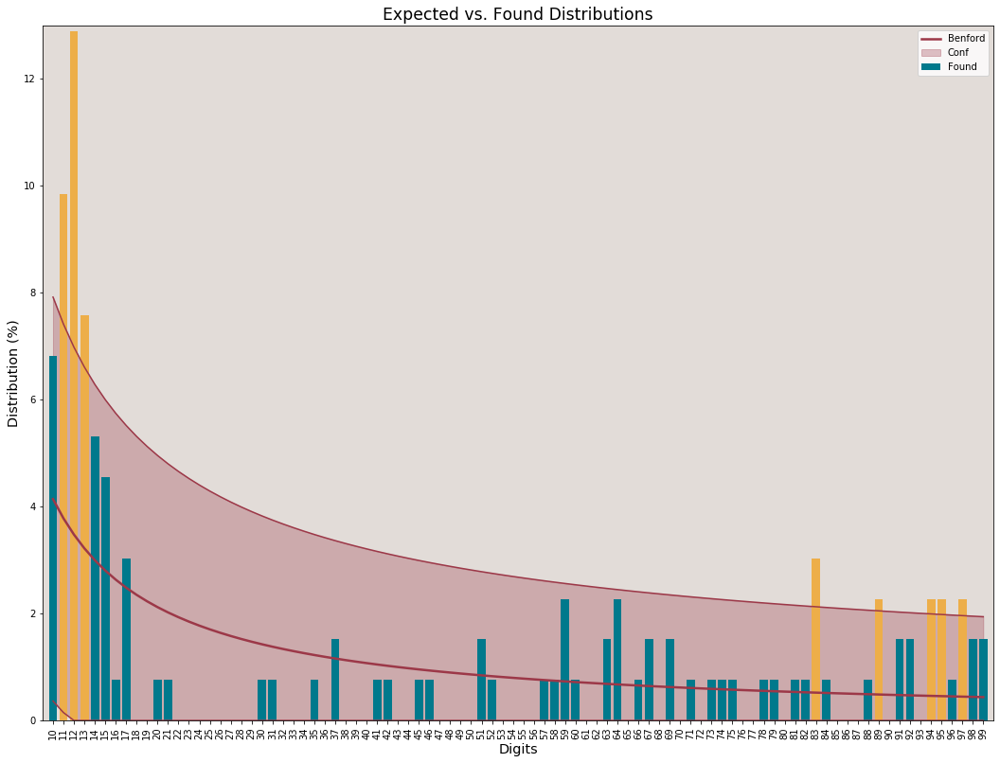



 #################  COUNTRY:  Senegal  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 132 registries.
Sec_Dig
0    0.090909
1    0.166667
2    0.166667
3    0.128788
4    0.113636
5    0.090909
6    0.030303
7    0.090909
8    0.037879
9    0.083333
Name: Found, dtype: float64

Test performed on 132 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
2        0.108821  0.166667  1.994351
Mean Absolute Deviation: 0.029793
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 18.5864.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1196.
Critical K-S for this series: 0.1184


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


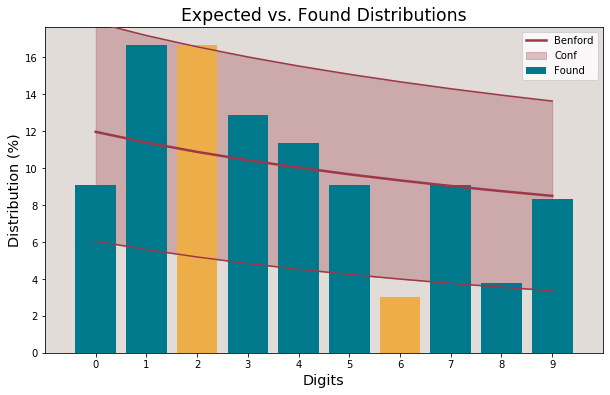

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Serbia  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_1_Dig
1    0.149660
2    0.272109
3    0.224490
4    0.088435
5    0.054422
6    0.054422
7    0.047619
8    0.047619
9    0.061224
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.224490  3.525647
2            0.176091  0.272109  2.948067
Mean Absolute Deviation: 0.046897
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 33.2142.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


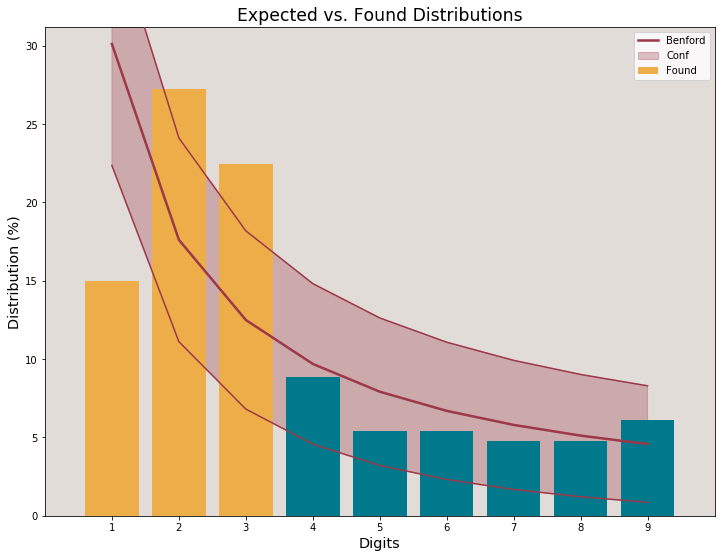



 #################  COUNTRY:  Serbia  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
First_2_Dig
10    0.027211
11    0.027211
12    0.006803
13    0.013605
14    0.020408
15    0.013605
16    0.013605
17    0.006803
18    0.006803
19    0.013605
20    0.020408
21    0.006803
22    0.034014
23    0.020408
24    0.020408
25    0.034014
26    0.020408
27    0.047619
28    0.034014
29    0.034014
30    0.027211
31    0.020408
32    0.027211
33    0.013605
34    0.040816
35    0.034014
36    0.000000
37    0.020408
38    0.020408
39    0.020408
40    0.013605
41    0.027211
42    0.013605
43    0.000000
44    0.013605
45    0.000000
46    0.006803
47    0.000000
48    0.013605
49    0.000000
50    0.000000
51    0.000000
52    0.006803
53    0.000000
54    0.013605
55    0.000000
56    0.000000
57    0.013605
58    0.006803
59    0.013605
60    0.000000
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


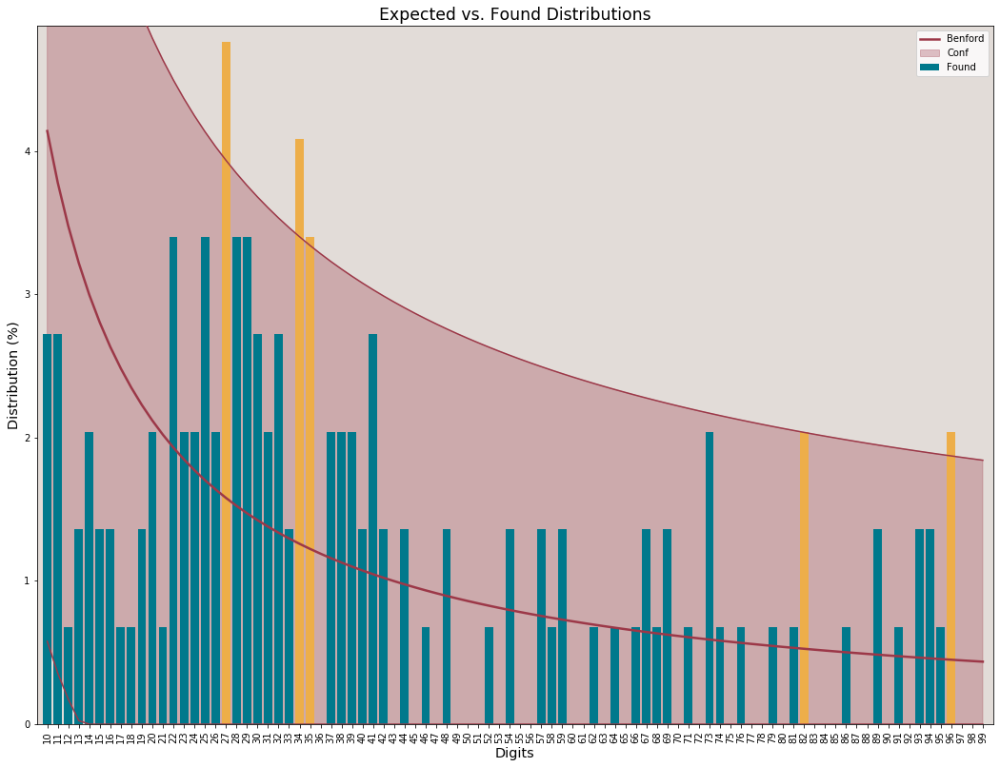



 #################  COUNTRY:  Serbia  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 147 registries.
Sec_Dig
0    0.088435
1    0.102041
2    0.115646
3    0.081633
4    0.136054
5    0.088435
6    0.081633
7    0.102041
8    0.088435
9    0.115646
Name: Found, dtype: float64

Test performed on 147 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.017155
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.2101.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0590.
Critical K-S for this series: 0.1122


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


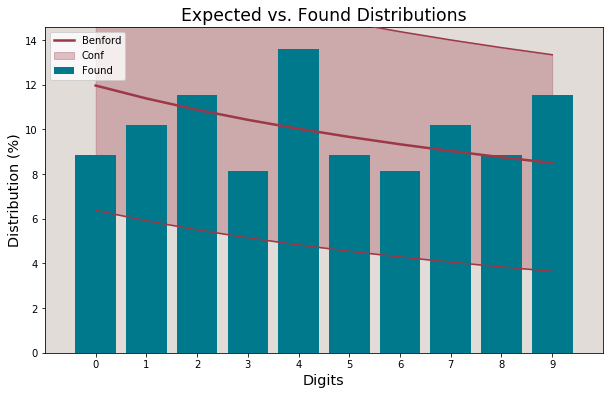

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Singapore  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_1_Dig
1    0.231788
2    0.185430
3    0.172185
4    0.125828
5    0.092715
6    0.079470
7    0.066225
8    0.019868
9    0.026490
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.026621
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 11.4745.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0692.
Critical K-S for this series: 0.1107


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


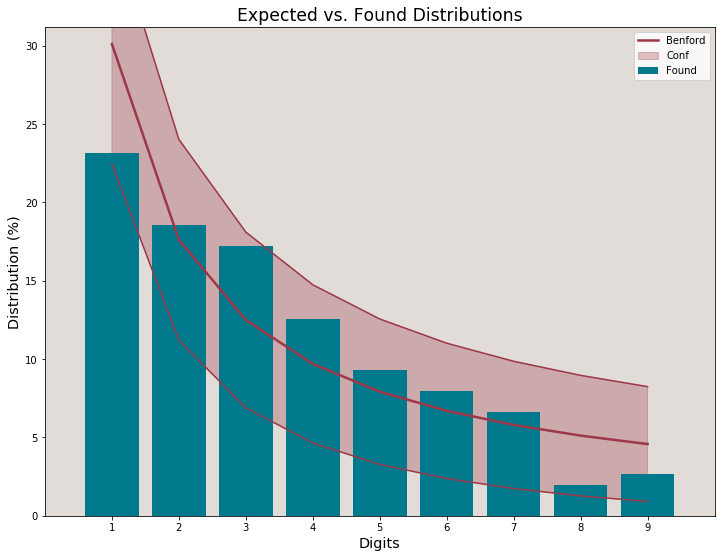



 #################  COUNTRY:  Singapore  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_2_Dig
10    0.033113
11    0.019868
12    0.046358
13    0.026490
14    0.026490
15    0.019868
16    0.006623
17    0.026490
18    0.013245
19    0.013245
20    0.013245
21    0.046358
22    0.006623
23    0.019868
24    0.033113
25    0.013245
26    0.019868
27    0.013245
28    0.006623
29    0.013245
30    0.019868
31    0.019868
32    0.019868
33    0.013245
34    0.026490
35    0.019868
36    0.000000
37    0.006623
38    0.026490
39    0.019868
40    0.019868
41    0.006623
42    0.006623
43    0.000000
44    0.019868
45    0.019868
46    0.019868
47    0.013245
48    0.006623
49    0.013245
50    0.006623
51    0.019868
52    0.013245
53    0.006623
54    0.019868
55    0.000000
56    0.006623
57    0.013245
58    0.000000
59    0.006623
60    0.00000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


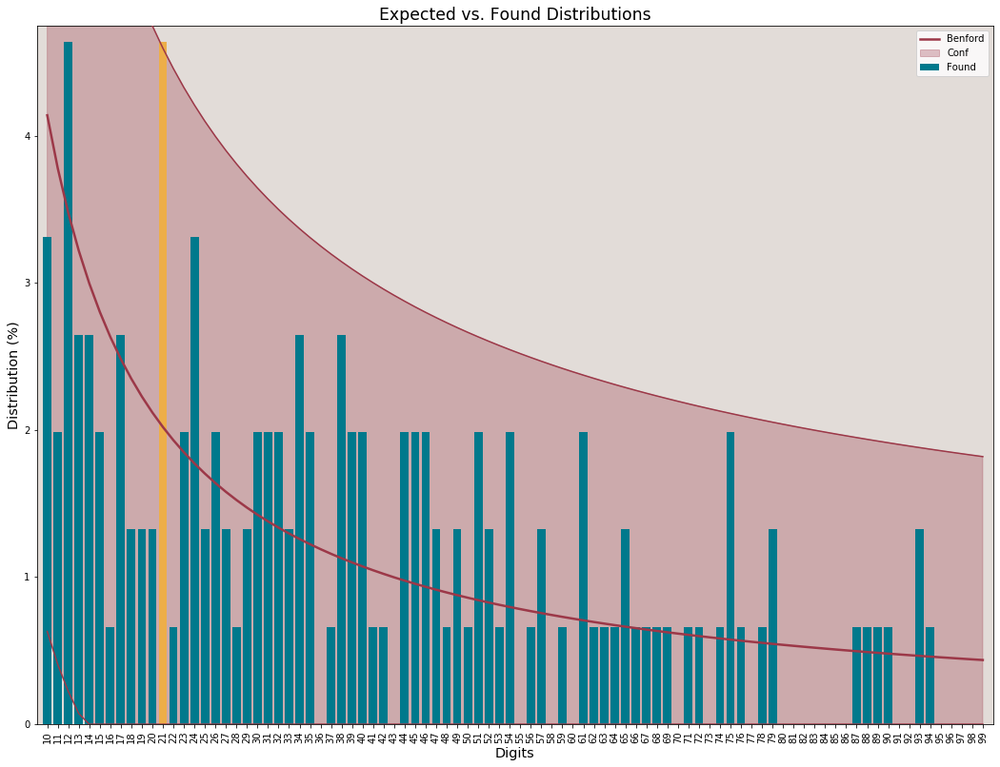



 #################  COUNTRY:  Singapore  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
Sec_Dig
0    0.099338
1    0.139073
2    0.105960
3    0.086093
4    0.145695
5    0.105960
6    0.066225
7    0.086093
8    0.072848
9    0.092715
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.017514
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.7931.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0384.
Critical K-S for this series: 0.1107


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


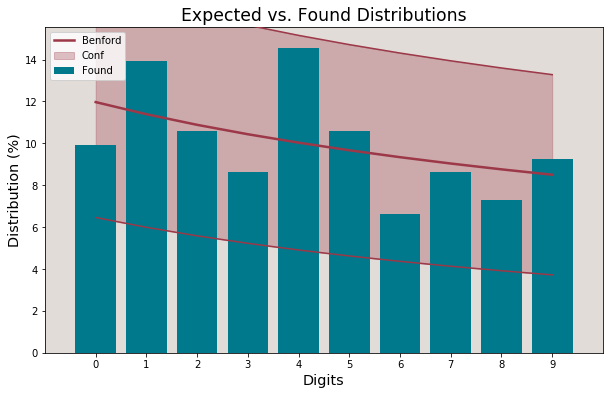

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  South Africa  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_1_Dig
1    0.331081
2    0.135135
3    0.114865
4    0.081081
5    0.033784
6    0.087838
7    0.060811
8    0.094595
9    0.060811
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
8            0.051153  0.094595  2.212331
Mean Absolute Deviation: 0.024946
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 13.3871.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0822.
Critical K-S for this series: 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


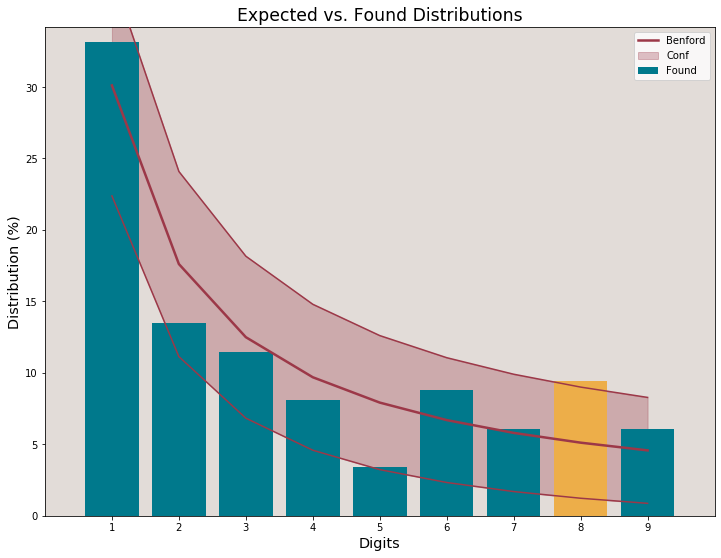



 #################  COUNTRY:  South Africa  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_2_Dig
10    0.033784
11    0.054054
12    0.054054
13    0.060811
14    0.040541
15    0.013514
16    0.020270
17    0.040541
18    0.013514
19    0.000000
20    0.006757
21    0.013514
22    0.000000
23    0.020270
24    0.020270
25    0.027027
26    0.013514
27    0.020270
28    0.006757
29    0.006757
30    0.006757
31    0.027027
32    0.006757
33    0.006757
34    0.027027
35    0.020270
36    0.000000
37    0.000000
38    0.020270
39    0.000000
40    0.006757
41    0.000000
42    0.013514
43    0.020270
44    0.013514
45    0.006757
46    0.013514
47    0.000000
48    0.000000
49    0.006757
50    0.000000
51    0.000000
52    0.006757
53    0.006757
54    0.000000
55    0.006757
56    0.006757
57    0.000000
58    0.000000
59    0.006757
60    0.00

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


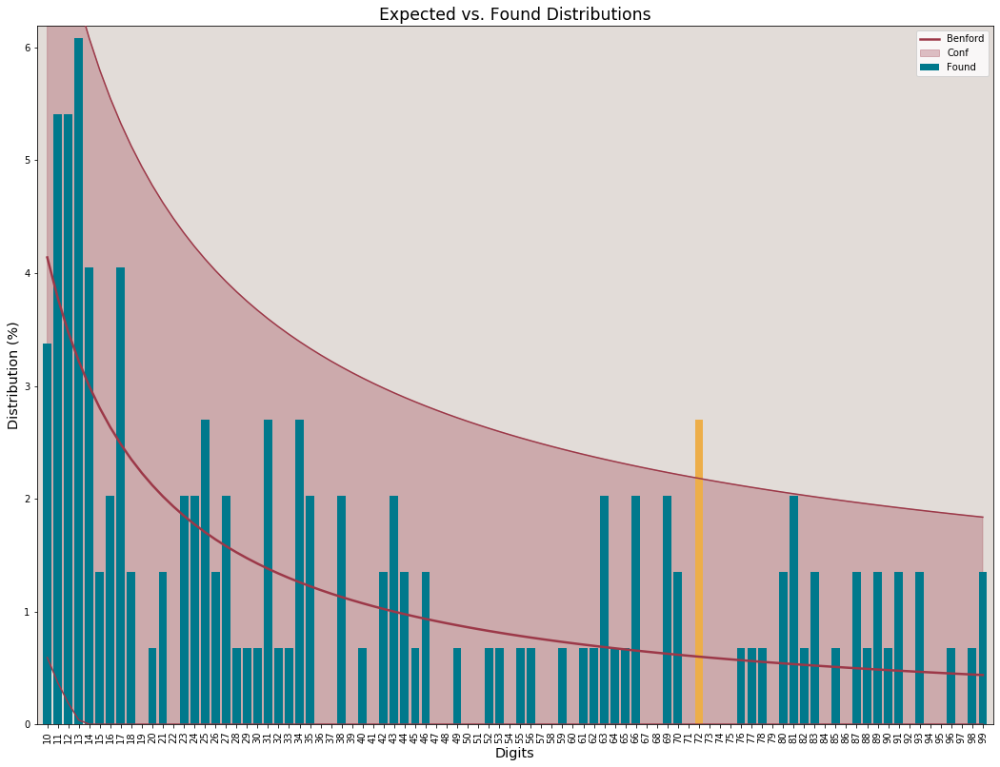



 #################  COUNTRY:  South Africa  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
Sec_Dig
0    0.087838
1    0.135135
2    0.121622
3    0.162162
4    0.108108
5    0.087838
6    0.087838
7    0.081081
8    0.060811
9    0.067568
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
3         0.10433  0.162162  2.167128
Mean Absolute Deviation: 0.019936
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.9457.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0678.
Critical K-S for this series: 0.1118


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


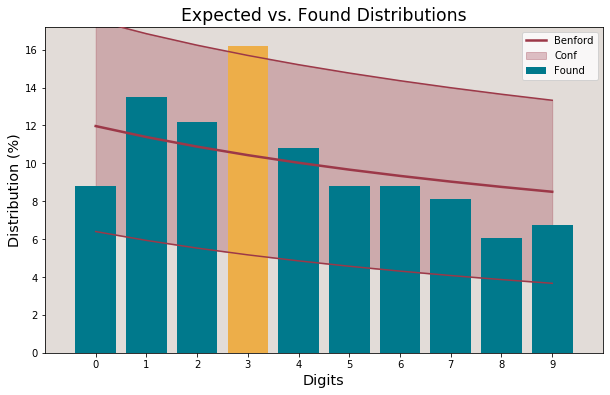

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  South Korea  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 158 registries.
First_1_Dig
1    0.227848
2    0.151899
3    0.170886
4    0.151899
5    0.107595
6    0.088608
7    0.037975
8    0.025316
9    0.037975
Name: Found, dtype: float64

Test performed on 158 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
4             0.09691  0.151899  2.201968
Mean Absolute Deviation: 0.033558
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 17.0167.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0974.
Critical K-S for this series: 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


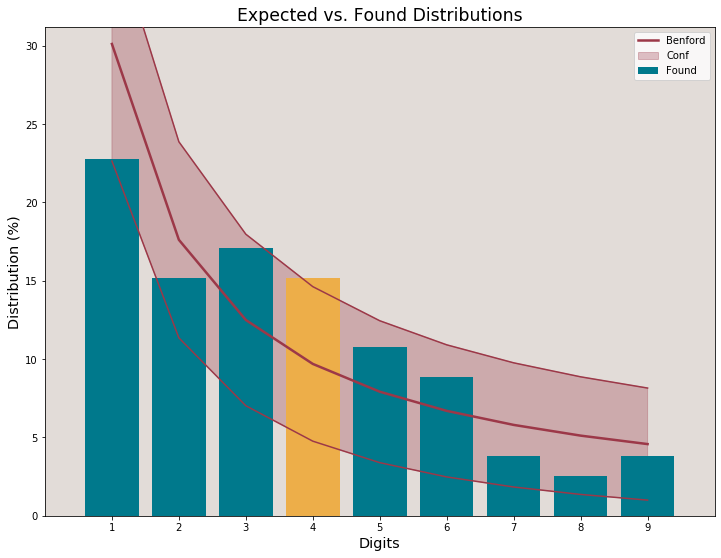



 #################  COUNTRY:  South Korea  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 158 registries.
First_2_Dig
10    0.044304
11    0.025316
12    0.018987
13    0.037975
14    0.018987
15    0.018987
16    0.012658
17    0.006329
18    0.018987
19    0.025316
20    0.012658
21    0.000000
22    0.012658
23    0.006329
24    0.012658
25    0.031646
26    0.012658
27    0.037975
28    0.018987
29    0.006329
30    0.000000
31    0.006329
32    0.006329
33    0.018987
34    0.031646
35    0.018987
36    0.018987
37    0.006329
38    0.018987
39    0.044304
40    0.006329
41    0.006329
42    0.012658
43    0.031646
44    0.012658
45    0.018987
46    0.006329
47    0.012658
48    0.025316
49    0.018987
50    0.012658
51    0.031646
52    0.000000
53    0.012658
54    0.006329
55    0.000000
56    0.006329
57    0.006329
58    0.012658
59    0.018987
60    0.012

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


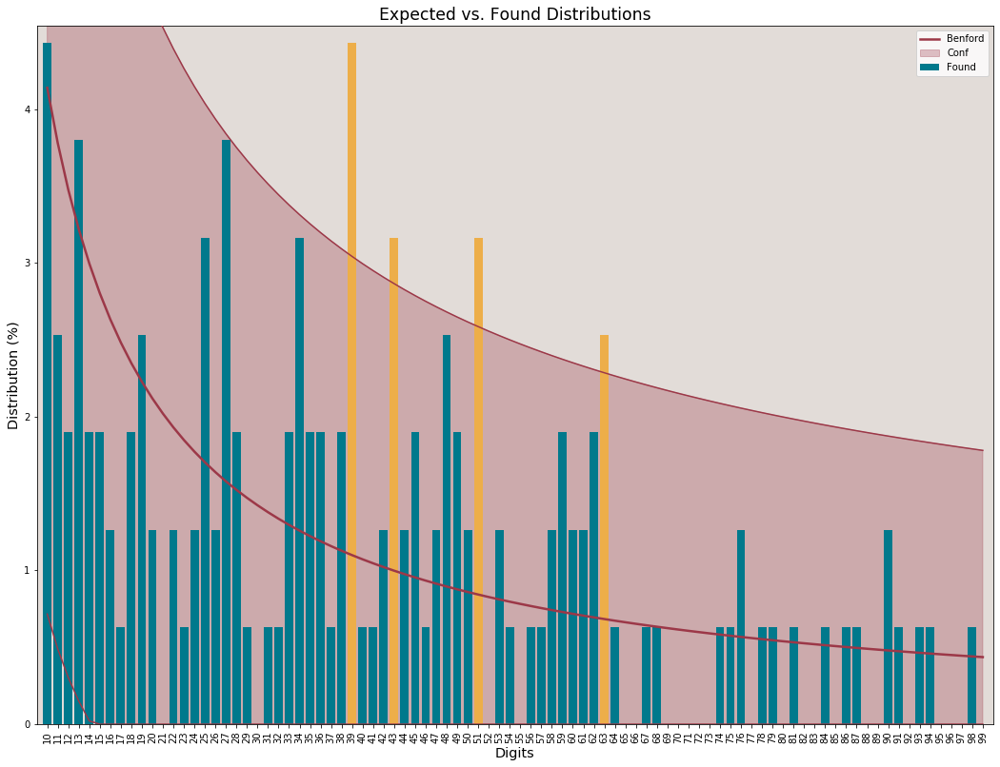



 #################  COUNTRY:  South Korea  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 158 registries.
Sec_Dig
0    0.101266
1    0.094937
2    0.069620
3    0.139241
4    0.107595
5    0.094937
6    0.075949
7    0.082278
8    0.113924
9    0.120253
Name: Found, dtype: float64

Test performed on 158 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020761
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 9.3030.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0766.
Critical K-S for this series: 0.1082


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


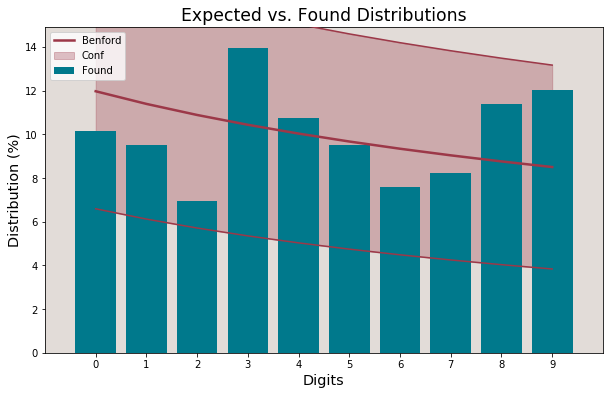

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Spain  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_1_Dig
1    0.166667
2    0.173333
3    0.193333
4    0.153333
5    0.106667
6    0.053333
7    0.046667
8    0.080000
9    0.026667
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
3            0.124939  0.193333  2.409907
4            0.096910  0.153333  2.197902
Mean Absolute Deviation: 0.040256
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 25.3593.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


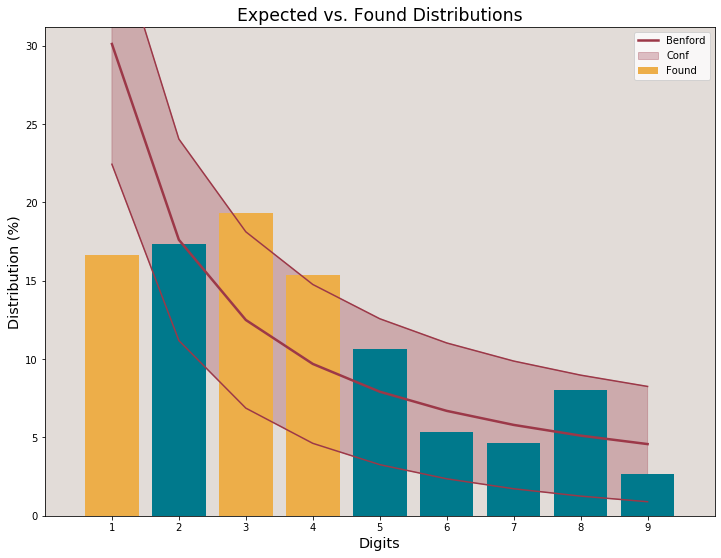



 #################  COUNTRY:  Spain  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
First_2_Dig
10    0.006667
11    0.020000
12    0.020000
13    0.026667
14    0.006667
15    0.013333
16    0.026667
17    0.013333
18    0.026667
19    0.006667
20    0.033333
21    0.020000
22    0.013333
23    0.020000
24    0.020000
25    0.020000
26    0.006667
27    0.006667
28    0.006667
29    0.026667
30    0.033333
31    0.020000
32    0.006667
33    0.033333
34    0.013333
35    0.006667
36    0.020000
37    0.000000
38    0.040000
39    0.020000
40    0.020000
41    0.006667
42    0.006667
43    0.020000
44    0.020000
45    0.033333
46    0.020000
47    0.000000
48    0.026667
49    0.000000
50    0.006667
51    0.020000
52    0.006667
53    0.000000
54    0.020000
55    0.013333
56    0.013333
57    0.013333
58    0.013333
59    0.000000
60    0.000000
61

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


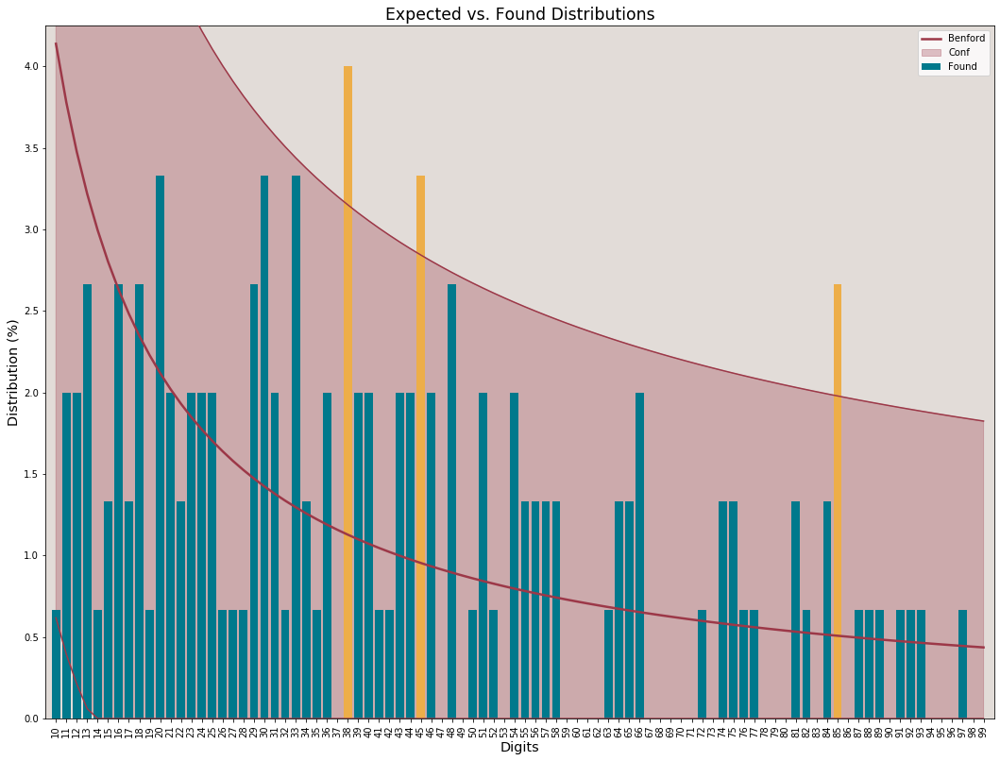



 #################  COUNTRY:  Spain  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 150 registries.
Sec_Dig
0    0.100000
1    0.106667
2    0.073333
3    0.113333
4    0.120000
5    0.140000
6    0.113333
7    0.053333
8    0.120000
9    0.060000
Name: Found, dtype: float64

Test performed on 150 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.024881
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 11.7178.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0624.
Critical K-S for this series: 0.1110


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


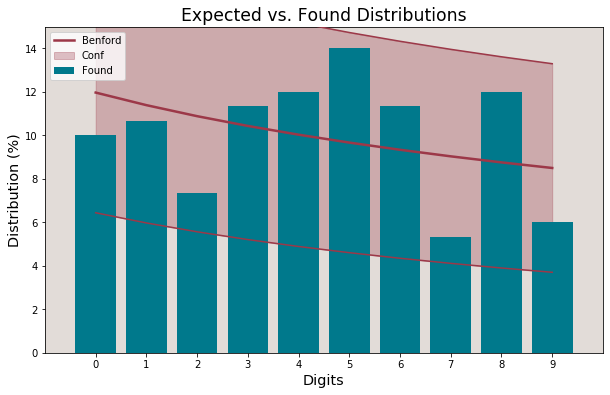

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Sweden  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
First_1_Dig
1    0.190141
2    0.140845
3    0.112676
4    0.169014
5    0.070423
6    0.140845
7    0.112676
8    0.028169
9    0.035211
Name: Found, dtype: float64

Test performed on 142 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
6            0.066947  0.140845  3.355504
4            0.096910  0.169014  2.762552
7            0.057992  0.112676  2.608488
Mean Absolute Deviation: 0.044597
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 35.4456.
Critical Chi-square for this series: 15.50

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


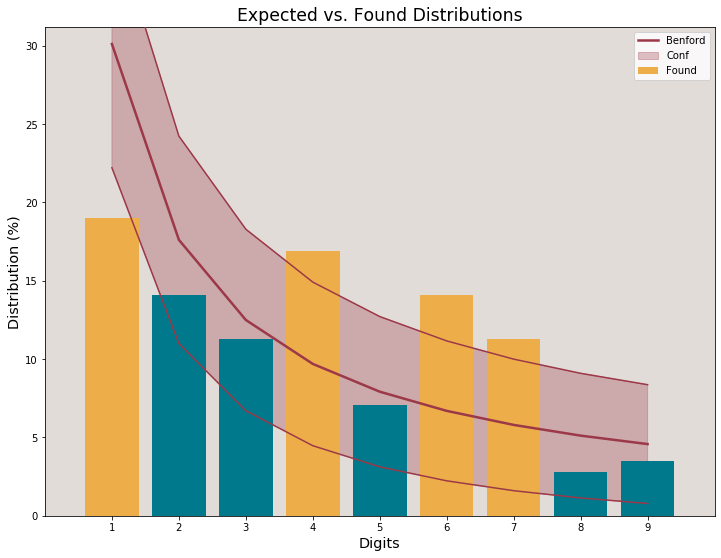



 #################  COUNTRY:  Sweden  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
First_2_Dig
10    0.021127
11    0.021127
12    0.042254
13    0.021127
14    0.028169
15    0.021127
16    0.021127
17    0.007042
18    0.000000
19    0.007042
20    0.007042
21    0.000000
22    0.007042
23    0.028169
24    0.014085
25    0.028169
26    0.007042
27    0.014085
28    0.028169
29    0.007042
30    0.000000
31    0.007042
32    0.014085
33    0.014085
34    0.007042
35    0.014085
36    0.007042
37    0.014085
38    0.021127
39    0.014085
40    0.042254
41    0.000000
42    0.035211
43    0.000000
44    0.000000
45    0.007042
46    0.035211
47    0.014085
48    0.014085
49    0.021127
50    0.000000
51    0.021127
52    0.000000
53    0.000000
54    0.014085
55    0.000000
56    0.021127
57    0.000000
58    0.000000
59    0.014085
60    0.014085
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


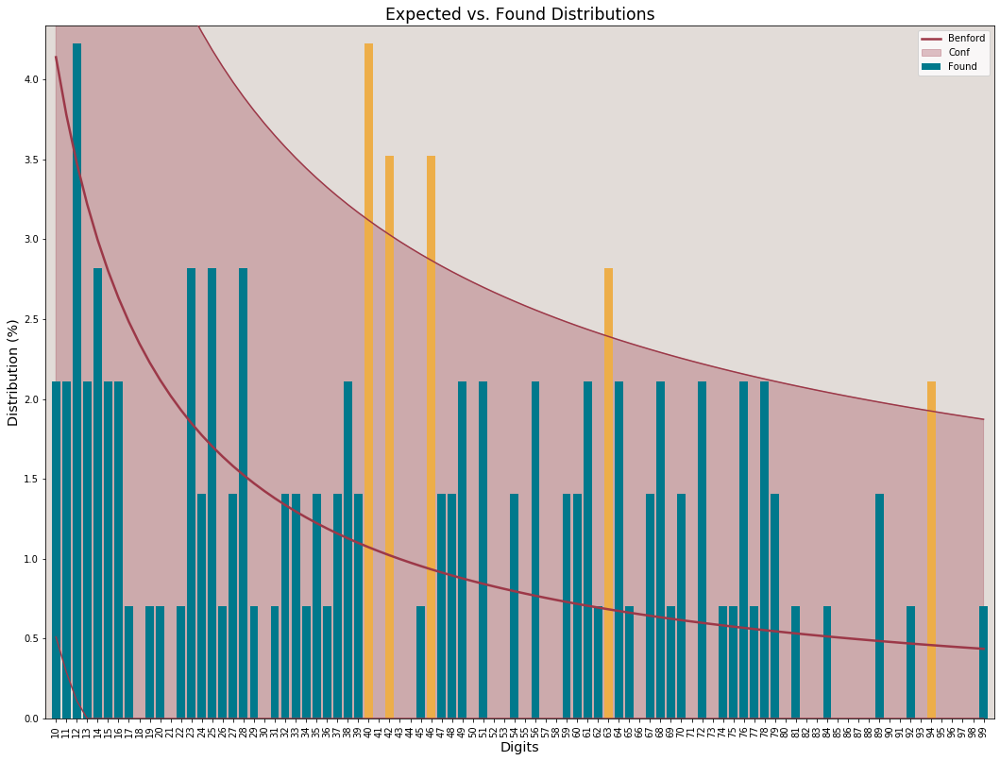



 #################  COUNTRY:  Sweden  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 142 registries.
Sec_Dig
0    0.098592
1    0.077465
2    0.133803
3    0.091549
4    0.119718
5    0.084507
6    0.112676
7    0.070423
8    0.105634
9    0.105634
Name: Found, dtype: float64

Test performed on 142 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020479
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 6.4008.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0575.
Critical K-S for this series: 0.1141


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


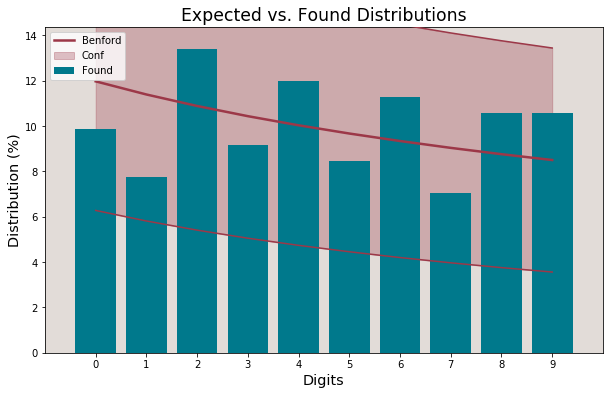

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Switzerland  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_1_Dig
1    0.397351
2    0.125828
3    0.119205
4    0.059603
5    0.092715
6    0.059603
7    0.039735
8    0.052980
9    0.052980
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
1             0.30103  0.397351  2.491625
Mean Absolute Deviation: 0.026423
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 10.5495.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.0963.
Critical K-S for this series: 0

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


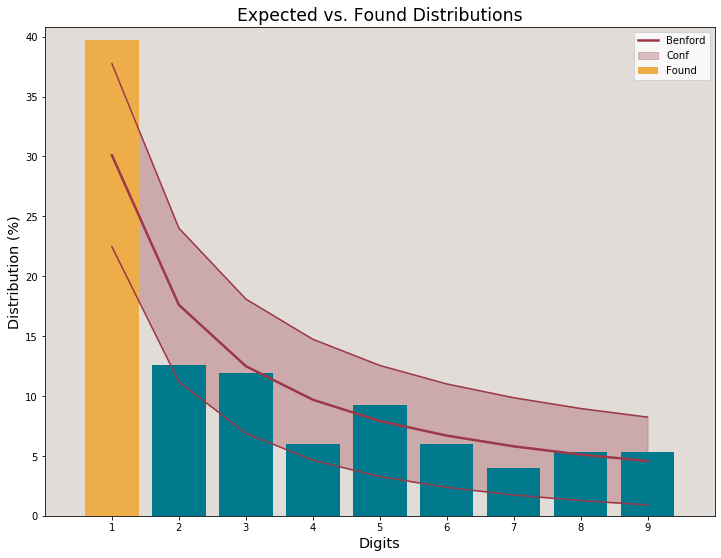



 #################  COUNTRY:  Switzerland  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
First_2_Dig
10    0.072848
11    0.066225
12    0.019868
13    0.046358
14    0.033113
15    0.046358
16    0.026490
17    0.026490
18    0.039735
19    0.019868
20    0.026490
21    0.026490
22    0.019868
23    0.026490
24    0.000000
25    0.006623
26    0.006623
27    0.006623
28    0.006623
29    0.000000
30    0.006623
31    0.013245
32    0.013245
33    0.026490
34    0.013245
35    0.019868
36    0.013245
37    0.006623
38    0.000000
39    0.006623
40    0.013245
41    0.000000
42    0.006623
43    0.006623
44    0.013245
45    0.006623
46    0.006623
47    0.000000
48    0.000000
49    0.006623
50    0.006623
51    0.013245
52    0.006623
53    0.000000
54    0.019868
55    0.013245
56    0.000000
57    0.000000
58    0.019868
59    0.013245
60    0.000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


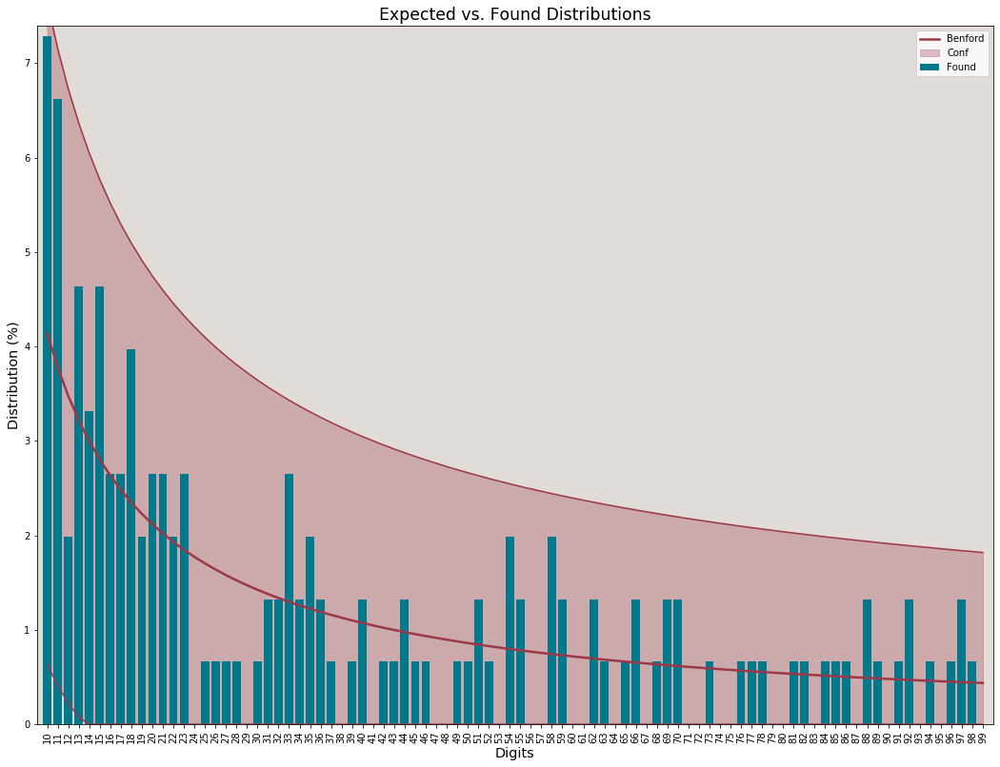



 #################  COUNTRY:  Switzerland  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 151 registries.
Sec_Dig
0    0.139073
1    0.132450
2    0.099338
3    0.119205
4    0.092715
5    0.105960
6    0.086093
7    0.059603
8    0.099338
9    0.066225
Name: Found, dtype: float64

Test performed on 151 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.014776
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.1285.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0450.
Critical K-S for this series: 0.1107


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


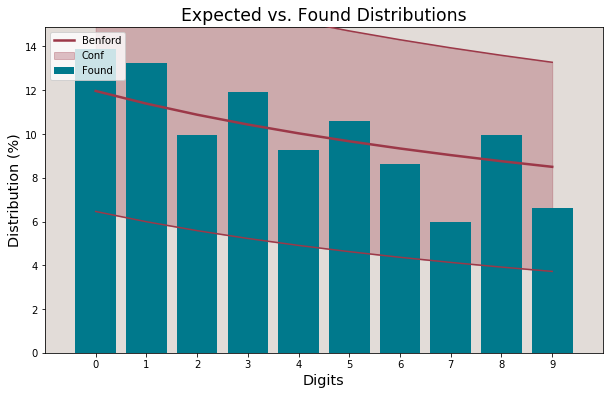

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Turkey  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_1_Dig
1    0.445946
2    0.114865
3    0.074324
4    0.074324
5    0.020270
6    0.000000
7    0.006757
8    0.027027
9    0.236486
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found    Z_score
First_1_Dig                               
9            0.045757  0.236486  10.907507
1            0.301030  0.445946   3.753777
Mean Absolute Deviation: 0.074588
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 159.7286.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic 

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


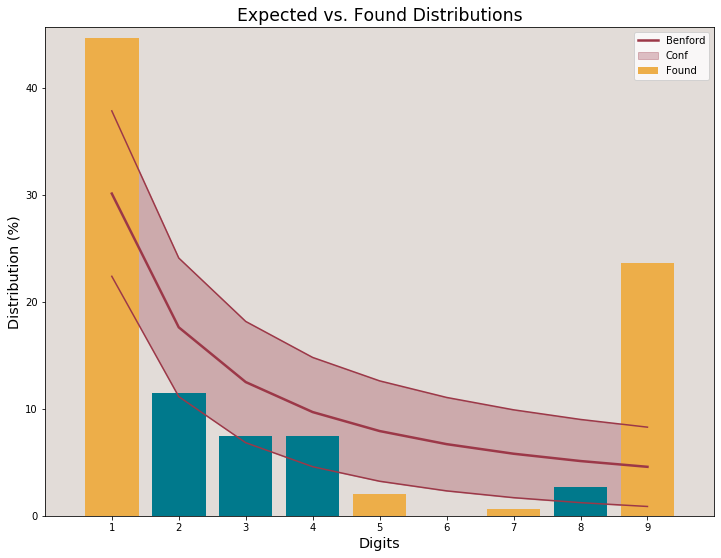



 #################  COUNTRY:  Turkey  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
First_2_Dig
10    0.074324
11    0.128378
12    0.033784
13    0.040541
14    0.033784
15    0.027027
16    0.054054
17    0.020270
18    0.020270
19    0.013514
20    0.006757
21    0.020270
22    0.006757
23    0.013514
24    0.006757
25    0.000000
26    0.006757
27    0.020270
28    0.013514
29    0.020270
30    0.013514
31    0.033784
32    0.000000
33    0.000000
34    0.006757
35    0.000000
36    0.000000
37    0.006757
38    0.006757
39    0.006757
40    0.020270
41    0.006757
42    0.006757
43    0.006757
44    0.000000
45    0.000000
46    0.013514
47    0.013514
48    0.006757
49    0.000000
50    0.000000
51    0.013514
52    0.000000
53    0.000000
54    0.000000
55    0.000000
56    0.006757
57    0.000000
58    0.000000
59    0.000000
60    0.000000
6

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


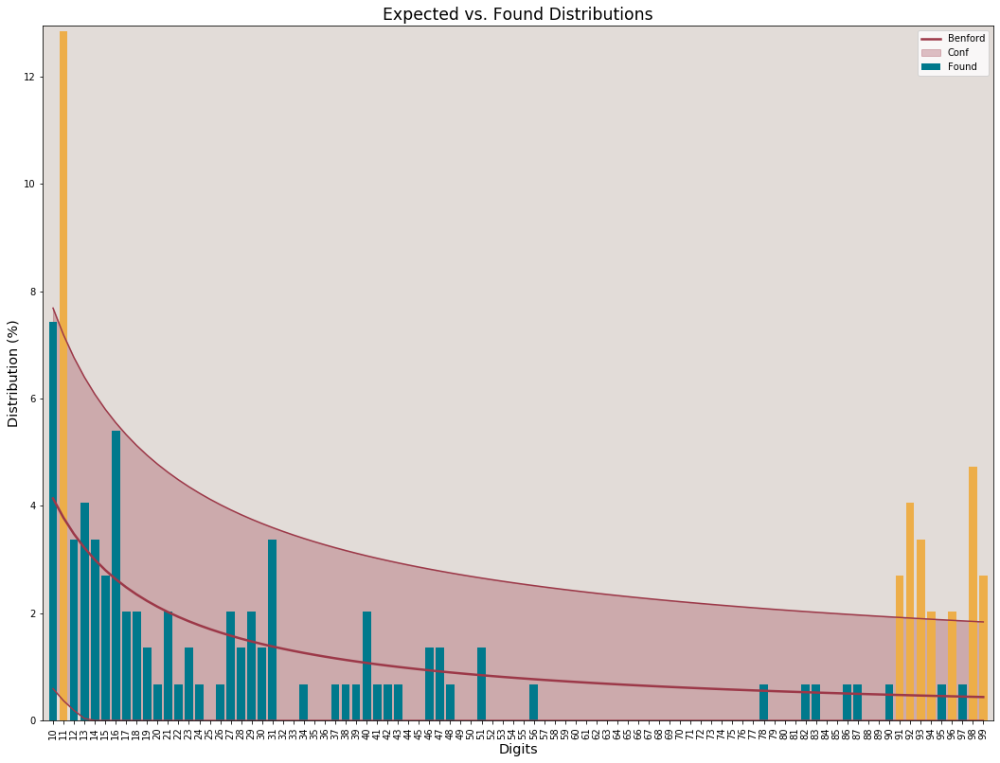



 #################  COUNTRY:  Turkey  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 148 registries.
Sec_Dig
0    0.121622
1    0.229730
2    0.094595
3    0.101351
4    0.067568
5    0.033784
6    0.108108
7    0.074324
8    0.101351
9    0.067568
Name: Found, dtype: float64

Test performed on 148 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected    Found   Z_score
Sec_Dig                             
1         0.11389  0.22973  4.306723
Mean Absolute Deviation: 0.029259
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 26.9822.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1178.
Critical K-S for this series: 0.1118


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


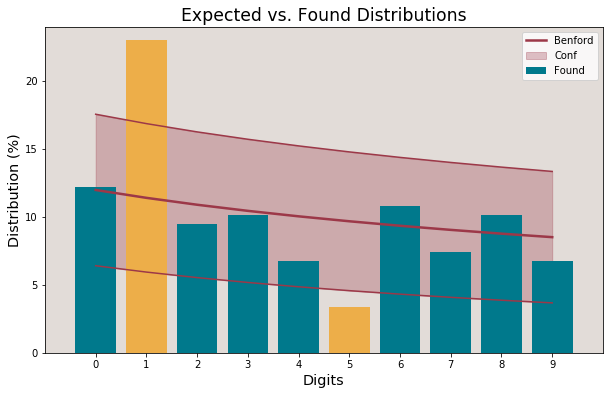

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Ukraine  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 141 registries.
First_1_Dig
1    0.141844
2    0.078014
3    0.127660
4    0.184397
5    0.106383
6    0.120567
7    0.035461
8    0.127660
9    0.078014
Name: Found, dtype: float64

Test performed on 141 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
8            0.051153  0.127660  3.932496
4            0.096910  0.184397  3.369257
6            0.066947  0.120567  2.379074
Mean Absolute Deviation: 0.062176
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 58.6641.
Critical Chi-square for this series: 15.5

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


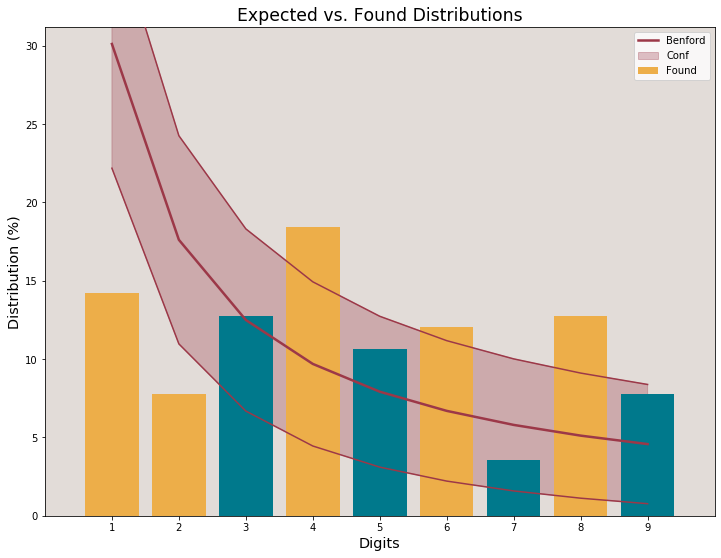



 #################  COUNTRY:  Ukraine  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 141 registries.
First_2_Dig
10    0.035461
11    0.049645
12    0.007092
13    0.007092
14    0.021277
15    0.014184
16    0.000000
17    0.007092
18    0.000000
19    0.000000
20    0.007092
21    0.000000
22    0.014184
23    0.000000
24    0.007092
25    0.007092
26    0.028369
27    0.007092
28    0.000000
29    0.007092
30    0.014184
31    0.007092
32    0.028369
33    0.007092
34    0.014184
35    0.007092
36    0.007092
37    0.007092
38    0.000000
39    0.035461
40    0.021277
41    0.021277
42    0.014184
43    0.021277
44    0.007092
45    0.014184
46    0.021277
47    0.028369
48    0.028369
49    0.007092
50    0.021277
51    0.007092
52    0.021277
53    0.000000
54    0.014184
55    0.021277
56    0.007092
57    0.007092
58    0.007092
59    0.000000
60    0.000000


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


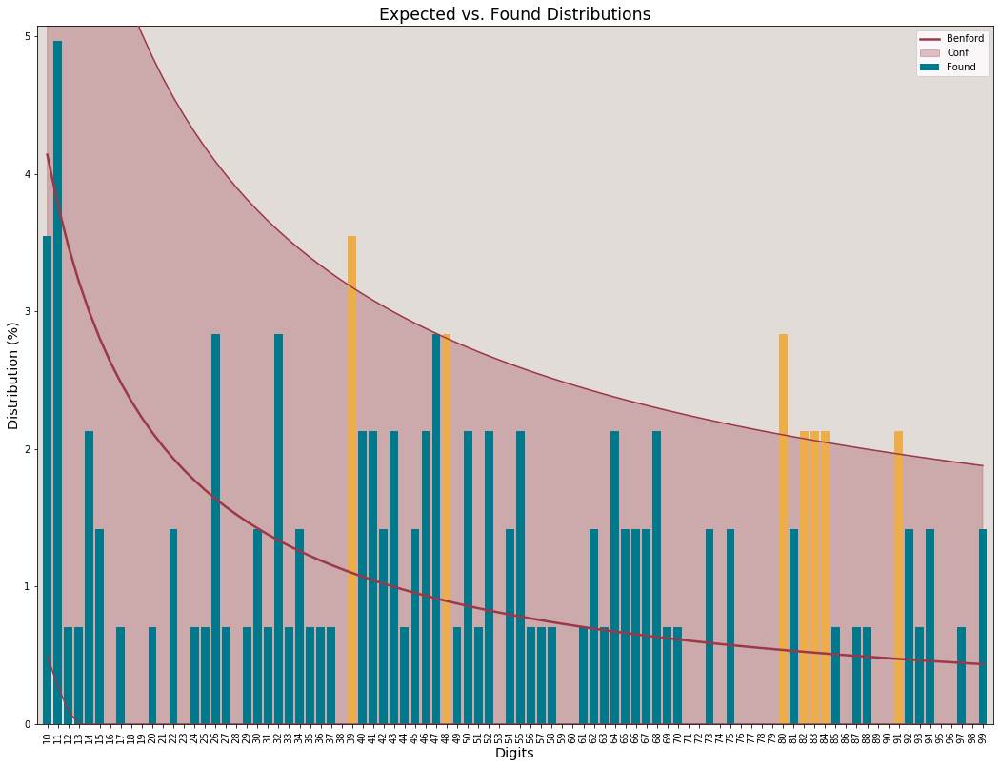



 #################  COUNTRY:  Ukraine  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 141 registries.
Sec_Dig
0    0.134752
1    0.127660
2    0.134752
3    0.085106
4    0.120567
5    0.099291
6    0.078014
7    0.085106
8    0.063830
9    0.070922
Name: Found, dtype: float64

Test performed on 141 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.015529
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.0953.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0584.
Critical K-S for this series: 0.1145


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


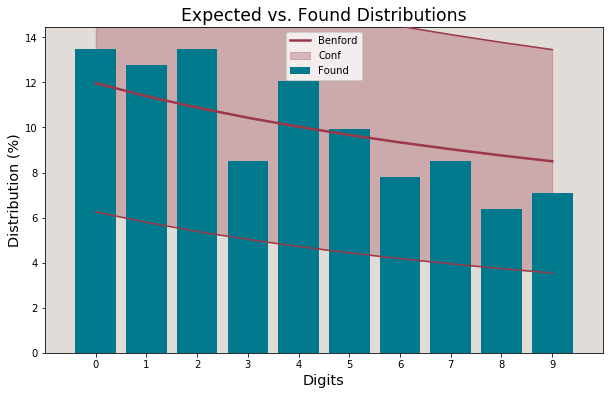

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  United Arab Emirates  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_1_Dig
1    0.075342
2    0.171233
3    0.164384
4    0.191781
5    0.171233
6    0.089041
7    0.075342
8    0.047945
9    0.013699
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
5            0.079181  0.171233  3.965921
4            0.096910  0.191781  3.735012
Mean Absolute Deviation: 0.059069
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 60.8561.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov s

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


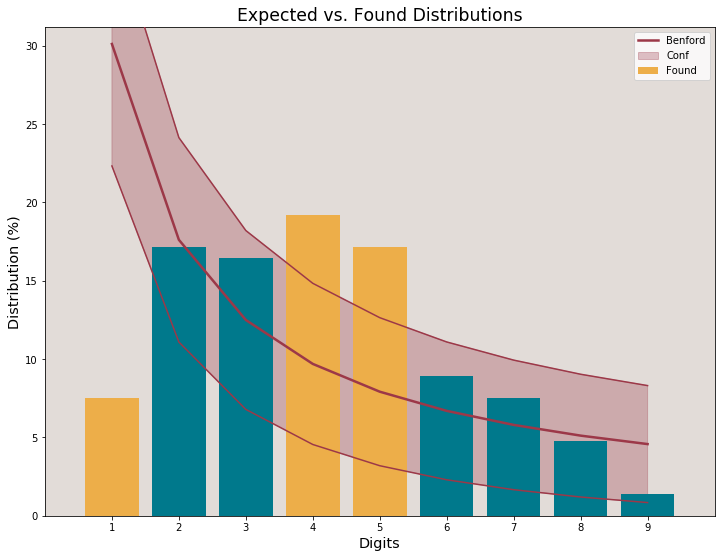



 #################  COUNTRY:  United Arab Emirates  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
First_2_Dig
10    0.006849
11    0.006849
12    0.006849
13    0.006849
14    0.006849
15    0.020548
16    0.013699
17    0.000000
18    0.006849
19    0.000000
20    0.000000
21    0.020548
22    0.006849
23    0.027397
24    0.013699
25    0.020548
26    0.027397
27    0.027397
28    0.020548
29    0.006849
30    0.013699
31    0.013699
32    0.000000
33    0.000000
34    0.020548
35    0.020548
36    0.013699
37    0.027397
38    0.034247
39    0.020548
40    0.034247
41    0.013699
42    0.006849
43    0.020548
44    0.020548
45    0.041096
46    0.013699
47    0.013699
48    0.000000
49    0.027397
50    0.020548
51    0.006849
52    0.013699
53    0.027397
54    0.027397
55    0.020548
56    0.034247
57    0.006849
58    0.006849
59    0.006849
60

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


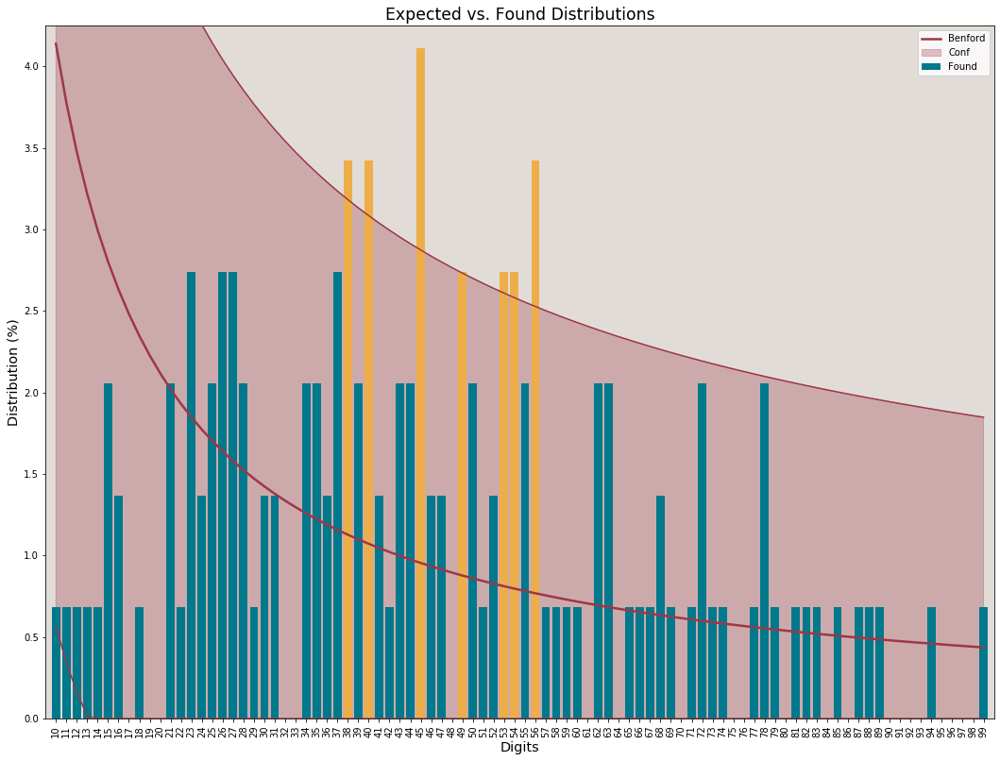



 #################  COUNTRY:  United Arab Emirates  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 146 registries.
Sec_Dig
0    0.082192
1    0.075342
2    0.082192
3    0.116438
4    0.102740
5    0.136986
6    0.109589
7    0.095890
8    0.109589
9    0.089041
Name: Found, dtype: float64

Test performed on 146 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.020533
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 8.5353.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.1027.
Critical K-S for this series: 0.1126


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


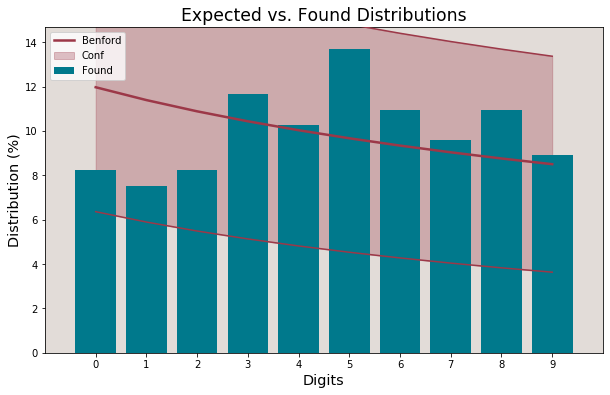

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  United Kingdom  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 162 registries.
First_1_Dig
1    0.191358
2    0.104938
3    0.129630
4    0.185185
5    0.104938
6    0.080247
7    0.117284
8    0.061728
9    0.024691
Name: Found, dtype: float64

Test performed on 162 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
4            0.096910  0.185185  3.665135
7            0.057992  0.117284  3.060736
Mean Absolute Deviation: 0.044865
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 37.7168.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statist

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


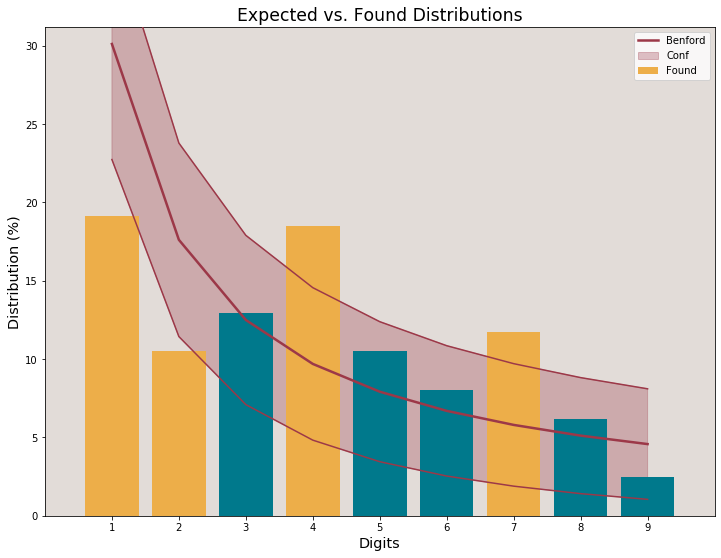



 #################  COUNTRY:  United Kingdom  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 162 registries.
First_2_Dig
10    0.055556
11    0.037037
12    0.018519
13    0.018519
14    0.018519
15    0.012346
16    0.012346
17    0.006173
18    0.012346
19    0.000000
20    0.012346
21    0.006173
22    0.006173
23    0.018519
24    0.000000
25    0.024691
26    0.012346
27    0.006173
28    0.012346
29    0.006173
30    0.018519
31    0.006173
32    0.006173
33    0.012346
34    0.018519
35    0.018519
36    0.018519
37    0.018519
38    0.012346
39    0.000000
40    0.024691
41    0.012346
42    0.012346
43    0.012346
44    0.018519
45    0.006173
46    0.000000
47    0.037037
48    0.024691
49    0.037037
50    0.006173
51    0.018519
52    0.012346
53    0.000000
54    0.018519
55    0.012346
56    0.018519
57    0.012346
58    0.000000
59    0.006173
60    0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


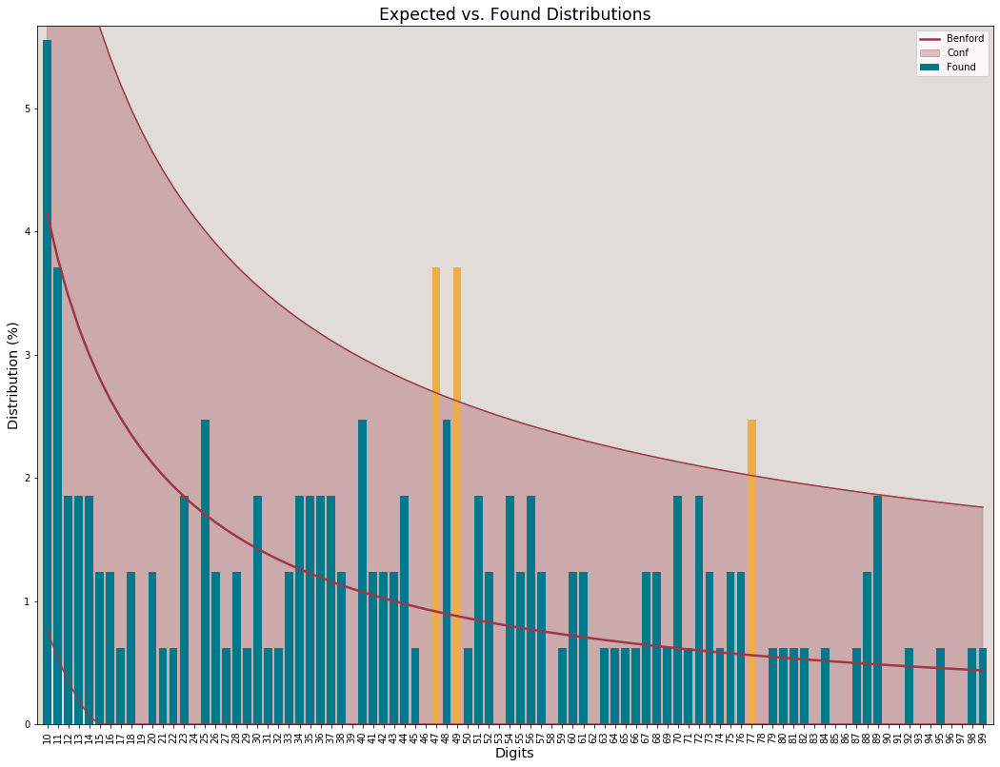



 #################  COUNTRY:  United Kingdom  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 162 registries.
Sec_Dig
0    0.154321
1    0.104938
2    0.086420
3    0.080247
4    0.092593
5    0.098765
6    0.080247
7    0.123457
8    0.092593
9    0.086420
Name: Found, dtype: float64

Test performed on 162 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.015256
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 5.8040.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0395.
Critical K-S for this series: 0.1069


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


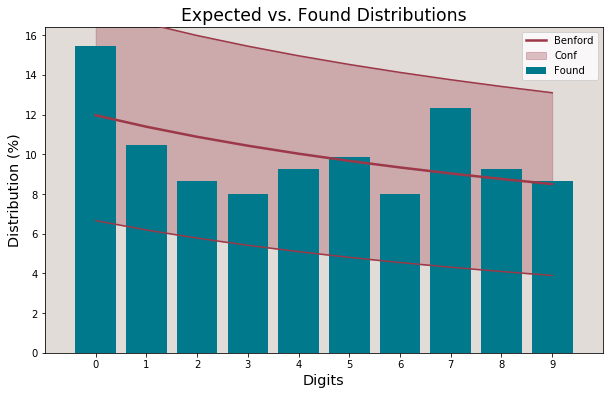

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  United States of America  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 164 registries.
First_1_Dig
1    0.152439
2    0.378049
3    0.121951
4    0.079268
5    0.109756
6    0.079268
7    0.048780
8    0.024390
9    0.006098
Name: Found, dtype: float64

Test performed on 164 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
2            0.176091  0.378049  6.687555
Mean Absolute Deviation: 0.054412
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 61.0352.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1486.
Critical K-S for t

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


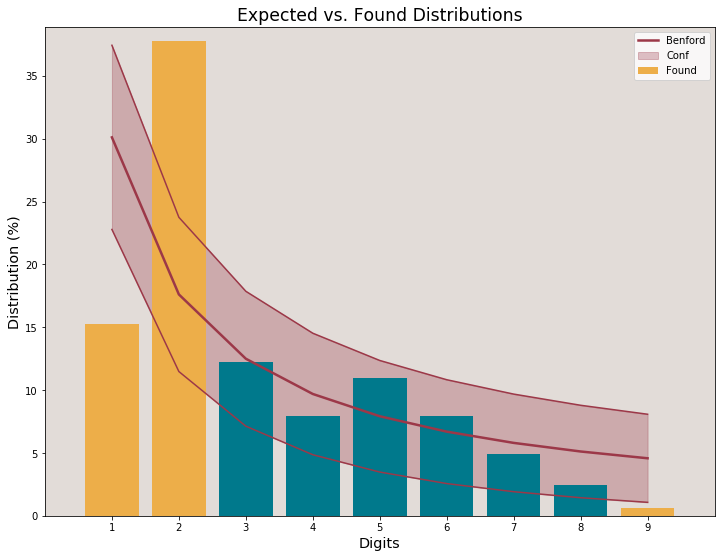



 #################  COUNTRY:  United States of America  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 164 registries.
First_2_Dig
10    0.006098
11    0.006098
12    0.006098
13    0.006098
14    0.006098
15    0.000000
16    0.006098
17    0.012195
18    0.054878
19    0.048780
20    0.042683
21    0.042683
22    0.042683
23    0.024390
24    0.042683
25    0.067073
26    0.024390
27    0.036585
28    0.030488
29    0.024390
30    0.024390
31    0.012195
32    0.012195
33    0.018293
34    0.030488
35    0.012195
36    0.000000
37    0.006098
38    0.006098
39    0.000000
40    0.006098
41    0.006098
42    0.006098
43    0.006098
44    0.000000
45    0.018293
46    0.006098
47    0.006098
48    0.012195
49    0.012195
50    0.000000
51    0.006098
52    0.012195
53    0.012195
54    0.006098
55    0.006098
56    0.018293
57    0.018293
58    0.024390
59    0.00609

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


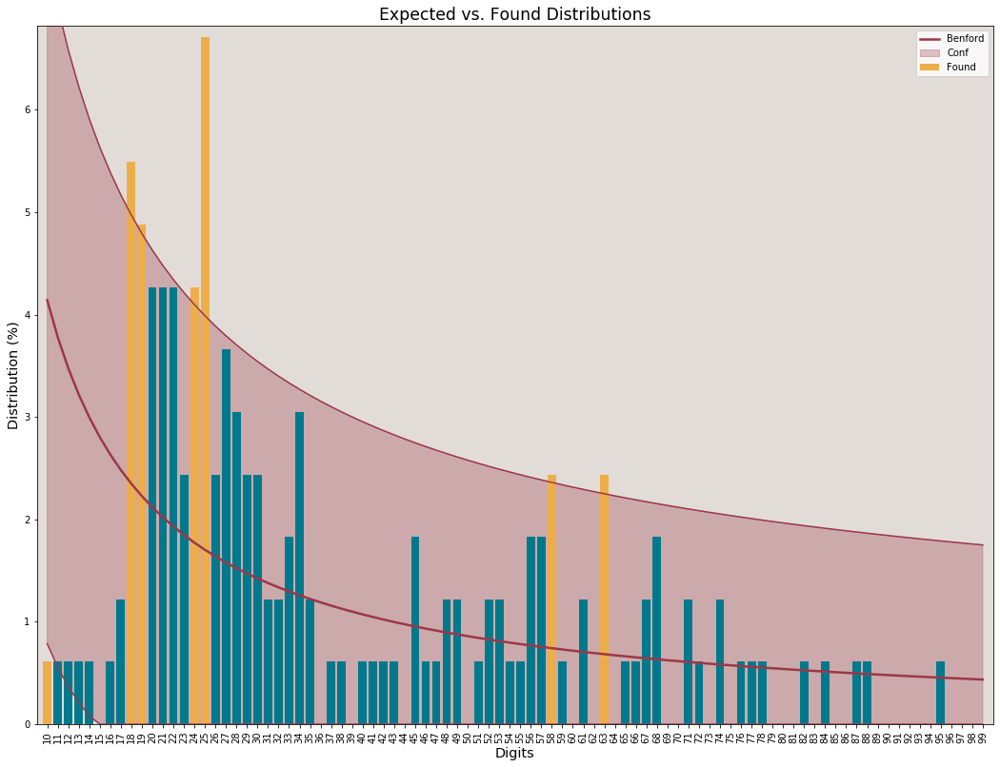



 #################  COUNTRY:  United States of America  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 164 registries.
Sec_Dig
0    0.079268
1    0.097561
2    0.091463
3    0.091463
4    0.103659
5    0.115854
6    0.067073
7    0.103659
8    0.158537
9    0.091463
Name: Found, dtype: float64

Test performed on 164 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

         Expected     Found   Z_score
Sec_Dig                              
8         0.08757  0.158537  3.077001
Mean Absolute Deviation: 0.022653
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 15.0271.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0907.
Critical K-S for this series: 0.1062


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


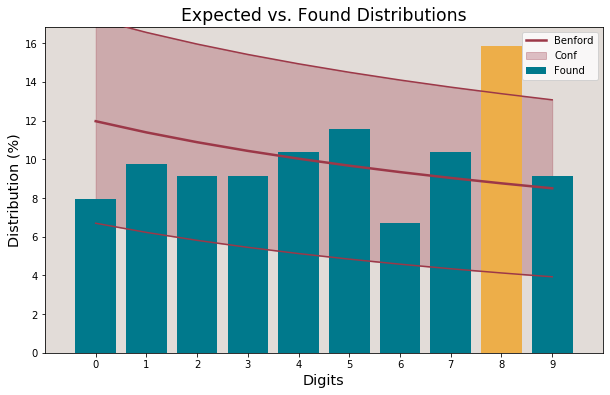

 ____________________________________________________________________________________________________________________

 
 

 #################  COUNTRY:  Uzbekistan  #################
 #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_1_Dig
1    0.211679
2    0.131387
3    0.138686
4    0.102190
5    0.124088
6    0.109489
7    0.124088
8    0.007299
9    0.051095
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 1 after preparation.

The entries with the significant positive deviations are:

             Expected     Found   Z_score
First_1_Dig                              
7            0.057992  0.124088  3.127187
Mean Absolute Deviation: 0.039535
MAD > 0.015000: Nonconformity.


The Chi-square statistic is 28.1840.
Critical Chi-square for this series: 15.507.

The Kolmogorov-Smirnov statistic is 0.1341.
Critical K-S for this series: 0.

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


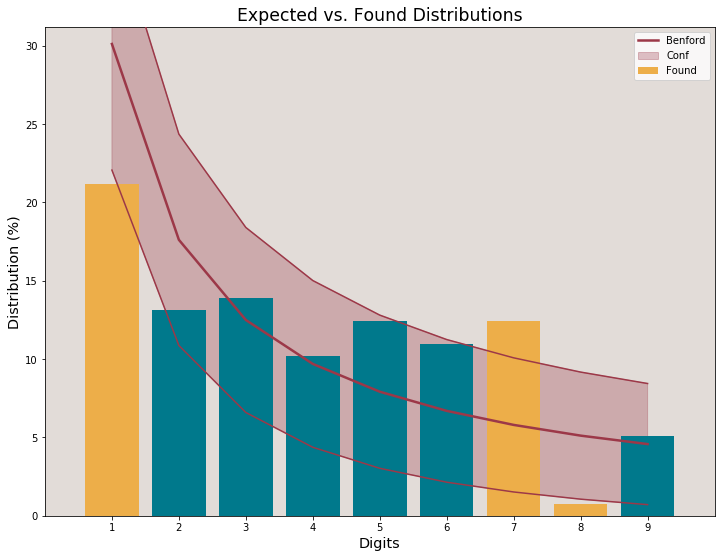



 #################  COUNTRY:  Uzbekistan  #################
 #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
First_2_Dig
10    0.043796
11    0.007299
12    0.021898
13    0.029197
14    0.029197
15    0.014599
16    0.007299
17    0.029197
18    0.014599
19    0.014599
20    0.000000
21    0.007299
22    0.014599
23    0.021898
24    0.014599
25    0.007299
26    0.029197
27    0.014599
28    0.000000
29    0.021898
30    0.021898
31    0.021898
32    0.021898
33    0.014599
34    0.000000
35    0.014599
36    0.007299
37    0.014599
38    0.014599
39    0.007299
40    0.007299
41    0.007299
42    0.021898
43    0.000000
44    0.007299
45    0.014599
46    0.014599
47    0.000000
48    0.014599
49    0.014599
50    0.007299
51    0.021898
52    0.000000
53    0.014599
54    0.014599
55    0.007299
56    0.021898
57    0.014599
58    0.014599
59    0.007299
60    0.0000

C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:652: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:656: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


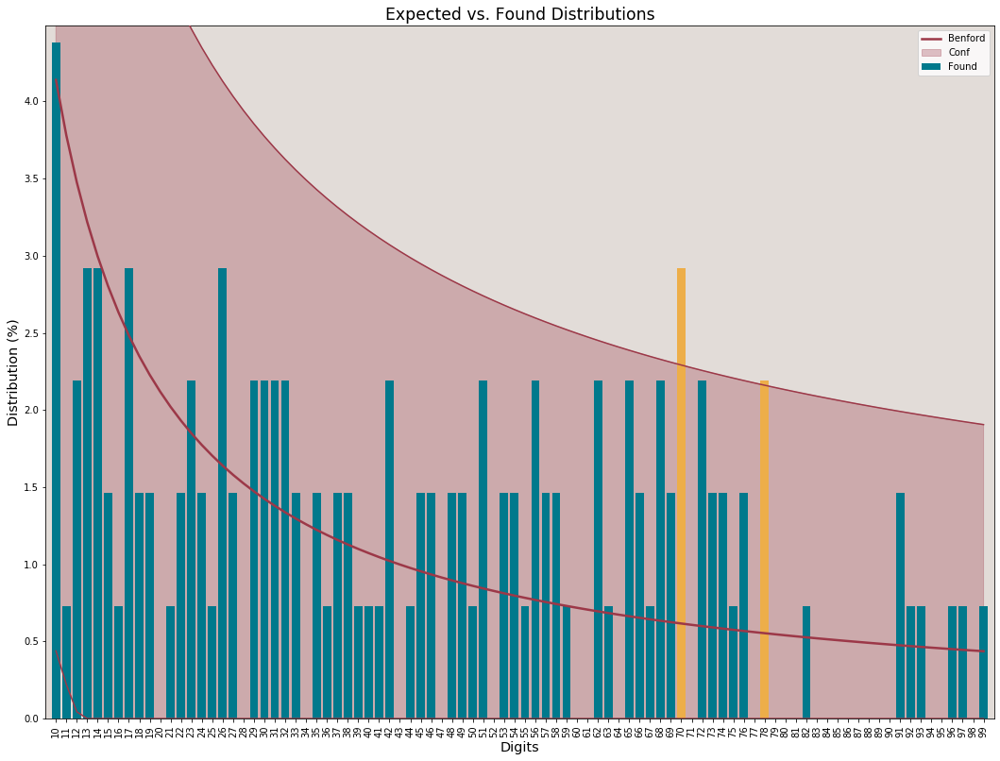



 #################  COUNTRY:  Uzbekistan  #################
 #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################

Initialized sequence with 137 registries.
Sec_Dig
0    0.109489
1    0.080292
2    0.138686
3    0.109489
4    0.080292
5    0.087591
6    0.116788
7    0.087591
8    0.102190
9    0.087591
Name: Found, dtype: float64

Test performed on 137 registries.
Discarded 0 records < 10 after preparation.

The entries with the significant positive deviations are:

Empty DataFrame
Columns: [Expected, Found, Z_score]
Index: []
Mean Absolute Deviation: 0.015130
MAD > 0.012000: Nonconformity.


The Chi-square statistic is 4.4599.
Critical Chi-square for this series: 16.919.

The Kolmogorov-Smirnov statistic is 0.0438.
Critical K-S for this series: 0.1162


C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:734: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)
C:\Users\j\AppData\Roaming\Python\Python37\site-packages\benford\benford.py:738: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  verbose=self.verbose)


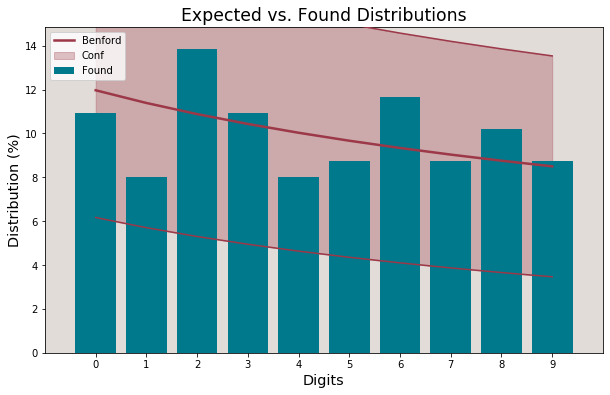

 ____________________________________________________________________________________________________________________

 
 



In [32]:
for i in covid_cases_country_list:
    print(" #################  COUNTRY: ", i ," #################")
    print(" #################  BENFORD'S FIRST DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################")
    covid_cases_test=covid_cases[covid_cases['country']==i].copy()
    first_digit_cases = bf.first_digits(covid_cases_test.cases, decimals=8, digs=1, show_plot=True,  MAD=True, MSE=True, confidence=95, KS=True, chi_square=True)
    print("\n")
    print(" #################  COUNTRY: ", i ," #################")
    print(" #################  BENFORD'S FIRST TWO DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################")
    first_two_digit_cases = bf.first_digits(covid_cases_test.cases, decimals=8, digs=2, show_plot=True,  MAD=True, MSE=True, confidence=95, KS=True, chi_square=True)
    print("\n")
    print(" #################  COUNTRY: ", i ," #################")
    print(" #################  BENFORD'S SECOND DIGIT ANALYSIS OF COVID-19 CASES DATASET AND CONFORMITY TESTS: #################")
    second_digit_cases = bf.second_digit(covid_cases_test.cases, decimals=8, show_plot=True,  MAD=True, MSE=True, confidence=95, KS=True, chi_square=True)
    print(" ____________________________________________________________________________________________________________________")
    print("\n","\n","\n")
 